# IMPORTS

In [2]:
from os import listdir,mkdir,makedirs
from os.path import isfile, join, isdir,exists
import pandas as pd
import numpy as np
from scipy import stats
import re
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from myplots import roundup, rounddown, find_decimal_fold, percentile_cut_off, rarefaction_calc, rarefaction_plot,draw_correlation_scatter
from matplotlib.ticker import FormatStrFormatter
import cPickle as pickle
from Bio.SeqUtils import GC
import seaborn as sns
import random
from scipy.stats import pearsonr,fisher_exact
from skbio.diversity.alpha import shannon, simpson, berger_parker_d

from pop_organize import get_sample_data, get_sample_with_dfs
from SufficientStatistics import *
from MyFunctionsShani import *
import math
from myplots import roundup, rounddown, find_decimal_fold
from skbio.stats.distance import mantel
from scipy.spatial.distance import braycurtis, pdist, euclidean


from GeneralFeaturePhenotypeInteractions.Feature_phenotype_functions import * 
from TCR_microbiome_interactions.TCR_microbiome_interactions_functions import *
from TCR_microbiome_interactions.TCR_microbiome_interactions_functions2 import *
from SampleLists.SampleFileFunctions import *
from PhenotypicData.PhenotypeGenerationFunctions import *
from CardioProject.CardioFunctions import *
from PredictionPipeline.PredictionFunctions import *
from TCR_feature_generation.SubsamplingFunctions import *

import os
from Utils import cacheOnDisk
from SegalQueue.qp import qp,fakeqp
from addloglevels import sethandlers

#ML imports:
from xgboost import XGBClassifier
import lightgbm as lgb
from collections import OrderedDict
from sklearn.model_selection import GroupKFold,StratifiedKFold, KFold
import statsmodels.formula.api as sm
from sklearn.linear_model import LogisticRegression
import shap
from sklearn import metrics, preprocessing
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel,SelectKBest,chi2,mutual_info_classif,f_classif
from sklearn.naive_bayes import GaussianNB

MyPath='/net/mraid08/export/genie/Lab/Personal/ShaniBAF'

done1
stop
stop
done1
stop
done
done
done
done
stop
stop
end of function!!!


/usr/wisdom/python/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


end of function!!!


In [3]:
import time
cdate=str(time.strftime("%d%m%Y"))
cdate

'06102018'

# ss5000 rep3

## function1 - subsample and find relevant phenotypes

In [ ]:
ss=5000
repeat=3
ssPNP=False #True/False. subsample only if not exist
ssCardio=False #True/False. subsample only if not exist
genTCRdfPNP=False #True/False. 
genTCRdfCardio=False #True/False. 


testPhenotypeAffectsOnsubsampledCohorts(ss,repeat,ssPNP,ssCardio,genTCRdfPNP,genTCRdfCardio)

In [ ]:
sharingMatrix_PNP530_ss5000_rep2_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed_binary

## function2 - generate matched cohorts and validate by comparing phenotypes
try to get as many samples as possible!

### prepare phenotype DFs:

*** replace all ss and rep information!!! make sure phenotype file is updated!***

In [ ]:
# get full phenotype DFs for PNP and Cardio:
f1='%s/TCR_real_data/NewPhenotypicData/newPhenotypesPNPAllInfo_withDummies.xlsx' %MyPath
PNP530_phen_new_dummies=pd.read_excel(f1).set_index('BD')

f2='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126phenAllInfo_withDummies.xlsx' %MyPath
Cardio126_phen_new_dummies=pd.read_excel(f2).set_index('BD')

#filter for ss5000 samples and save:
folder='%s/TCR_real_data/PNP530_SubSampled5000data_rep3/SamplesForAnalysis_corrected' %MyPath
PNP530ss5000rep3sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)

PNP530ss5000rep3_phen_new_dummies=PNP530_phen_new_dummies.loc[PNP530ss5000rep3sampleList,:]

f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss5000rep3_phen_new_dummies.xlsx' %MyPath
PNP530ss5000rep3_phen_new_dummies.to_excel(f3)


folder='%s/TCR_real_data/CardioSamples/Cardio126_SubSampled5000data_rep3/SamplesForAnalysis_corrected' %MyPath
Cardio126ss5000rep3sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)

Cardio126ss5000rep3_phen_new_dummies=Cardio126_phen_new_dummies.loc[Cardio126ss5000rep3sampleList,:]

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss5000rep3_phen_new_dummies.xlsx' %MyPath
Cardio126ss5000rep3_phen_new_dummies.to_excel(f4)


### run matching function-including relatives:

********** run several times to reach optimal matched cohorts, and then clean folder from unwanted sample lists and other stuff **********

**********use results for next function **************

In [ ]:
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss5000rep3_phen_new_dummies.xlsx' %MyPath
PNP530ss5000rep3_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss5000rep3_phen_new_dummies.xlsx' %MyPath
Cardio126ss5000rep3_phen_new_dummies=pd.read_excel(f4).set_index('BD')

phenotypeList=[('Gender_Male','identity',None,True),('Age','delta',7,True),('HbA1C','delta',1.2,True),
               ('Smoking Status_Yes','identity',None,True),('Glucose','delta',20,False),('BMI','delta',None,False),('Total Cholesterol','delta',None,False),
              ('Smoking Status_Past','identity',None,False)]
columnsToUse=[x[0] for x in phenotypeList]
restrictedPhenotypes=[x[0] for x in phenotypeList if x[3]==True]
numericalPhenotypes=[x[0] for x in phenotypeList if x[1]=='delta']
print 'restricted phenotypes=%s' %restrictedPhenotypes
print 'numericalPhenotypes=%s' %numericalPhenotypes

cohort1phenotypeDF=Cardio126ss5000rep3_phen_new_dummies
cohort1name='Cardio126ss5000rep3'
cohort2phenotypeDF=PNP530ss5000rep3_phen_new_dummies
cohort2name='PNP530ss5000rep3'

# cohort1phenotypeDF=Cardio126ss5000rep3_phen_new_dummies
# cohort1name='Cardio126ss5000rep3_matchedToRelRemoved'
# cohort2phenotypeDF=PNP530ss5000rep3_phen_new_dummies
# cohort2phenotypeDF=removeRelatives(cohort2phenotypeDF) ######### removing samples with relatives!
# cohort2name='PNP530ss5000rep3_relRemoved'



folderToSaveLists='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep3' %MyPath
random_state=9
        
# for random_state in range(7,10):
#     if random_state!=6:
print '*******************random state = %s' %random_state

matchedCardio5000samples,matchedPNP5000samples=gen_matched_cohorts_by_phenotypes(cohort1phenotypeDF,cohort1name,
    cohort2phenotypeDF,cohort2name,phenotypeList, columnsToUse,restrictedPhenotypes,folderToSaveLists,random_state)

    #phenotypeList is a list of tuples, in each tuple the first item is the phenotype name (string)the second is the conditionType-'identity' or 'delta',
#the third is the delta (int) or None and the forth is isStopingCrit (True/False)

In [ ]:
# compare all phenotypes for the generated cohort:

PNPListFile='%s/PNP530ss5000rep3_samples_matchedTo_Cardio126ss5000rep3_n72_resByGenderMaleAgeHbA1CSmoking StatusYes_rs9' %datasetFolder
with open(PNPListFile,'rb') as fp:
    PNPmatchedSampleList=pickle.load(fp)

CardioListFile='%s/Cardio126ss5000rep3_samples_matchedTo_PNP530ss5000rep3_n72_resByGenderMaleAgeHbA1CSmoking StatusYes_rs9' %datasetFolder
with open(CardioListFile,'rb') as fp:
    CardioMatchedSampleList=pickle.load(fp)
    
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss5000rep3_phen_new_dummies.xlsx' %MyPath
PNP530ss5000rep3_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss5000rep3_phen_new_dummies.xlsx' %MyPath
Cardio126ss5000rep3_phen_new_dummies=pd.read_excel(f4).set_index('BD')
    
numericalphenotypes=['Age','BMI','Glucose','HbA1C','Hemoglobin','WBC','AST','HDL','Total Cholesterol','eGFR by CKD-EPI']
categoricalphenotypes=['Gender','Smoking Status']
nBins=20
phenotypeDF1=PNP530ss5000rep3_phen_new_dummies
sampleList1=PNPmatchedSampleList
sampleListName1='PNPmatchedtoCardio'
datasetName1='PNP530ss5000rep3Matched'
phenotypeDF2=Cardio126ss5000rep3_phen_new_dummies
sampleList2=CardioMatchedSampleList
sampleListName2='CardiomatchedtoPNP'
datasetName2='Cardioss5000rep3Matched'


compare_phenotypes(numericalphenotypes, categoricalphenotypes, nBins, phenotypeDF1, sampleList1, sampleListName1,
                   datasetName1,phenotypeDF2, sampleList2, sampleListName2,datasetName2)



### run matching function-not including relatives:

********** run several times to reach optimal matched cohorts, and then clean folder from unwanted sample lists and other stuff **********

**********use results for next function **************

In [ ]:
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss5000rep3_phen_new_dummies.xlsx' %MyPath
PNP530ss5000rep3_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss5000rep3_phen_new_dummies.xlsx' %MyPath
Cardio126ss5000rep3_phen_new_dummies=pd.read_excel(f4).set_index('BD')

phenotypeList=[('Gender_Male','identity',None,True),('Age','delta',7,True),('HbA1C','delta',1.2,True),
               ('Smoking Status_Yes','identity',None,True),('Glucose','delta',20,False),('BMI','delta',None,False),('Total Cholesterol','delta',None,False),
              ('Smoking Status_Past','identity',None,False)]
columnsToUse=[x[0] for x in phenotypeList]
restrictedPhenotypes=[x[0] for x in phenotypeList if x[3]==True]
numericalPhenotypes=[x[0] for x in phenotypeList if x[1]=='delta']
print 'restricted phenotypes=%s' %restrictedPhenotypes
print 'numericalPhenotypes=%s' %numericalPhenotypes

# cohort1phenotypeDF=Cardio126ss5000rep3_phen_new_dummies
# cohort1name='Cardio126ss5000rep3'
# cohort2phenotypeDF=PNP530ss5000rep3_phen_new_dummies
# cohort2name='PNP530ss5000rep3'

cohort1phenotypeDF=Cardio126ss5000rep3_phen_new_dummies
cohort1name='Cardio126ss5000rep3_matchedToRelRemoved'
cohort2phenotypeDF=PNP530ss5000rep3_phen_new_dummies
cohort2phenotypeDF=removeRelatives(cohort2phenotypeDF) ######### removing samples with relatives!
cohort2name='PNP530ss5000rep3_relRemoved'



folderToSaveLists='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep3' %MyPath
random_state=4
        
# for random_state in range(7,10):
#     if random_state!=6:
print '*******************random state = %s' %random_state

matchedCardio5000samples,matchedPNP5000samples=gen_matched_cohorts_by_phenotypes(cohort1phenotypeDF,cohort1name,
    cohort2phenotypeDF,cohort2name,phenotypeList, columnsToUse,restrictedPhenotypes,folderToSaveLists,random_state)

    #phenotypeList is a list of tuples, in each tuple the first item is the phenotype name (string)the second is the conditionType-'identity' or 'delta',
#the third is the delta (int) or None and the forth is isStopingCrit (True/False)

## function 3- copying files, comparing TCR features, sequences and sequence sharing patterns

****** change below thesample list file namesaccording to the results of the former function results *********

****** play with percSharedCom, identityColumnForPie ******** 

******* investigate all result files and figures *********

In [ ]:
sharingMatrix_MatchedSamples_ss5000rep3_minNshared2_RA_onlyProductiveTrue___OLtrimmed_binary

### run for 'including relatives'

In [ ]:
ss=5000
repeat=3

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)

PNPListFile='%s/PNP530ss5000rep3_samples_matchedTo_Cardio126ss5000rep3_n72_resByGenderMaleAgeHbA1CSmoking StatusYes_rs9' %datasetFolder
with open(PNPListFile,'rb') as fp:
    PNPmatchedSampleList=pickle.load(fp)

CardioListFile='%s/Cardio126ss5000rep3_samples_matchedTo_PNP530ss5000rep3_n72_resByGenderMaleAgeHbA1CSmoking StatusYes_rs9' %datasetFolder
with open(CardioListFile,'rb') as fp:
    CardioMatchedSampleList=pickle.load(fp)
    
delFolderFirst=False
copySamples=False

compareFeatures=False

genOrigComTCRdf=False
genComTCRdf=False
n_comp=10
percSharedCom=None

compareSharing=True
genSepTCRdf=True
nSharedMin=1
identityFile='%s/TCR CDR3 sequence databases/combined annotation_list_clean_popped.xlsx' %MyPath
identityDF=pd.read_excel(identityFile)
identityDFname='popped'
identityColumnForPie='combined annotation_list_clean' #'Epitopespecies_VDJDB'/'Pathology_McPAS'
ThresholdToOther=0.04
dropnaFromIdentitiesPie=False
RemoveSamplesWithRelative=False

FeatureMeanSummary_all_dataSets=compareTCRforMatchedCohorts(ss,repeat,PNPmatchedSampleList,CardioMatchedSampleList,
                            copySamples,compareFeatures,compareSharing, genSepTCRdf,nSharedMin,delFolderFirst,
                            genOrigComTCRdf,genComTCRdf,n_comp,percSharedCom,identityColumnForPie,dropnaFromIdentitiesPie,
                            ThresholdToOther,identityDF,identityDFname,RemoveSamplesWithRelative)



### run for not-including relatives

In [ ]:
ss=5000
repeat=3

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)

PNPListFile='%s/PNP530ss5000rep3_relRemoved_samples_matchedTo_Cardio126ss5000rep3_matchedToRelRemoved_n61_resByGenderMaleAgeHbA1CSmoking StatusYes_rs4' %datasetFolder
with open(PNPListFile,'rb') as fp:
    PNPmatchedSampleList=pickle.load(fp)

CardioListFile='%s/Cardio126ss5000rep3_matchedToRelRemoved_samples_matchedTo_PNP530ss5000rep3_relRemoved_n61_resByGenderMaleAgeHbA1CSmoking StatusYes_rs4' %datasetFolder
with open(CardioListFile,'rb') as fp:
    CardioMatchedSampleList=pickle.load(fp)
    
delFolderFirst=True
copySamples=True

compareFeatures=True

genOrigComTCRdf=True
genComTCRdf=True
n_comp=10
percSharedCom=10

compareSharing=True
genSepTCRdf=True
nSharedMin=1
identityFile='%s/TCR CDR3 sequence databases/combined annotation_list_clean_popped.xlsx' %MyPath
identityDF=pd.read_excel(identityFile)
identityDFname='popped'
identityColumnForPie='combined annotation_list_clean' #'Epitopespecies_VDJDB'/'Pathology_McPAS'
ThresholdToOther=0.04
dropnaFromIdentitiesPie=False
RemoveSamplesWithRelative='done'

FeatureMeanSummary_all_dataSets=compareTCRforMatchedCohorts(ss,repeat,PNPmatchedSampleList,CardioMatchedSampleList,
                            copySamples,compareFeatures,compareSharing, genSepTCRdf,nSharedMin,delFolderFirst,
                            genOrigComTCRdf,genComTCRdf,n_comp,percSharedCom,identityColumnForPie,dropnaFromIdentitiesPie,
                            ThresholdToOther,identityDF,identityDFname,RemoveSamplesWithRelative)



## clean featureDF - remove nanas, constant and fully correlated

1. take feature DF of the relevant ss and repeat
2. run remove correlated
3. explore file
4. delete constant
5. fillna
6. save to file

In [ ]:
the function process_featureDF was copied to  TCR_feature_generation.py

In [ ]:
#generate and load relevant feature DF:
ss=5000
repeat=3

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
sampleListName=datasetName


TCRfeatureDF_matched=gen_featureDF_for_MatchedCohorts(ss,repeat,sampleList,sampleListName)

In [ ]:
#process feature df:
corrThreshold=1
featureDFfile='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/featureSummaryDFs\
/MatchedSamples_ss%srep%s_MatchedSamples_ss%srep%s_allFeatures' %(MyPath,ss,repeat,ss,repeat,ss,repeat)
featureDF=pd.read_pickle(featureDFfile)
featureDF,featureDFnameAddition=process_featureDF(featureDF,corrThreshold)

In [ ]:
newfeatureDFfilePickle=featureDFfile+'_'+featureDFnameAddition
featureDF.to_pickle(newfeatureDFfilePickle)

newfeatureDFfileExcel=featureDFfile+'_'+featureDFnameAddition+'.xlsx'
featureDF.to_excel(newfeatureDFfileExcel)

## predictions:

### get DFs:

In [ ]:
ss=5000
repeat=3
datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
percShared=10
print datasetName


# phenotype df:
print 'getting phenotypeDF...'
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss%s_phen_new_dummies.xlsx' %(MyPath,ss)
PNP_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss%s_phen_new_dummies.xlsx' %(MyPath,ss)
Cardio_phen_new_dummies=pd.read_excel(f4).set_index('BD')

all_phen_new_dummies=pd.concat([PNP_phen_new_dummies,Cardio_phen_new_dummies])
matchedSamples_phen_new_dummies=all_phen_new_dummies.loc[sampleList,:]
print 'phenotype DF shape is %s_%s' %(matchedSamples_phen_new_dummies.shape[0],matchedSamples_phen_new_dummies.shape[1])
print matchedSamples_phen_new_dummies.iloc[:20,:4]
# print all_phen_new_dummies.tail()

#TCRdf:
print 'getting TCRdf...'

sharingFolder='%s/%s_sharingAnalysis' %(datasetFolder,datasetName)
TCRdfName='sharingMatrix_MatchedSamples_ss%srep%s_minNshared2_RA_onlyProductiveTrue__percShared%s_OLtrimmed\
_binary' %(ss,repeat, percShared) 
TCRdfFile='%s/%s' %(sharingFolder,TCRdfName )
print TCRdfFile
TCRdf=pd.read_pickle(TCRdfFile)
print 'TCRdf shape is %s_%s' %(TCRdf.shape[0],TCRdf.shape[1])
print TCRdf.iloc[:4,:4]

#Features
print 'getting TCRfeatureDF - wihtout highlt correlated columns...'
featureFilePickle2='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/featureSummaryDFs\
/MatchedSamples_ss%srep%s_MatchedSamples_ss%srep%s_allFeatures__noCorr_noConsts_nanFilled' %(MyPath,ss,repeat,ss,repeat,ss,repeat)
TCRfeatureDF2=pd.read_pickle(featureFilePickle2)
print 'TCRfeatureDF shape is %s_%s' %(TCRfeatureDF2.shape[0],TCRfeatureDF2.shape[1])
TCRfeatureDF2.iloc[:4,:4]


# ss5000 rep4

## function1 - subsample and find relevant phenotypes

********subsampling PNP530 cohort with %s sequences per sample:***********
step 1: subsampling (long)
number of samples in folder is 530
0 BD406
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 10619
nTemplates in sample is 11632
l list length is 11632 and should be equal to nTemplates
cumsum list length is 10619 and should be equal to n Unique
length of popped nucleotide dataframe is 11632 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
1 BD228
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 16753
nTemplates in sample is 18964
l list length is 18964 and should be equal to nTemplates
cumsum list length is 16753 and should be equal to n Unique


/usr/wisdom/python/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (10,25) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


length of popped nucleotide dataframe is 18964 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
2 BD714_2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13440
nTemplates in sample is 19792
l list length is 19792 and should be equal to nTemplates
cumsum list length is 13440 and should be equal to n Unique
length of popped nucleotide dataframe is 19792 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
3 BD808
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 24879
nTemplates in sample is 32120
l list length is 32120 and should be equal to nTemplates
cumsum list length is 24879 and should be equal to n Unique
length of popped nucleotide dataframe is 32120 and should be equal to nTemplates

/usr/wisdom/python/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


generating a popped nucleotide sequenes:...
n Unique sequences in sample is 19536
nTemplates in sample is 28033
l list length is 28033 and should be equal to nTemplates
cumsum list length is 19536 and should be equal to n Unique
length of popped nucleotide dataframe is 28033 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
11 BD801
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 16524
nTemplates in sample is 20796
l list length is 20796 and should be equal to nTemplates
cumsum list length is 16524 and should be equal to n Unique


/usr/wisdom/python/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (10,11,25) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


length of popped nucleotide dataframe is 20796 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
12 BD473
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 9397
nTemplates in sample is 11122
l list length is 11122 and should be equal to nTemplates
cumsum list length is 9397 and should be equal to n Unique
length of popped nucleotide dataframe is 11122 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
13 BD12
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 18592
nTemplates in sample is 22733
l list length is 22733 and should be equal to nTemplates
cumsum list length is 18592 and should be equal to n Unique
length of popped nucleotide dataframe is 22733 and should be equal to nTemplates
su

/usr/wisdom/python/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


generating a popped nucleotide sequenes:...
n Unique sequences in sample is 18836
nTemplates in sample is 31013
l list length is 31013 and should be equal to nTemplates
cumsum list length is 18836 and should be equal to n Unique
length of popped nucleotide dataframe is 31013 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
18 BD925
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 8305
nTemplates in sample is 12238
l list length is 12238 and should be equal to nTemplates
cumsum list length is 8305 and should be equal to n Unique
length of popped nucleotide dataframe is 12238 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
19 BD682_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 1604

generating a popped nucleotide sequenes:...
n Unique sequences in sample is 11611
nTemplates in sample is 13918
l list length is 13918 and should be equal to nTemplates
cumsum list length is 11611 and should be equal to n Unique
length of popped nucleotide dataframe is 13918 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
36 BD441
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13191
nTemplates in sample is 15401
l list length is 15401 and should be equal to nTemplates
cumsum list length is 13191 and should be equal to n Unique
length of popped nucleotide dataframe is 15401 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
37 BD833
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 1676

generating a popped nucleotide sequenes:...
n Unique sequences in sample is 29888
nTemplates in sample is 35381
l list length is 35381 and should be equal to nTemplates
cumsum list length is 29888 and should be equal to n Unique
length of popped nucleotide dataframe is 35381 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
54 BD146_322939_2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 78312
nTemplates in sample is 99891
l list length is 99891 and should be equal to nTemplates
cumsum list length is 78312 and should be equal to n Unique
length of popped nucleotide dataframe is 99891 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
55 BD897
generating a popped nucleotide sequenes:...
n Unique sequences in sampl

generating a popped nucleotide sequenes:...
n Unique sequences in sample is 24295
nTemplates in sample is 30013
l list length is 30013 and should be equal to nTemplates
cumsum list length is 24295 and should be equal to n Unique
length of popped nucleotide dataframe is 30013 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
72 BD422
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 15893
nTemplates in sample is 17719
l list length is 17719 and should be equal to nTemplates
cumsum list length is 15893 and should be equal to n Unique
length of popped nucleotide dataframe is 17719 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
73 BD354
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 1398

generating a popped nucleotide sequenes:...
n Unique sequences in sample is 24302
nTemplates in sample is 26813
l list length is 26813 and should be equal to nTemplates
cumsum list length is 24302 and should be equal to n Unique
length of popped nucleotide dataframe is 26813 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
91 BD321
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 7319
nTemplates in sample is 8089
l list length is 8089 and should be equal to nTemplates
cumsum list length is 7319 and should be equal to n Unique
length of popped nucleotide dataframe is 8089 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
92 BD901
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 22445
nTe

108 BD419
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 18216
nTemplates in sample is 21895
l list length is 21895 and should be equal to nTemplates
cumsum list length is 18216 and should be equal to n Unique
length of popped nucleotide dataframe is 21895 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
109 BD465
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 11039
nTemplates in sample is 13094
l list length is 13094 and should be equal to nTemplates
cumsum list length is 11039 and should be equal to n Unique
length of popped nucleotide dataframe is 13094 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
110 BD664_1
generating a popped nucleotide sequenes:...
n Unique sequences in 

/usr/wisdom/python/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (10,12) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


length of popped nucleotide dataframe is 23882 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
121 BD645_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 12891
nTemplates in sample is 17717
l list length is 17717 and should be equal to nTemplates
cumsum list length is 12891 and should be equal to n Unique
length of popped nucleotide dataframe is 17717 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
122 BD368
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 14951
nTemplates in sample is 18570
l list length is 18570 and should be equal to nTemplates
cumsum list length is 14951 and should be equal to n Unique
length of popped nucleotide dataframe is 18570 and should be equal to nTempl

139 BD533
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 10438
nTemplates in sample is 19657
l list length is 19657 and should be equal to nTemplates
cumsum list length is 10438 and should be equal to n Unique
length of popped nucleotide dataframe is 19657 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
140 BD941
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 16916
nTemplates in sample is 20970
l list length is 20970 and should be equal to nTemplates
cumsum list length is 16916 and should be equal to n Unique
length of popped nucleotide dataframe is 20970 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
141 BD245
generating a popped nucleotide sequenes:...
n Unique sequences in sa

157 BD392
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13222
nTemplates in sample is 17004
l list length is 17004 and should be equal to nTemplates
cumsum list length is 13222 and should be equal to n Unique
length of popped nucleotide dataframe is 17004 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
158 BD160_322939_2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 42217
nTemplates in sample is 54823
l list length is 54823 and should be equal to nTemplates
cumsum list length is 42217 and should be equal to n Unique
length of popped nucleotide dataframe is 54823 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
159 BD107_1rep
generating a popped nucleotide sequenes:...
n Unique s

templates sum in subsampled file is 5000 and should be equal to 5000
175 BD564
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 14147
nTemplates in sample is 18163
l list length is 18163 and should be equal to nTemplates
cumsum list length is 14147 and should be equal to n Unique
length of popped nucleotide dataframe is 18163 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
176 BD491
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 8149
nTemplates in sample is 8764
l list length is 8764 and should be equal to nTemplates
cumsum list length is 8149 and should be equal to n Unique
length of popped nucleotide dataframe is 8764 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
177 BD440
gene

193 BD128_1rep
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 26452
nTemplates in sample is 34681
l list length is 34681 and should be equal to nTemplates
cumsum list length is 26452 and should be equal to n Unique
length of popped nucleotide dataframe is 34681 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
194 BD149_322939_2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 17597
nTemplates in sample is 24490
l list length is 24490 and should be equal to nTemplates
cumsum list length is 17597 and should be equal to n Unique
length of popped nucleotide dataframe is 24490 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
195 BD378
generating a popped nucleotide sequenes:...
n Unique s

/usr/wisdom/python/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (10,12,25) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


generating a popped nucleotide sequenes:...
n Unique sequences in sample is 16614
nTemplates in sample is 19584
l list length is 19584 and should be equal to nTemplates
cumsum list length is 16614 and should be equal to n Unique
length of popped nucleotide dataframe is 19584 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
197 BD924
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 30326
nTemplates in sample is 41399
l list length is 41399 and should be equal to nTemplates
cumsum list length is 30326 and should be equal to n Unique
length of popped nucleotide dataframe is 41399 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
198 BD524
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 12

214 BD238
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13402
nTemplates in sample is 15700
l list length is 15700 and should be equal to nTemplates
cumsum list length is 13402 and should be equal to n Unique
length of popped nucleotide dataframe is 15700 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
215 BD416
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 17448
nTemplates in sample is 19957
l list length is 19957 and should be equal to nTemplates
cumsum list length is 17448 and should be equal to n Unique
length of popped nucleotide dataframe is 19957 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
216 BD940
generating a popped nucleotide sequenes:...
n Unique sequences in sa

232 BD579_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 6534
nTemplates in sample is 13284
l list length is 13284 and should be equal to nTemplates
cumsum list length is 6534 and should be equal to n Unique
length of popped nucleotide dataframe is 13284 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
233 BD463
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 9337
nTemplates in sample is 10259
l list length is 10259 and should be equal to nTemplates
cumsum list length is 9337 and should be equal to n Unique
length of popped nucleotide dataframe is 10259 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
234 BD811
generating a popped nucleotide sequenes:...
n Unique sequences in samp

templates sum in subsampled file is 5000 and should be equal to 5000
250 BD628_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 9270
nTemplates in sample is 11987
l list length is 11987 and should be equal to nTemplates
cumsum list length is 9270 and should be equal to n Unique
length of popped nucleotide dataframe is 11987 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
251 BD797
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 14443
nTemplates in sample is 28869
l list length is 28869 and should be equal to nTemplates
cumsum list length is 14443 and should be equal to n Unique
length of popped nucleotide dataframe is 28869 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
252 BD823

268 BD424
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 11819
nTemplates in sample is 17230
l list length is 17230 and should be equal to nTemplates
cumsum list length is 11819 and should be equal to n Unique
length of popped nucleotide dataframe is 17230 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
269 BD856
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 25580
nTemplates in sample is 30774
l list length is 30774 and should be equal to nTemplates
cumsum list length is 25580 and should be equal to n Unique
length of popped nucleotide dataframe is 30774 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
270 BD352
generating a popped nucleotide sequenes:...
n Unique sequences in sa

286 BD938
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 11898
nTemplates in sample is 16123
l list length is 16123 and should be equal to nTemplates
cumsum list length is 11898 and should be equal to n Unique
length of popped nucleotide dataframe is 16123 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
287 BD717_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 8887
nTemplates in sample is 12617
l list length is 12617 and should be equal to nTemplates
cumsum list length is 8887 and should be equal to n Unique
length of popped nucleotide dataframe is 12617 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
288 BD785_1
generating a popped nucleotide sequenes:...
n Unique sequences in 

304 BD538
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 12373
nTemplates in sample is 14499
l list length is 14499 and should be equal to nTemplates
cumsum list length is 12373 and should be equal to n Unique
length of popped nucleotide dataframe is 14499 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
305 BD316
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 12243
nTemplates in sample is 14638
l list length is 14638 and should be equal to nTemplates
cumsum list length is 12243 and should be equal to n Unique
length of popped nucleotide dataframe is 14638 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
306 BD789_1
generating a popped nucleotide sequenes:...
n Unique sequences in 

323 BD429
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 10617
nTemplates in sample is 14233
l list length is 14233 and should be equal to nTemplates
cumsum list length is 10617 and should be equal to n Unique
length of popped nucleotide dataframe is 14233 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
324 BD113_1rep
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 30225
nTemplates in sample is 59070
l list length is 59070 and should be equal to nTemplates
cumsum list length is 30225 and should be equal to n Unique
length of popped nucleotide dataframe is 59070 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
325 BD124_322939_2
generating a popped nucleotide sequenes:...
n Unique s

/usr/wisdom/python/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (10,11,12,25) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


generating a popped nucleotide sequenes:...
n Unique sequences in sample is 16478
nTemplates in sample is 19465
l list length is 19465 and should be equal to nTemplates
cumsum list length is 16478 and should be equal to n Unique
length of popped nucleotide dataframe is 19465 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
332 BD794
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 22324
nTemplates in sample is 36156
l list length is 36156 and should be equal to nTemplates
cumsum list length is 22324 and should be equal to n Unique
length of popped nucleotide dataframe is 36156 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
333 BD483
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 10

349 BD351
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 12269
nTemplates in sample is 13976
l list length is 13976 and should be equal to nTemplates
cumsum list length is 12269 and should be equal to n Unique
length of popped nucleotide dataframe is 13976 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
350 BD640_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 4907
nTemplates in sample is 7889
l list length is 7889 and should be equal to nTemplates
cumsum list length is 4907 and should be equal to n Unique
length of popped nucleotide dataframe is 7889 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
351 BD884
generating a popped nucleotide sequenes:...
n Unique sequences in sampl

367 BD349
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13931
nTemplates in sample is 18455
l list length is 18455 and should be equal to nTemplates
cumsum list length is 13931 and should be equal to n Unique
length of popped nucleotide dataframe is 18455 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
368 BD398
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 7250
nTemplates in sample is 12205
l list length is 12205 and should be equal to nTemplates
cumsum list length is 7250 and should be equal to n Unique
length of popped nucleotide dataframe is 12205 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
369 BD567
generating a popped nucleotide sequenes:...
n Unique sequences in samp

templates sum in subsampled file is 5000 and should be equal to 5000
385 BD788_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 15025
nTemplates in sample is 24857
l list length is 24857 and should be equal to nTemplates
cumsum list length is 15025 and should be equal to n Unique
length of popped nucleotide dataframe is 24857 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
386 BD803
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 23422
nTemplates in sample is 31081
l list length is 31081 and should be equal to nTemplates
cumsum list length is 23422 and should be equal to n Unique
length of popped nucleotide dataframe is 31081 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
387 BD1

generating a popped nucleotide sequenes:...
n Unique sequences in sample is 9777
nTemplates in sample is 14622
l list length is 14622 and should be equal to nTemplates
cumsum list length is 9777 and should be equal to n Unique
length of popped nucleotide dataframe is 14622 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
404 BD19
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 24516
nTemplates in sample is 37742
l list length is 37742 and should be equal to nTemplates
cumsum list length is 24516 and should be equal to n Unique
length of popped nucleotide dataframe is 37742 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
405 BD520
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 9037


421 BD421
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 21757
nTemplates in sample is 24805
l list length is 24805 and should be equal to nTemplates
cumsum list length is 21757 and should be equal to n Unique
length of popped nucleotide dataframe is 24805 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
422 BD150_322939_2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 22136
nTemplates in sample is 30125
l list length is 30125 and should be equal to nTemplates
cumsum list length is 22136 and should be equal to n Unique
length of popped nucleotide dataframe is 30125 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
423 BD679_1
generating a popped nucleotide sequenes:...
n Unique sequ

439 BD49
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 34151
nTemplates in sample is 45330
l list length is 45330 and should be equal to nTemplates
cumsum list length is 34151 and should be equal to n Unique
length of popped nucleotide dataframe is 45330 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
440 BD570_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 11857
nTemplates in sample is 21308
l list length is 21308 and should be equal to nTemplates
cumsum list length is 11857 and should be equal to n Unique
length of popped nucleotide dataframe is 21308 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
441 BD902
generating a popped nucleotide sequenes:...
n Unique sequences in s

457 BD868
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 21553
nTemplates in sample is 29426
l list length is 29426 and should be equal to nTemplates
cumsum list length is 21553 and should be equal to n Unique
length of popped nucleotide dataframe is 29426 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
458 BD771
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 9324
nTemplates in sample is 11993
l list length is 11993 and should be equal to nTemplates
cumsum list length is 9324 and should be equal to n Unique
length of popped nucleotide dataframe is 11993 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
459 BD362
generating a popped nucleotide sequenes:...
n Unique sequences in samp

generating a popped nucleotide sequenes:...
n Unique sequences in sample is 9175
nTemplates in sample is 11961
l list length is 11961 and should be equal to nTemplates
cumsum list length is 9175 and should be equal to n Unique
length of popped nucleotide dataframe is 11961 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
477 BD157_322939_2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 24466
nTemplates in sample is 34839
l list length is 34839 and should be equal to nTemplates
cumsum list length is 24466 and should be equal to n Unique
length of popped nucleotide dataframe is 34839 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
478 BD877
generating a popped nucleotide sequenes:...
n Unique sequences in sampl

templates sum in subsampled file is 5000 and should be equal to 5000
494 BD16
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 24647
nTemplates in sample is 31005
l list length is 31005 and should be equal to nTemplates
cumsum list length is 24647 and should be equal to n Unique
length of popped nucleotide dataframe is 31005 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
495 BD802
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13298
nTemplates in sample is 17136
l list length is 17136 and should be equal to nTemplates
cumsum list length is 13298 and should be equal to n Unique
length of popped nucleotide dataframe is 17136 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
496 BD11
g

512 BD366_2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13502
nTemplates in sample is 15792
l list length is 15792 and should be equal to nTemplates
cumsum list length is 13502 and should be equal to n Unique
length of popped nucleotide dataframe is 15792 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
513 BD334
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13956
nTemplates in sample is 19281
l list length is 19281 and should be equal to nTemplates
cumsum list length is 13956 and should be equal to n Unique
length of popped nucleotide dataframe is 19281 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
514 BD596_1
generating a popped nucleotide sequenes:...
n Unique sequences i

step 2: feature extraction (long)
number of samples for feature extraction is 527
0 BD503_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...


/home/sbenari/workspace/Microbiome/ShaniBA/TCR_feature_generation/TCR_feature_generation_functions.py:212: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  DF['clonality_nt'] = DF['frequencyCount (%)'] / DF['frequencyCount (%)'].sum()


calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...


/home/sbenari/workspace/Microbiome/ShaniBA/TCR_feature_generation/TCR_feature_generation_functions.py:354: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  DF['V-J family combination'] = DF['vFamilyName'] + '_' + DF['jFamilyName']
/home/sbenari/workspace/Microbiome/ShaniBA/TCR_feature_generation/TCR_feature_generation_functions.py:355: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  DF['D-J gene combination'] = DF['dFamilyName'] + '_' + DF['jGeneName']


calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
1 BD860_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
6 BD640_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
11 BD633_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
16 BD696_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
21 BD597_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
26 BD943_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
31 BD914_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
36 BD793_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
41 BD840_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
46 BD7_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...


calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
51 BD106_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
56 BD389_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
61 BD697_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
66 BD877_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
71 BD891_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
76 BD913_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
81 BD729_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
86 BD868_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
91 BD903_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
96 BD605_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
101 BD857_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
106 BD381_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
111 BD367_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
116 BD151_322939_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
121 BD848_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
126 BD391_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating ge

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
131 BD377_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating ge

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
136 BD411_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
141 BD371_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
146 BD397_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
151 BD339_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
156 BD387_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
161 BD887_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
166 BD600_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
171 BD782_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
176 BD673_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
181 BD897_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
186 BD225_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
191 BD545_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating ge

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
196 BD199_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
201 BD409_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
206 BD932_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
211 BD112_322939_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
216 BD416_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
221 BD376_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
226 BD811_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
231 BD429_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums f

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
236 BD769_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
241 BD79_322939_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality f

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
246 BD317_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
251 BD880_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
256 BD636_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
261 BD620_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
266 BD276_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
271 BD911_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
276 BD425_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
281 BD727_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
286 BD606_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
291 BD18_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
296 BD435_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums f

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
301 BD28_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
306 BD445_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
311 BD698_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
316 BD70_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
321 BD921_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
326 BD161_322939_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
331 BD835_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
336 BD909_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
341 BD689_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
346 BD549_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
351 BD195_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
356 BD153_322939_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
361 BD730_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
366 BD30_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
371 BD717_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
376 BD701_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
381 BD362_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
386 BD682_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
391 BD130_322939_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
396 BD612_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
401 BD677_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
406 BD3_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums fea

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
411 BD392_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
416 BD374_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
421 BD137_322939_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
426 BD910_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
431 BD798_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
436 BD948_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
441 BD16_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating gen

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
446 BD434_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
451 BD507_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating ge

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
456 BD577_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
461 BD708_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
466 BD702_2_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating 

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
471 BD570_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
476 BD622_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
481 BD657_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
486 BD937_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating ge

calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
491 BD608_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
496 BD11_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating gen

counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
501 BD655_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums f

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
506 BD500_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating ge

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
511 BD343_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating ge

calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
516 BD547_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd


calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
521 BD228_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating ge

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
526 BD766_1_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating 

/home/sbenari/workspace/Microbiome/ShaniBA/MyFunctionsShani.py:43: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  df_all=pd.concat(df_list)


dFamilyName
number of dfs in directory: 527
the length of df list is 527
jGeneName
number of dfs in directory: 527
the length of df list is 527
D-J gene combination
number of dfs in directory: 527
the length of df list is 527
GeneralFeatures
number of dfs in directory: 527
the length of df list is 527
vGeneName
number of dfs in directory: 527
the length of df list is 527
LengthFeaturesAndMore
number of dfs in directory: 527
the length of df list is 527
DiversityFeatures
number of dfs in directory: 527
the length of df list is 527
vFamilyName
number of dfs in directory: 527
the length of df list is 527
df type
df type
df type
df type
df type
df type_x    Total
df type_x    Total
df type_x    Total
df type_x    Total
df type_x    Total
df type_y    Total
df type_y    Total
df type_y    Total
df type_y    Total
df type_y    Total
Name: BD340_5000, dtype: object
n columns in merged df is 250
n columns in merged df after drop is 237
Prod
ClonalityFeatures
number of dfs in directory: 527
the

/usr/wisdom/python/lib/python2.7/site-packages/numpy/core/fromnumeric.py:3194: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/usr/wisdom/python/lib/python2.7/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/wisdom/python/lib/python2.7/site-packages/scipy/stats/stats.py:4774: RuntimeWarning: invalid value encountered in true_divide
  cdf1 = np.searchsorted(data1, data_all, side='right') / (1.0*n1)
/usr/wisdom/python/lib/python2.7/site-packages/numpy/core/_methods.py:26: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims)
/usr/wisdom/python/lib/python2.7/site-packages/scipy/stats/stats.py:4780: RuntimeWarning: divide by zero encountered in double_scalars
  prob = distributions.kstwobign.sf((en + 0.12 + 0.11 / en) * d)
/usr/wisdom/python/lib/python2.7/site-packages/statsmodels/stats/multitest.py:320: RuntimeWarning: invalid value

plot file can be found in -realAnalysis folder


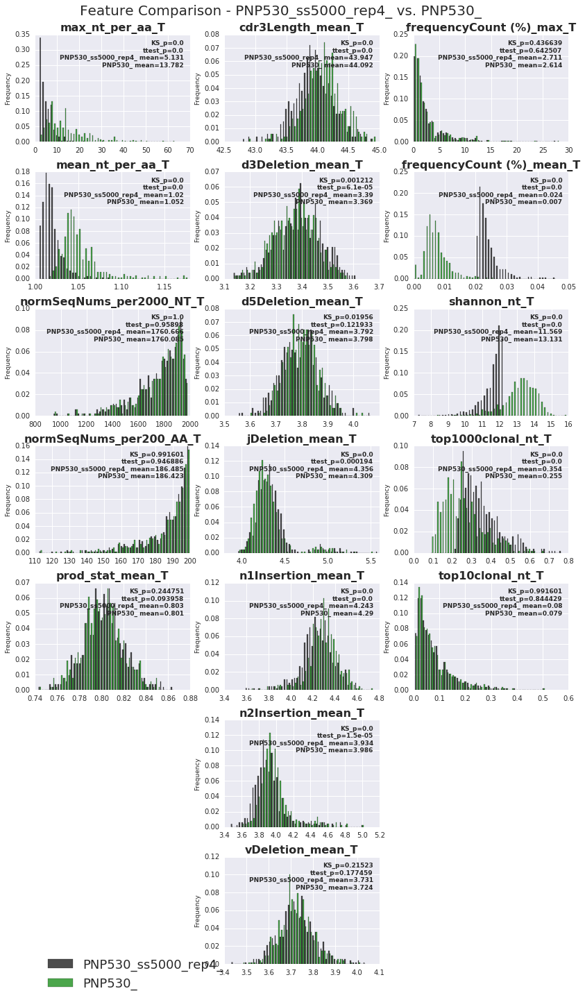

generating excel file with mean values for compared dataset (find in -featureSummaryDFs folder-)
plotting gene usage comparison...
plot file can be found in -realAnalysis folder


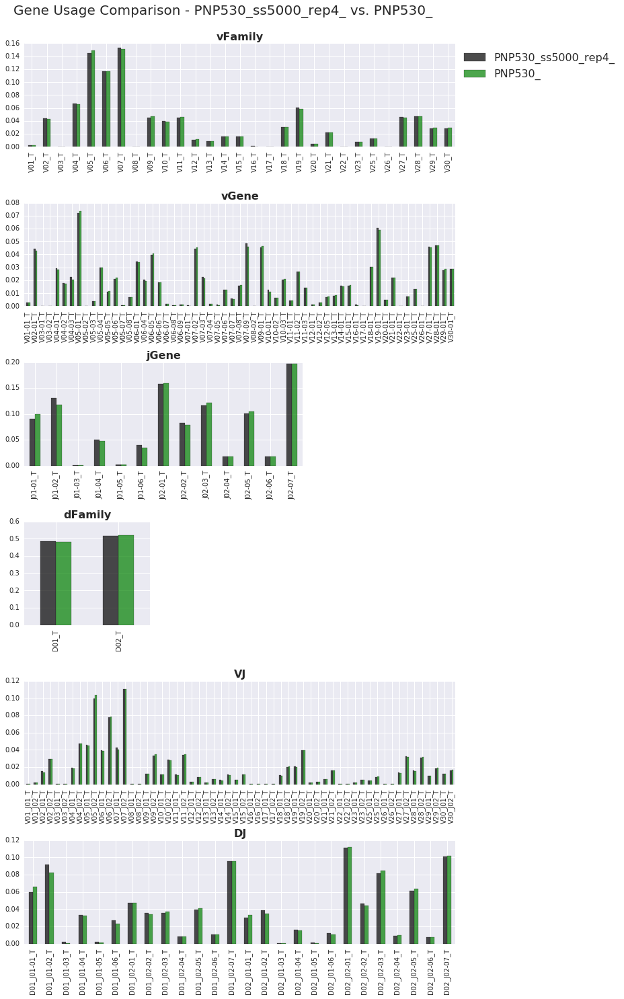

done
*********subsampling Cardio cohort with %s sequences per sample:***************
step 1: subsampling (long)
number of samples in folder is 126
0 BD1014
nTemplates in sample is 3819 and therefore this sample is not subsampled
1 BD1068
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 5102
nTemplates in sample is 11906
l list length is 11906 and should be equal to nTemplates
cumsum list length is 5102 and should be equal to n Unique
length of popped nucleotide dataframe is 11906 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
2 BD1013
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 7675
nTemplates in sample is 13691
l list length is 13691 and should be equal to nTemplates
cumsum list length is 7675 and should be equal to n Unique
length of popped nucleotide dataframe is 13691 and should be equal to nTempla

length of popped nucleotide dataframe is 19245 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
20 BD980
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 7632
nTemplates in sample is 12664
l list length is 12664 and should be equal to nTemplates
cumsum list length is 7632 and should be equal to n Unique
length of popped nucleotide dataframe is 12664 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
21 BD951
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 4980
nTemplates in sample is 6955
l list length is 6955 and should be equal to nTemplates
cumsum list length is 4980 and should be equal to n Unique
length of popped nucleotide dataframe is 6955 and should be equal to nTemplates
subsam

39 BD1052
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 19434
nTemplates in sample is 26827
l list length is 26827 and should be equal to nTemplates
cumsum list length is 19434 and should be equal to n Unique
length of popped nucleotide dataframe is 26827 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
40 BD1083
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 26781
nTemplates in sample is 38250
l list length is 38250 and should be equal to nTemplates
cumsum list length is 26781 and should be equal to n Unique
length of popped nucleotide dataframe is 38250 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
41 BD973
generating a popped nucleotide sequenes:...
n Unique sequences in sam

57 BD957
nTemplates in sample is 4074 and therefore this sample is not subsampled
58 BD1095
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 7528
nTemplates in sample is 10923
l list length is 10923 and should be equal to nTemplates
cumsum list length is 7528 and should be equal to n Unique
length of popped nucleotide dataframe is 10923 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
59 BD981
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 6535
nTemplates in sample is 15077
l list length is 15077 and should be equal to nTemplates
cumsum list length is 6535 and should be equal to n Unique
length of popped nucleotide dataframe is 15077 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
6

length of popped nucleotide dataframe is 16825 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
78 BD1049
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 7342
nTemplates in sample is 13571
l list length is 13571 and should be equal to nTemplates
cumsum list length is 7342 and should be equal to n Unique
length of popped nucleotide dataframe is 13571 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
79 BD1035
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 10382
nTemplates in sample is 12152
l list length is 12152 and should be equal to nTemplates
cumsum list length is 10382 and should be equal to n Unique
length of popped nucleotide dataframe is 12152 and should be equal to nTemplates

96 BD1034
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 4597
nTemplates in sample is 5470
l list length is 5470 and should be equal to nTemplates
cumsum list length is 4597 and should be equal to n Unique
length of popped nucleotide dataframe is 5470 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
97 BD1033
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 9011
nTemplates in sample is 11014
l list length is 11014 and should be equal to nTemplates
cumsum list length is 9011 and should be equal to n Unique
length of popped nucleotide dataframe is 11014 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
98 BD1090
generating a popped nucleotide sequenes:...
n Unique sequences in sample is

115 BD1019
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 8941
nTemplates in sample is 11494
l list length is 11494 and should be equal to nTemplates
cumsum list length is 8941 and should be equal to n Unique
length of popped nucleotide dataframe is 11494 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
116 BD971
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 12658
nTemplates in sample is 16408
l list length is 16408 and should be equal to nTemplates
cumsum list length is 12658 and should be equal to n Unique
length of popped nucleotide dataframe is 16408 and should be equal to nTemplates
subsampling...
subsampled df length is 5000 and should be equal to 5000
templates sum in subsampled file is 5000 and should be equal to 5000
117 BD1065
generating a popped nucleotide sequenes:...
n Unique sequences in sa

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
2 BD952_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
7 BD1071_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
12 BD962_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
17 BD1079_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
22 BD1031_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
27 BD1049_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
32 BD1018_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
37 BD1007_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
42 BD1037_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
47 BD982_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
52 BD1047_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
57 BD1078_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
62 BD1030_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
67 BD1064_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
72 BD967_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
77 BD1063_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
82 BD996_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
87 BD960_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
92 BD1012_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
97 BD1093_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
102 BD956_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
107 BD997_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
112 BD987_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usag

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
117 BD1094_5000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usa

V30_J02_0
116
VA_J01_0
1
VA_J02_0
15
normSeqNums_per2000_NT_0
0
normSeqNums_per200_AA_0
2
comparing features between ss and original datasets... (short)
generating excel file with mean values for compared dataset (find in -featureSummaryDFs folder-)
taking only samples common to the two cohorts:
number of samples in cohort 1 is 119
number of samples in cohort 2 is 126
number of common samples is 119
 cohort1 df length is now 119
 cohort2 df length is now 119
comparing datasets and plot selected features:...
couldnt execute ks test
plot file can be found in -realAnalysis folder


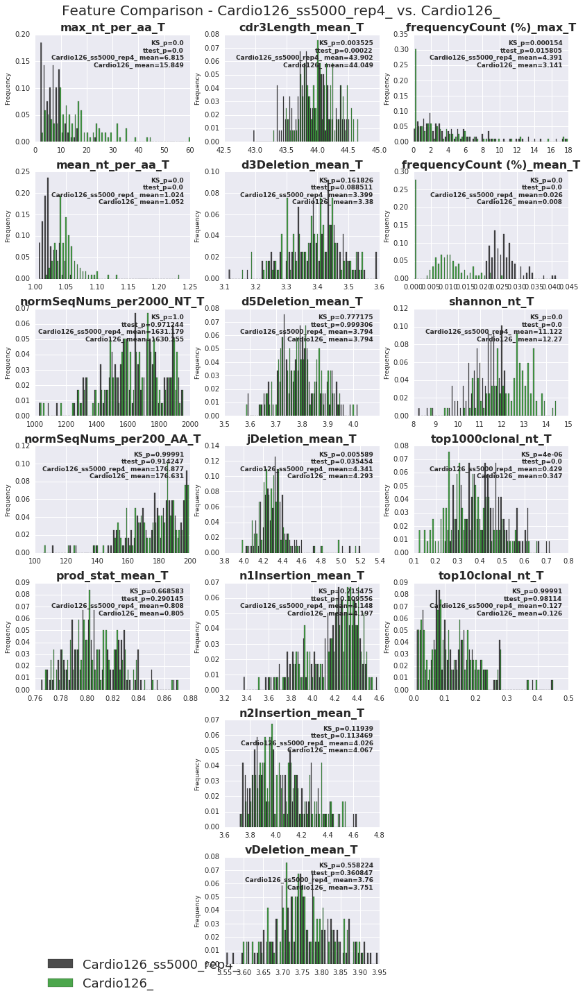

generating excel file with mean values for compared dataset (find in -featureSummaryDFs folder-)
plotting gene usage comparison...
plot file can be found in -realAnalysis folder


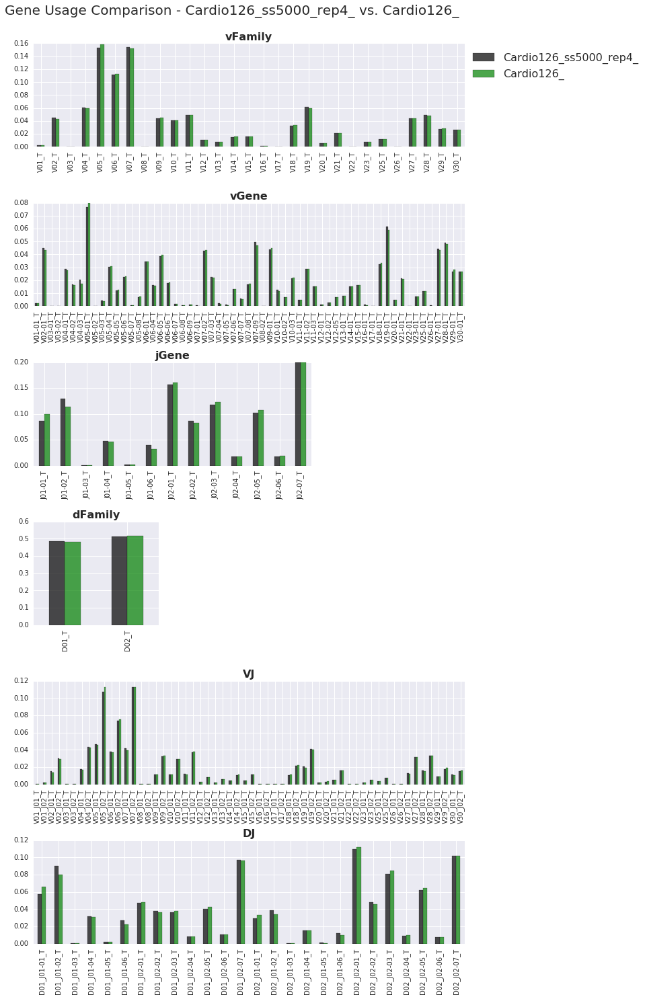

done
************comparing TCRfeatures between cohorts (not matched!):*************
generating excel file with mean values for compared dataset (find in -featureSummaryDFs folder-)
comparing datasets and plot selected features:...
couldnt execute ks test
couldnt execute ks test
plot file can be found in -realAnalysis folder


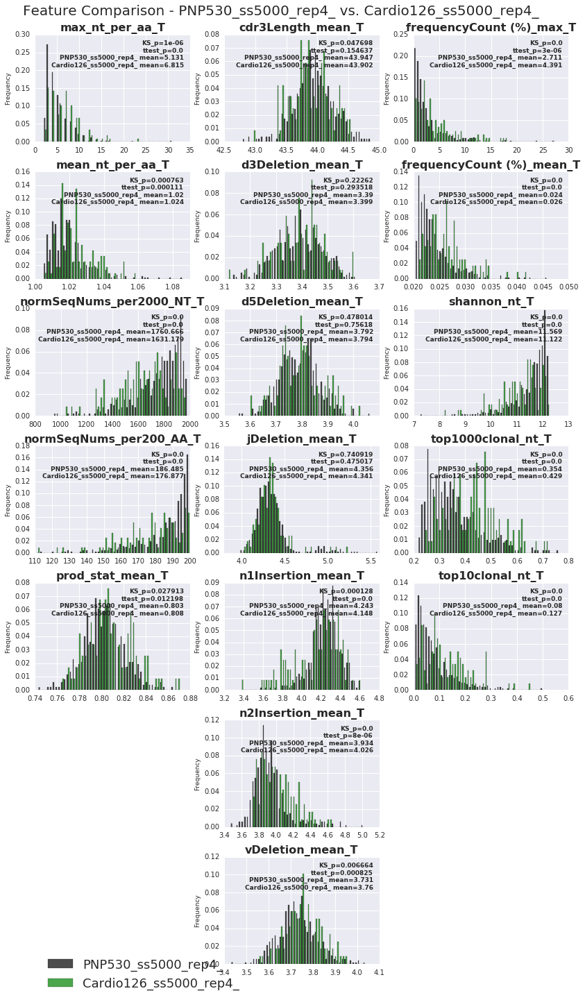

generating excel file with mean values for compared dataset (find in -featureSummaryDFs folder-)
plotting gene usage comparison...
plot file can be found in -realAnalysis folder


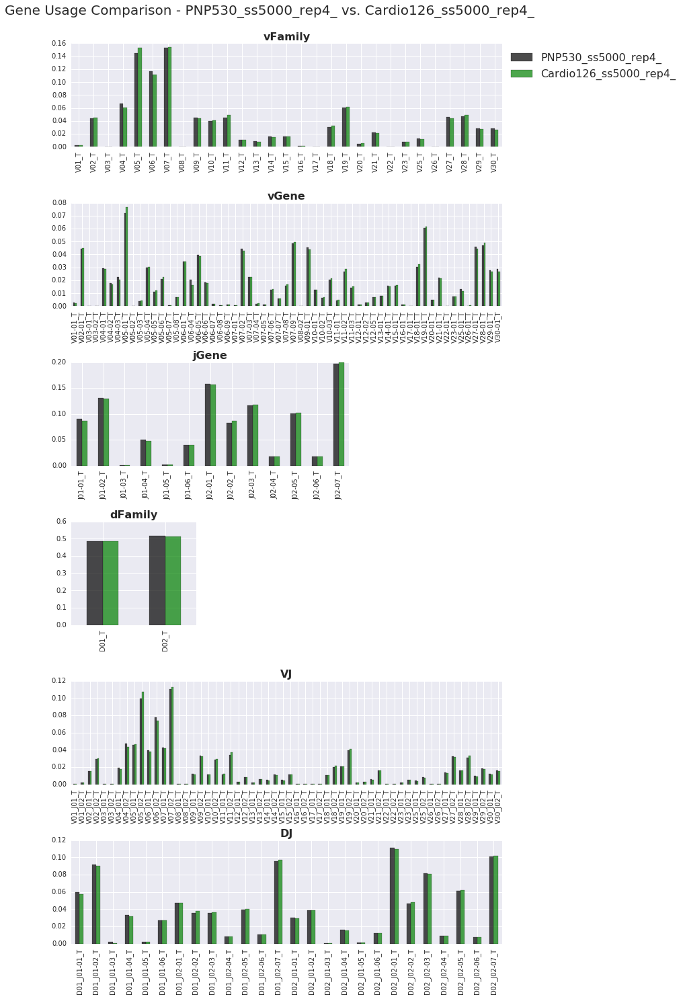

*****generating 10perc TCRdfs******
preparing sharing Matrix
only samples included in PNP530 sample list are included in the analysis
getting all samples from the sampleList...
extracting unique aa sequenecs from all samples...(n=527)
0 BD503_5000.tsv
1 BD860_5000.tsv
2 BD308_5000.tsv
3 BD889_5000.tsv
4 BD149_322939_2_5000.tsv
5 BD886_5000.tsv
6 BD640_1_5000.tsv
7 BD468_5000.tsv
8 BD12_5000.tsv
9 BD904_5000.tsv
10 BD457_2_5000.tsv
11 BD633_1_5000.tsv
12 BD467_5000.tsv
13 BD656_1_5000.tsv
14 BD838_5000.tsv
15 BD554_5000.tsv
16 BD696_2_5000.tsv
17 BD837_5000.tsv
18 BD481_5000.tsv
19 BD870_5000.tsv
20 BD142_322939_2_5000.tsv
21 BD597_1_5000.tsv
22 BD420_5000.tsv
23 BD896_5000.tsv
24 BD157_322939_2_5000.tsv
25 BD725_1_5000.tsv
26 BD943_5000.tsv
27 BD581_1_5000.tsv
28 BD899_5000.tsv
29 BD340_5000.tsv
30 BD477_5000.tsv
31 BD914_5000.tsv
32 BD478_5000.tsv
33 BD491_5000.tsv
34 BD544_5000.tsv
35 BD273_5000.tsv
36 BD793_5000.tsv
37 BD828_5000.tsv
38 BD327_5000.tsv
39 BD410_5000.tsv
40 BD22_32293

406 BD3_5000.tsv
407 BD854_5000.tsv
408 BD537_5000.tsv
409 BD628_1_5000.tsv
410 BD538_5000.tsv
411 BD392_5000.tsv
412 BD108_322939_2_5000.tsv
413 BD728_1_5000.tsv
414 BD36_5000.tsv
415 BD920_5000.tsv
416 BD374_5000.tsv
417 BD443_5000.tsv
418 BD122_322939_2_5000.tsv
419 BD414_5000.tsv
420 BD712_1_5000.tsv
421 BD137_322939_2_5000.tsv
422 BD844_5000.tsv
423 BD704_1_5000.tsv
424 BD771_5000.tsv
425 BD473_5000.tsv
426 BD910_5000.tsv
427 BD160_322939_2_5000.tsv
428 BD797_5000.tsv
429 BD495_5000.tsv
430 BD823_5000.tsv
431 BD798_5000.tsv
432 BD277_5000.tsv
433 BD540_5000.tsv
434 BD517_5000.tsv
435 BD723_1_5000.tsv
436 BD948_5000.tsv
437 BD892_5000.tsv
438 BD57_322939_2_5000.tsv
439 BD424_5000.tsv
440 BD900_5000.tsv
441 BD16_5000.tsv
442 BD623_1_5000.tsv
443 BD463_5000.tsv
444 BD354_5000.tsv
445 BD19_5000.tsv
446 BD434_2_5000.tsv
447 BD550_5000.tsv
448 BD833_5000.tsv
449 BD128_1rep_5000.tsv
450 BD646_1_5000.tsv
451 BD507_5000.tsv
452 BD508_5000.tsv
453 BD202_2_5000.tsv
454 BD882_5000.tsv
455 BD1

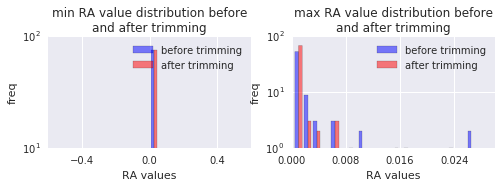

binarizing df...
existing values in df are now:
[0. 1.]
normalizing data so each sample  sum will be 1...
BD1      0.002000
BD10     0.003400
BD101    0.001200
BD104    0.003436
BD105    0.001436
dtype: float64
BD1      1.0
BD10     1.0
BD101    1.0
BD104    1.0
BD105    1.0
dtype: float64
values contain zeros, log transformation was not applied
final file name is:
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530_SubSampled5000data_rep4/PNP530_sharingAnalysis/sharingMatrix_PNP530_ss5000_rep4_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed
plotting mean sample distributions for all generated dfs...
0 (527, 119189)
origDF is too big, plot was not generated
1 (527, 76)
2 (527, 76)
3 (527, 76)


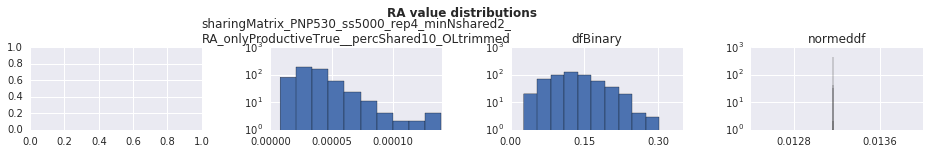

plotting RA value distributions for all generated dfs IN A RANDOM SAMPLE


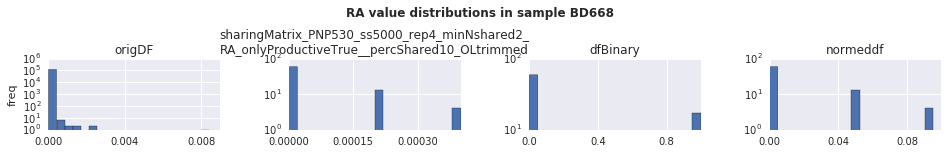

saving df to file...
saving binary df to file
saving normed df to file
ALL is done!!!
***********generating 10perc TCRdfs for Cardio************
preparing sharing Matrix
only samples included in Cardio126 sample list are included in the analysis
getting all samples from the sampleList...
extracting unique aa sequenecs from all samples...(n=119)
0 BD1088_5000.tsv
1 BD1087_5000.tsv
2 BD952_5000.tsv
3 BD1061_5000.tsv
4 BD1036_5000.tsv
5 BD1097_5000.tsv
6 BD1098_5000.tsv
7 BD1071_5000.tsv
8 BD1026_5000.tsv
9 BD1016_5000.tsv
10 BD1019_5000.tsv
11 BD1051_5000.tsv
12 BD962_5000.tsv
13 BD984_5000.tsv
14 BD1009_5000.tsv
15 BD1006_5000.tsv
16 BD1090_5000.tsv
17 BD1079_5000.tsv
18 BD1076_5000.tsv
19 BD1021_5000.tsv
20 BD1066_5000.tsv
21 BD1069_5000.tsv
22 BD1031_5000.tsv
23 BD965_5000.tsv
24 BD1056_5000.tsv
25 BD983_5000.tsv
26 BD1001_5000.tsv
27 BD1049_5000.tsv
28 BD993_5000.tsv
29 BD1011_5000.tsv
30 BD995_5000.tsv
31 BD973_5000.tsv
32 BD1018_5000.tsv
33 BD1017_5000.tsv
34 BD985_5000.tsv
35 BD96

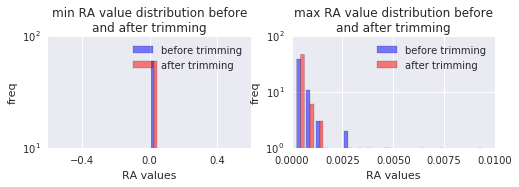

binarizing df...
existing values in df are now:
[0. 1.]
normalizing data so each sample  sum will be 1...
BD1000    0.001600
BD1001    0.002200
BD1002    0.001800
BD1003    0.001816
BD1004    0.001600
dtype: float64
BD1000    1.0
BD1001    1.0
BD1002    1.0
BD1003    1.0
BD1004    1.0
dtype: float64
values contain zeros, log transformation was not applied
final file name is:
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/CardioSamples/Cardio126_SubSampled5000data_rep4/Cardio126_sharingAnalysis/sharingMatrix_Cardio126_ss5000_rep4_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed
plotting mean sample distributions for all generated dfs...
0 (119, 15303)
1 (119, 60)
2 (119, 60)
3 (119, 60)


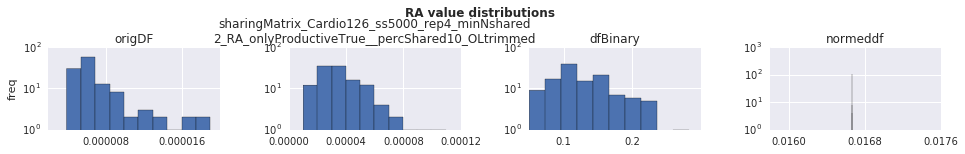

plotting RA value distributions for all generated dfs IN A RANDOM SAMPLE


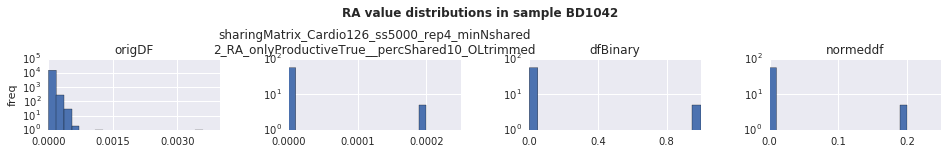

saving df to file...
saving binary df to file
saving normed df to file
ALL is done!!!
generating distmats for PNP
****************generating phenotype distMats*******************
generating distMat for phenotype Age
generating condensed distance matrix using euclidean
top similar pairs:
        dist sample1 sample2
225746   0.0   BD350   BD383
352586   0.0   BD556   BD756
92984    0.0   BD192   BD727
134174   0.0   BD237   BD920
307720   0.0   BD473   BD659
92989    0.0   BD192   BD731
158914   0.0   BD266   BD766
92994    0.0   BD192   BD736
282224   0.0   BD431    BD71
201386   0.0   BD318   BD701
generating squareform distance matrix using euclidean
generating distMat for phenotype BMI
generating condensed distance matrix using euclidean
top similar pairs:
        dist sample1 sample2
271058   0.0   BD414   BD715
152555   0.0   BD259   BD561
93842    0.0   BD193    BD74
167487   0.0   BD277   BD310
446217   0.0   BD877   BD919
323674   0.0   BD500   BD593
209149   0.0   BD328   BD76

top similar pairs:
                dist sample1 sample2
69340   3.296613e-07   BD896   BD646
20049   9.060642e-07    BD20   BD768
30235   3.517815e-06   BD841   BD690
56480   3.922664e-06   BD127   BD697
108944  5.160389e-06   BD507   BD139
111726  5.369974e-06   BD412   BD366
74366   6.278205e-06   BD633   BD139
55113   6.862055e-06   BD810   BD534
43343   8.909693e-06   BD791   BD424
51330   1.105547e-05   BD708   BD913
generating squareform distance matrix using euclidean
******generating distMat for TCRdfs:**********
TCRdfminNshared2RAonlyProductiveTruepercShared10OLtrimmed
generating distance matrix for RA data:
sampleListName=PNP530
file name=/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530_SubSampled5000data_rep4/PNP530_sharingAnalysis/sharingMatrix_PNP530_ss5000_rep4_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed
TCRdf sum is 1.4478071148580955
generating condensed distance matrix using braycurtis
top similar pairs:
            dist sample1 sample

IOError: [Errno 2] No such file or directory: '/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530_SubSampled5000data_rep4/featureDistMats/PNP530_top10clonal_nt_T_euclidean_distMat'

In [4]:
ss=5000
repeat=4
ssPNP=True #True/False. subsample only if not exist
ssCardio=True #True/False. subsample only if not exist
genTCRdfPNP=True #True/False. 
genTCRdfCardio=True #True/False. 


testPhenotypeAffectsOnsubsampledCohorts(ss,repeat,ssPNP,ssCardio,genTCRdfPNP,genTCRdfCardio)

In [ ]:
sharingMatrix_PNP530_ss5000_rep2_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed_binary

## function2 - generate matched cohorts and validate by comparing phenotypes
try to get as many samples as possible!

### prepare phenotype DFs:

*** replace all ss and rep information!!! make sure phenotype file is updated!***

In [5]:
# get full phenotype DFs for PNP and Cardio:
f1='%s/TCR_real_data/NewPhenotypicData/newPhenotypesPNPAllInfo_withDummies.xlsx' %MyPath
PNP530_phen_new_dummies=pd.read_excel(f1).set_index('BD')

f2='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126phenAllInfo_withDummies.xlsx' %MyPath
Cardio126_phen_new_dummies=pd.read_excel(f2).set_index('BD')

#filter for ss5000 samples and save:
folder='%s/TCR_real_data/PNP530_SubSampled5000data_rep4/SamplesForAnalysis_corrected' %MyPath
PNP530ss5000rep4sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)

PNP530ss5000rep4_phen_new_dummies=PNP530_phen_new_dummies.loc[PNP530ss5000rep4sampleList,:]

f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss5000rep4_phen_new_dummies.xlsx' %MyPath
PNP530ss5000rep4_phen_new_dummies.to_excel(f3)


folder='%s/TCR_real_data/CardioSamples/Cardio126_SubSampled5000data_rep4/SamplesForAnalysis_corrected' %MyPath
Cardio126ss5000rep4sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)

Cardio126ss5000rep4_phen_new_dummies=Cardio126_phen_new_dummies.loc[Cardio126ss5000rep4sampleList,:]

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss5000rep4_phen_new_dummies.xlsx' %MyPath
Cardio126ss5000rep4_phen_new_dummies.to_excel(f4)


### run matching function-including relatives:

********** run several times to reach optimal matched cohorts, and then clean folder from unwanted sample lists and other stuff **********

**********use results for next function **************

restricted phenotypes=['Gender_Male', 'Age', 'HbA1C', 'Smoking Status_Yes']
numericalPhenotypes=['Age', 'HbA1C', 'Glucose', 'BMI', 'Total Cholesterol']
*******************random state = 1
number of samples in cohort 1 is 119
number of samples in cohort 2 is 527
imputing missing values for cohort PNP530ss5000rep4
now the number of samples in cohort 2 is 527
0 BD976
                          BD976
Gender_Male            1.000000
Age                   56.000000
HbA1C                  5.700000
Smoking Status_Yes     1.000000
Glucose              138.000000
BMI                   27.161612
Total Cholesterol    233.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=200
len potCohort=200
len potCohort>2, continue to the next phenotype
Age delta 7 True
len same=39
len potCohort=39
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=37
len potCohort=37
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len s

now choosing the closest sample:
v2: Gender_Male            1.000000
Age                    0.469713
HbA1C                 -0.929633
Smoking Status_Yes     0.000000
Glucose                1.486826
BMI                   -1.248726
Total Cholesterol     -0.362687
Smoking Status_Past    0.000000
Name: BD977, dtype: float64
0 BD863
v1: Gender_Male            1.000000
Age                    2.263163
HbA1C                  1.192056
Smoking Status_Yes     0.000000
Glucose               -0.399434
BMI                   -0.197528
Total Cholesterol      2.965626
Smoking Status_Past    0.000000
Name: BD863, dtype: float64
1 BD5
v1: Gender_Male            1.000000
Age                   -1.067530
HbA1C                 -0.378545
Smoking Status_Yes     0.000000
Glucose               -0.865579
BMI                   -1.356131
Total Cholesterol      0.031855
Smoking Status_Past    0.000000
Name: BD5, dtype: float64
2 BD705
v1: Gender_Male            1.000000
Age                   -0.555115
HbA1C          

now choosing the closest sample:
v2: Gender_Male            1.000000
Age                    1.032796
HbA1C                  0.419322
Smoking Status_Yes     0.000000
Glucose                2.307322
BMI                   -0.667692
Total Cholesterol     -0.076200
Smoking Status_Past    0.000000
Name: BD973, dtype: float64
0 BD101
v1: Gender_Male            1.000000
Age                   -0.516398
HbA1C                  0.033739
Smoking Status_Yes     0.000000
Glucose               -0.442819
BMI                   -0.721233
Total Cholesterol      0.279400
Smoking Status_Past    0.000000
Name: BD101, dtype: float64
1 BD582
v1: Gender_Male            1.000000
Age                    1.032796
HbA1C                 -0.236170
Smoking Status_Yes     0.000000
Glucose               -0.675882
BMI                   -0.522945
Total Cholesterol      1.397001
Smoking Status_Past    0.000000
Name: BD582, dtype: float64
2 BD453
v1: Gender_Male            1.000000
Age                   -1.032796
HbA1C      

len same=89
len potCohort=89
len potCohort>2, continue to the next phenotype
Total Cholesterol delta None False
len same=89
len potCohort=89
len potCohort>2, continue to the next phenotype
Smoking Status_Past identity None False
len same=69
len potCohort=69
len potCohort>2 but this is the last phenotype
allSamples:
       Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD483          1.0  39.0   5.34                 0.0   107.00  28.082171   
BD501          1.0  45.0   4.93                 0.0    99.00  34.316109   
BD104          1.0  32.0   5.50                 0.0    98.00  23.671254   
BD673          1.0  32.0   4.45                 0.0    96.00  25.306932   
BD893          1.0  31.0   5.10                 0.0    95.00  23.243802   
BD454          1.0  34.0   4.71                 0.0    94.00  24.151673   
BD949          1.0  35.0   5.40                 0.0    94.00  23.547881   
BD333          1.0  39.0   5.70                 0.0    88.00  20.307412   
BD276   

                         BD1075
Gender_Male            1.000000
Age                   58.000000
HbA1C                  4.700000
Smoking Status_Yes     1.000000
Glucose               86.000000
BMI                   27.990363
Total Cholesterol    204.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=190
len potCohort=190
len potCohort>2, continue to the next phenotype
Age delta 7 True
len same=33
len potCohort=33
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=23
len potCohort=23
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=0
no more 1 samples in PNP530ss5000rep4 cohort
now the number of samples in cohort 2 is 517
12 BD952
                          BD952
Gender_Male            0.000000
Age                   66.000000
HbA1C                       NaN
Smoking Status_Yes     1.000000
Glucose              150.000000
BMI                   21.501886
Total Cholesterol           NaN
Smokin

        Gender_Male   Age  HbA1C  Smoking Status_Yes     Glucose        BMI  \
BD768           0.0  55.0   5.07                 1.0   94.000000  28.720083   
BD423           0.0  50.0   5.50                 1.0  102.000000  24.167162   
BD704           0.0  61.0   5.74                 1.0   88.000000  24.973985   
BD870           0.0  54.0   6.07                 1.0  112.000000  36.379769   
BD503           0.0  59.0   5.70                 1.0   98.000000  24.128792   
BD316           0.0  55.0   5.90                 1.0   96.000000  34.222222   
BD70            0.0  50.0   6.20                 1.0  100.000000  36.198750   
BD232           0.0  60.0   5.57                 1.0  104.000000  38.200184   
BD862           0.0  53.0   5.93                 1.0   84.516129  30.109157   
BD195           0.0  52.0   5.60                 1.0   97.000000  25.605536   
BD1077          0.0  57.0   5.40                 1.0  187.000000  25.864512   

        Total Cholesterol  Smoking Status_Past  
BD

v1: Gender_Male            1.000000
Age                   -0.491705
HbA1C                 -0.018238
Smoking Status_Yes     0.000000
Glucose               -1.142848
BMI                   -1.908855
Total Cholesterol      0.314569
Smoking Status_Past    1.000000
Name: BD398, dtype: float64
12 BD828
v1: Gender_Male            1.000000
Age                    1.626409
HbA1C                 -0.109427
Smoking Status_Yes     0.000000
Glucose               -1.275627
BMI                   -0.168012
Total Cholesterol      1.330867
Smoking Status_Past    1.000000
Name: BD828, dtype: float64
sample BD66 was found to be the closet to sample BD1064, so it is selected
now the number of samples in cohort 2 is 512
19 BD1030
                         BD1030
Gender_Male            1.000000
Age                   74.000000
HbA1C                       NaN
Smoking Status_Yes     0.000000
Glucose              107.000000
BMI                   27.428571
Total Cholesterol    149.000000
Smoking Status_Past    0.0000

v1: Gender_Male            1.000000
Age                    0.000000
HbA1C                 -0.037753
Smoking Status_Yes     0.000000
Glucose               -0.540252
BMI                   -0.773522
Total Cholesterol      0.415872
Smoking Status_Past    0.000000
Name: BD101, dtype: float64
3 BD453
v1: Gender_Male            1.000000
Age                   -0.645497
HbA1C                 -0.868326
Smoking Status_Yes     0.000000
Glucose               -0.558382
BMI                   -0.745303
Total Cholesterol     -1.947039
Smoking Status_Past    0.000000
Name: BD453, dtype: float64
sample BD101 was found to be the closet to sample BD1035, so it is selected
now the number of samples in cohort 2 is 509
24 BD1003
                         BD1003
Gender_Male            1.000000
Age                   67.000000
HbA1C                  6.700000
Smoking Status_Yes     0.000000
Glucose              125.000000
BMI                   28.634039
Total Cholesterol    124.000000
Smoking Status_Past    1.0000

allSamples:
        Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD671           1.0  55.0   5.62                 0.0    104.0  26.927438   
BD520           1.0  56.0   6.00                 0.0    102.0  25.648918   
BD689           1.0  59.0   5.40                 0.0    131.0  28.680111   
BD369           1.0  59.0   5.53                 0.0    105.0  25.381469   
BD909           1.0  56.0   5.50                 0.0    107.0  32.950680   
BD543           1.0  50.0   6.30                 0.0    110.0  29.054752   
BD908           1.0  63.0   5.50                 0.0    101.0  27.681661   
BD600           1.0  63.0   5.27                 0.0     99.0  45.970795   
BD27            1.0  53.0   6.00                 0.0    105.0  25.503616   
BD495           1.0  56.0   5.39                 0.0    101.0  24.622961   
BD649           1.0  52.0   5.96                 0.0    120.0  32.283058   
BD275           1.0  56.0   6.20                 0.0    101.0  27.117769   


Total Cholesterol delta None False
len same=9
len potCohort=9
len potCohort>2, continue to the next phenotype
Smoking Status_Past identity None False
len same=6
len potCohort=6
len potCohort>2 but this is the last phenotype
allSamples:
        Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD398           1.0  61.0   5.70                 0.0     91.0  19.379197   
BD810           1.0  64.0   5.80                 0.0     98.0  32.871972   
BD106           1.0  63.0   6.70                 0.0    105.0  26.769780   
BD591           1.0  65.0   5.56                 0.0    112.0  30.218858   
BD828           1.0  69.0   5.65                 0.0     90.0  27.358845   
BD380           1.0  67.0   6.00                 0.0    104.0  25.648918   
BD1037          1.0  67.0   5.70                 0.0    100.0  23.738662   

        Total Cholesterol  Smoking Status_Past  
BD398               173.0                  1.0  
BD810               139.0                  1.0  
BD106   

        Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD793           1.0  57.0   5.30                 0.0     91.0  25.000000   
BD124           1.0  59.0   4.70                 0.0     91.0  24.535124   
BD847           1.0  58.0   4.93                 0.0    104.5  32.202924   
BD1019          1.0  63.0   4.20                 0.0    180.0  24.609375   

        Total Cholesterol  Smoking Status_Past  
BD793               192.0                  1.0  
BD124               145.0                  1.0  
BD847               204.0                  1.0  
BD1019              188.0                  1.0  
now choosing the closest sample:
v2: Gender_Male            1.000000
Age                    1.646464
HbA1C                 -1.461196
Smoking Status_Yes     0.000000
Glucose                1.712730
BMI                   -0.608972
Total Cholesterol      0.257874
Smoking Status_Past    1.000000
Name: BD1019, dtype: float64
0 BD793
v1: Gender_Male            1.000000
Age     

allSamples:
        Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD600           1.0  63.0   5.27                 0.0     99.0  45.970795   
BD631           1.0  59.0   5.95                 0.0     89.0  27.450605   
BD908           1.0  63.0   5.50                 0.0    101.0  27.681661   
BD71            1.0  59.0   5.40                 0.0     93.0  24.859074   
BD484           1.0  57.0   5.50                 0.0     91.0  26.370238   
BD801           1.0  58.0   5.63                 0.0     87.0  20.307412   
BD453           1.0  63.0   5.28                 0.0     94.0  23.183673   
BD1021          1.0  64.0   5.30                 0.0    105.0  23.999459   

        Total Cholesterol  Smoking Status_Past  
BD600               166.0                  0.0  
BD631               182.0                  0.0  
BD908               175.0                  0.0  
BD71                183.0                  0.0  
BD484               223.0                  0.0  
BD801    

Gender_Male identity None True
len same=323
len potCohort=323
len potCohort>2, continue to the next phenotype
Age delta 7 True
len same=81
len potCohort=81
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=79
len potCohort=79
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=74
len potCohort=74
len potCohort>2, continue to the next phenotype
Glucose delta 20 False
len same=69
len potCohort=69
len potCohort>2, continue to the next phenotype
BMI delta None False
len same=69
len potCohort=69
len potCohort>2, continue to the next phenotype
Total Cholesterol delta None False
len same=69
len potCohort=69
len potCohort>2, continue to the next phenotype
Smoking Status_Past identity None False
len same=39
len potCohort=39
len potCohort>2 but this is the last phenotype
allSamples:
        Gender_Male   Age  HbA1C  Smoking Status_Yes     Glucose        BMI  \
BD611           0.0  58.0   5.63                 0.0   92.000000  

now the number of samples in cohort 2 is 496
44 BD1060
                         BD1060
Gender_Male            1.000000
Age                   74.000000
HbA1C                  6.300000
Smoking Status_Yes     0.000000
Glucose              100.000000
BMI                   25.344353
Total Cholesterol     95.000000
Smoking Status_Past    1.000000
Gender_Male identity None True
len same=174
len potCohort=174
len potCohort>2, continue to the next phenotype
Age delta 7 True
len same=1
len potCohort=1
len potCohort<2, so after phenotype Age, sample BD828 is taken
now the number of samples in cohort 2 is 495
45 BD979
                          BD979
Gender_Male            1.000000
Age                   57.000000
HbA1C                       NaN
Smoking Status_Yes     0.000000
Glucose              134.000000
BMI                   44.982699
Total Cholesterol    200.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=173
len potCohort=173
len potCohort>2, continue to the nex

now choosing the closest sample:
v2: Gender_Male            1.000000
Age                    0.310460
HbA1C                  0.215119
Smoking Status_Yes     0.000000
Glucose                2.116868
BMI                    1.790714
Total Cholesterol      1.183143
Smoking Status_Past    0.000000
Name: BD965, dtype: float64
0 BD275
v1: Gender_Male            1.000000
Age                    0.038808
HbA1C                  1.100903
Smoking Status_Yes     0.000000
Glucose               -0.846747
BMI                   -0.490198
Total Cholesterol      1.183143
Smoking Status_Past    0.000000
Name: BD275, dtype: float64
1 BD27
v1: Gender_Male            1.000000
Age                   -0.776151
HbA1C                  0.510380
Smoking Status_Yes     0.000000
Glucose               -0.222828
BMI                   -0.929754
Total Cholesterol     -0.456857
Smoking Status_Past    0.000000
Name: BD27, dtype: float64
2 BD495
v1: Gender_Male            1.000000
Age                    0.038808
HbA1C        

57 BD999
                          BD999
Gender_Male            1.000000
Age                   57.000000
HbA1C                  9.000000
Smoking Status_Yes     0.000000
Glucose              275.000000
BMI                   28.604765
Total Cholesterol           NaN
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=165
len potCohort=165
len potCohort>2, continue to the next phenotype
Age delta 7 True
len same=22
len potCohort=22
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
no more samples with similar HbA1C
now the number of samples in cohort 2 is 486
58 BD1006
                         BD1006
Gender_Male            1.000000
Age                   53.000000
HbA1C                 10.800000
Smoking Status_Yes     0.000000
Glucose              242.000000
BMI                   30.103806
Total Cholesterol    165.900000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=165
len potCohort=165
len potCohort>2, continue to the next 

Smoking Status_Past    0.000000
Gender_Male identity None True
len same=163
len potCohort=163
len potCohort>2, continue to the next phenotype
Age delta 7 True
len same=3
len potCohort=3
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=3
len potCohort=3
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=0
no more 1 samples in PNP530ss5000rep4 cohort
now the number of samples in cohort 2 is 484
64 BD1047
                         BD1047
Gender_Male            1.000000
Age                   47.000000
HbA1C                  7.500000
Smoking Status_Yes     1.000000
Glucose              273.000000
BMI                   32.449973
Total Cholesterol    186.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=163
len potCohort=163
len potCohort>2, continue to the next phenotype
Age delta 7 True
len same=37
len potCohort=37
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
no more 

v1: Gender_Male            1.000000
Age                    0.701024
HbA1C                 -0.378966
Smoking Status_Yes     0.000000
Glucose                0.224464
BMI                   -0.465440
Total Cholesterol      0.648675
Smoking Status_Past    0.000000
Name: BD495, dtype: float64
11 BD27
v1: Gender_Male            1.000000
Age                   -0.014915
HbA1C                  1.257632
Smoking Status_Yes     0.000000
Glucose                0.486170
BMI                   -0.233880
Total Cholesterol     -0.038254
Smoking Status_Past    0.000000
Name: BD27, dtype: float64
12 BD432
v1: Gender_Male            1.000000
Age                   -0.730855
HbA1C                  0.506406
Smoking Status_Yes     0.000000
Glucose               -0.953214
BMI                   -0.175533
Total Cholesterol     -1.914100
Smoking Status_Past    0.000000
Name: BD432, dtype: float64
13 BD935
v1: Gender_Male            1.000000
Age                   -1.446795
HbA1C                 -1.317998
Smoking Sta

len same=2
len potCohort=2
len potCohort>2, continue to the next phenotype
Smoking Status_Past identity None False
len same=0
len potCohort=2
len potCohort>2 but this is the last phenotype
allSamples:
       Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD908          1.0  63.0   5.50                 0.0    101.0  27.681661   
BD600          1.0  63.0   5.27                 0.0     99.0  45.970795   
BD964          1.0  70.0   5.10                 0.0    108.0  31.673469   

       Total Cholesterol  Smoking Status_Past  
BD908              175.0                  0.0  
BD600              166.0                  0.0  
BD964              115.0                  1.0  
now choosing the closest sample:
v2: Gender_Male             1.000000
Age                    70.000000
HbA1C                  -1.159169
Smoking Status_Yes      0.000000
Glucose                 1.382189
BMI                    -0.437508
Total Cholesterol      -1.400471
Smoking Status_Past     1.000000
Name:

len same=29
len potCohort=29
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
phenotype value is nan, skip this phenotype
Smoking Status_Yes identity None True
len same=0
no more 1 samples in PNP530ss5000rep4 cohort
now the number of samples in cohort 2 is 474
84 BD1031
                         BD1031
Gender_Male            1.000000
Age                   59.000000
HbA1C                 10.100000
Smoking Status_Yes     0.000000
Glucose              375.000000
BMI                   30.864198
Total Cholesterol    176.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=153
len potCohort=153
len potCohort>2, continue to the next phenotype
Age delta 7 True
len same=11
len potCohort=11
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
no more samples with similar HbA1C
now the number of samples in cohort 2 is 474
85 BD1081
                         BD1081
Gender_Male            1.000000
Age                   52.000000
HbA1C     

       Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD801          1.0  58.0   5.63                 0.0     87.0  20.307412   
BD484          1.0  57.0   5.50                 0.0     91.0  26.370238   
BD631          1.0  59.0   5.95                 0.0     89.0  27.450605   
BD71           1.0  59.0   5.40                 0.0     93.0  24.859074   
BD909          1.0  56.0   5.50                 0.0    107.0  32.950680   
BD275          1.0  56.0   6.20                 0.0    101.0  27.117769   
BD984          1.0  62.0   5.60                 0.0     95.0  25.762981   

       Total Cholesterol  Smoking Status_Past  
BD801              229.0                  0.0  
BD484              223.0                  0.0  
BD631              182.0                  0.0  
BD71               183.0                  0.0  
BD909              166.0                  0.0  
BD275              263.0                  0.0  
BD984              172.0                  0.0  
now choosing th

        Gender_Male   Age  HbA1C  Smoking Status_Yes     Glucose        BMI  \
BD855           0.0  66.0   5.80                 0.0  106.500000  37.056089   
BD406           0.0  65.0   6.40                 0.0   96.000000  27.181630   
BD340           0.0  67.0   5.30                 0.0   95.666667  25.648918   
BD806           0.0  65.0   6.49                 0.0  114.000000  30.483158   
BD377           0.0  66.0   5.40                 0.0  115.000000  30.427198   
BD385           0.0  67.0   6.20                 0.0   98.000000  25.648918   
BD542           0.0  64.0   5.60                 0.0   90.000000  19.705532   
BD621           0.0  66.0   6.15                 0.0  104.000000  29.968783   
BD728           0.0  64.0   6.10                 0.0  113.000000  25.648918   
BD386           0.0  63.0   5.70                 0.0   95.000000  25.631167   
BD831           0.0  68.0   5.67                 0.0   95.000000  21.501886   
BD636           0.0  67.0   5.61                 0.0

len potCohort<2, so after phenotype Age, sample BD631 is taken
now the number of samples in cohort 2 is 466
101 BD1065
                         BD1065
Gender_Male            1.000000
Age                   57.000000
HbA1C                  5.300000
Smoking Status_Yes     0.000000
Glucose              117.000000
BMI                   28.075043
Total Cholesterol    178.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=147
len potCohort=147
len potCohort>2, continue to the next phenotype
Age delta 7 True
len same=9
len potCohort=9
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=9
len potCohort=9
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=9
len potCohort=9
len potCohort>2, continue to the next phenotype
Glucose delta 20 False
len same=2
len potCohort=2
len potCohort>2, continue to the next phenotype
BMI delta None False
len same=2
len potCohort=2
len potCohort>2, continue to the nex

       Gender_Male   Age  HbA1C  Smoking Status_Yes     Glucose        BMI  \
BD275          1.0  56.0   6.20                 0.0  101.000000  27.117769   
BD863          1.0  50.0   5.87                 0.0   95.774194  26.910878   
BD860          1.0  50.0   5.50                 0.0   95.000000  37.463946   
BD983          1.0  57.0   5.60                 0.0  112.000000  27.170771   

       Total Cholesterol  Smoking Status_Past  
BD275         263.000000                  0.0  
BD863         279.666667                  0.0  
BD860         245.000000                  0.0  
BD983         229.000000                  0.0  
now choosing the closest sample:
v2: Gender_Male            1.000000
Age                    1.147079
HbA1C                 -0.709233
Smoking Status_Yes     0.000000
Glucose                1.628874
BMI                   -0.554055
Total Cholesterol     -1.323798
Smoking Status_Past    0.000000
Name: BD983, dtype: float64
0 BD275
v1: Gender_Male            1.000000
Age 

v1: Gender_Male            0.000000
Age                    1.596567
HbA1C                  1.674235
Smoking Status_Yes     0.000000
Glucose               -0.583475
BMI                    0.293428
Total Cholesterol      0.176738
Smoking Status_Past    0.000000
Name: BD436, dtype: float64
55 BD182
v1: Gender_Male            0.000000
Age                   -0.981496
HbA1C                  0.063091
Smoking Status_Yes     0.000000
Glucose               -0.328217
BMI                   -1.132896
Total Cholesterol     -0.124494
Smoking Status_Past    0.000000
Name: BD182, dtype: float64
56 BD292
v1: Gender_Male            0.000000
Age                    0.226971
HbA1C                  1.213908
Smoking Status_Yes     0.000000
Glucose                0.692814
BMI                    2.270271
Total Cholesterol      0.056245
Smoking Status_Past    0.000000
Name: BD292, dtype: float64
57 BD717
v1: Gender_Male            0.000000
Age                    0.952051
HbA1C                 -0.489302
Smoking S

v1: Gender_Male            0.000000
Age                   -1.303754
HbA1C                  1.213908
Smoking Status_Yes     0.000000
Glucose                0.267384
BMI                    4.485521
Total Cholesterol     -1.359543
Smoking Status_Past    0.000000
Name: BD417, dtype: float64
163 BD554
v1: Gender_Male            0.000000
Age                   -0.175851
HbA1C                 -0.535335
Smoking Status_Yes     0.000000
Glucose               -0.328217
BMI                   -0.965201
Total Cholesterol      0.357477
Smoking Status_Past    0.000000
Name: BD554, dtype: float64
164 BD449
v1: Gender_Male            0.000000
Age                   -0.095287
HbA1C                  0.523418
Smoking Status_Yes     0.000000
Glucose               -0.753647
BMI                   -1.354848
Total Cholesterol     -2.202991
Smoking Status_Past    0.000000
Name: BD449, dtype: float64
165 BD418
v1: Gender_Male            0.000000
Age                    0.226971
HbA1C                  0.753581
Smokin

v1: Gender_Male            1.000000
Age                    0.089803
HbA1C                 -1.057660
Smoking Status_Yes     0.000000
Glucose               -0.657103
BMI                    0.215780
Total Cholesterol     -0.942190
Smoking Status_Past    0.000000
Name: BD483, dtype: float64
3 BD705
v1: Gender_Male            1.000000
Age                    0.089803
HbA1C                 -1.298037
Smoking Status_Yes     0.000000
Glucose               -0.109517
BMI                    0.016232
Total Cholesterol      0.416738
Smoking Status_Past    0.000000
Name: BD705, dtype: float64
sample BD886 was found to be the closet to sample BD1092, so it is selected
now the number of samples in cohort 2 is 459
111 BD1073
                         BD1073
Gender_Male            1.000000
Age                   64.000000
HbA1C                       NaN
Smoking Status_Yes     1.000000
Glucose              116.000000
BMI                   25.381469
Total Cholesterol    166.000000
Smoking Status_Past    0.000

len same=1
len potCohort=1
len potCohort<2, so after phenotype Age, sample BD149 is taken
now the number of samples in cohort 2 is 456
117 BD997
                          BD997
Gender_Male            1.000000
Age                   74.000000
HbA1C                  5.500000
Smoking Status_Yes     0.000000
Glucose               88.000000
BMI                   29.761905
Total Cholesterol    118.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=139
len potCohort=139
len potCohort>2, continue to the next phenotype
Age delta 7 True
no more samples with similar Age
now the number of samples in cohort 2 is 456
118 BD1007
                         BD1007
Gender_Male            1.000000
Age                   72.000000
HbA1C                  6.000000
Smoking Status_Yes     0.000000
Glucose              108.000000
BMI                   30.991736
Total Cholesterol    177.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=139
len potCohort=139
l

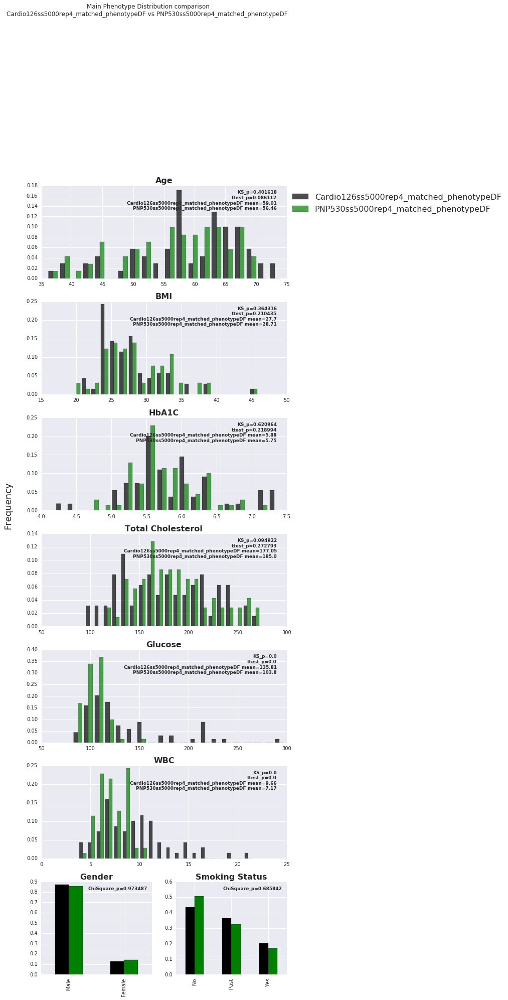

figure was saved in folder TCR_real_data/realAnalysis
done


In [9]:
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss5000rep4_phen_new_dummies.xlsx' %MyPath
PNP530ss5000rep4_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss5000rep4_phen_new_dummies.xlsx' %MyPath
Cardio126ss5000rep4_phen_new_dummies=pd.read_excel(f4).set_index('BD')

phenotypeList=[('Gender_Male','identity',None,True),('Age','delta',7,True),('HbA1C','delta',1.2,True),
               ('Smoking Status_Yes','identity',None,True),('Glucose','delta',20,False),('BMI','delta',None,False),('Total Cholesterol','delta',None,False),
              ('Smoking Status_Past','identity',None,False)]
columnsToUse=[x[0] for x in phenotypeList]
restrictedPhenotypes=[x[0] for x in phenotypeList if x[3]==True]
numericalPhenotypes=[x[0] for x in phenotypeList if x[1]=='delta']
print 'restricted phenotypes=%s' %restrictedPhenotypes
print 'numericalPhenotypes=%s' %numericalPhenotypes

cohort1phenotypeDF=Cardio126ss5000rep4_phen_new_dummies
cohort1name='Cardio126ss5000rep4'
cohort2phenotypeDF=PNP530ss5000rep4_phen_new_dummies
cohort2name='PNP530ss5000rep4'

# cohort1phenotypeDF=Cardio126ss5000rep4_phen_new_dummies
# cohort1name='Cardio126ss5000rep4_matchedToRelRemoved'
# cohort2phenotypeDF=PNP530ss5000rep4_phen_new_dummies
# cohort2phenotypeDF=removeRelatives(cohort2phenotypeDF) ######### removing samples with relatives!
# cohort2name='PNP530ss5000rep4_relRemoved'



folderToSaveLists='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep4' %MyPath
random_state=1
        
# for random_state in range(8,10):
#     if random_state!=6:
print '*******************random state = %s' %random_state

matchedCardio5000samples,matchedPNP5000samples=gen_matched_cohorts_by_phenotypes(cohort1phenotypeDF,cohort1name,
    cohort2phenotypeDF,cohort2name,phenotypeList, columnsToUse,restrictedPhenotypes,folderToSaveLists,random_state)

    #phenotypeList is a list of tuples, in each tuple the first item is the phenotype name (string)the second is the conditionType-'identity' or 'delta',
#the third is the delta (int) or None and the forth is isStopingCrit (True/False)

In [ ]:
# compare all phenotypes for the generated cohort:

PNPListFile='%s/PNP530ss5000rep4_samples_matchedTo_Cardio126ss5000rep4_n72_resByGenderMaleAgeHbA1CSmoking StatusYes_rs9' %datasetFolder
with open(PNPListFile,'rb') as fp:
    PNPmatchedSampleList=pickle.load(fp)

CardioListFile='%s/Cardio126ss5000rep4_samples_matchedTo_PNP530ss5000rep4_n72_resByGenderMaleAgeHbA1CSmoking StatusYes_rs9' %datasetFolder
with open(CardioListFile,'rb') as fp:
    CardioMatchedSampleList=pickle.load(fp)
    
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss5000rep4_phen_new_dummies.xlsx' %MyPath
PNP530ss5000rep4_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss5000rep4_phen_new_dummies.xlsx' %MyPath
Cardio126ss5000rep4_phen_new_dummies=pd.read_excel(f4).set_index('BD')
    
numericalphenotypes=['Age','BMI','Glucose','HbA1C','Hemoglobin','WBC','AST','HDL','Total Cholesterol','eGFR by CKD-EPI']
categoricalphenotypes=['Gender','Smoking Status']
nBins=20
phenotypeDF1=PNP530ss5000rep4_phen_new_dummies
sampleList1=PNPmatchedSampleList
sampleListName1='PNPmatchedtoCardio'
datasetName1='PNP530ss5000rep4Matched'
phenotypeDF2=Cardio126ss5000rep4_phen_new_dummies
sampleList2=CardioMatchedSampleList
sampleListName2='CardiomatchedtoPNP'
datasetName2='Cardioss5000rep4Matched'


compare_phenotypes(numericalphenotypes, categoricalphenotypes, nBins, phenotypeDF1, sampleList1, sampleListName1,
                   datasetName1,phenotypeDF2, sampleList2, sampleListName2,datasetName2)



### run matching function-not including relatives:

********** run several times to reach optimal matched cohorts, and then clean folder from unwanted sample lists and other stuff **********

**********use results for next function **************

In [ ]:
# f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss5000rep4_phen_new_dummies.xlsx' %MyPath
# PNP530ss5000rep4_phen_new_dummies=pd.read_excel(f3).set_index('BD')

# f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss5000rep4_phen_new_dummies.xlsx' %MyPath
# Cardio126ss5000rep4_phen_new_dummies=pd.read_excel(f4).set_index('BD')

# phenotypeList=[('Gender_Male','identity',None,True),('Age','delta',7,True),('HbA1C','delta',1.2,True),
#                ('Smoking Status_Yes','identity',None,True),('Glucose','delta',20,False),('BMI','delta',None,False),('Total Cholesterol','delta',None,False),
#               ('Smoking Status_Past','identity',None,False)]
# columnsToUse=[x[0] for x in phenotypeList]
# restrictedPhenotypes=[x[0] for x in phenotypeList if x[3]==True]
# numericalPhenotypes=[x[0] for x in phenotypeList if x[1]=='delta']
# print 'restricted phenotypes=%s' %restrictedPhenotypes
# print 'numericalPhenotypes=%s' %numericalPhenotypes

# # cohort1phenotypeDF=Cardio126ss5000rep4_phen_new_dummies
# # cohort1name='Cardio126ss5000rep4'
# # cohort2phenotypeDF=PNP530ss5000rep4_phen_new_dummies
# # cohort2name='PNP530ss5000rep4'

# cohort1phenotypeDF=Cardio126ss5000rep4_phen_new_dummies
# cohort1name='Cardio126ss5000rep4_matchedToRelRemoved'
# cohort2phenotypeDF=PNP530ss5000rep4_phen_new_dummies
# cohort2phenotypeDF=removeRelatives(cohort2phenotypeDF) ######### removing samples with relatives!
# cohort2name='PNP530ss5000rep4_relRemoved'



# folderToSaveLists='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep4' %MyPath
# random_state=4
        
# # for random_state in range(7,10):
# #     if random_state!=6:
# print '*******************random state = %s' %random_state

# matchedCardio5000samples,matchedPNP5000samples=gen_matched_cohorts_by_phenotypes(cohort1phenotypeDF,cohort1name,
#     cohort2phenotypeDF,cohort2name,phenotypeList, columnsToUse,restrictedPhenotypes,folderToSaveLists,random_state)

#     #phenotypeList is a list of tuples, in each tuple the first item is the phenotype name (string)the second is the conditionType-'identity' or 'delta',
# #the third is the delta (int) or None and the forth is isStopingCrit (True/False)

## function 3- copying files, comparing TCR features, sequences and sequence sharing patterns

****** change below thesample list file namesaccording to the results of the former function results *********

****** play with percSharedCom, identityColumnForPie ******** 

******* investigate all result files and figures *********

In [ ]:
sharingMatrix_MatchedSamples_ss5000rep3_minNshared2_RA_onlyProductiveTrue___OLtrimmed_binary

### run for 'including relatives'

*****generating None perc TCRdfs******
loading Noneperc TCRdfs
TCRdf shape is 142_19664
TCRdf head:
        CAAGNSYEQYF  CAAQRGNEQFF  CAARGNTGELFF  CAIGGSGTDTQYF
BD1001          0.0          0.0           0.0            0.0
BD1002          0.0          0.0           0.0            0.0
BD1003          0.0          0.0           0.0            0.0
BD1004          0.0          0.0           0.0            1.0
TCRdf already has BD column as index
generating PCAdf with 10 PCs based on TCRdf:
percSharedCom=None
TCRdf shape is 142_19664
PCA explained variance:
[0.01954572 0.02466217 0.0242651  0.02327483 0.02279699 0.02238087
 0.02209291 0.02204397 0.02200801 0.02153396]
[0.01954572 0.02466217 0.0242651  0.02327483 0.02279699 0.02238087
 0.02209291 0.02204397 0.02200801 0.02153396]
p_value ttest for PC1 is 0.169649
p_value kstest for PC1 is 0.238808
p_value ttest for PC2 is 0.302177
p_value kstest for PC2 is 0.732842
p_value ttest for PC3 is 0.435169
p_value kstest for PC3 is 0.588936
p_value

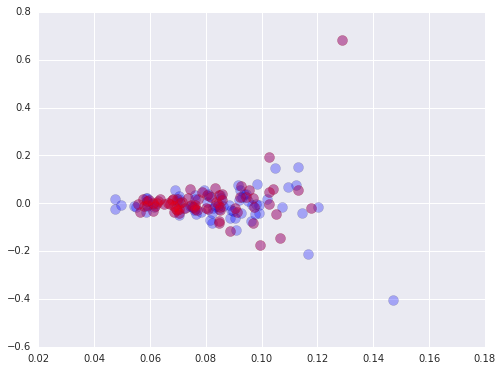

PCAdf shape is 142_12
generating TCRdf only for PNP samples from the matched samples:
loading existing TCR: datasetName=MatchedSamples_ss5000rep4, minNshared=2
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep4/sharingAnalysis/sharingMatrix_MatchedSamples_ss5000rep4_minNshared2_RA_onlyProductiveTrue
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep4/PNPmatchedSampleList_sharingAnalysis/sharingMatrix_MatchedSamples_ss5000rep4_minNshared2_RA_onlyProductiveTrue
load completed
checking if RA values are percentage values or real RA values:
the minimal value of the DF is 0.0002
RA values are real RA values, no division is required
Number of analyzed units (seqs/species/genus) is 7316
filename is /net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep4/PNPmatchedSampleList_sharingAnalysis/sharingMatrix_MatchedSamples_s

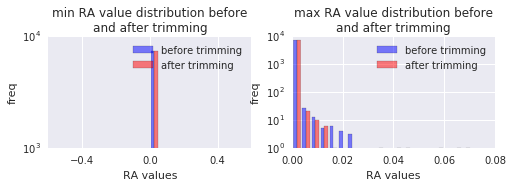

binarizing df...
existing values in df are now:
[0. 1.]
final file name is:
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep4/PNPmatchedSampleList_sharingAnalysis/sharingMatrix_MatchedSamples_ss5000rep4_minNshared2_RA_onlyProductiveTrue__minSharedT2_OLtrimmed
plotting mean sample distributions for all generated dfs...
0 (71, 7316)
1 (71, 7316)
2 (71, 7316)


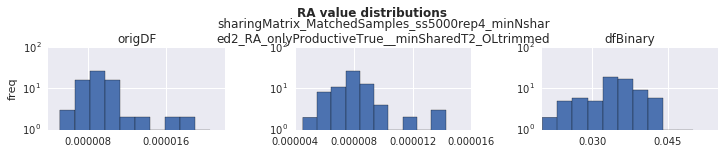

plotting RA value distributions for all generated dfs IN A RANDOM SAMPLE


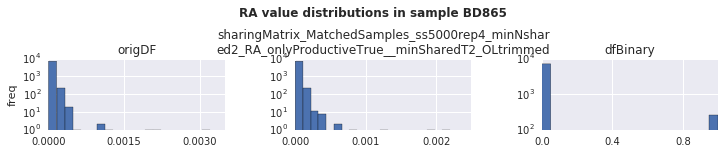

saving df to file...
saving binary df to file
ALL is done!!!
generating TCRdf only for Cardio samples from the matched samples:
loading existing TCR: datasetName=MatchedSamples_ss5000rep4, minNshared=2
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep4/sharingAnalysis/sharingMatrix_MatchedSamples_ss5000rep4_minNshared2_RA_onlyProductiveTrue
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep4/CardioMatchedSampleList_sharingAnalysis/sharingMatrix_MatchedSamples_ss5000rep4_minNshared2_RA_onlyProductiveTrue
load completed
checking if RA values are percentage values or real RA values:
the minimal value of the DF is 0.0002
RA values are real RA values, no division is required
Number of analyzed units (seqs/species/genus) is 7133
filename is /net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep4/CardioMatchedSampleLis

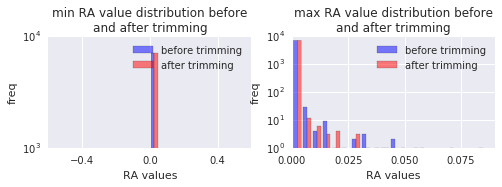

binarizing df...
existing values in df are now:
[0. 1.]
final file name is:
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss5000rep4/CardioMatchedSampleList_sharingAnalysis/sharingMatrix_MatchedSamples_ss5000rep4_minNshared2_RA_onlyProductiveTrue__minSharedT2_OLtrimmed
plotting mean sample distributions for all generated dfs...
0 (71, 7133)
1 (71, 7133)
2 (71, 7133)


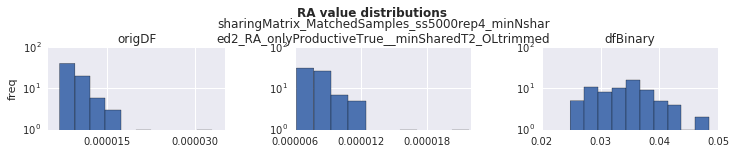

plotting RA value distributions for all generated dfs IN A RANDOM SAMPLE


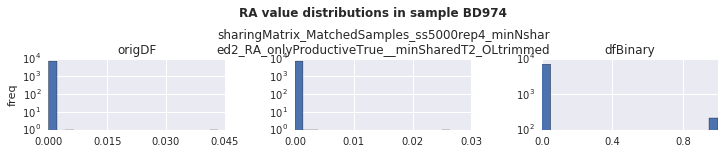

saving df to file...
saving binary df to file
ALL is done!!!
loading seperate minSharedT2 TCRdfs for PNP
PNP TCRdf shape is 71_7316
PNP TCRdf head:
       CAIGGSYNEQFF  CAIGQGTEAFF  CAINRGNTEAFF  CAIRDRGSYEQYF
BD101           0.0          0.0           0.0            0.0
BD106           0.0          0.0           0.0            0.0
BD124           0.0          0.0           0.0            0.0
BD149           0.0          0.0           0.0            0.0
loading number of unique sequences per sample:
loading uniqueSeqWithCounts....
loading seperate minSharedT2 TCRdfs for Cardio
Cardio TCRdf shape is 71_7133
Cardio TCRdf head:
        CAINGGSTDTQYF  CAIRDSSGANVLTF  CAISDSTDTQYF  CAISDYRTGGSSPLHF
BD1001            0.0             0.0           0.0               0.0
BD1002            0.0             0.0           0.0               0.0
BD1003            0.0             0.0           0.0               0.0
BD1004            0.0             0.0           0.0               0.0
loading number of

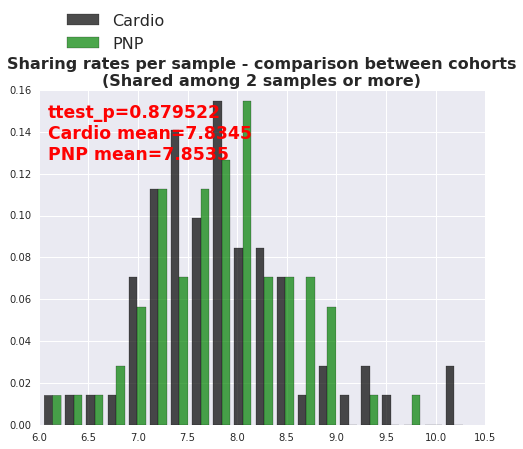

number of sequence shared by 2 or more samples in both cohorts: 1592 (12.3765840006 perc)
number of sequence shared by 2 or more samples only in the PNP cohort: 5726 (44.5152763741 perc)
number of sequence shared by 2 or more samples only in the Cardio cohort: 5545 (43.1081396253 perc)
total=12863
merged public list length length=12863


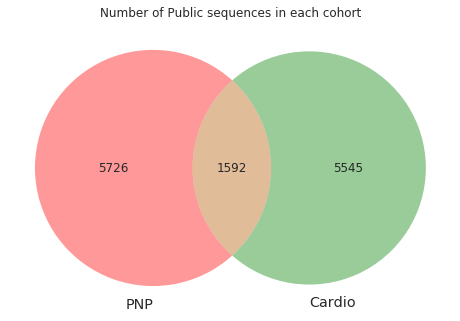

analyzing public sequence identities...
0 AllDB
ThresholdToOther is 0.04, total counts=26189, final threshold for chi square is 1047.56
1 Both
ThresholdToOther is 0.04, total counts=1672, final threshold for chi square is 66.88
2 onlyPNP
ThresholdToOther is 0.04, total counts=5756, final threshold for chi square is 230.24
3 onlyCardio
ThresholdToOther is 0.04, total counts=5569, final threshold for chi square is 222.76
count2       CMV  Influenza  Other     nan
onlyPNP      0.0        0.0  295.0  5461.0
onlyCardio   0.0        0.0  256.0  5313.0
Both        91.0       98.0  179.0  1304.0
count2      CMV  Influenza  Other     nan
onlyPNP     0.0        0.0  295.0  5461.0
onlyCardio  0.0        0.0  256.0  5313.0
count2    CMV  Influenza  Other     nan
onlyPNP   0.0        0.0  295.0  5461.0
Both     91.0       98.0  179.0  1304.0
count2       CMV  Influenza  Other     nan
onlyCardio   0.0        0.0  256.0  5313.0
Both        91.0       98.0  179.0  1304.0


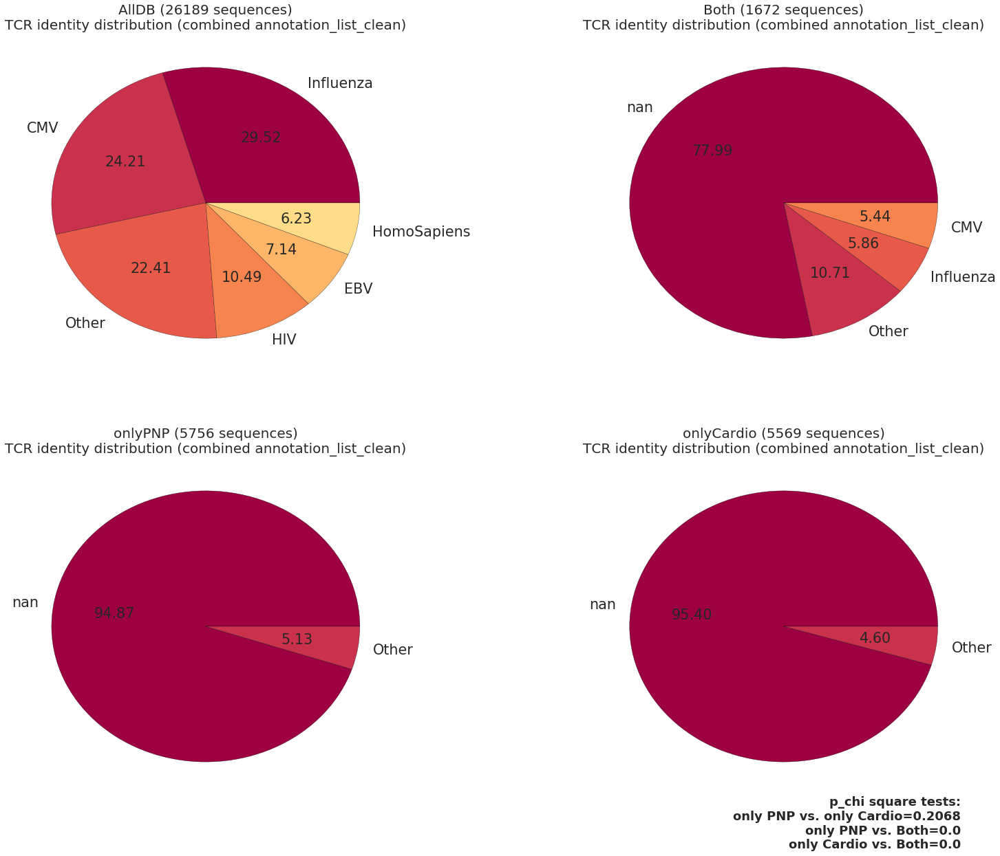

end of function!


In [15]:
ss=5000
repeat=4

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)

PNPListFile='%s/PNP530ss5000rep4_samples_matchedTo_Cardio126ss5000rep4_n71_resByGenderMaleAgeHbA1CSmoking StatusYes_rs1' %datasetFolder
with open(PNPListFile,'rb') as fp:
    PNPmatchedSampleList=pickle.load(fp)

CardioListFile='%s/Cardio126ss5000rep4_samples_matchedTo_PNP530ss5000rep4_n71_resByGenderMaleAgeHbA1CSmoking StatusYes_rs1' %datasetFolder
with open(CardioListFile,'rb') as fp:
    CardioMatchedSampleList=pickle.load(fp)
    
delFolderFirst=False
copySamples=False

compareFeatures=False

genOrigComTCRdf=False
genComTCRdf=False
n_comp=10
percSharedCom=None

compareSharing=True
genSepTCRdf=True
nSharedMin=2
identityFile='%s/TCR CDR3 sequence databases/combined annotation_list_clean_popped.xlsx' %MyPath
identityDF=pd.read_excel(identityFile)
identityDFname='popped'
identityColumnForPie='combined annotation_list_clean' #'Epitopespecies_VDJDB'/'Pathology_McPAS'
ThresholdToOther=0.04
dropnaFromIdentitiesPie=False
RemoveSamplesWithRelative=False

FeatureMeanSummary_all_dataSets=compareTCRforMatchedCohorts(ss,repeat,PNPmatchedSampleList,CardioMatchedSampleList,
                            copySamples,compareFeatures,compareSharing, genSepTCRdf,nSharedMin,delFolderFirst,
                            genOrigComTCRdf,genComTCRdf,n_comp,percSharedCom,identityColumnForPie,dropnaFromIdentitiesPie,
                            ThresholdToOther,identityDF,identityDFname,RemoveSamplesWithRelative)



### run for not-including relatives

In [ ]:
# ss=5000
# repeat=4

# datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)

# PNPListFile='%s/PNP530ss5000rep4_relRemoved_samples_matchedTo_Cardio126ss5000rep4_matchedToRelRemoved_n61_resByGenderMaleAgeHbA1CSmoking StatusYes_rs4' %datasetFolder
# with open(PNPListFile,'rb') as fp:
#     PNPmatchedSampleList=pickle.load(fp)

# CardioListFile='%s/Cardio126ss5000rep4_matchedToRelRemoved_samples_matchedTo_PNP530ss5000rep4_relRemoved_n61_resByGenderMaleAgeHbA1CSmoking StatusYes_rs4' %datasetFolder
# with open(CardioListFile,'rb') as fp:
#     CardioMatchedSampleList=pickle.load(fp)
    
# delFolderFirst=True
# copySamples=True

# compareFeatures=True

# genOrigComTCRdf=True
# genComTCRdf=True
# n_comp=10
# percSharedCom=10

# compareSharing=True
# genSepTCRdf=True
# nSharedMin=1
# identityFile='%s/TCR CDR3 sequence databases/combined annotation_list_clean_popped.xlsx' %MyPath
# identityDF=pd.read_excel(identityFile)
# identityDFname='popped'
# identityColumnForPie='combined annotation_list_clean' #'Epitopespecies_VDJDB'/'Pathology_McPAS'
# ThresholdToOther=0.04
# dropnaFromIdentitiesPie=False
# RemoveSamplesWithRelative='done'

# FeatureMeanSummary_all_dataSets=compareTCRforMatchedCohorts(ss,repeat,PNPmatchedSampleList,CardioMatchedSampleList,
#                             copySamples,compareFeatures,compareSharing, genSepTCRdf,nSharedMin,delFolderFirst,
#                             genOrigComTCRdf,genComTCRdf,n_comp,percSharedCom,identityColumnForPie,dropnaFromIdentitiesPie,
#                             ThresholdToOther,identityDF,identityDFname,RemoveSamplesWithRelative)



## clean featureDF - remove nanas, constant and fully correlated

1. take feature DF of the relevant ss and repeat
2. run remove correlated
3. explore file
4. delete constant
5. fillna
6. save to file

In [ ]:
the function process_featureDF was copied to  TCR_feature_generation.py

In [16]:
#generate and load relevant feature DF:
ss=5000
repeat=4

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
sampleListName=datasetName


TCRfeatureDF_matched=gen_featureDF_for_MatchedCohorts(ss,repeat,sampleList,sampleListName)

getting TCRfeature DF...
TCR feature DF shape is 142_710


/home/sbenari/workspace/Microbiome/ShaniBA/TCR_feature_generation/TCR_feature_generation_functions.py:1287: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  TCRfeatureDF=pd.concat([PNPfeatureDF,CardiofeatureDF])


In [17]:
#process feature df:
corrThreshold=1
featureDFfile='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/featureSummaryDFs\
/MatchedSamples_ss%srep%s_MatchedSamples_ss%srep%s_allFeatures' %(MyPath,ss,repeat,ss,repeat,ss,repeat)
featureDF=pd.read_pickle(featureDFfile)
featureDF,featureDFnameAddition=process_featureDF(featureDF,corrThreshold)

removing all columns correlated to other column by r=1 or more
TCR feature DF shape after loading and before any removal  is 142_710
removing feature columns with less than 5 samples that are not nan...
['D01_J01-03_0', 'D01_J01-03_1', 'D01_J01-03_T', 'D02_J01-03_0', 'J01-03_0', 'V03-01_1', 'V03-02_0', 'V03-02_1', 'V03_J01_1', 'V03_J02_1', 'V08-02_0', 'V08-02_1', 'V08-02_T', 'V08_0', 'V08_1', 'V08_J01_0', 'V08_J01_1', 'V08_J01_T', 'V08_J02_0', 'V08_J02_1', 'V08_J02_T', 'V08_T', 'V17-01_0', 'V17-01_1', 'V17_0', 'V17_1', 'V17_J01_0', 'V17_J01_1', 'V17_J01_T', 'V17_J02_0', 'V17_J02_1', 'V17_J02_T', 'V22-01_0', 'V22-01_1', 'V22_0', 'V22_1', 'V22_J01_0', 'V22_J01_1', 'V22_J01_T', 'V22_J02_0', 'V22_J02_1', 'V23-or09_02_0', 'V23-or09_02_T', 'V26-01_1', 'V26_1', 'V26_J01_0', 'V26_J01_1', 'V26_J01_T', 'V26_J02_1', 'VA_J01_1', 'normSeqNums_per2000_NT_0', 'normSeqNums_per200_AA_0', 'top1000clonal_aa_0', 'top1000clonal_nt_0']
number of such columns is 54
TCRfeatureDF shape after removing all colum

/usr/wisdom/python/lib/python2.7/site-packages/pandas/core/computation/expressions.py:180: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
/usr/wisdom/python/lib/python2.7/site-packages/scipy/stats/stats.py:3010: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den
/usr/wisdom/python/lib/python2.7/site-packages/scipy/stats/stats.py:3020: RuntimeWarning: invalid value encountered in double_scalars
  prob = _betai(0.5*df, 0.5, df/(df+t_squared))


D01_J01-05_0 V03_1 1.0
D01_J01-05_0 V03_J01_0 1.0
D01_J01-05_0 V22-01_T 1.0
D01_J01-05_0 V22_J02_T 1.0
D01_J01-05_0 V22_T 1.0
D01_J01-05_0 VA_J01_0 1.0
D02_J01-03_1 J01-03_1 1.0
D02_J01-03_1 V01_J01_1 1.0


/usr/wisdom/python/lib/python2.7/site-packages/scipy/stats/stats.py:3005: RuntimeWarning: Mean of empty slice.
  mx = x.mean()
/usr/wisdom/python/lib/python2.7/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/wisdom/python/lib/python2.7/site-packages/scipy/stats/stats.py:3006: RuntimeWarning: Mean of empty slice.
  my = y.mean()


D02_J01-03_1 V06-09_1 1.0
D02_J01-03_1 V16_J02_1 1.0
D02_J01-03_T J01-03_T 1.0
D02_J01-03_T V06-08_0 1.0
D02_J01-03_T V06-08_T 1.0
D02_J01-03_T V06-09_1 1.0
D02_J01-05_0 V03_J02_0 1.0
D02_J01-05_0 VA_J02_0 1.0
D02_J01-05_1 VA_J01_0 1.0
J01-03_1 V01_J01_1 1.0
J01-03_1 V16_J02_1 1.0
J01-03_1 VA-or09_02_T 1.0
J01-03_1 VA_J02_T 1.0
J01-03_1 VA_T 1.0
J01-03_T VA-or09_02_T 1.0
J01-03_T VA_J02_T 1.0
J01-03_T VA_T 1.0
J01-05_0 V03_1 1.0
J01-05_0 V22-01_T 1.0
J01-05_0 V22_J02_T 1.0
J01-05_0 V22_T 1.0
V01-01_0 V01_0 1.0
V01-01_1 V01_1 1.0
V01-01_T V01_T 1.0
V01_J01_0 V05-02_0 1.0
V01_J01_0 VA_J01_0 1.0
V01_J01_1 V03_1 1.0
V01_J01_1 VA_J01_T 1.0
V01_J02_1 VA_J02_1 1.0
V02-01_0 V02_0 1.0
V02-01_1 V02_1 1.0
V02-01_T V02_T 1.0
V03-01_0 V03_0 1.0
V03-01_0 V03_1 1.0
V03-01_0 V03_J01_0 1.0
V03-01_0 V03_J02_0 1.0
V03-01_0 V07-01_0 1.0
V03-01_0 V16-01_0 1.0
V03-01_0 V16_0 1.0
V03-01_0 V16_J02_0 1.0
V03-01_0 VA-or09_02_0 1.0
V03-01_0 VA_0 1.0
V03-01_0 VA_J02_0 1.0
V03-01_T V03-02_T 1.0
V03-01_T V05-02_T 1

In [18]:
newfeatureDFfilePickle=featureDFfile+'_'+featureDFnameAddition
featureDF.to_pickle(newfeatureDFfilePickle)

newfeatureDFfileExcel=featureDFfile+'_'+featureDFnameAddition+'.xlsx'
featureDF.to_excel(newfeatureDFfileExcel)

## predictions:

### get DFs:

In [21]:
ss=5000
repeat=4
datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
percShared=10
print datasetName


# phenotype df:
print 'getting phenotypeDF...'
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss%srep%s_phen_new_dummies.xlsx' %(MyPath,ss,repeat)
PNP_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss%srep%s_phen_new_dummies.xlsx' %(MyPath,ss,repeat)
Cardio_phen_new_dummies=pd.read_excel(f4).set_index('BD')

all_phen_new_dummies=pd.concat([PNP_phen_new_dummies,Cardio_phen_new_dummies])
matchedSamples_phen_new_dummies=all_phen_new_dummies.loc[sampleList,:]
print 'phenotype DF shape is %s_%s' %(matchedSamples_phen_new_dummies.shape[0],matchedSamples_phen_new_dummies.shape[1])
print matchedSamples_phen_new_dummies.iloc[:20,:4]
# print all_phen_new_dummies.tail()

#TCRdf:
print 'getting TCRdf...'

sharingFolder='%s/%s_sharingAnalysis' %(datasetFolder,datasetName)
TCRdfName='sharingMatrix_MatchedSamples_ss%srep%s_minNshared2_RA_onlyProductiveTrue__percShared%s_OLtrimmed\
_binary' %(ss,repeat, percShared) 
TCRdfFile='%s/%s' %(sharingFolder,TCRdfName )
print TCRdfFile
TCRdf=pd.read_pickle(TCRdfFile)
print 'TCRdf shape is %s_%s' %(TCRdf.shape[0],TCRdf.shape[1])
print TCRdf.iloc[:4,:4]

#Features
print 'getting TCRfeatureDF - wihtout highlt correlated columns...'
featureFilePickle2='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/featureSummaryDFs\
/MatchedSamples_ss%srep%s_MatchedSamples_ss%srep%s_allFeatures__noCorr_noConsts_nanFilled' %(MyPath,ss,repeat,ss,repeat,ss,repeat)
TCRfeatureDF2=pd.read_pickle(featureFilePickle2)
print 'TCRfeatureDF shape is %s_%s' %(TCRfeatureDF2.shape[0],TCRfeatureDF2.shape[1])
TCRfeatureDF2.iloc[:4,:4]


MatchedSamples_ss5000rep4
getting phenotypeDF...
phenotype DF shape is 142_80
               AST Admission Diagnosis  Admission Diagnosis_NSTEMI  \
BD                                                                   
BD1095   19.000000              NSTEMI                         1.0   
BD1073   18.000000              NSTEMI                         1.0   
BD908    27.000000                 NaN                         NaN   
BD640    24.000000                 NaN                         NaN   
BD834    21.000000                 NaN                         NaN   
BD656    21.000000                 NaN                         NaN   
BD1063   24.000000              NSTEMI                         1.0   
BD950   158.000000              NSTEMI                         1.0   
BD385    23.000000                 NaN                         NaN   
BD1004   30.000000               STEMI                         0.0   
BD1053  223.000000               STEMI                         0.0   
BD986    13.

/usr/wisdom/python/lib/python2.7/site-packages/ipykernel_launcher.py:20: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



,AA count_0,AA count_1,AA count_T,D01_0
BD1095,57.0,2877.0,2934.0,0.424490
BD1073,83.0,3581.0,3664.0,0.382353
BD908,49.0,2902.0,2951.0,0.412946
BD640,77.0,2351.0,2428.0,0.386000


### classification;

#### old functions:

preparing input DFs
predictions...
******k=12, featureComposition=phenotypesOnly,modelName=LogisticRegression, featureSelectionMethod=None*****takeOnlyT=True
taking only _T features:
y shape is 1099
y head:
BD1    0
BD2    0
BD3    0
BD4    0
BD5    0
Name: isCardio, dtype: int64
BD1095    1
BD1096    1
BD1097    1
BD1098    1
BD1099    1
Name: isCardio, dtype: int64
fillnas with column medians in phenotypeDF..
final phenotype shape is 142_12
phenotypeDF head:
        Smoking Status_Past  Smoking Status_Yes  Gender_Male   Age        BMI  \
BD1095                    0                   0            1  65.0  26.234568   
BD1073                    0                   1            1  64.0  25.381469   
BD908                     0                   0            1  63.0  27.681661   
BD640                     0                   0            1  67.0  37.910998   
BD834                     0                   0            1  65.0  24.163265   

        eGFR by CKD-EPI  HbA1C   AST  Hemoglobin

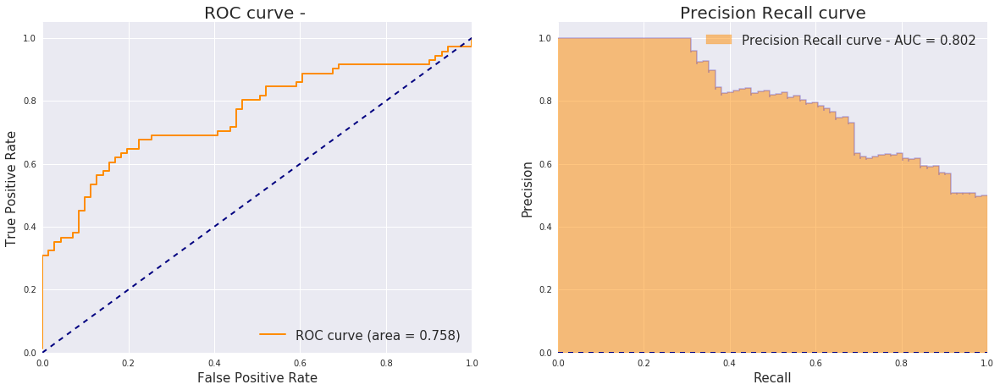

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypesOnly_onlyT_C10_penaltyl1_CV10.xlsx
      Yname                                           Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypesOnly_onlyT   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.758   0.802              0.5             0.302   

   useCV  featureSelectionMethod features used  total num features used  \
0   True                     NaN                                    0.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         12.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=12, featureComposition=phenotypesOnly,modelName=LogisticRegression, featureSelectionMethod=None*****takeOnlyT=False
y shape is 1099
y head:
BD1 

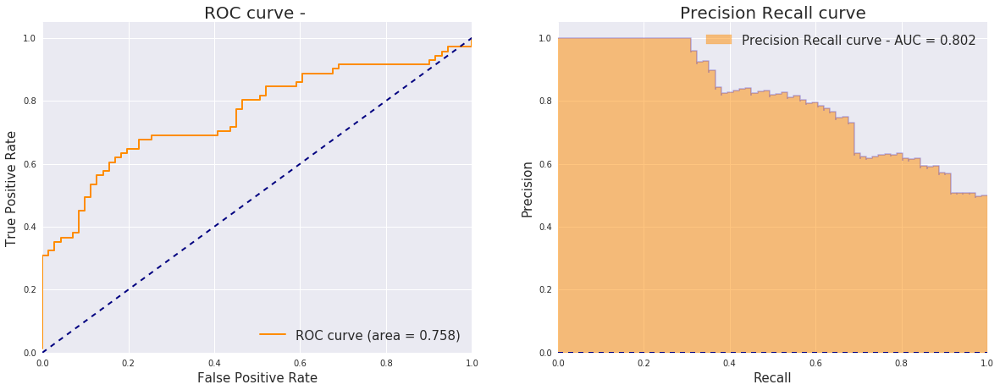

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypesOnly_onlyT_C10_penaltyl1_CV10.xlsx
      Yname                                           Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypesOnly_onlyT   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.758   0.802              0.5             0.302   

   useCV  featureSelectionMethod features used  total num features used  \
0   True                     NaN                                    0.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         12.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=12, featureComposition=phenotypesOnly,modelName=LGBMClassifier, featureSelectionMethod=None*****takeOnlyT=True
taking only _T features:
y shape 

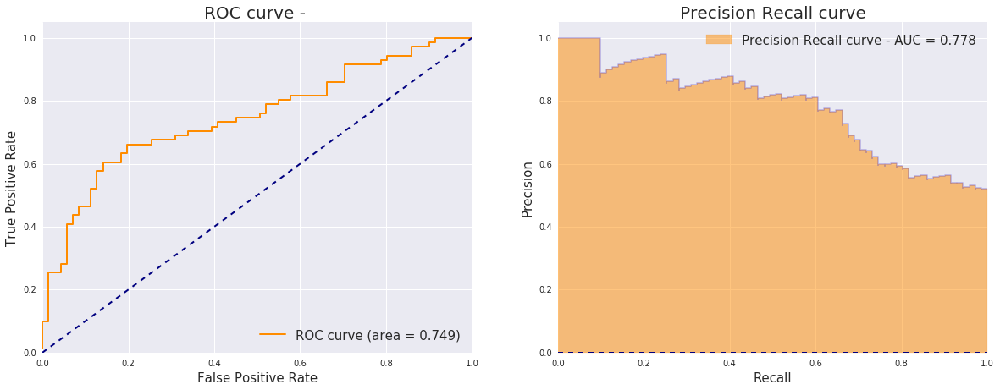

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypesOnly_onlyT_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                           Xname       modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypesOnly_onlyT  LGBMClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.749   0.778              0.5             0.278   True   

   featureSelectionMethod features used    ...     bagging_fraction  \
0                     NaN                  ...                  0.5   

   bagging_freq  bagging_seed  learning_rate  max_depth  n_estimators  \
0           1.0           3.0            0.1        3.0        1000.0   

   num_threads  nPos  nNeg     cdate  
0          2.0  71.0  71.0  06102018  

[1 rows x 23

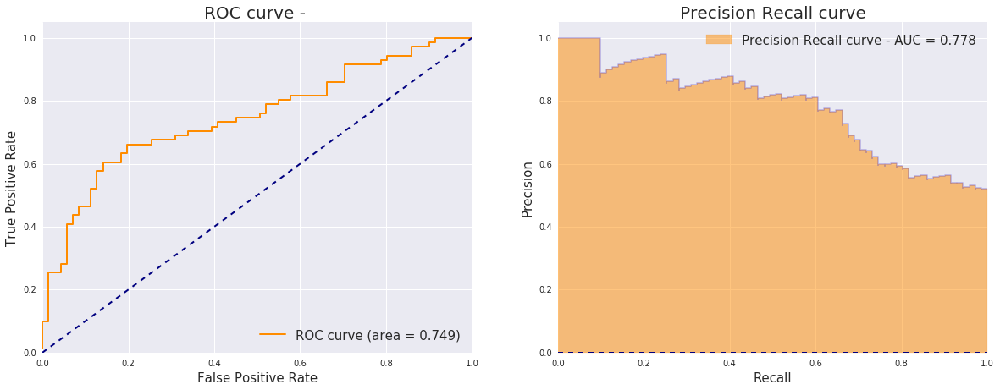

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypesOnly_onlyT_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                           Xname       modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypesOnly_onlyT  LGBMClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.749   0.778              0.5             0.278   True   

   featureSelectionMethod features used    ...     bagging_fraction  \
0                     NaN                  ...                  0.5   

   bagging_freq  bagging_seed  learning_rate  max_depth  n_estimators  \
0           1.0           3.0            0.1        3.0        1000.0   

   num_threads  nPos  nNeg     cdate  
0          2.0  71.0  71.0  06102018  

[1 rows x 23

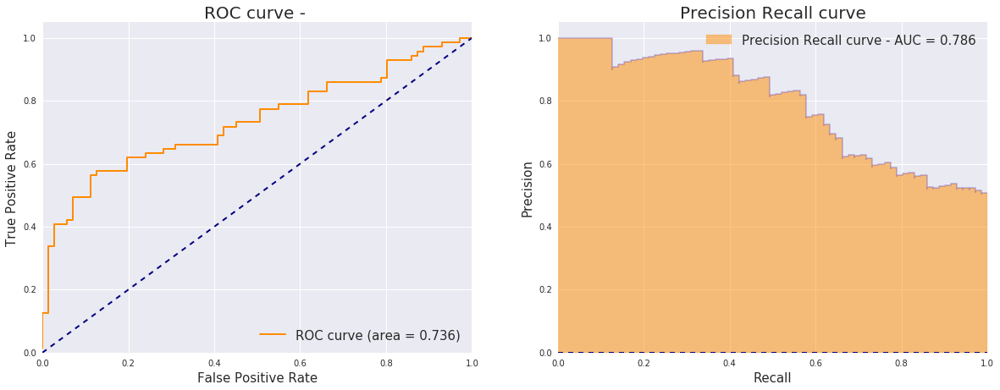

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypesOnly_onlyT_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                           Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypesOnly_onlyT  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.736   0.786              0.5             0.286   True   

   featureSelectionMethod features used    ...     bagging_fraction  \
0                     NaN                  ...                  0.5   

   bagging_freq  bagging_seed  learning_rate  max_depth  n_estimators  \
0           1.0           3.0           0.05        6.0         100.0   

   num_threads  nPos  nNeg     cdate  
0          2.0  71.0  71.0  06102018  

[1 rows x 23 co

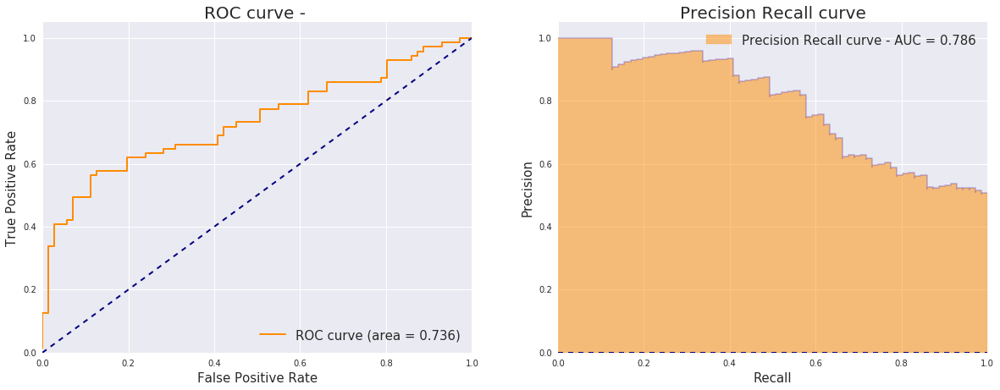

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypesOnly_onlyT_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                           Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypesOnly_onlyT  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.736   0.786              0.5             0.286   True   

   featureSelectionMethod features used    ...     bagging_fraction  \
0                     NaN                  ...                  0.5   

   bagging_freq  bagging_seed  learning_rate  max_depth  n_estimators  \
0           1.0           3.0           0.05        6.0         100.0   

   num_threads  nPos  nNeg     cdate  
0          2.0  71.0  71.0  06102018  

[1 rows x 23 co

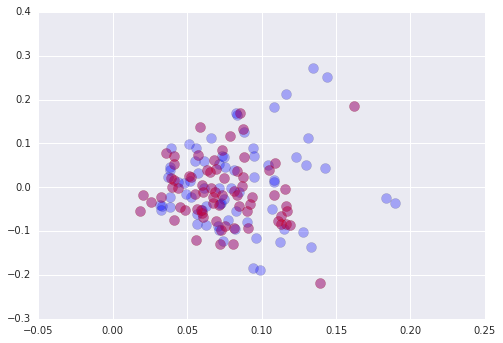

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

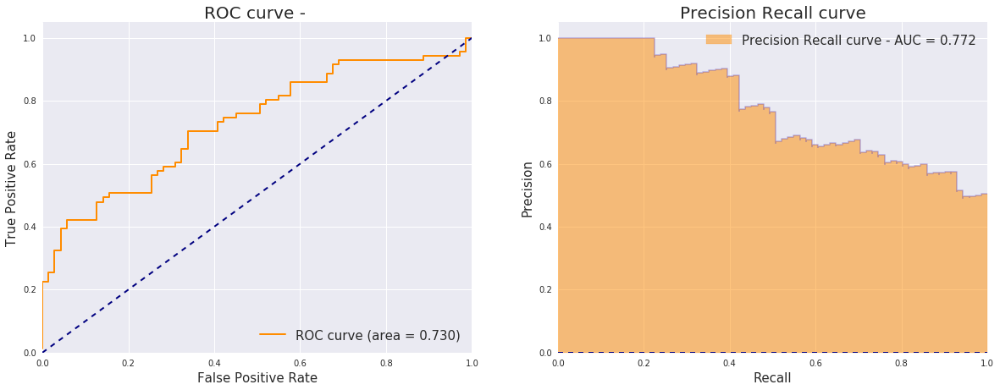

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif12_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression     0.73   0.772              0.5             0.272   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_T:10,HDL:9,V29...                     23.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         12.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
**

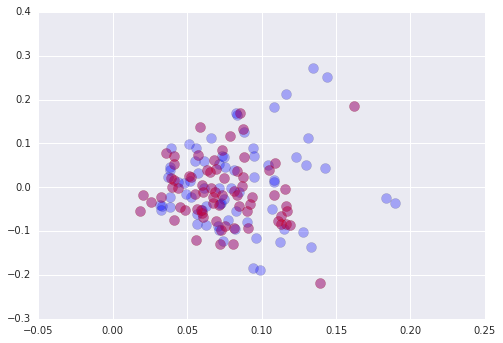

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

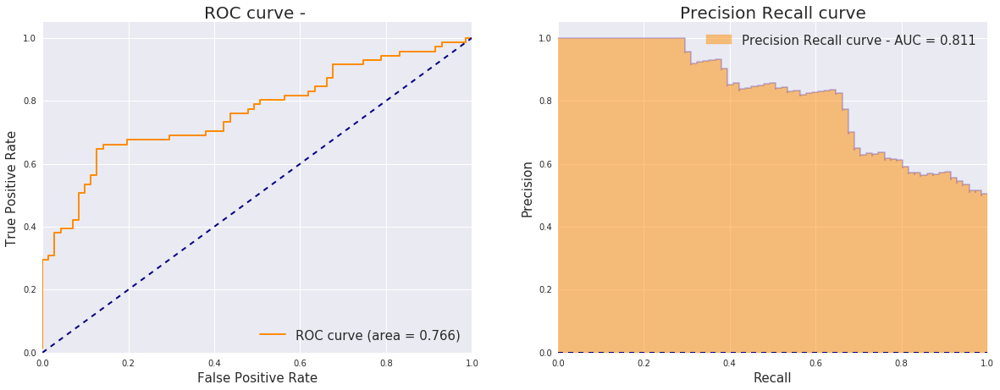

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif12_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.766   0.811              0.5             0.311   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...                     27.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         12.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
**

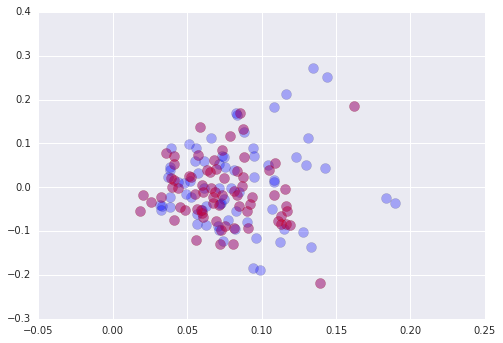

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

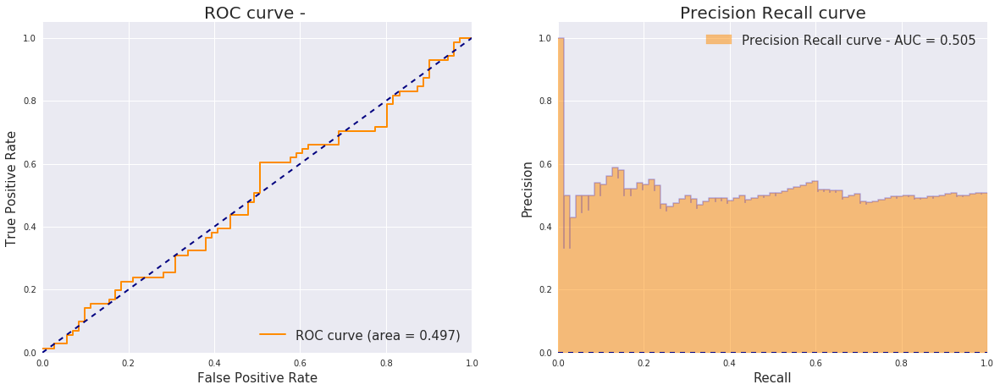

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom12_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.497   0.505              0.5             0.005   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,J01-02_T:3,D01_J02-02_T:3,cdr3Length_mean_T:3...                     97.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         12.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=12, featureComposition=phenotyp

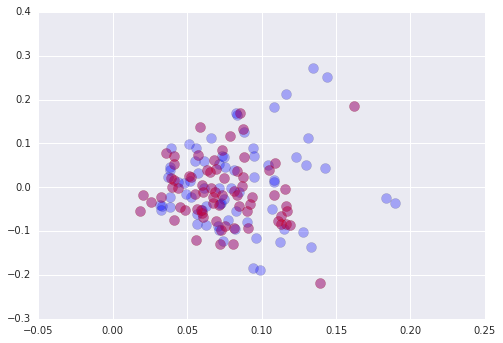

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

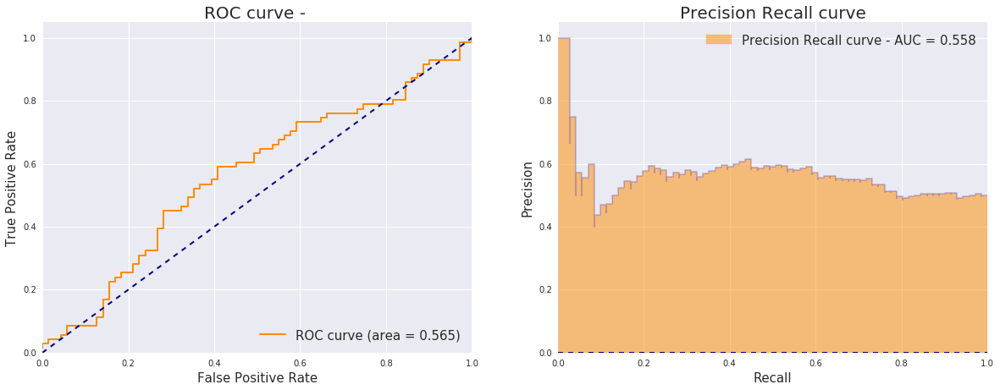

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom12_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.565   0.558              0.5             0.058   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,D02_J01-04_0:2,vDeletion_max_0:2,D01_J02-02_1...                    111.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         12.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=12, featureComposition=phenotyp

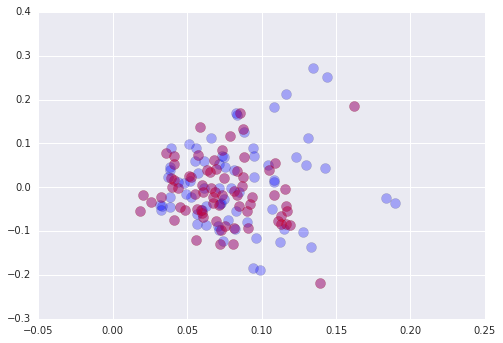

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

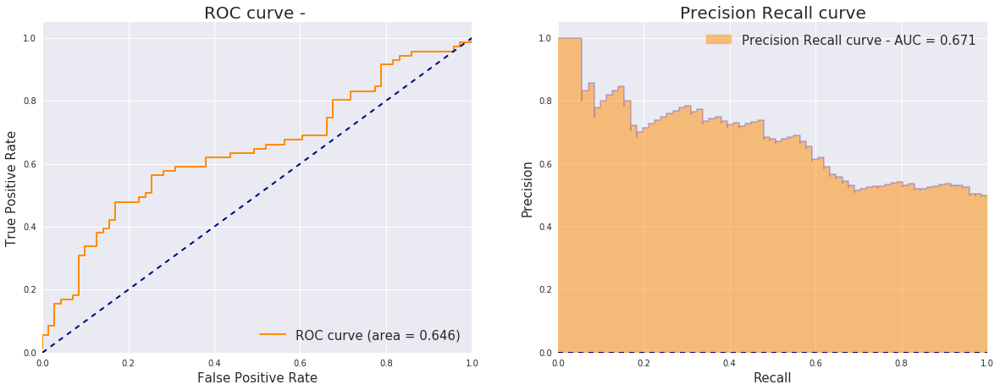

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.646   0.671              0.5             0.171   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_T:10,HDL:9,V29...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.0

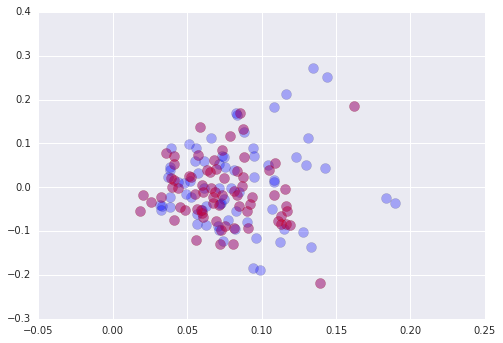

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

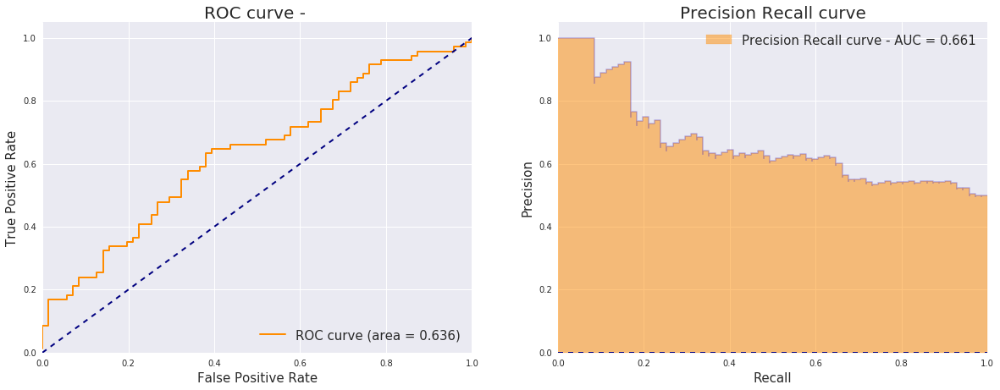

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.636   0.661              0.5             0.161   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.0

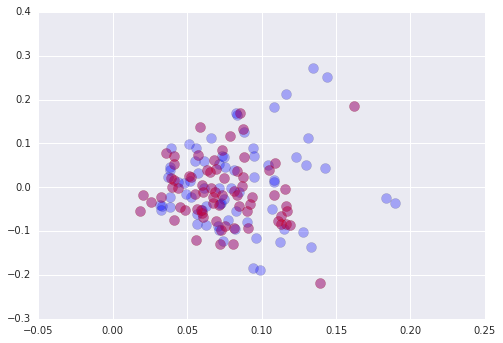

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

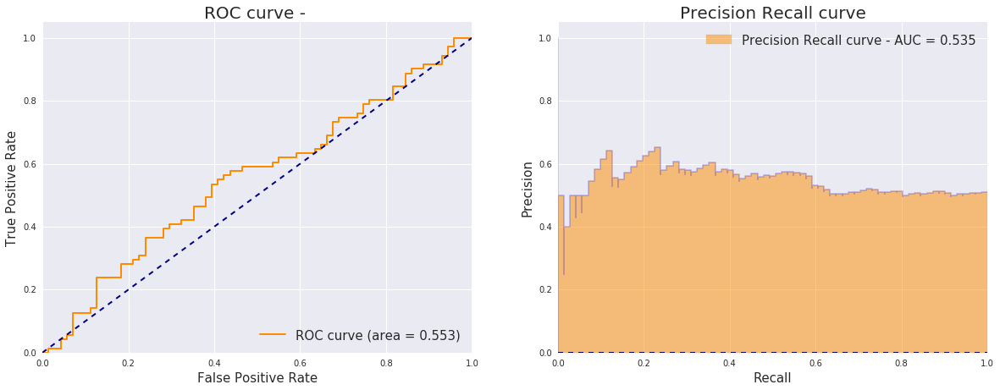

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.553   0.535              0.5             0.035   True   

  featureSelectionMethod                                      features used  \
0                 random  ,shannon_nt_T:3,V10_J02_T:3,V15_J01_T:3,V10-02...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_threads

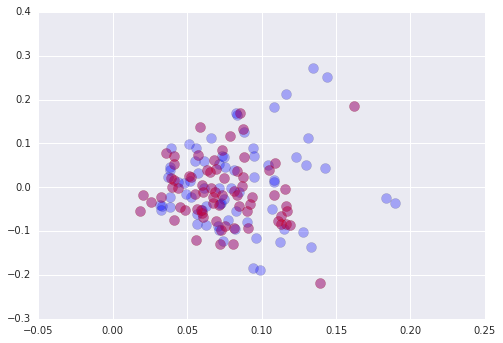

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

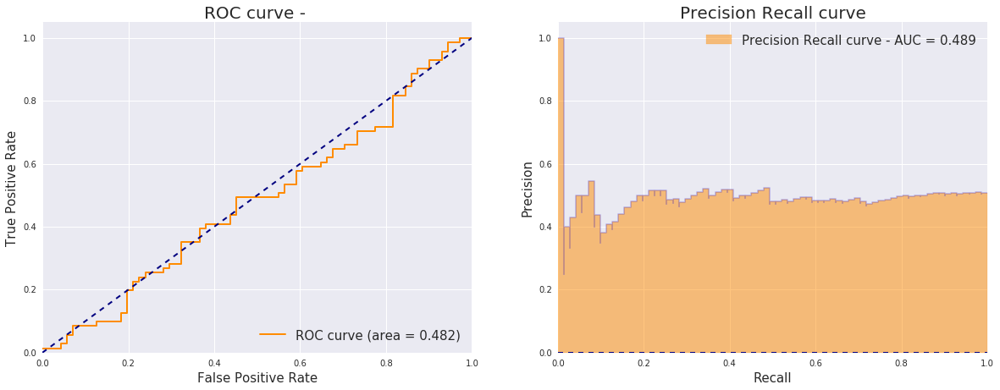

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.482   0.489              0.5            -0.011   True   

  featureSelectionMethod                                      features used  \
0                 random  ,mean_nt_per_aa_0:3,V12_J01_0:2,D01_J01-06_1:2...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_threads

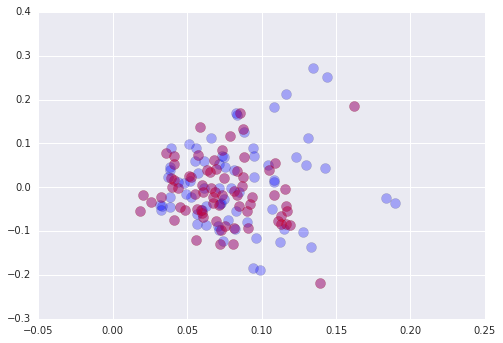

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

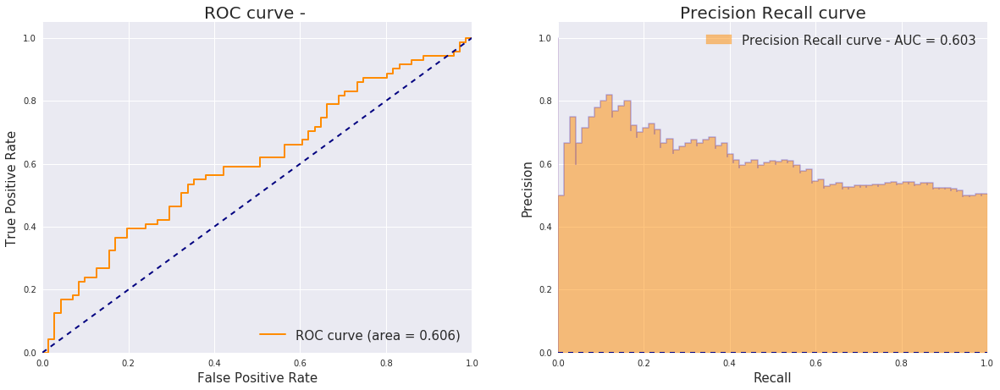

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.606   0.603              0.5             0.103   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,HDL:10,V10-01_T:10,V29-01_T:9,V29_J02_...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_thr

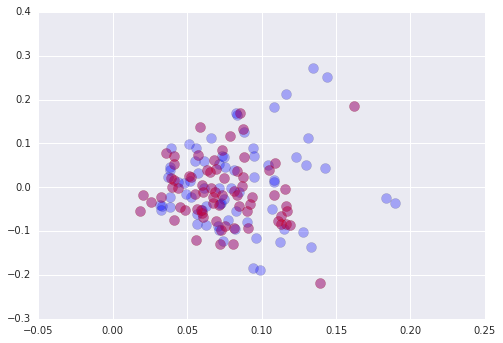

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

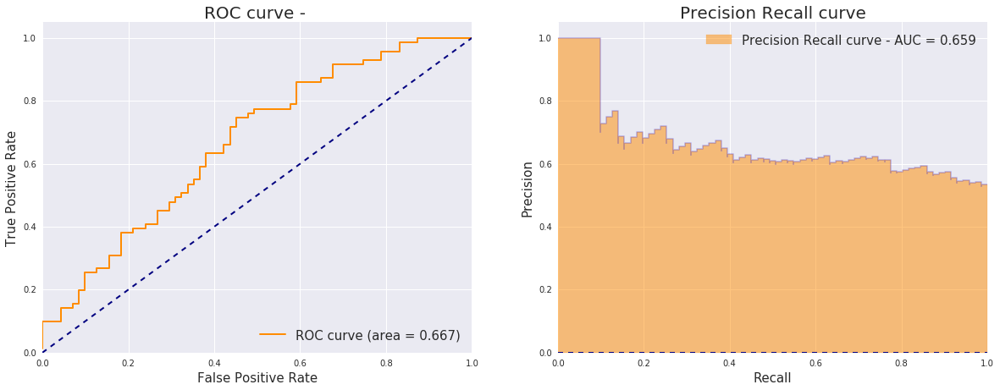

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.667   0.659              0.5             0.159   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,V09_J01_0:10,WBC:10,HDL:10,n2Insertion_mean_1...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_thr

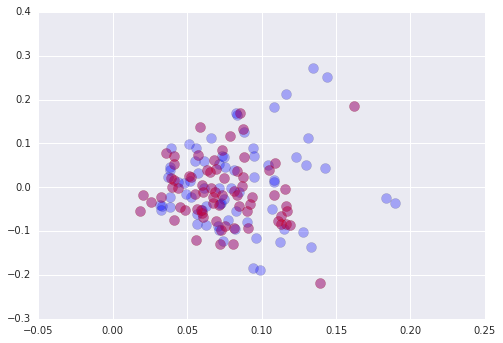

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

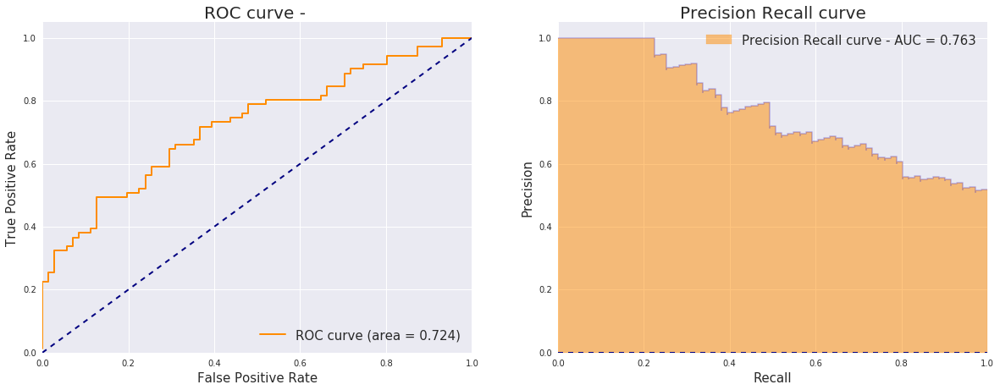

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.724   0.763              0.5             0.263   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_T:10,HDL:9,V29...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.0   

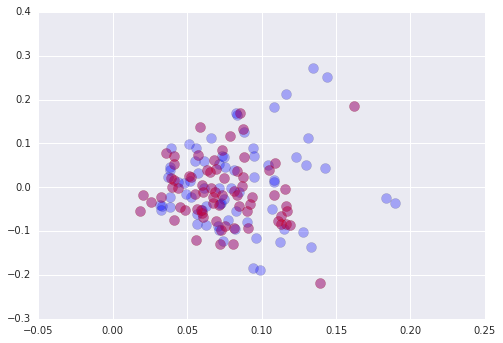

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

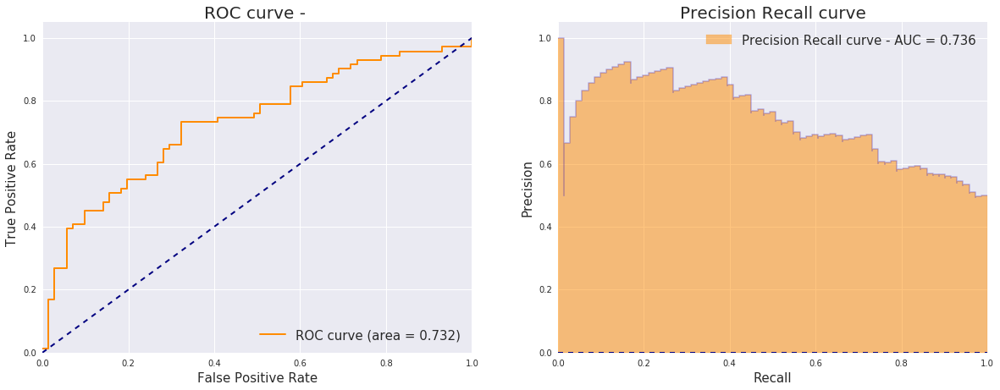

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.732   0.736              0.5             0.236   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.0   

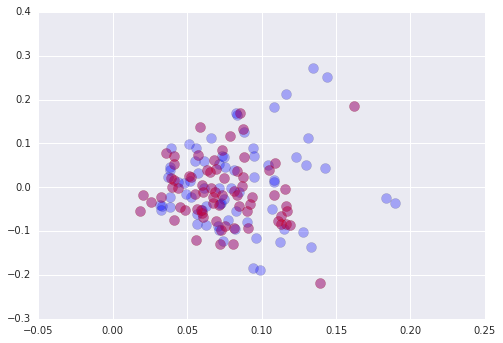

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

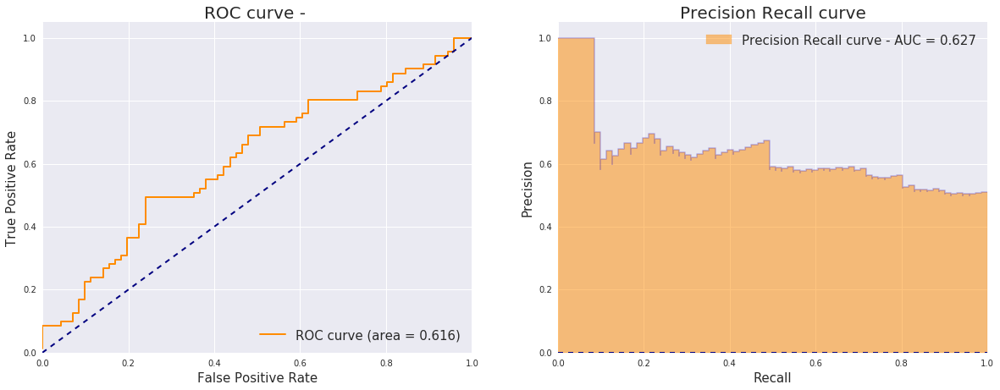

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.616   0.627              0.5             0.127   True   

  featureSelectionMethod                                      features used  \
0                 random  ,cdr3Length_std_T:3,V13_J02_T:3,V30_J02_T:3,V0...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_threads  n

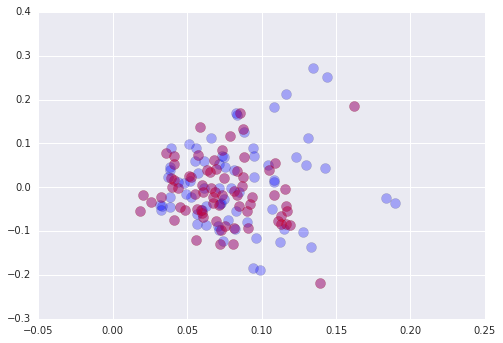

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

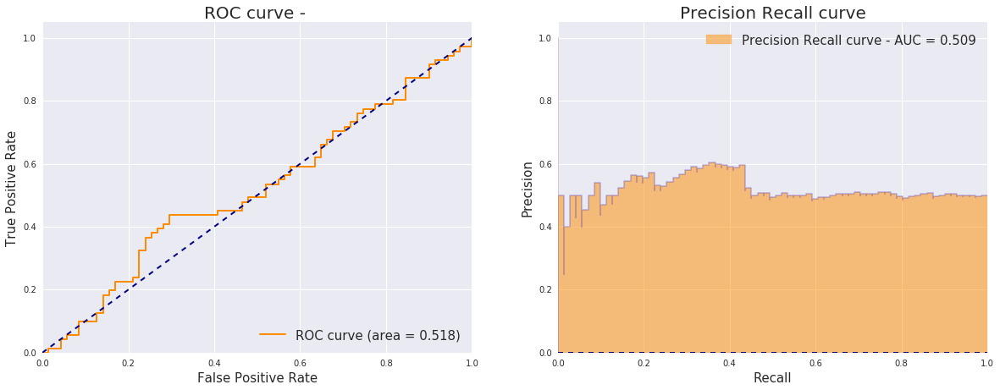

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.518   0.509              0.5             0.009   True   

  featureSelectionMethod                                      features used  \
0                 random  ,V09_J01_1:2,V28_J02_0:2,V03_J01_T:2,D01_J02-0...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_threads  n

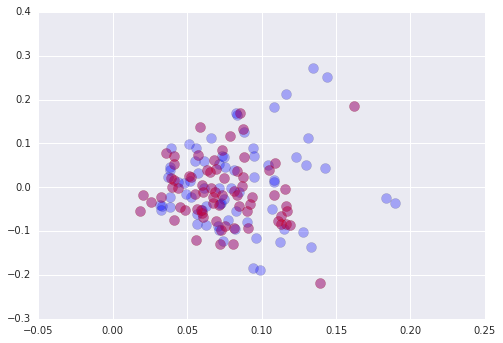

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

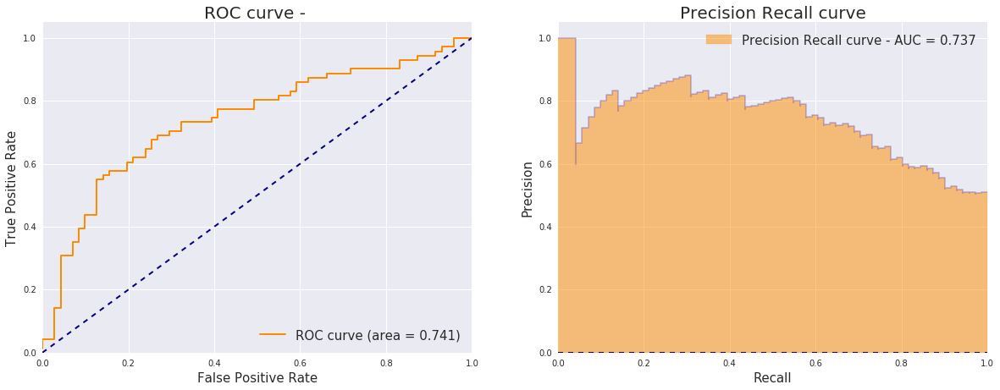

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.741   0.737              0.5             0.237   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,V29-01_T:8,V04-03_T:8,V12_J02_T:7,HDL:...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_thread

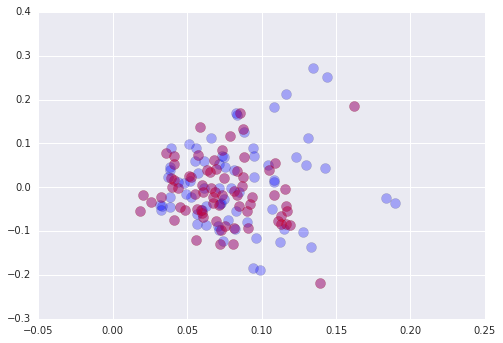

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

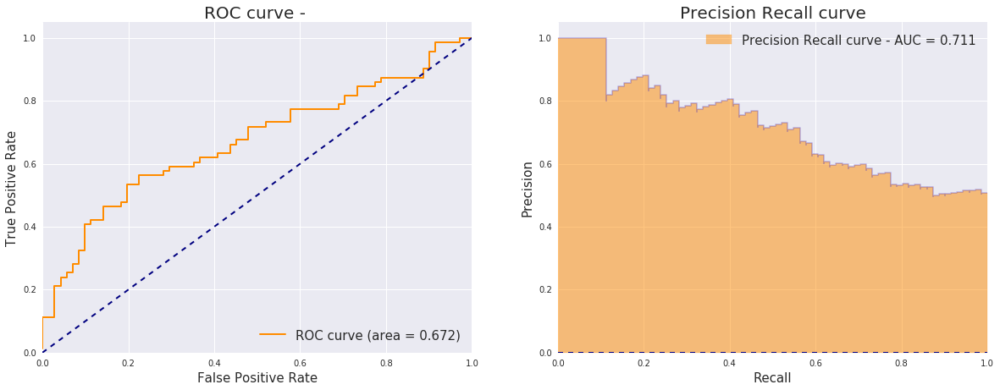

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.672   0.711              0.5             0.211   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,V12_1:8,d3Deletion_std_0:8,n2Insertion...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_thread

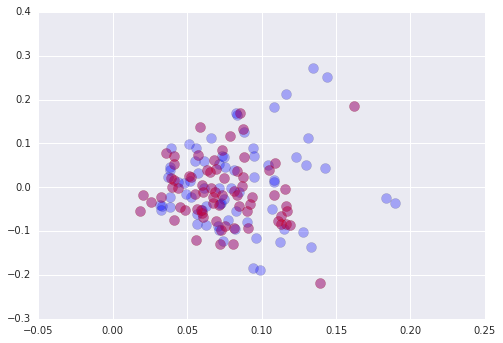

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

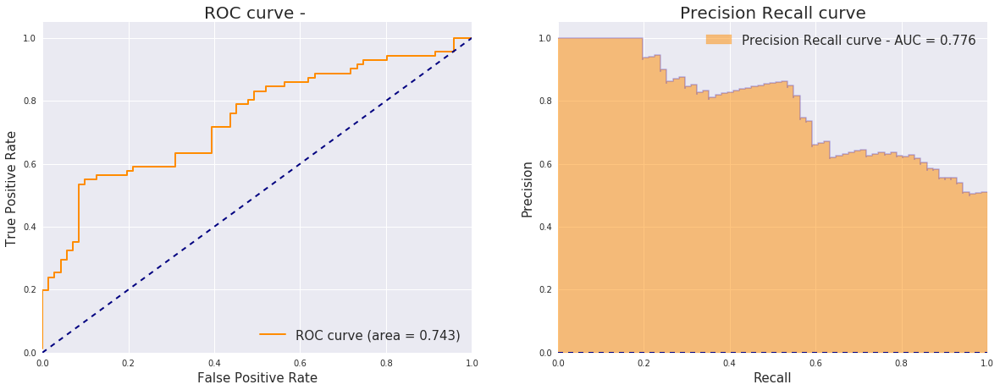

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif15_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.743   0.776              0.5             0.276   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,V12_J02_T:10,WBC:10,HDL:10,V12_T:10,AST:10,jD...                     30.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         15.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
**

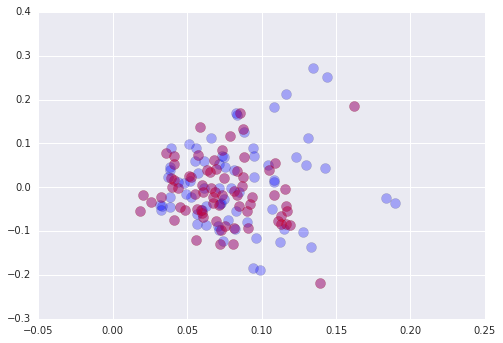

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

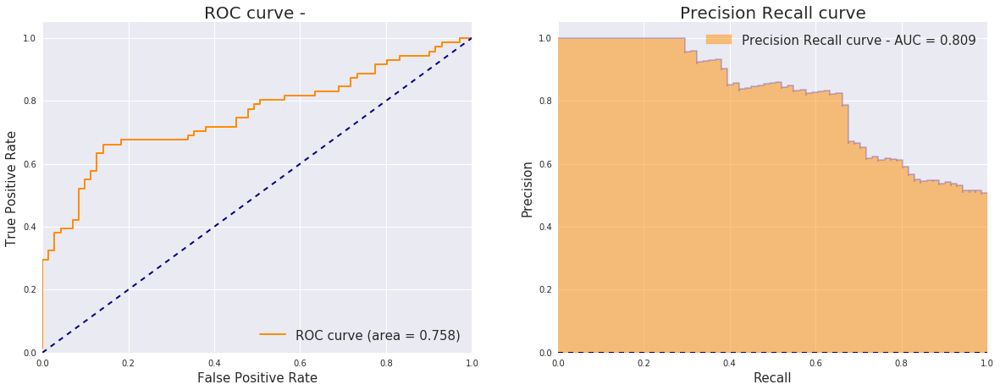

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif15_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.758   0.809              0.5             0.309   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...                     33.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         15.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
**

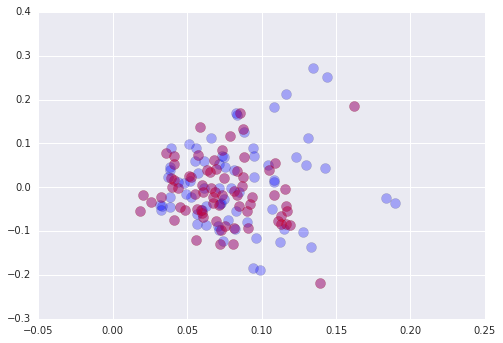

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

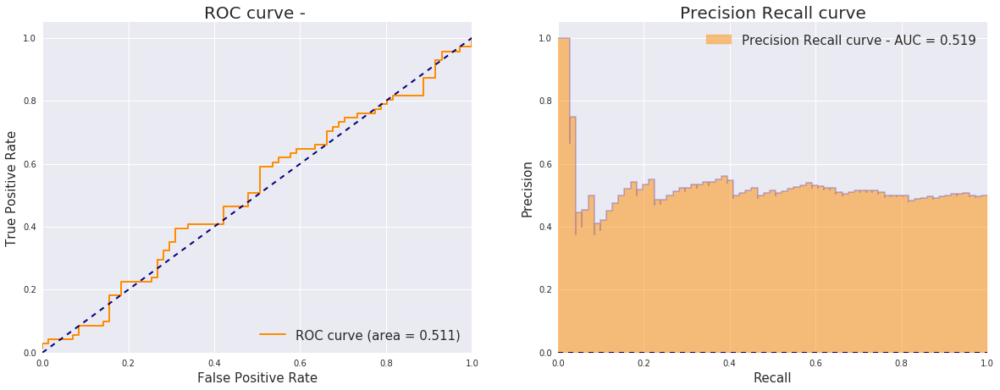

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom15_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.511   0.519              0.5             0.019   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,V10-02_T:4,V11-02_T:3,D02_J02-06_T:3,vDeletio...                    108.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         15.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=15, featureComposition=phenotyp

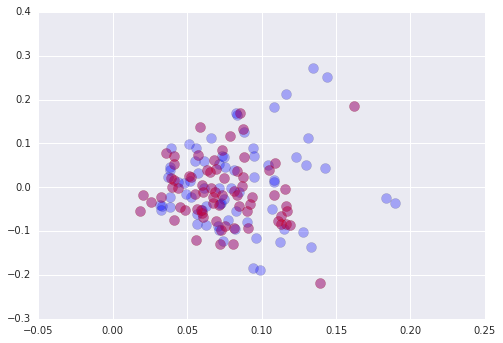

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

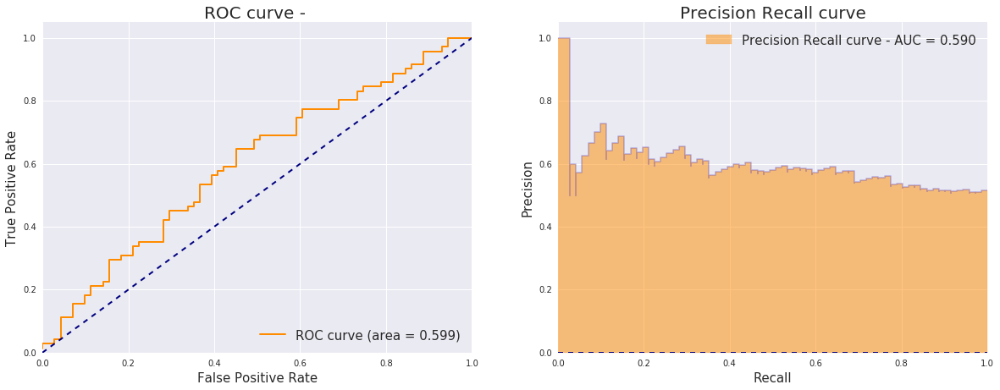

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom15_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.599    0.59              0.5              0.09   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,V03_J02_T:2,V02_J01_1:2,D02_J01-05_1:2,J02-03...                    132.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         15.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=15, featureComposition=phenotyp

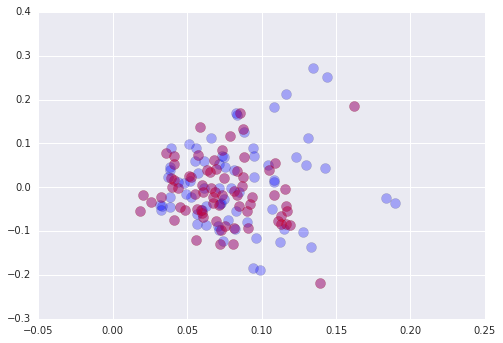

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

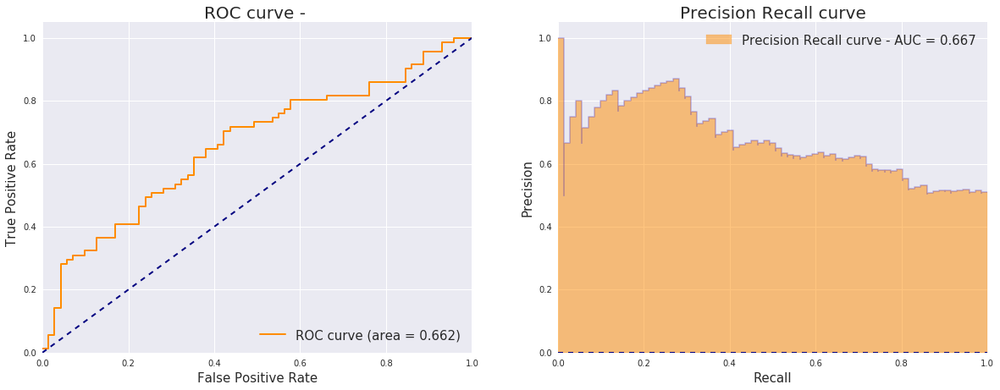

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.662   0.667              0.5             0.167   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,HDL:10,V12_T:10,AST:10,jD...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.0

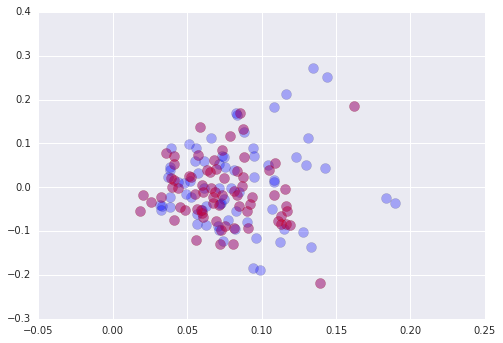

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

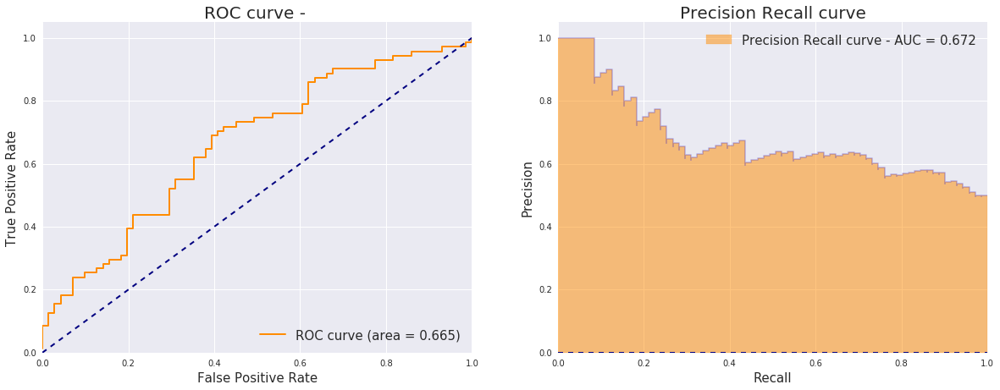

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.665   0.672              0.5             0.172   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.0

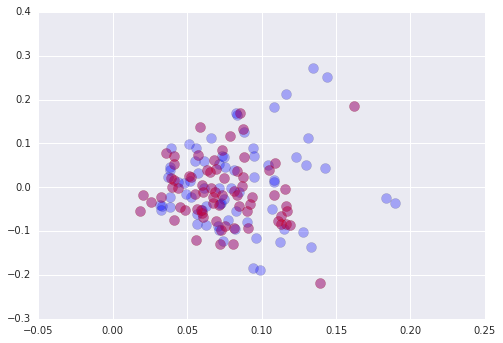

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

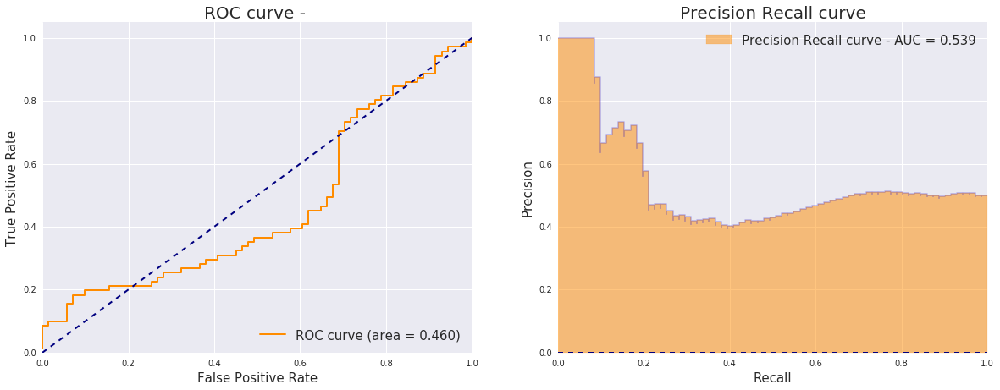

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier     0.46   0.539              0.5             0.039   True   

  featureSelectionMethod                                      features used  \
0                 random  ,eGFR by CKD-EPI:3,V03_T:3,V16_J02_T:3,jDeleti...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_threads

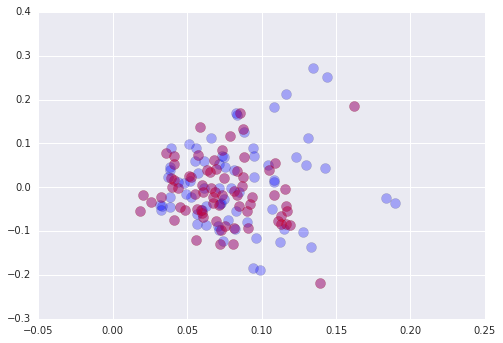

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

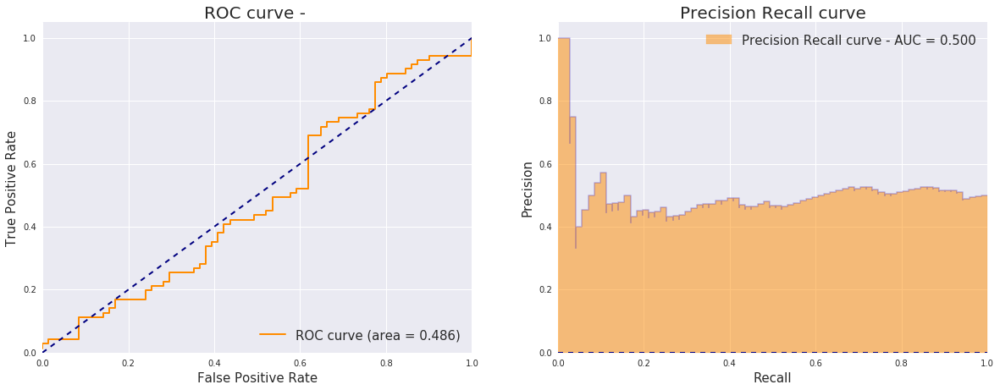

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.486     0.5              0.5               0.0   True   

  featureSelectionMethod                                      features used  \
0                 random  ,D02_J01-03_1:3,V04_J01_T:3,V23_J02_T:3,simpso...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_threads

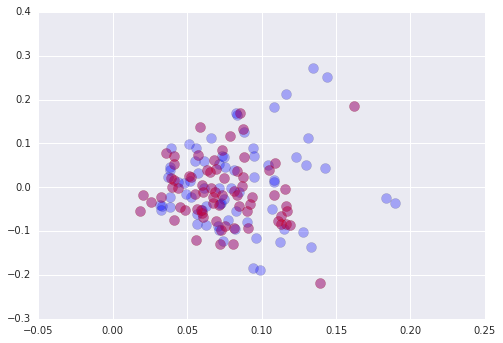

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

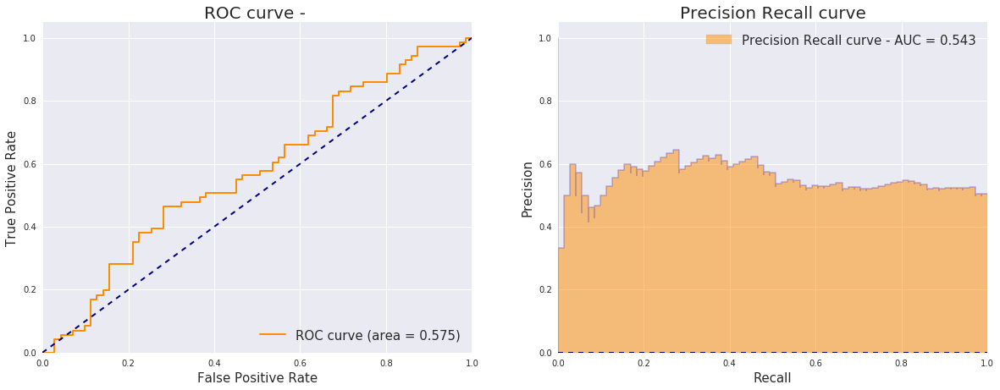

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.575   0.543              0.5             0.043   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,HDL:10,V10-01_T:10,V29-01_T:9,V29_J02_...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_thr

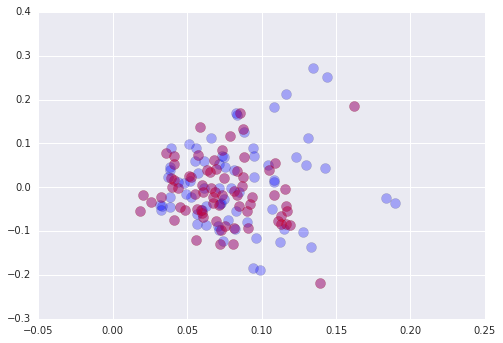

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

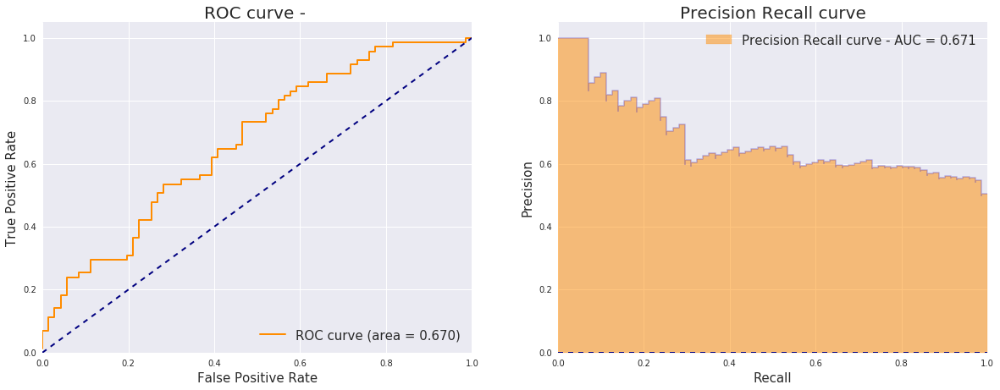

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier     0.67   0.671              0.5             0.171   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,V09_J01_0:10,WBC:10,HDL:10,n2Insertion_mean_1...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_thr

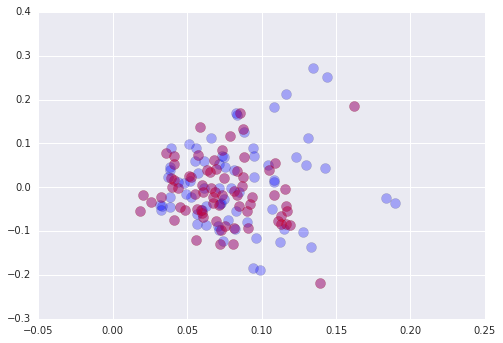

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

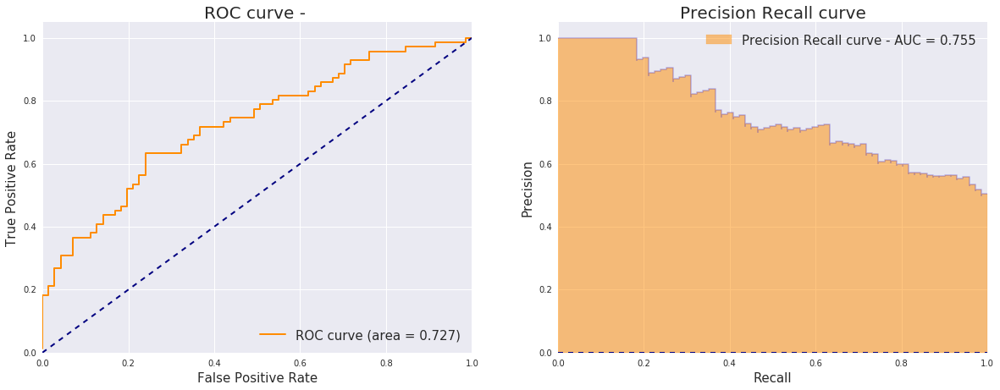

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.727   0.755              0.5             0.255   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,HDL:10,V12_T:10,AST:10,jD...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.0   

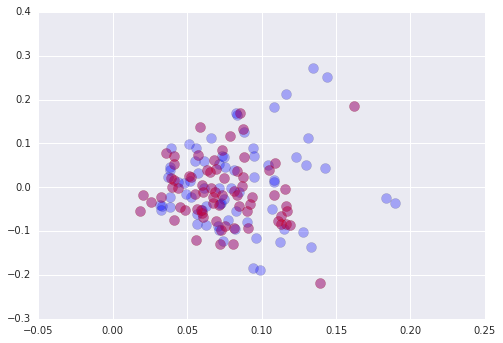

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

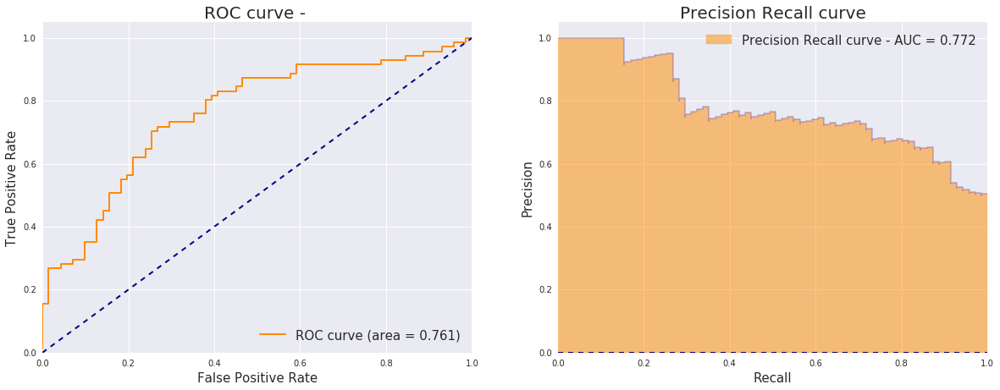

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.761   0.772              0.5             0.272   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.0   

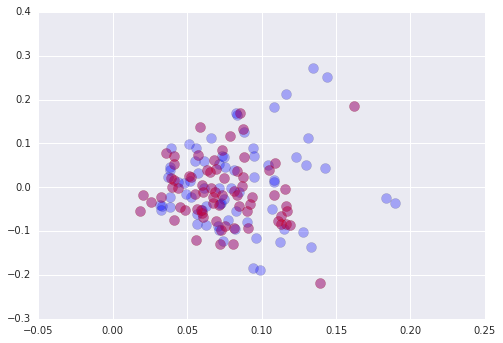

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

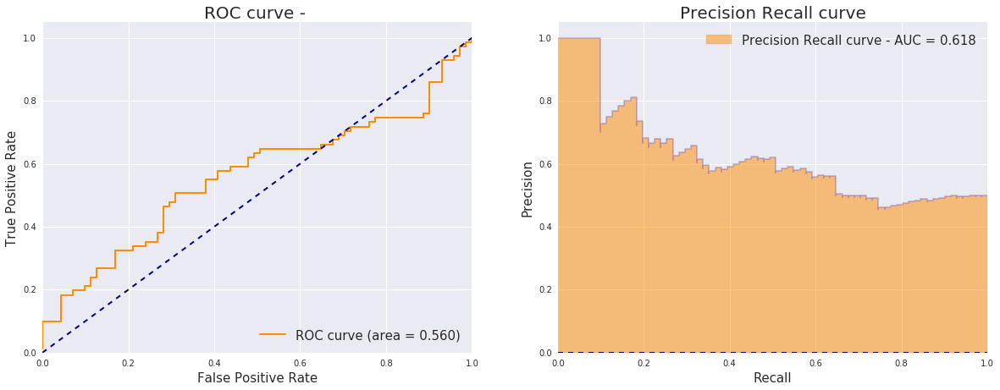

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0     0.56   0.618              0.5             0.118   True   

  featureSelectionMethod                                      features used  \
0                 random  ,V11-02_T:3,D01_J02-04_T:3,D02_J02-05_T:3,PC10...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_threads  n

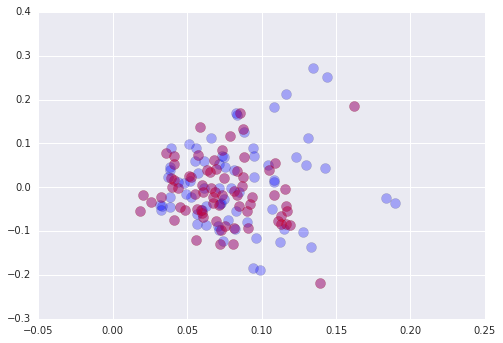

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

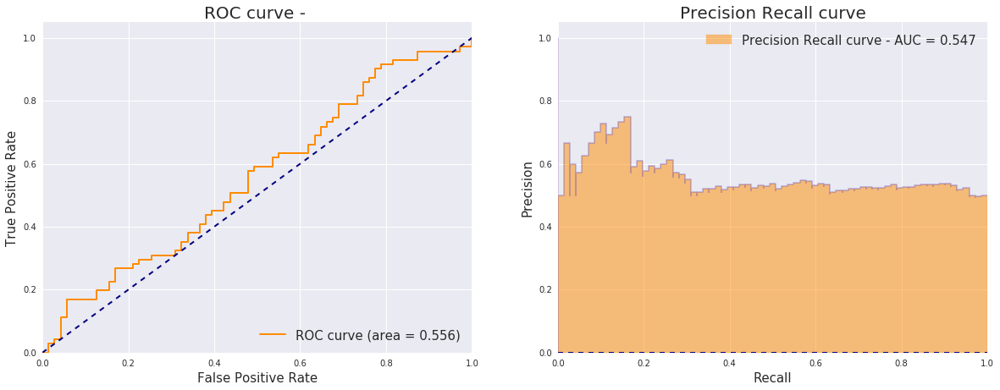

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.556   0.547              0.5             0.047   True   

  featureSelectionMethod                                      features used  \
0                 random  ,V09-01_T:3,V10-02_T:2,V13_J02_0:2,D02_J02-05_...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_threads  n

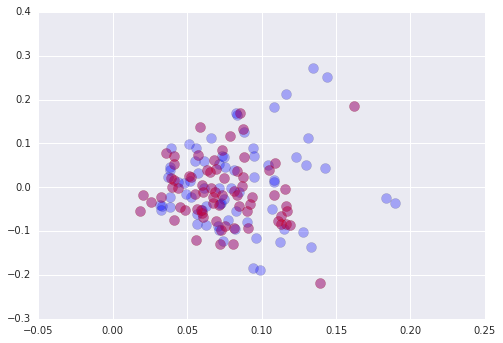

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

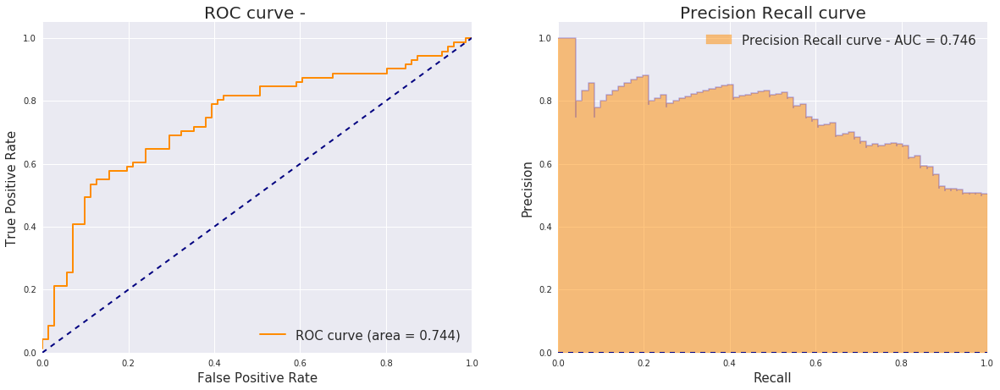

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.744   0.746              0.5             0.246   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,V29-01_T:9,V04-03_T:8,berger_aa_T:8,V1...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_thread

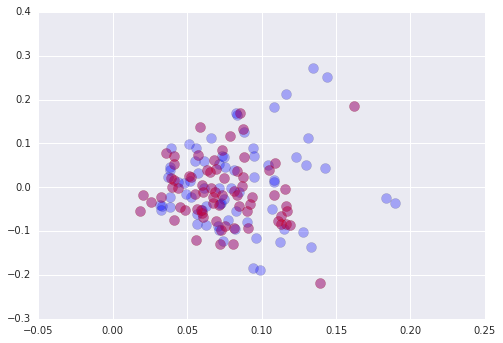

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

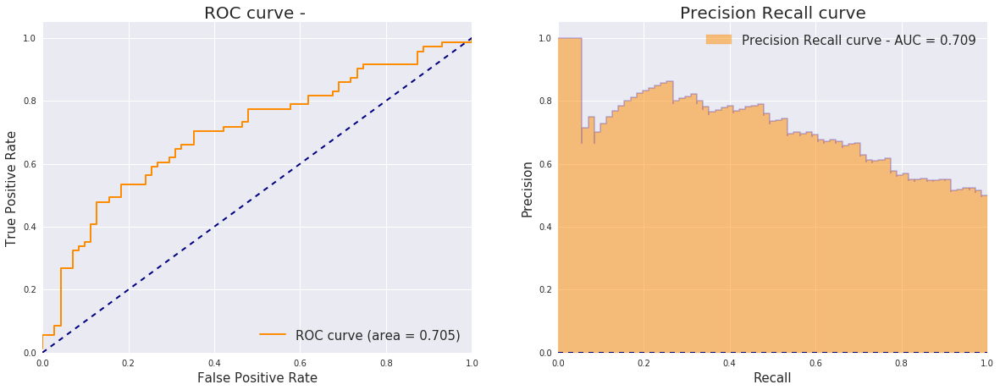

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.705   0.709              0.5             0.209   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,V12_1:8,d3Deletion_std_0:8,n2Insertion...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_thread

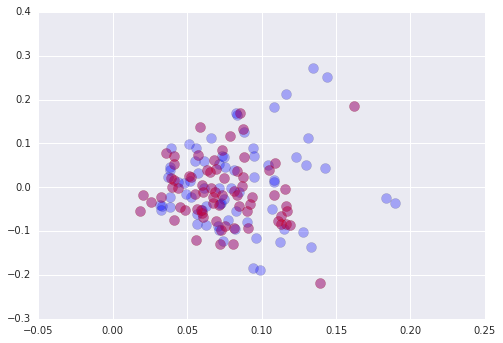

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'AST', u'Hemoglobin', u'WBC', u'HDL', u'Total Cholesterol', 'AA count_T', 'D01_J01-01_T', 'D01_J01-04_T', 'D01_J02-01_T', 'D01_J02-02_T', 'D02_J01-01_T', 'D02_J01-02_T', 'D02_J01-03_T', 'D02_J02-01_T', 'D02_J02-06_T', 'J01-01_T', 'J01-02_T', 'J01-04_T', 'J02-01_T', 'NT count_T', 'V01_J01_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-03_T', 'V04_J02_T', 'V04_T', 'V05-01_T', 'V05-03_T', 'V05-05_T', 'V05-06_T', 'V05-07_T', 'V05_T', 'V06-01_T', 'V06-05_T', 'V07-07_T', 'V07-09_T', 'V07_J01_T', 'V09-01_T', 'V09_J01_T', 'V09_J02_T', 'V11-02_T', 'V11_J01_T', 'V11_T', 'V12-01_T', 'V12-05_T', 'V12_J02_T', 'V12_T', 'V13_J01_T', 'V13_J02_T', 'V14-01_T', 'V14_J01_T', 'V14_J0

generating plots...
0.7649275937314025


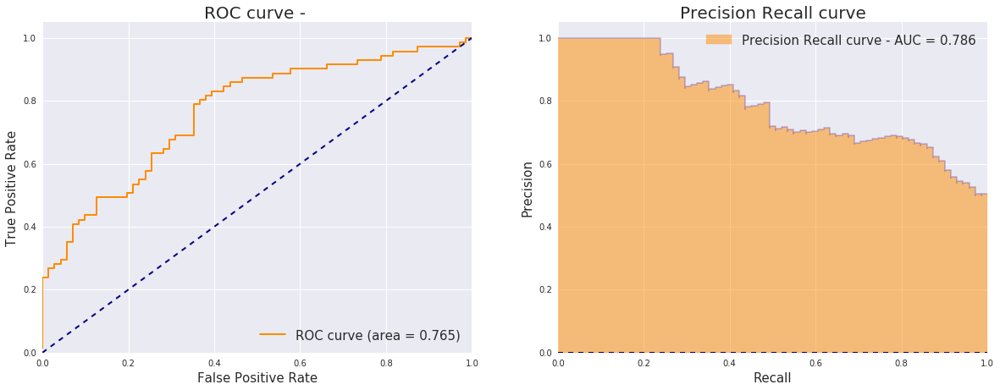

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif100_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.765   0.786              0.5             0.286   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,n1Insertion_mean_T:10,n2Insertion_mean_T:10,V...                    170.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                        100.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
*

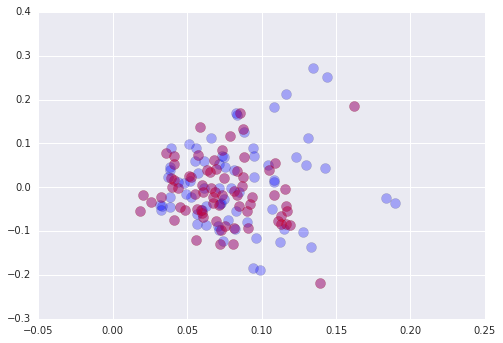

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'AST', u'Hemoglobin', u'WBC', u'HDL', 'AA count_T', 'D01_J02-02_1', 'D01_J02-02_T', 'D02_J01-01_0', 'D02_J01-02_1', 'D02_J01-02_T', 'J01-01_0', 'NT count_0', 'NT count_T', 'V01_J01_0', 'V01_J01_T', 'V03_J01_T', 'V04-02_0', 'V04_0', 'V04_J02_0', 'V04_J02_T', 'V05-03_1', 'V05-04_0', 'V06-01_0', 'V06-04_1', 'V06-04_T', 'V07-09_1', 'V07-09_T', 'V10-02_0', 'V11-02_0', 'V11-02_1', 'V11-02_T', 'V11_0', 'V11_1', 'V11_J01_0', 'V11_J01_1', 'V11_J01_T', 'V11_T', 'V12-01_T', 'V12-05_1', 'V12-05_T', 'V12_1', 'V12_J02_1', 'V12_J02_T', 'V12_T', 'V14-01_1', 'V14-01_T', 'V14_J01_1', 'V14_J01_T', 'V14_J02_1', 'V15_J02_0', 'V16-01_1', 'V18_J01_0', 'V21-01_0', 'V21-01_T', 'V21_J

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'BMI', u'AST', u'WBC', u'HDL', 'D01_J02-02_1', 'D01_J02-02_T', 'D01_J02-06_0', 'D02_J01-02_1', 'NT count_0', 'NT count_T', 'V01_J01_0', 'V01_J01_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-02_0', 'V04-03_0', 'V04_0', 'V04_1', 'V04_J02_0', 'V04_J02_1', 'V04_J02_T', 'V04_T', 'V05-04_0', 'V05-07_0', 'V05-07_T', 'V05-08_0', 'V06-01_0', 'V06-04_1', 'V06-04_T', 'V07-05_T', 'V07-09_1', 'V07-09_T', 'V09-01_0', 'V09-01_1', 'V09-01_T', 'V09_J01_0', 'V10-02_0', 'V11-02_0', 'V11-02_1', 'V11-02_T', 'V11_0', 'V11_J01_0', 'V11_T', 'V12-01_T', 'V12-05_1', 'V12-05_T', 'V12_1', 'V12_J02_1', 'V12_J02_T', 'V12_T', 'V13_J02_1', 'V14-01_1', 'V14-01_T', 'V14_J01_1', 'V14_J01_T', 'V15_J01_0', 'V15_J02_0

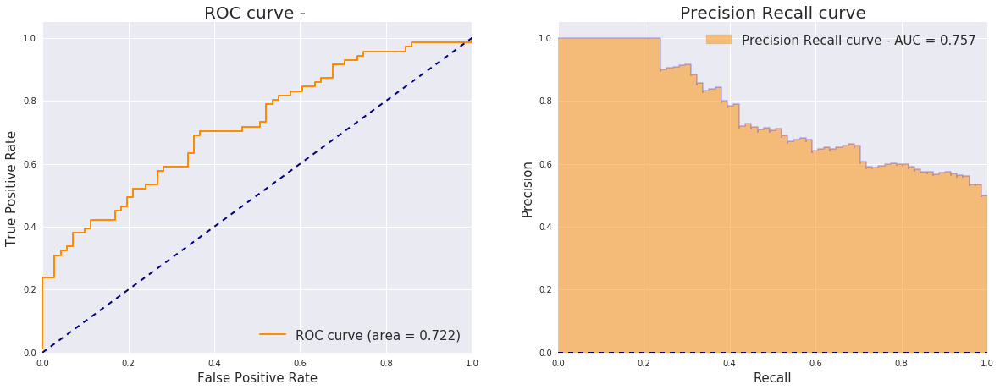

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif100_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.722   0.757              0.5             0.257   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,n2Insertion_mean_T:10,V12-05_1:10,V11-02_T:10...                    235.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                        100.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
*

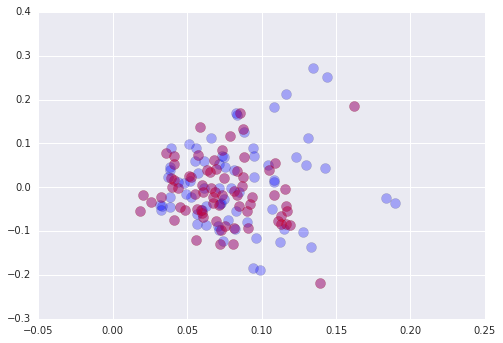

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['V19_J02_T', 'V30_J01_T', 'V25_J02_T', 'V27_J01_T', 'J02-05_T', 'D02_J02-04_T', 'V21_J02_T', 'V27_J02_T', 'D02_J01-01_T', 'jDeletion_mean_T', 'V07-04_T', 'jDeletion_std_T', 'PC2', 'V06-05_T', 'simpson_nt_T', 'V12_J02_T', 'V14_J02_T', 'V27-01_T', 'top1000clonal_nt_T', 'd3Deletion_std_T', 'D02_J02-06_T', 'V03_J01_T', 'V05_T', 'berger_aa_T', u'Gender_Male', 'V02-01_T', 'V21-01_T', 'V06-07_T', 'prod_stat_mean_T', 'V11-02_T', 'V14-01_T', u'Hemoglobin', 'cdr3Length_mean_T', 'D01_J02-01_T', 'D02_J01-04_T', 'V30-01_T', 'PC4', 'jDeletion_max_T', 'shannon_nt_T', 'V11-03_T', 'V11_T', 'PC9', 'V23-01_T', 'V15_J02_T', 'V10_J01_T', 'V04_J02_T', 'D01_J02-06_T', 'V23_J02_T', 'V20-01_T', 'V07-03_T', 'V04-01_T', 'V13-01_T', 'V06_T', u'WB

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['shannon_aa_T', u'Hemoglobin', 'V06-06_T', 'V14-01_T', 'J02-07_T', 'V11_J02_T', 'jDeletion_mean_T', 'V16_J02_T', 'V30-01_T', 'D01_J01-02_T', 'V07_J01_T', 'D02_J01-04_T', 'V29_J02_T', 'V07_J02_T', 'V28-01_T', 'D02_J02-03_T', 'V18_J01_T', 'V09-01_T', 'jDeletion_std_T', 'V29-01_T', 'V11-03_T', 'J02-05_T', 'berger_nt_T', 'D02_J01-05_T', 'D02_J02-07_T', 'V03_J01_T', u'HDL', 'V05-06_T', 'top1000clonal_nt_T', 'PC7', u'BMI', 'PC5', 'D01_J02-03_T', 'V06_J02_T', 'V06-04_T', 'V27_J01_T', 'cdr3Length_std_T', 'V01_J01_T', 'V02_J02_T', u'Total Cholesterol', 'V09_J01_T', 'V10-02_T', 'V10-03_T', 'PC10', 'V07-09_T', 'V21-01_T', 'D01_J02-02_T', 'n2Insertion_max_T', 'V05-07_T', 'V11-01_T', 'prod_stat_mean_T', u'Gender_Male', 'top1000clon

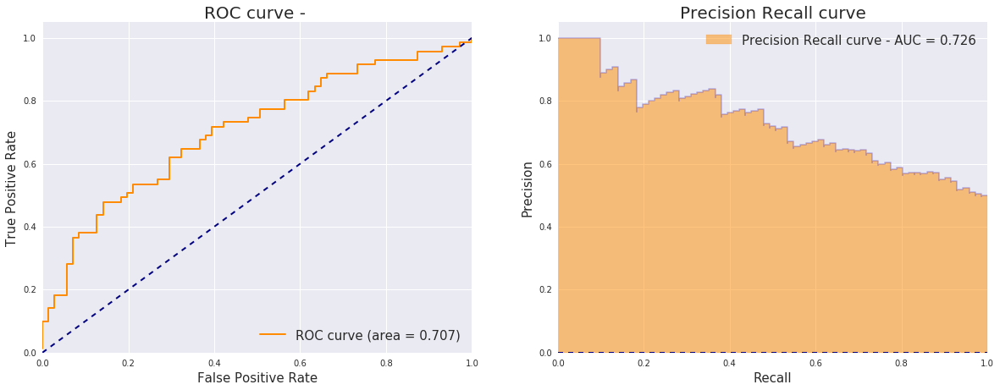

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom100_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.707   0.726              0.5             0.226   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,D02_J02-07_T:9,V10-01_T:9,V03_J01_T:8,V07-02_...                    209.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                        100.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=100, featureComposition=phenot

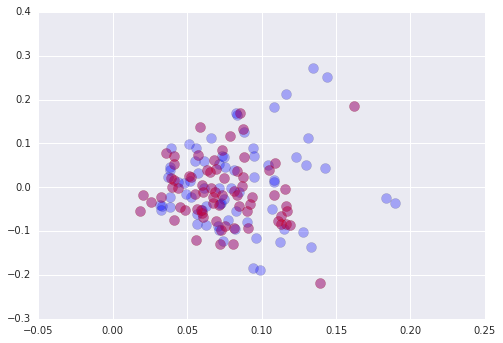

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['J02-02_T', 'vDeletion_mean_T', 'top1000clonal_nt_1', 'V09_J02_0', 'V11-03_1', 'simpson_nt_1', 'J01-01_1', 'V15-01_T', 'V07-08_T', 'V28_J02_1', 'V04-01_0', 'J01-06_1', 'V05_J02_T', 'V29_J01_T', 'D02_J01-03_T', 'V30_J01_0', 'V30_J02_0', 'J01-05_1', 'V07-04_1', 'D02_J01-03_1', 'V20_J01_1', 'mean_nt_per_aa_1', 'V01_J02_1', 'V11-02_1', 'V21_J02_T', 'V20-01_1', 'D01_J02-05_1', 'berger_nt_T', 'V11_J02_0', 'V14_J02_T', 'd3Deletion_mean_0', 'V11_1', 'D01_J02-03_0', 'n2Insertion_std_1', 'V07_J02_T', 'V05-06_T', 'V05_0', 'V06_T', 'V18_J02_1', 'V07_J01_0', 'count (templates)_std_0', 'V12-05_T', 'V12-02_0', 'cdr3Length_std_T', 'V12_T', 'V21_J02_1', 'n1Insertion_mean_0', 'top10clonal_aa_0', 'D02_J02-01_0', 'V06_J02_0', 'V16_J01_T',

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['max_nt_per_aa_0', 'V11_T', 'D01_J02-05_0', 'normSeqNums_per2000_NT_1', 'V20_J02_0', 'V06-04_0', 'V07-06_T', 'V20_J02_T', 'D01_J02-05_1', 'jDeletion_max_T', u'WBC', 'V09-01_T', 'V28_J02_1', 'D02_J02-07_T', 'V30-01_0', u'HbA1C', 'V15-01_T', 'n1Insertion_max_T', 'V09_J01_T', 'D01_J01-04_T', 'V30_J01_T', 'D01_J02-01_T', 'V05-08_0', 'V15-01_1', 'V05-01_T', 'V04-01_T', 'cdr3Length_mean_T', 'n2Insertion_max_0', 'D02_J02-06_T', 'J02-02_1', 'mean_nt_per_aa_T', 'V01_J01_T', 'V05-05_T', 'n2Insertion_mean_1', 'n2Insertion_mean_T', 'frequencyCount (%)_std_T', 'V02-01_1', 'D02_J01-05_0', 'simpson_aa_0', 'shannon_nt_1', 'V20-01_T', 'n1Insertion_mean_0', 'V23-01_T', 'D01_J02-04_0', 'V10-02_1', 'top10clonal_aa_1', 'V05-04_0', 'J02-07_

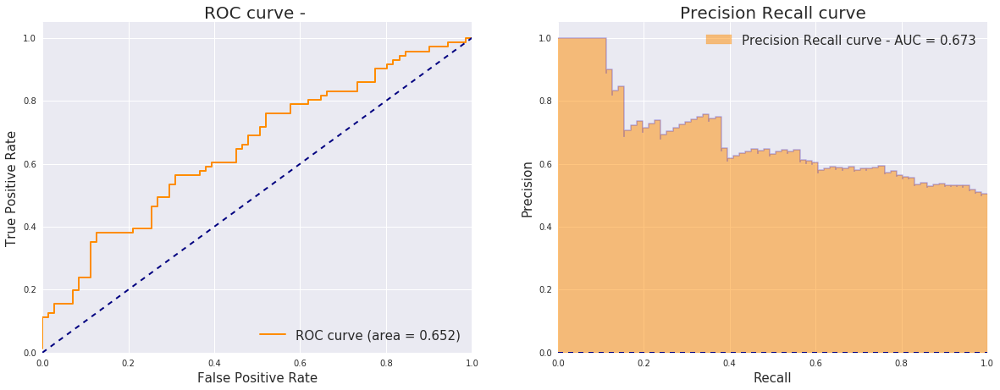

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom100_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.652   0.673              0.5             0.173   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,V12_J01_1:6,V30_J01_T:6,D01_J02-03_0:6,D01_J0...                    501.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                        100.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=100, featureComposition=phenot

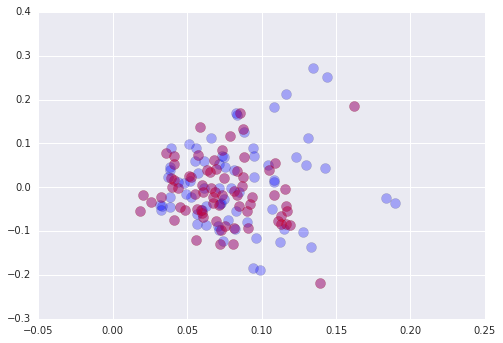

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'HbA1C', u'AST', u'Hemoglobin', u'WBC', u'HDL', u'Total Cholesterol', 'AA count_T', 'D01_J01-04_T', 'D01_J02-02_T', 'D02_J01-02_T', 'D02_J01-03_T', 'D02_J02-04_T', 'D02_J02-06_T', 'J01-02_T', 'J01-04_T', 'NT count_T', 'V01_J01_T', 'V02_J01_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-03_T', 'V04_J02_T', 'V04_T', 'V05-01_T', 'V05-03_T', 'V05-06_T', 'V05-07_T', 'V05_J02_T', 'V05_T', 'V06-01_T', 'V06-04_T', 'V06-05_T', 'V06_J02_T', 'V07-03_T', 'V07-05_T', 'V07-09_T', 'V07_J01_T', 'V09-01_T', 'V09_J02_T', 'V10-01_T', 'V10-03_T', 'V11-02_T', 'V11_J01_T', 'V11_J02_T', 'V11_T', 'V12-01_T', 'V12-02_T', 'V12-05_T', 'V12_J02_T', 'V12_T', 'V14-01_T', 'V14_J01_T', 'V14_J02

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'BMI', u'AST', u'Hemoglobin', u'WBC', u'HDL', u'Total Cholesterol', 'AA count_T', 'D01_J01-04_T', 'D01_J02-02_T', 'D01_J02-04_T', 'D01_J02-05_T', 'D02_J01-02_T', 'D02_J01-03_T', 'D02_J02-03_T', 'D02_J02-06_T', 'J01-04_T', 'J02-02_T', 'NT count_T', 'V01_J01_T', 'V01_J02_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-02_T', 'V04-03_T', 'V04_J02_T', 'V04_T', 'V05-07_T', 'V05_J02_T', 'V06-01_T', 'V06-04_T', 'V06-05_T', 'V07-02_T', 'V07-04_T', 'V07-05_T', 'V07-09_T', 'V09-01_T', 'V09_J01_T', 'V09_J02_T', 'V10-01_T', 'V10-03_T', 'V11-01_T', 'V11-02_T', 'V11_J02_T', 'V11_T', 'V12-01_T', 'V12-02_T', 'V12-05_T', 'V12_J02_T', 'V12_T', 'V13_J02_T', 'V14-01_T', 'V14_J01_T', 'V15-01_T', 'V16-01_

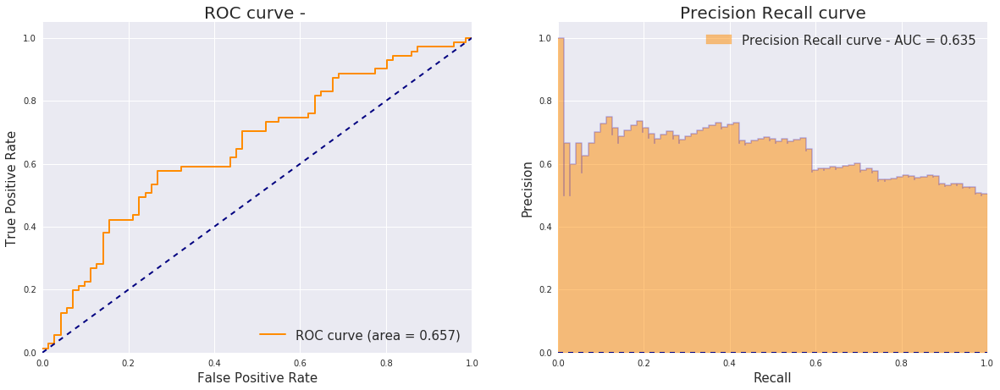

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.657   0.635              0.5             0.135   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,n1Insertion_mean_T:10,n2Insertion_mean_T:10,V...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.

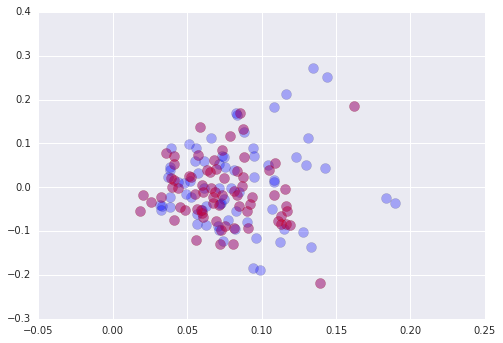

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'AST', u'Hemoglobin', u'WBC', u'HDL', 'AA count_T', 'D01_J02-02_1', 'D01_J02-02_T', 'D02_J01-01_0', 'D02_J01-02_1', 'D02_J01-02_T', 'J01-01_0', 'NT count_0', 'NT count_T', 'V01_J01_0', 'V01_J01_T', 'V03_J01_T', 'V04-02_0', 'V04_0', 'V04_J02_0', 'V04_J02_T', 'V05-03_1', 'V05-04_0', 'V06-01_0', 'V06-04_1', 'V06-04_T', 'V07-09_1', 'V07-09_T', 'V10-02_0', 'V11-02_0', 'V11-02_1', 'V11-02_T', 'V11_0', 'V11_1', 'V11_J01_0', 'V11_J01_1', 'V11_J01_T', 'V11_T', 'V12-01_T', 'V12-05_1', 'V12-05_T', 'V12_1', 'V12_J02_1', 'V12_J02_T', 'V12_T', 'V14-01_1', 'V14-01_T', 'V14_J01_1', 'V14_J01_T', 'V14_J02_1', 'V15_J02_0', 'V16-01_1', 'V18_J01_0', 'V21-01_0', 'V21-01_T', 'V21_J

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'BMI', u'AST', u'WBC', u'HDL', 'D01_J02-02_1', 'D01_J02-02_T', 'D01_J02-06_0', 'D02_J01-02_1', 'NT count_0', 'NT count_T', 'V01_J01_0', 'V01_J01_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-02_0', 'V04-03_0', 'V04_0', 'V04_1', 'V04_J02_0', 'V04_J02_1', 'V04_J02_T', 'V04_T', 'V05-04_0', 'V05-07_0', 'V05-07_T', 'V05-08_0', 'V06-01_0', 'V06-04_1', 'V06-04_T', 'V07-05_T', 'V07-09_1', 'V07-09_T', 'V09-01_0', 'V09-01_1', 'V09-01_T', 'V09_J01_0', 'V10-02_0', 'V11-02_0', 'V11-02_1', 'V11-02_T', 'V11_0', 'V11_J01_0', 'V11_T', 'V12-01_T', 'V12-05_1', 'V12-05_T', 'V12_1', 'V12_J02_1', 'V12_J02_T', 'V12_T', 'V13_J02_1', 'V14-01_1', 'V14-01_T', 'V14_J01_1', 'V14_J01_T', 'V15_J01_0', 'V15_J02_0

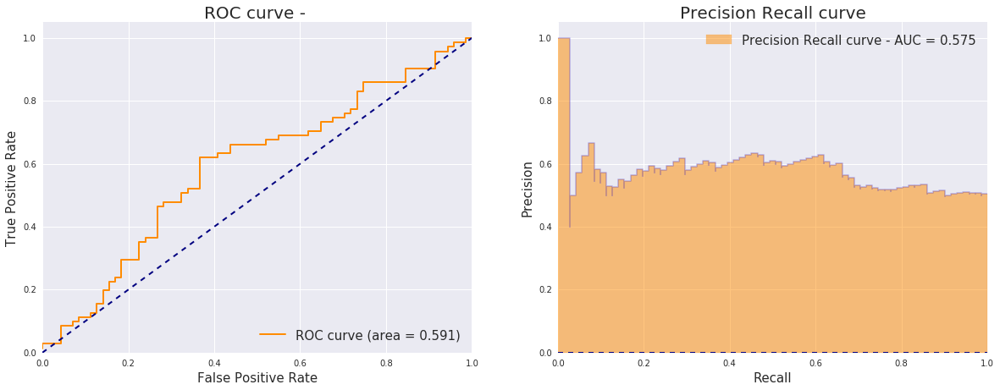

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.591   0.575              0.5             0.075   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,n2Insertion_mean_T:10,V12-05_1:10,V11-02_T:10...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.

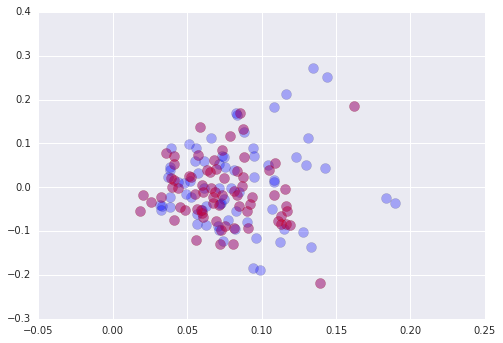

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['PC7', 'berger_aa_T', 'top1000clonal_aa_T', u'Smoking Status_Past', 'vDeletion_mean_T', 'PC9', 'berger_nt_T', 'PC8', 'normSeqNums_per200_AA_T', 'D01_J02-06_T', 'n1Insertion_max_T', 'V04_T', 'shannon_nt_T', 'V11_J02_T', 'V11-03_T', 'V12_J02_T', 'vDeletion_max_T', 'V01-01_T', 'D02_T', u'AST', 'cdr3Length_max_T', 'V27-01_T', 'V03_J02_T', 'V07-02_T', 'V07_J02_T', 'PC3', 'PC6', 'V04-01_T', 'V23-01_T', 'V07-08_T', 'V25-01_T', 'J01-01_T', 'D02_J01-04_T', 'frequencyCount (%)_std_T', 'D01_J01-02_T', 'V21-01_T', 'd5Deletion_std_T', 'D02_J01-02_T', 'V29_J02_T', 'J02-04_T', 'V04-03_T', 'V11-02_T', 'n1Insertion_std_T', 'V14_J01_T', 'V06-09_T', 'J02-07_T', 'V07-03_T', 'V05-08_T', 'V06-07_T', 'V15_J01_T', 'D01_J01-05_T', 'V23_J01_T',

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['vDeletion_std_T', 'V25-01_T', 'V12-02_T', 'V16_J02_T', u'Smoking Status_Past', 'V06-04_T', 'V07_J01_T', 'V02_J01_T', 'J01-05_T', 'V02_J02_T', 'PC4', 'V23_J01_T', 'simpson_aa_T', 'D02_J01-06_T', 'vDeletion_max_T', 'V29_J02_T', 'n2Insertion_mean_T', 'D01_J01-02_T', u'Smoking Status_Yes', 'V06-07_T', 'V07_J02_T', 'V11_T', 'V10_J02_T', 'V05_J02_T', 'berger_aa_T', 'V25_J01_T', 'V06-09_T', 'V19_J02_T', 'D01_J01-05_T', 'V07_T', 'J01-06_T', 'n1Insertion_mean_T', 'V06-05_T', u'Age', 'V13_J01_T', 'V10-03_T', 'V04_J02_T', 'V05_T', 'D01_J01-06_T', 'V07-09_T', 'PC9', 'V11_J01_T', 'PC10', 'J02-05_T', 'V29-01_T', 'n1Insertion_max_T', 'd5Deletion_std_T', 'D01_J02-02_T', 'J02-06_T', 'count (templates)_mean_T', 'V01_J02_T', 'cdr3Length

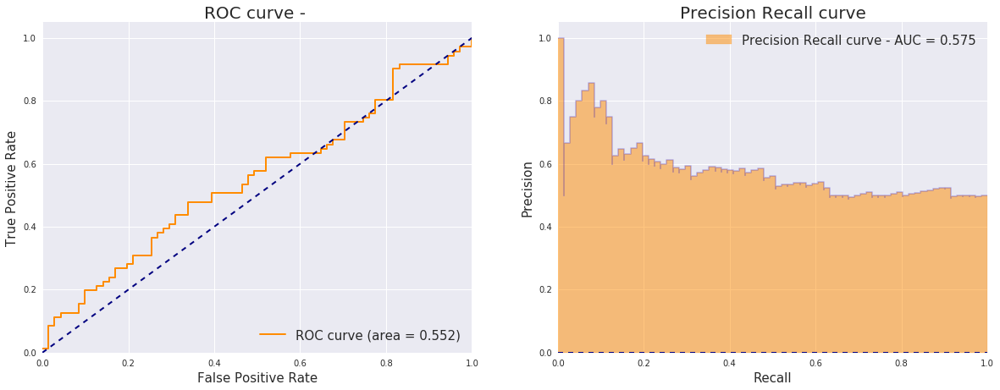

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.552   0.575              0.5             0.075   True   

  featureSelectionMethod                                      features used  \
0                 random  ,D01_J01-05_T:9,n1Insertion_std_T:8,frequencyC...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_thread

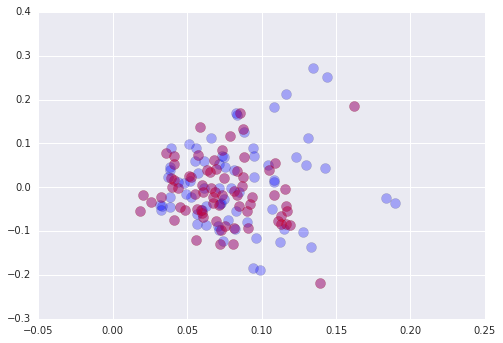

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['V16_J02_T', 'V12_0', 'J01-04_1', 'V07-08_T', 'vDeletion_max_T', 'V10_0', 'D01_J02-06_T', 'D02_J02-01_0', 'V06_0', 'V20_J01_1', 'D01_J02-06_1', 'V19_J02_0', 'V06_1', 'V28-01_0', 'V09-01_1', 'n2Insertion_max_0', 'V06-01_0', 'jDeletion_max_T', 'V27-01_0', 'V01_J02_0', 'V04-03_T', 'count (templates)_mean_T', 'V30_J02_1', 'V06-06_1', 'V07_J02_0', 'V12_1', 'cdr3Length_mean_0', 'V07_T', 'V07_J02_1', 'V05-03_T', 'V11_J02_1', 'normSeqNums_per200_AA_T', 'V15_J02_0', 'V09_J01_1', 'V06-01_T', 'V02-01_T', 'J02-06_1', 'V25_J02_0', 'AA count_0', 'V27_J02_T', 'V11_J02_T', 'V07_1', 'D02_J02-05_0', 'V30_J01_0', 'V10-02_0', 'D01_J01-06_T', 'D02_J02-05_1', 'V05_J01_1', 'top1000clonal_aa_T', 'V28-01_T', 'V06-04_0', 'D02_J02-04_T', 'V11_J0

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['V05-03_1', 'V05_T', 'J02-06_0', 'count (templates)_std_1', 'V12-02_0', 'V14-01_1', 'V05-03_T', u'BMI', 'count (templates)_mean_1', 'PC6', 'd5Deletion_mean_0', 'D01_J01-02_0', 'D01_J02-03_1', 'V29_J01_1', 'V05-04_0', 'vDeletion_mean_1', 'V09-01_T', 'D01_J01-02_1', 'd3Deletion_std_0', 'D01_J02-05_1', 'count (templates)_mean_T', 'jDeletion_max_1', 'D01_J02-01_T', 'V05-01_0', 'V06-05_1', 'V15-01_0', 'D01_J01-06_0', 'V12_J02_1', 'V05-05_T', 'V10_J01_1', 'V07-08_1', 'J01-05_1', 'n2Insertion_mean_0', 'V06-01_1', 'D02_J01-05_T', 'V07-09_1', 'frequencyCount (%)_std_T', 'V06_J02_1', 'J01-06_1', 'V10-02_1', 'V12-02_1', 'V04-01_1', 'V01-01_1', 'n1Insertion_mean_1', 'V30_J01_1', 'V15_J02_1', 'D02_J01-04_T', 'V23-01_0', 'D01_J02-07

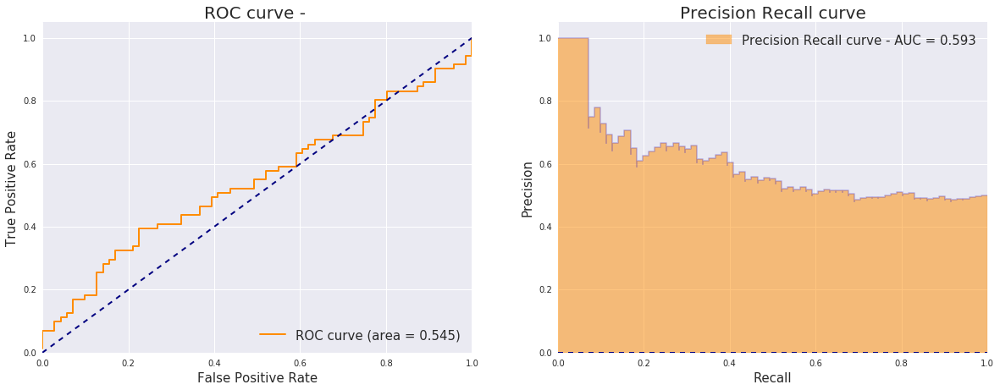

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.545   0.593              0.5             0.093   True   

  featureSelectionMethod                                      features used  \
0                 random  ,V15-01_0:6,V15_J02_1:5,V06_1:5,V20-01_1:5,d5D...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_thread

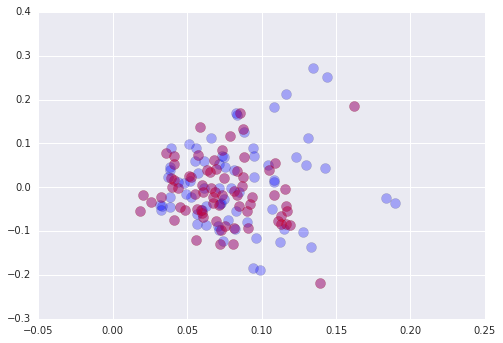

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
selected features are:
[u'WBC', u'HDL', 'V10-01_T', 'V29_J02_T', 'V29-01_T', 'V27_J02_T', 'V20_J01_T', 'V13_J01_T', 'gc_content_T', 'V07-07_T', 'D01_J02-05_T', 'V13-01_T', 'PC6', 'd3Deletion_std_T', 'V09-01_T', 'V11-02_T', 'n2Insertion_mean_T', 'D02_J01-04_T', 'V15-01_T', 'V07-09_T', 'D01_J01-05_T', u'Age', 'V07-04_T', 'cdr3Length_max_T', 'n1Insertion_mean_T', 'J02-02_T', 'D01_J02-04_T', 'V05-05_T', 'V01_J02_T', 'V20_J02_T', 'berger_aa_T', 'PC9', 'V05-03_T', u'AST', 'D01_J02-06_T', 'V04_J01_T', 'V12-02_T', 'PC10', 'V09_J01_T', 'D01_J02-01_T', 'D01_J02-02_T', 'V10-03_T', 'D02_J02-05_T', 'vDeletion_mean_T', 'jDeletion_max_T', 'V15_J02_T', 'V07_T', 'V14_J01_T', 'V05-06_T', 'PC3', u'HbA1C', 'V11-01_T', 'V21-01_T', 'D01_J01-04_T', u'BMI', 'J01-04_T', 'V12_T', 'V23_J01_T', 'V12_J02_T', 'd5Deletion_mean_T', 'V06-05_T', 'V13_J02_T', 'V07-05_T', 'V09_J02_T', 'V18-01_T', 'V04_T', 'V04_J02_T', 'PC5', 'V16_J02_T', 'V18_J01_T', 'V06-0

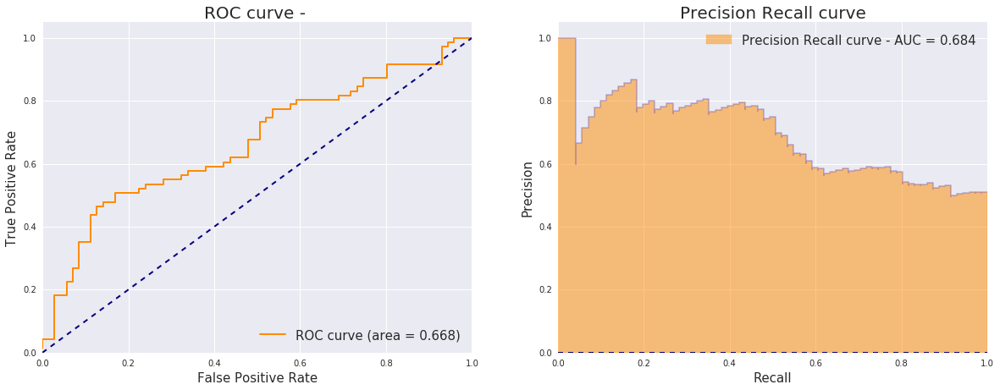

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.668   0.684              0.5             0.184   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,n1Insertion_mean_T:10,n2Insertion_mean_T:10,V...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_th

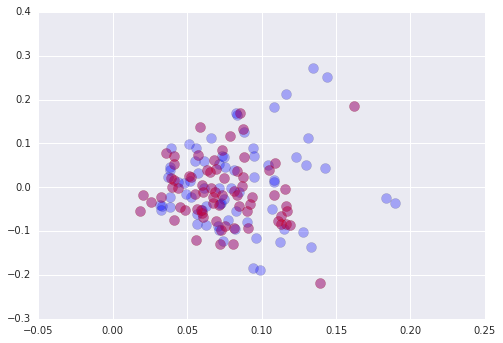

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
selected features are:
[u'WBC', u'HDL', 'V09_J01_0', 'V10-01_T', 'n2Insertion_mean_1', 'V29_J02_T', 'V07-07_0', 'PC6', 'V29-01_T', 'D01_J02-05_1', 'V18_J01_0', 'V25_J02_0', 'V15-01_1', 'V07-09_1', 'PC9', 'V20_J01_T', 'd3Deletion_mean_0', 'V27_J02_T', 'd3Deletion_std_0', 'D02_J01-02_0', 'V12-01_0', 'V25-01_0', 'D01_J01-04_1', 'V12_J02_T', 'V15_J02_0', u'AST', 'V09-01_1', 'V10-03_0', 'vDeletion_max_T', 'V07-06_0', 'V15_J01_0', 'n2Insertion_mean_0', 'J02-07_0', 'V10-02_0', 'V05-01_1', 'V04_J02_1', 'V12_T', 'n1Insertion_mean_T', 'V25_J01_0', 'J02-02_1', 'V13-01_1', 'V09-01_T', 'V13_J01_1', 'V13_J02_1', 'V14_J01_1', 'V07-02_0', 'n2Insertion_mean_T', 'V06-01_0', 'V05-05_1', 'V07-04_T', 'V27_J01_0', 'V13-01_T', 'V06_1', 'V04_J01_T', 'V25-01_1', 'V18_J02_0', 'V19-01_0', 'V21_J01_1', 'n2Insertion_std_1', 'V13_J01_T', u'Age', 'V14-01_1', 'V18-01_1', 'd5Deletion_mean_1', 'd3Deletion_std_T', 'V15_J02_1', 'V19_J02_1', 'V29_J02_1', 'cd

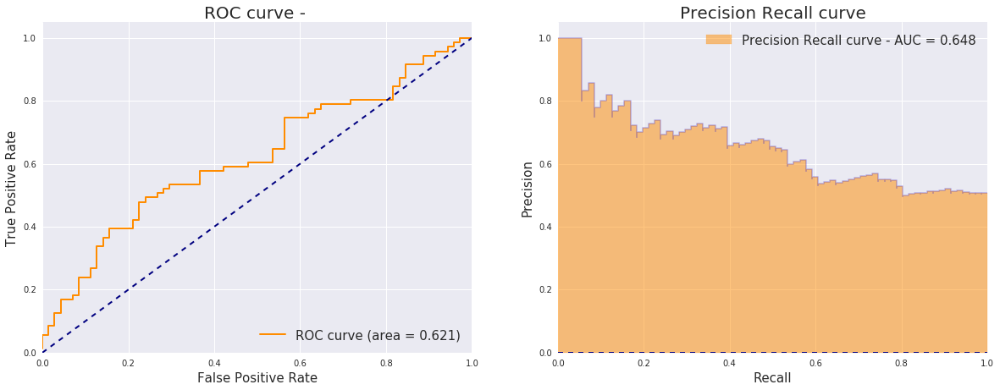

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.621   0.648              0.5             0.148   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,V09_J01_0:10,V15-01_1:10,V10-02_0:10,n2Insert...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_th

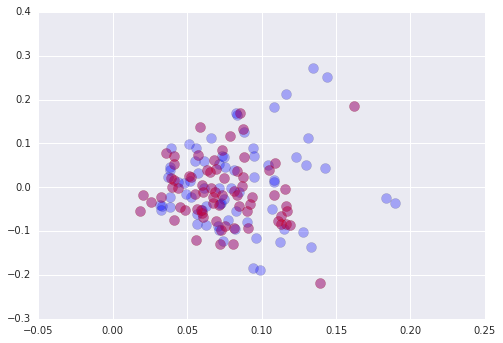

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'AST', u'Hemoglobin', u'WBC', u'HDL', u'Total Cholesterol', 'AA count_T', 'D01_J01-01_T', 'D01_J01-04_T', 'D01_J02-01_T', 'D01_J02-02_T', 'D02_J01-01_T', 'D02_J01-02_T', 'D02_J01-03_T', 'D02_J02-01_T', 'D02_J02-06_T', 'J01-01_T', 'J01-02_T', 'J01-04_T', 'J02-01_T', 'NT count_T', 'V01_J01_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-03_T', 'V04_J02_T', 'V04_T', 'V05-01_T', 'V05-03_T', 'V05-05_T', 'V05-06_T', 'V05-07_T', 'V05_T', 'V06-01_T', 'V06-05_T', 'V07-07_T', 'V07-09_T', 'V07_J01_T', 'V09-01_T', 'V09_J01_T', 'V09_J02_T', 'V11-02_T', 'V11_J01_T', 'V11_T', 'V12-01_T', 'V12-05_T', 'V12_J02_T', 'V12_T', 'V13_J01_T', 'V13_J02_T', 'V14-01_T', 'V14_J01_T', 'V14_J0

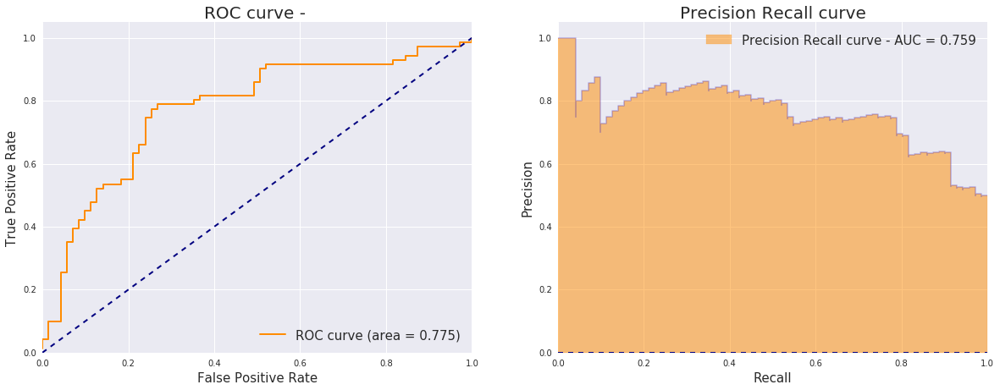

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.775   0.759              0.5             0.259   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,n1Insertion_mean_T:10,n2Insertion_mean_T:10,V...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.0  

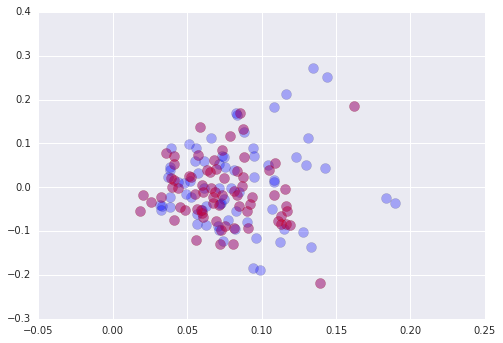

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'AST', u'WBC', u'HDL', 'AA count_1', 'AA count_T', 'D01_J02-01_1', 'D01_J02-02_1', 'D01_J02-02_T', 'D01_J02-07_0', 'D02_J01-02_1', 'J01-01_0', 'NT count_0', 'NT count_1', 'NT count_T', 'V03_J01_T', 'V04-03_0', 'V04_0', 'V04_J02_0', 'V04_J02_T', 'V05-04_0', 'V05-07_0', 'V05-07_T', 'V06-01_0', 'V06-01_T', 'V07-06_0', 'V07-07_0', 'V07-09_1', 'V07-09_T', 'V09-01_0', 'V09-01_1', 'V09-01_T', 'V09_J01_0', 'V09_J02_1', 'V09_J02_T', 'V10-02_0', 'V11-02_0', 'V11-02_1', 'V11-02_T', 'V11_J01_0', 'V12-01_T', 'V12-05_1', 'V12-05_T', 'V12_1', 'V12_J02_1', 'V12_J02_T', 'V12_T', 'V13_J02_1', 'V14-01_1', 'V14-01_T', 'V14_J01_1', 'V14_J01_T', 'V14_J02_1', 'V15_J02_0', 'V16-01_1

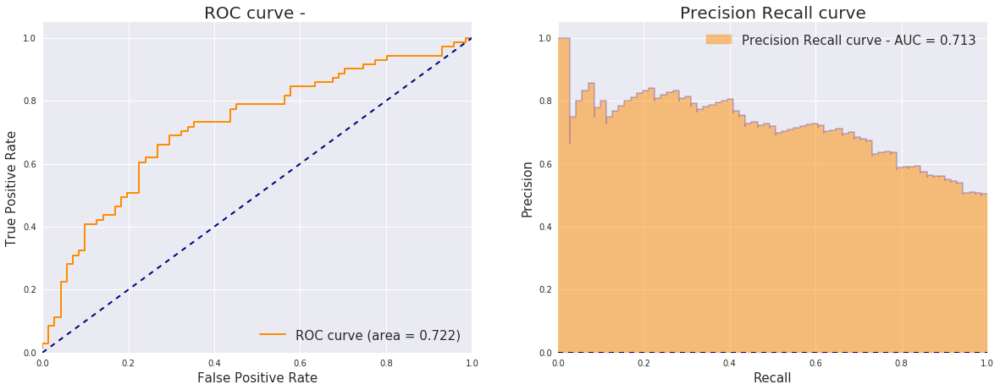

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMf_classif100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.722   0.713              0.5             0.213   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,n2Insertion_mean_T:10,V12-05_1:10,V11-02_T:10...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           3.0  

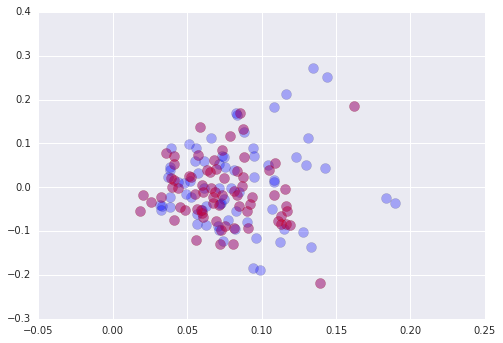

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_211
Xshape after dropping rows with nans=142_211
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample 

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['D01_J02-05_T', 'V05_J02_T', 'top1000clonal_aa_T', 'V05_J01_T', 'V06-09_T', 'V30-01_T', 'V06_J02_T', 'V10-01_T', 'V05-08_T', 'V18_J02_T', 'D01_J02-07_T', 'cdr3Length_mean_T', 'J02-02_T', 'V07-04_T', 'V09_J01_T', u'Smoking Status_Past', 'n1Insertion_max_T', 'J02-05_T', 'PC7', 'J01-04_T', 'V23_T', 'V07-07_T', 'count (templates)_std_T', 'vDeletion_max_T', 'V04_T', 'V10_J01_T', 'V05-01_T', 'V20-01_T', 'V20_J01_T', 'simpson_aa_T', 'V28-01_T', u'Gender_Male', 'V23_J01_T', 'frequencyCount (%)_std_T', 'V10-03_T', 'PC3', 'V15_J02_T', 'V07-09_T', 'J02-04_T', 'cdr3Length_std_T', 'J01-05_T', 'V20_J02_T', 'V06_J01_T', 'cdr3Length_max_T', 'V02-01_T', 'V19_J01_T', 'V07-06_T', 'V27_J02_T', 'V18-01_T', 'V06-05_T', 'V02_J02_T', 'V04-01_

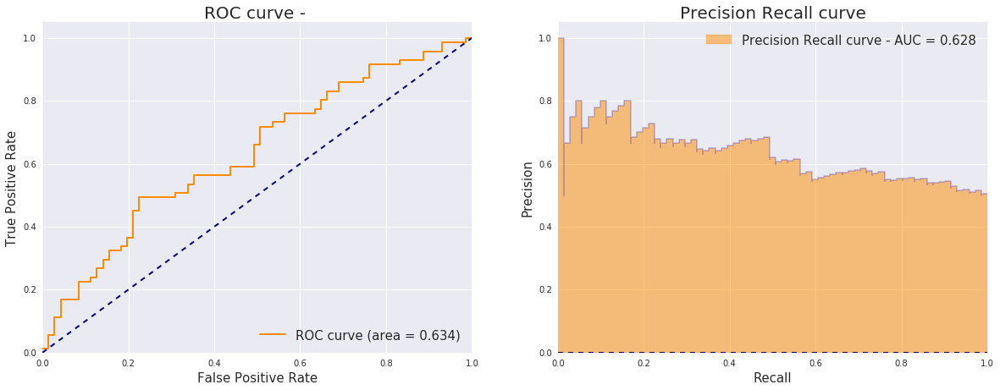

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.634   0.628              0.5             0.128   True   

  featureSelectionMethod                                      features used  \
0                 random  ,V05-07_T:9,V05-08_T:9,V07-05_T:8,PC3:8,V16_J0...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_threads  

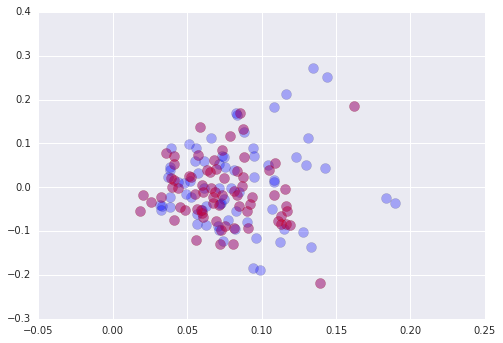

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_567
Xshape after dropping rows with nans=142_567
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Pas

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['V19-01_0', 'J01-06_T', 'D01_J02-01_T', 'V01-01_0', 'V10_1', 'V29-01_0', 'n2Insertion_std_1', 'V07-08_0', 'D01_J02-07_T', 'V06-09_T', 'V06-06_1', 'V02_J02_0', 'V19_J01_T', 'V21_J01_T', 'J02-04_0', 'V07_1', 'jDeletion_std_1', 'n1Insertion_std_T', 'V20-01_T', 'D02_J02-05_0', 'V03-01_T', 'J02-02_0', 'PC1', 'J02-03_1', 'V04_J02_0', 'D02_J02-07_1', 'V12_J02_0', 'D01_J02-06_T', 'normSeqNums_per200_AA_T', 'D01_0', 'V04-03_0', 'V27-01_0', 'vDeletion_mean_T', 'V18_J02_0', 'V07_J02_1', u'Gender_Male', 'D01_J02-04_T', 'V19-01_1', 'top1000clonal_aa_T', 'V19_J02_1', 'D02_J01-01_T', u'AST', 'V11_1', 'PC5', 'V07-08_1', 'V05_J01_T', 'V10_J02_0', 'V04-03_T', 'V07-07_1', 'V19_J01_0', u'eGFR by CKD-EPI', 'V21_J01_0', 'V11-03_T', 'V04_1',

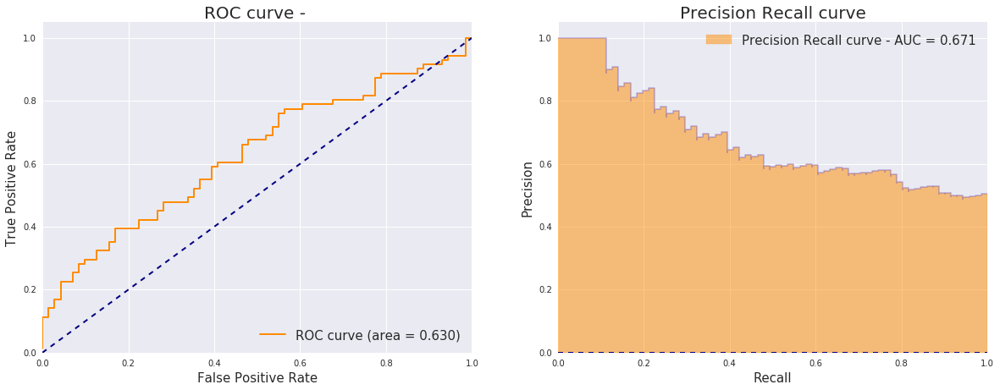

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMrandom100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0     0.63   0.671              0.5             0.171   True   

  featureSelectionMethod                                      features used  \
0                 random  ,V19-01_0:7,D02_J02-05_1:5,V04-02_1:5,V07-08_1...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_threads  

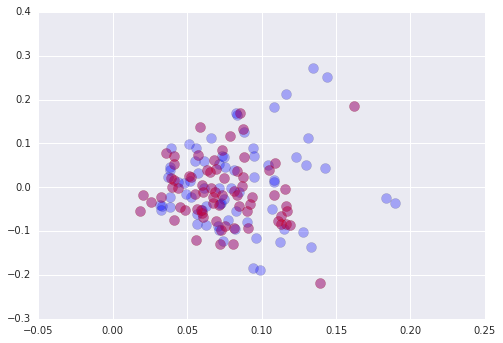

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_211
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_211:
X shape is 142_211
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

selected features are:
[u'WBC', u'HDL', 'n2Insertion_mean_T', 'PC10', 'V29-01_T', 'V12_T', 'd3Deletion_std_T', 'J01-04_T', 'V29_J01_T', 'V10-01_T', 'D02_J01-02_T', 'V04-03_T', 'PC9', u'Age', 'V13-01_T', 'V29_J02_T', 'V14_J01_T', u'eGFR by CKD-EPI', 'V11-01_T', 'V05-06_T', 'V09_J01_T', 'normSeqNums_per200_AA_T', 'PC2', 'V12_J02_T', 'V20_J01_T', 'V07-09_T', 'D01_J01-04_T', 'D01_J02-05_T', 'berger_aa_T', 'd5Deletion_std_T', 'V06-05_T', 'V11-02_T', 'vDeletion_std_T', u'BMI', 'V04_J02_T', 'D01_J01-05_T', 'count (templates)_std_T', 'cdr3Length_mean_T', u'Total Cholesterol', 'V13_J01_T', 'V09-01_T', 'PC6', 'PC5', 'jDeletion_max_T', 'PC3', 'V04-02_T', 'V11_J02_T', 'V20-01_T', 'n1Insertion_mean_T', u'Hemoglobin', 'V23_J01_T', 'V25_J02_T', 'D01_J02-04_T', 'V15_J02_T', 'D02_J01-06_T', 'D01_J02-02_T', 'V12-05_T', 'shannon_nt_T', 'V12-02_T', 'V13_J02_T', 'V20_J02_T', 'mean_nt_per_aa_T', 'PC8', 'V04-01_T', 'vDeletion_mean_T', 'V05_J02_T', 'V10_T', 'J02-06_T', 'gc_content_T', 'J02-03_T', 'V11_T', 'V0

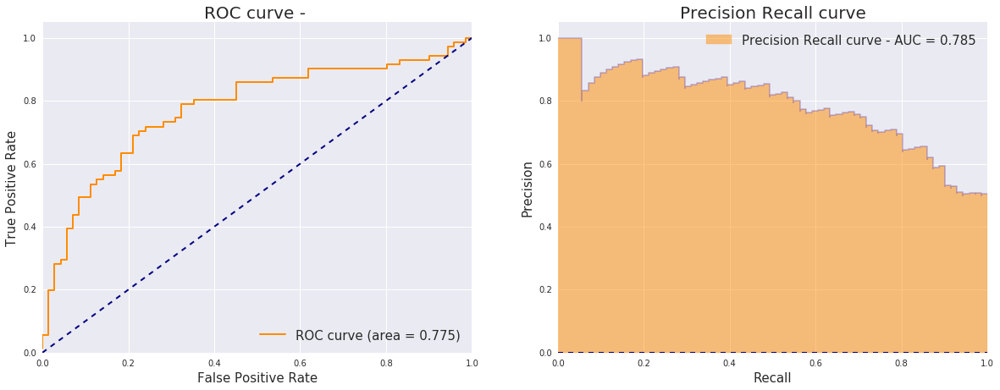

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.775   0.785              0.5             0.285   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,BMI:10,n2Insertion_mean_T:10,V09_J01_T:10,V12...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_threa

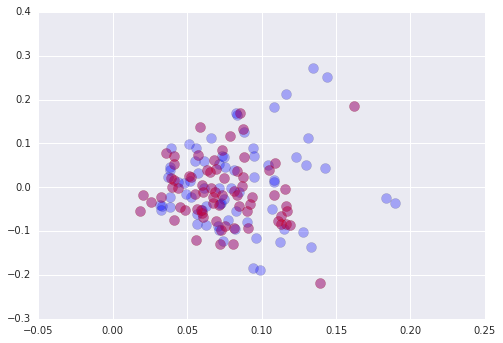

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 3
combined X shape is 142_567
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_567:
X shape is 142_567
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

selected features are:
[u'WBC', 'n2Insertion_mean_1', u'HDL', 'V12_1', 'V29-01_T', 'D02_J01-02_1', 'D01_J02-07_0', 'V25_J02_1', u'eGFR by CKD-EPI', 'd3Deletion_std_0', 'V09_J01_0', 'PC10', 'V13-01_1', 'V21-01_0', 'V06-05_T', 'V29_J02_T', 'V20_J01_T', 'V07-07_0', 'V07-09_T', 'V10-01_0', 'V10-01_T', 'max_nt_per_aa_1', 'D01_J02-06_T', 'V15_J02_0', 'd3Deletion_std_T', 'V15-01_1', 'normSeqNums_per200_AA_T', 'V04-01_1', 'V09-01_0', 'V12-02_1', 'V05-05_T', 'V06-05_1', 'PC2', 'V19-01_1', 'V02-01_0', 'V13_J01_1', 'V25-01_1', 'simpson_nt_T', 'V04-03_0', 'n2Insertion_mean_0', u'AST', 'V05-05_1', 'V28-01_0', 'V11-02_1', 'D02_J01-01_0', 'cdr3Length_std_0', 'V29_J01_T', 'V12_T', 'V04-02_1', 'J02-04_0', 'V06-09_0', 'V14_J01_1', 'V21_J01_1', 'V07_J01_0', 'V18_J01_T', 'V29_J01_1', 'V05-04_0', 'V04-03_T', 'V06-07_1', 'V09-01_T', 'D01_0', 'vDeletion_std_0', 'V04_0', 'V04_J02_T', 'V05_J02_0', 'J02-02_1', 'V15_J02_T', 'J02-03_0', 'd3Deletion_mean_0', 'PC9', 'n1Insertion_mean_1', 'PC8', 'V05-06_1', 'V14_J01

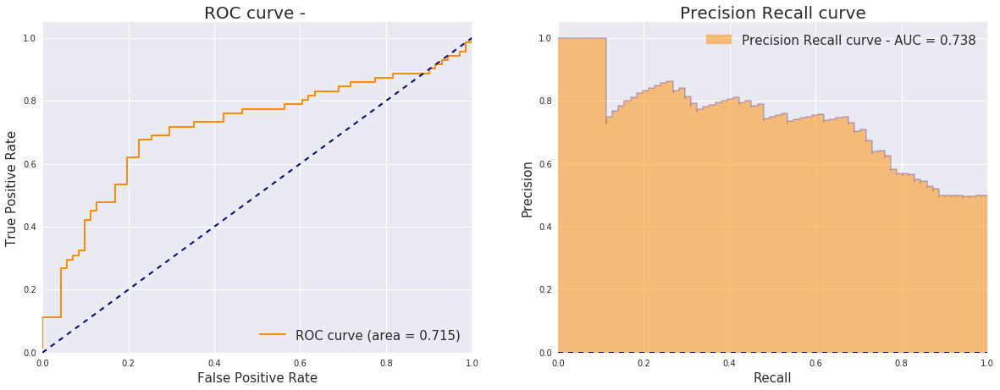

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfeatures_onlyT_FSMusingModel100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&PCA&TCRfe...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.715   0.738              0.5             0.238   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,n2Insertion_mean_1:10,WBC:10,V15_J02_0:10,HDL...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_threa

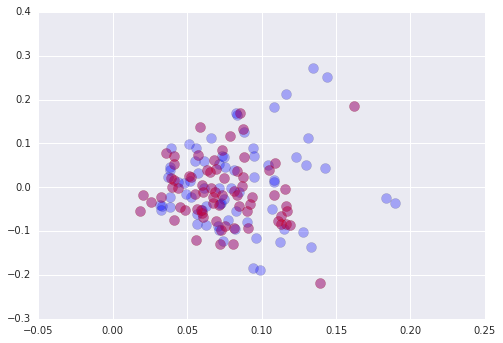

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

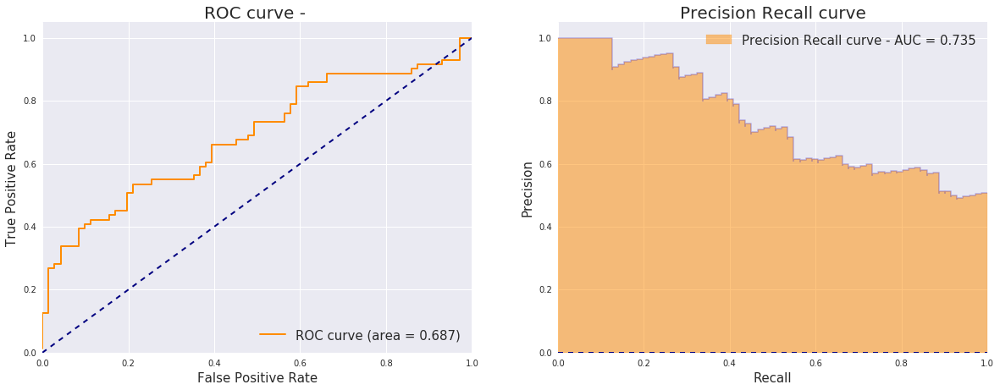

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif12_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.687   0.735              0.5             0.235   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,V12_J02_T:10,WBC:10,AST:10,HDL:9,V12_T:9,V29-...                     26.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         12.0      10.0  10.0      l1  71.0  71.0  06102018  
don

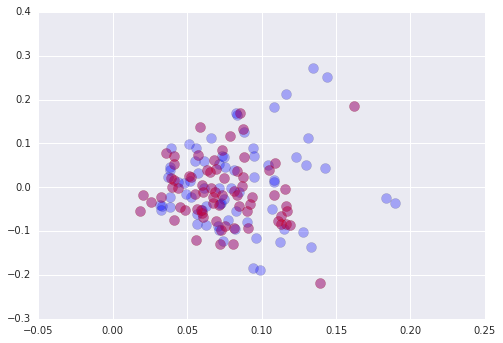

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

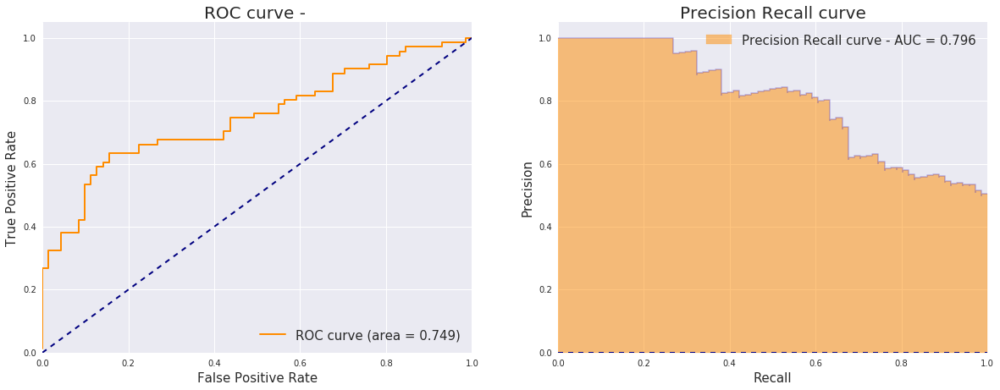

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif12_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.749   0.796              0.5             0.296   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...                     27.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         12.0      10.0  10.0      l1  71.0  71.0  06102018  
don

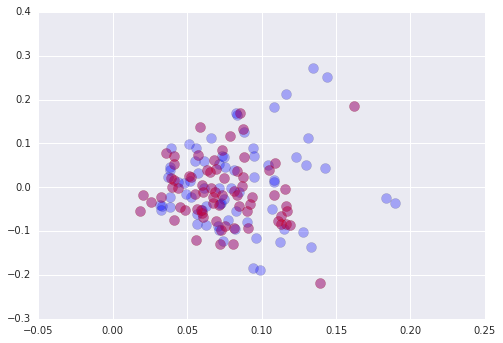

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

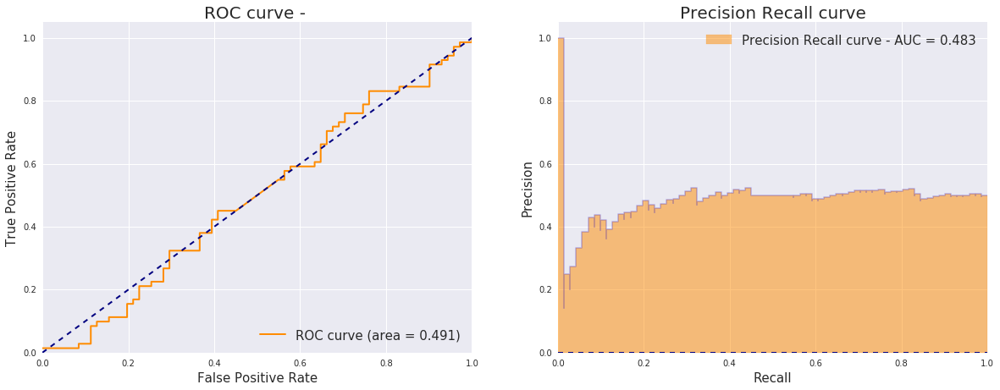

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom12_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.491   0.483              0.5            -0.017   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,V18_J01_T:3,V12_T:3,D01_J02-02_T:2,D02_J01-04...                    100.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         12.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=12, featureComposition=ph

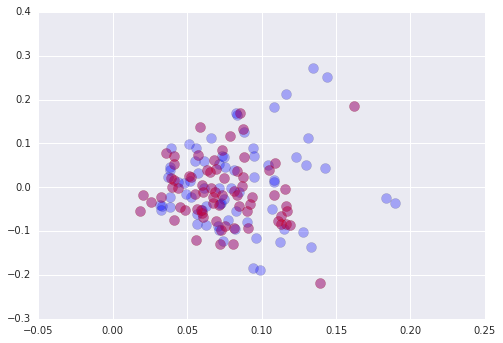

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

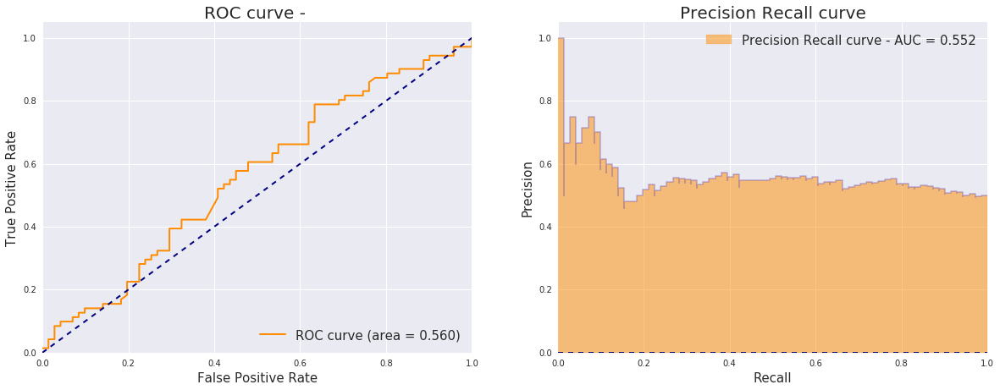

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom12_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression     0.56   0.552              0.5             0.052   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,V15-01_0:2,CASSPGYEQYF:2,D01_J01-05_T:2,V07-0...                    114.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         12.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=12, featureComposition=ph

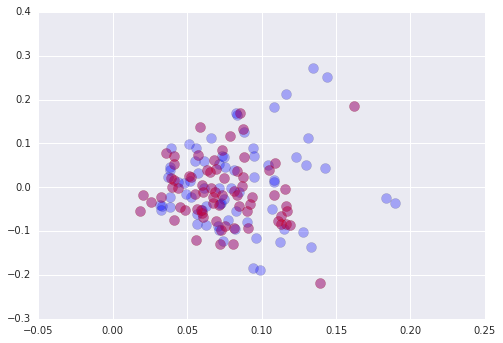

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

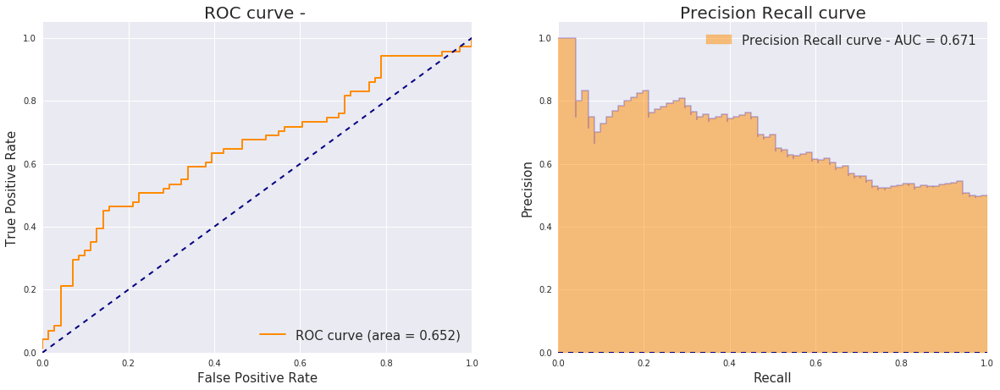

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.652   0.671              0.5             0.171   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,HDL:9,V12_T:9,V29-...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0        

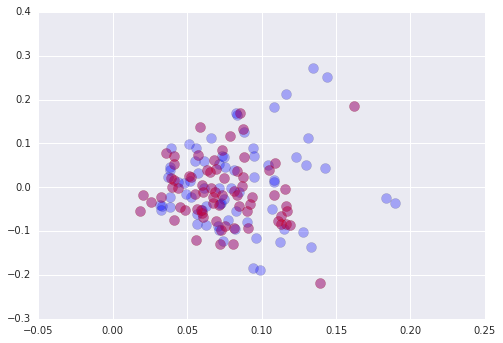

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

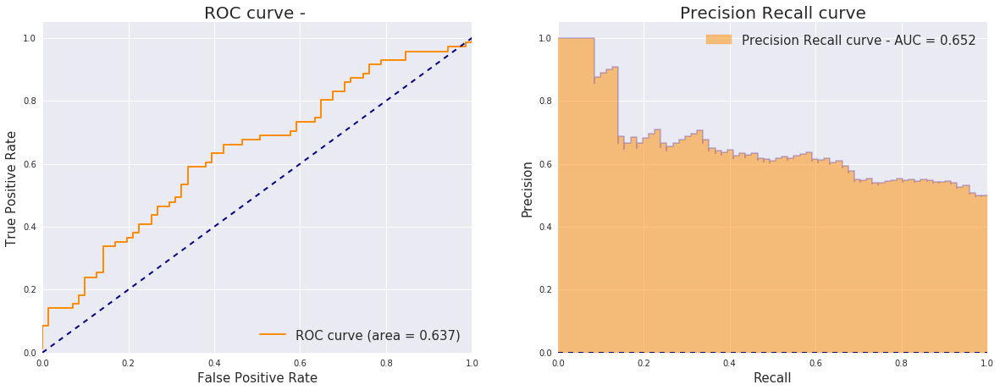

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.637   0.652              0.5             0.152   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0        

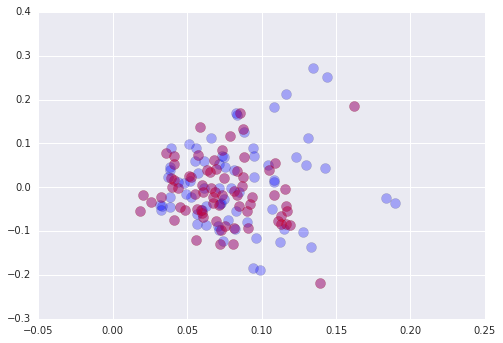

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

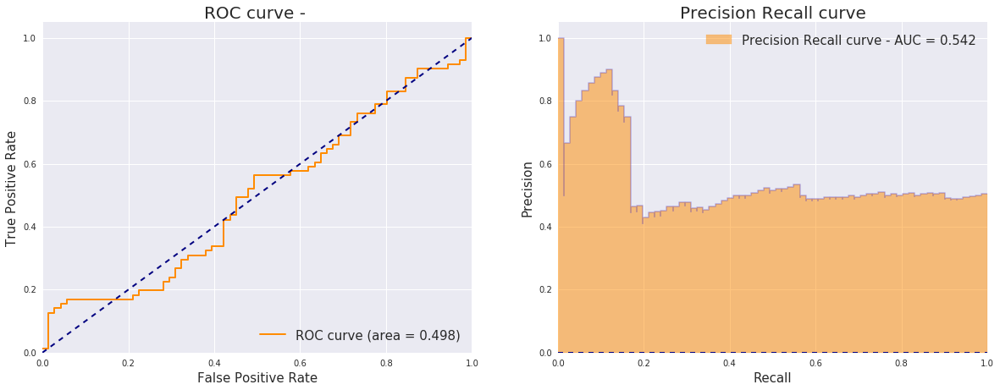

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.498   0.542              0.5             0.042   True   

  featureSelectionMethod                                      features used  \
0                 random  ,D01_J02-06_T:3,V27_J01_T:3,d3Deletion_std_T:3...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_t

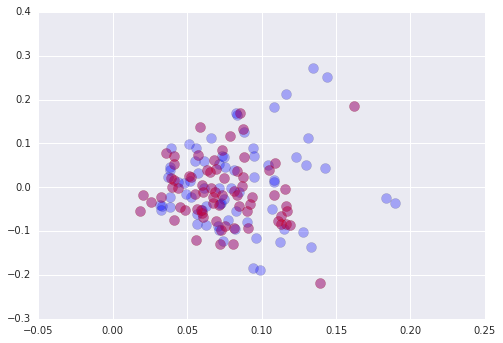

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

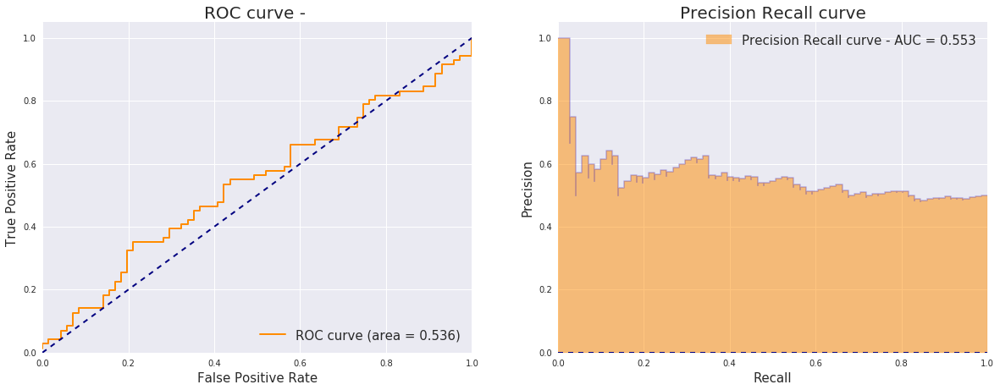

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.536   0.553              0.5             0.053   True   

  featureSelectionMethod                                      features used  \
0                 random  ,J02-04_0:3,top1000clonal_nt_1:2,V11-03_1:2,V0...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_t

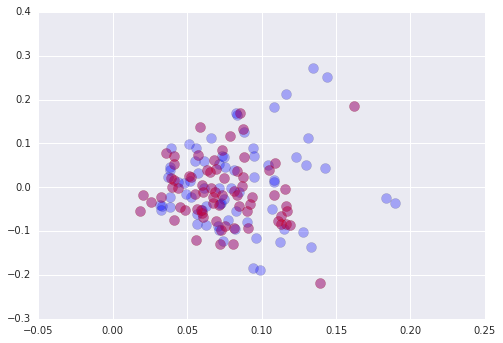

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

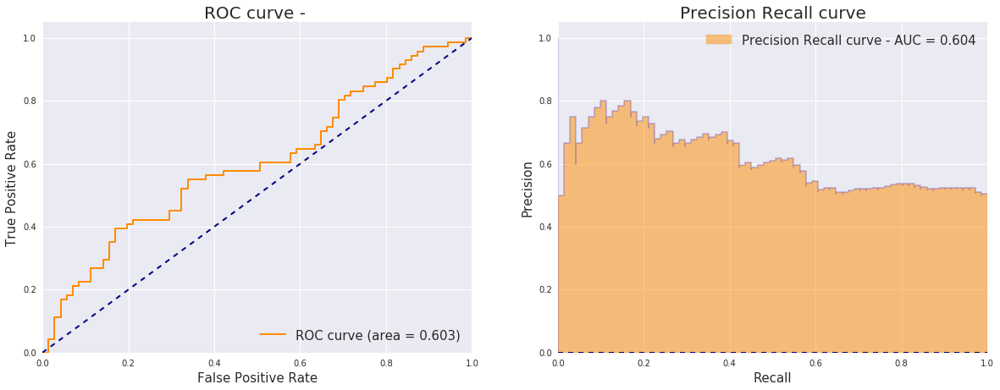

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.603   0.604              0.5             0.104   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,HDL:10,V10-01_T:10,V29-01_T:9,V29_J02_...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  n

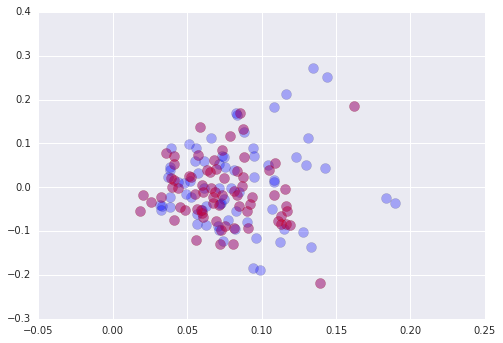

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

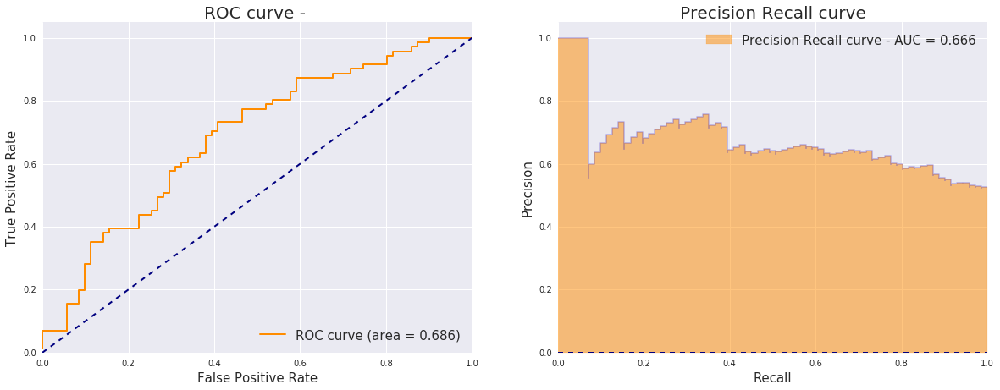

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.686   0.666              0.5             0.166   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,V09_J01_0:10,WBC:10,HDL:10,n2Insertion_mean_1...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  n

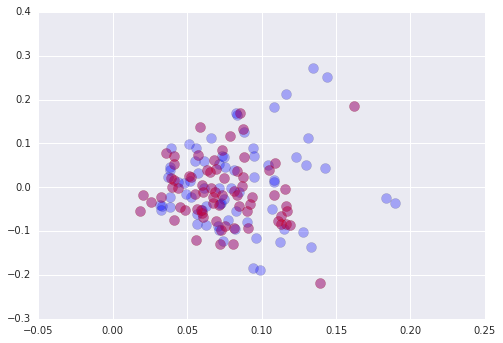

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

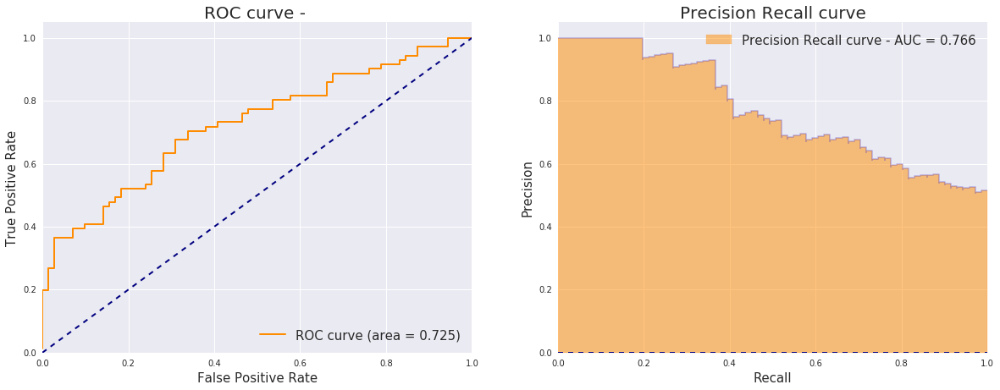

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.725   0.766              0.5             0.266   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,HDL:9,V12_T:9,V29-...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           

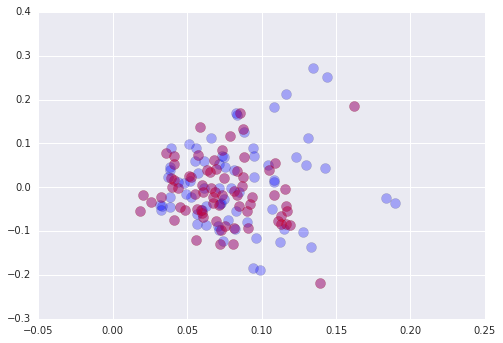

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

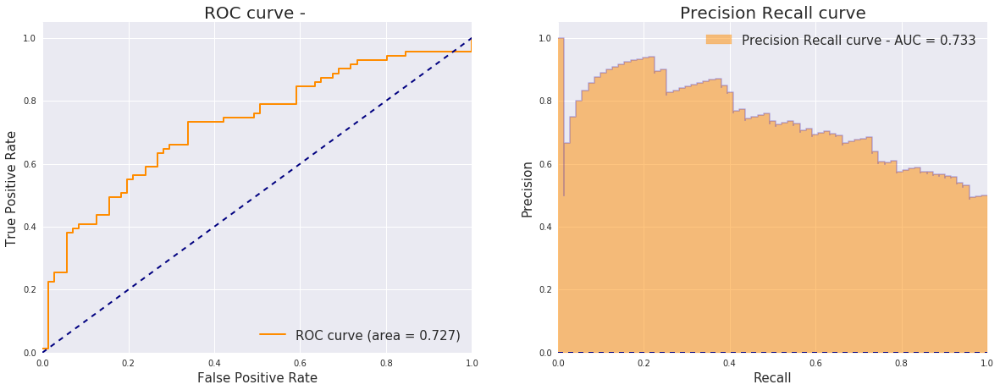

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.727   0.733              0.5             0.233   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           

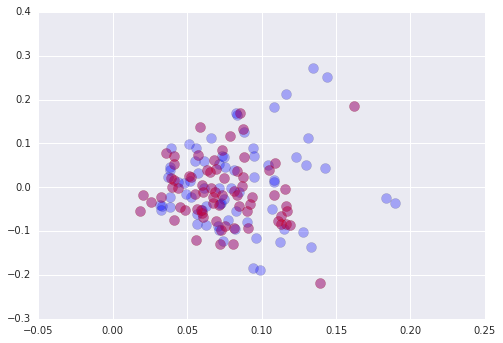

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

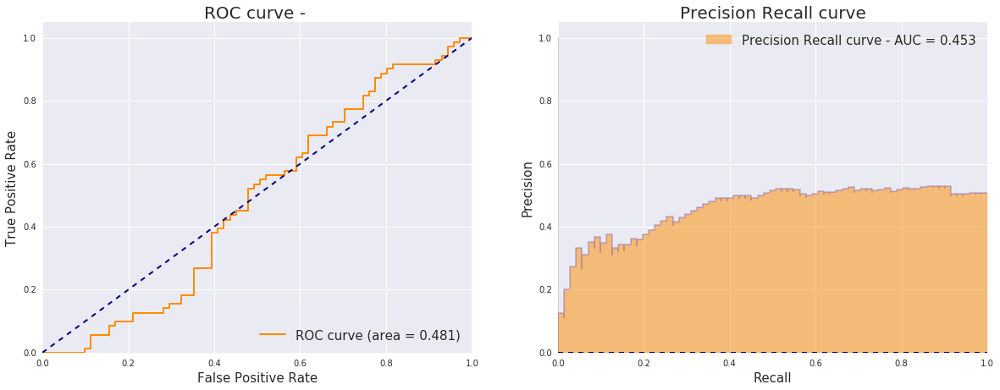

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.481   0.453              0.5            -0.047   True   

  featureSelectionMethod                                      features used  \
0                 random  ,CASSELAGGPDTQYF:4,CASSDSSGGANEQFF:3,V10_T:3,V...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_thre

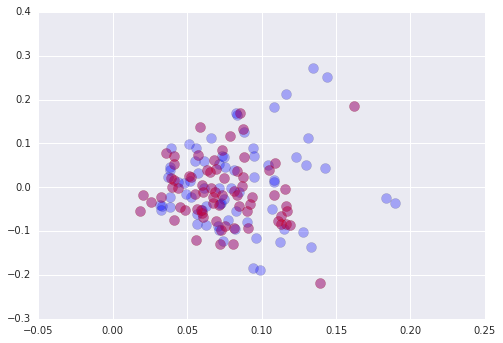

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

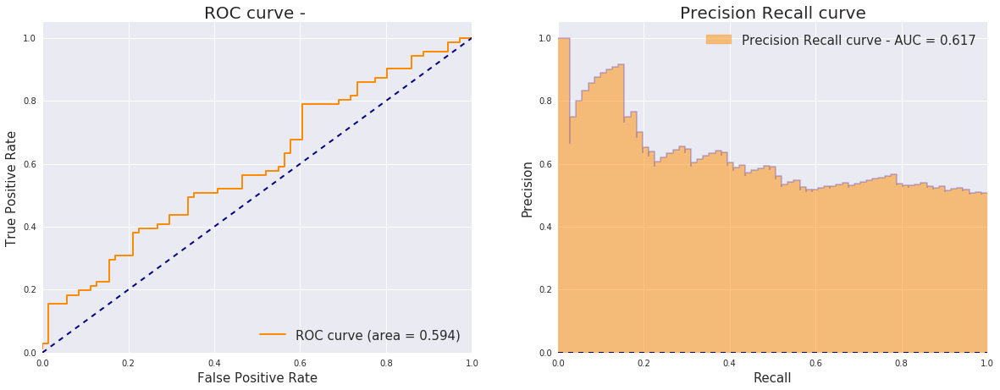

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.594   0.617              0.5             0.117   True   

  featureSelectionMethod                                      features used  \
0                 random  ,cdr3Length_std_0:2,J02-01_T:2,V27_J01_T:2,vDe...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_thre

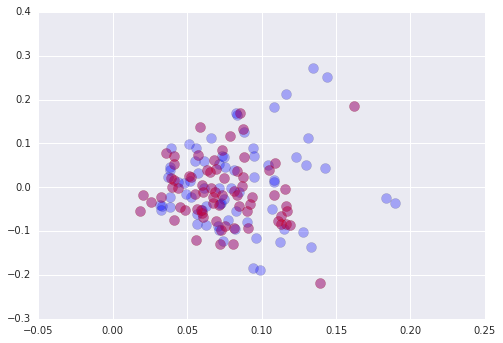

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

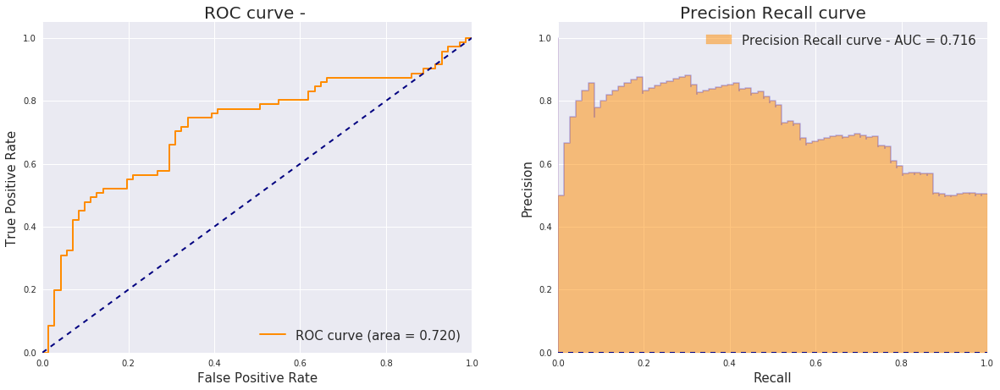

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0     0.72   0.716              0.5             0.216   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,V12_J02_T:8,V29-01_T:8,HDL:7,J01-04_T:...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_

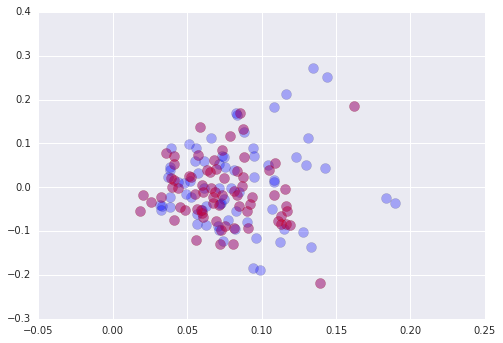

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

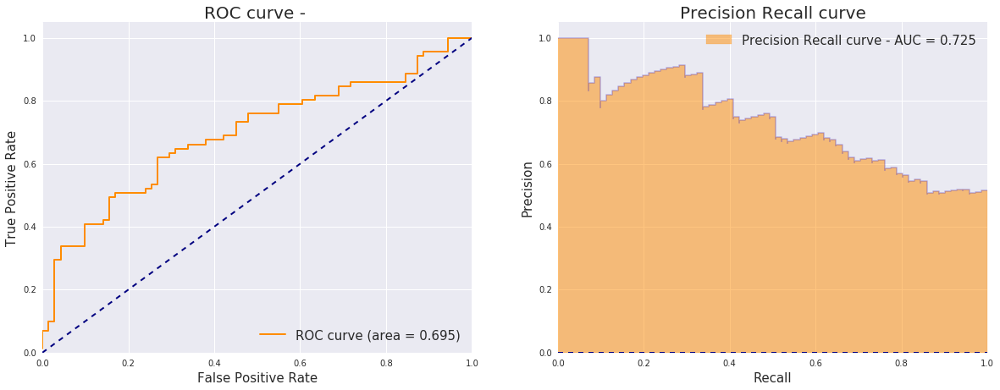

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel12_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.695   0.725              0.5             0.225   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,V12_1:9,d3Deletion_std_0:7,n2Insertion...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_

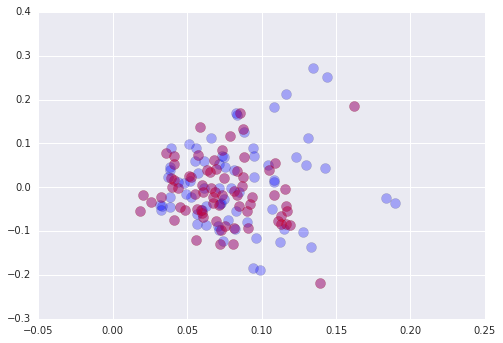

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

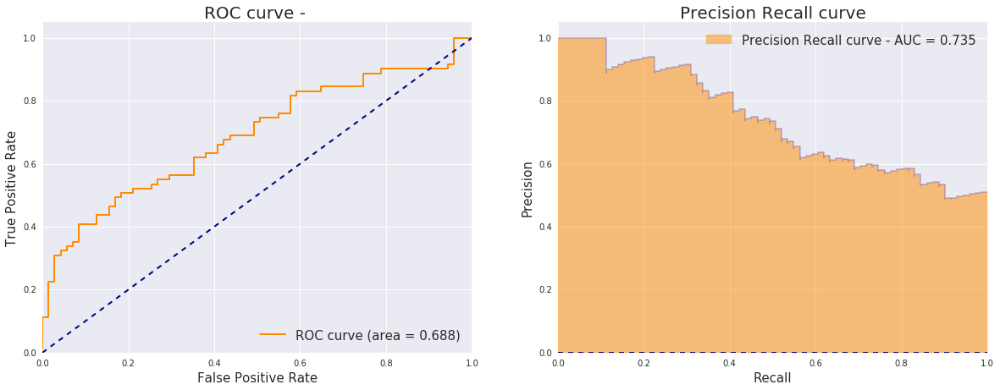

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif15_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.688   0.735              0.5             0.235   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_T:10,HDL:9,n2I...                     31.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         15.0      10.0  10.0      l1  71.0  71.0  06102018  
don

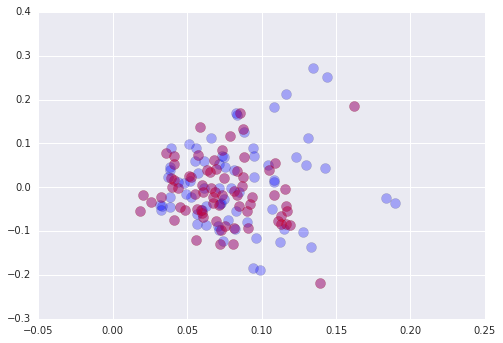

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

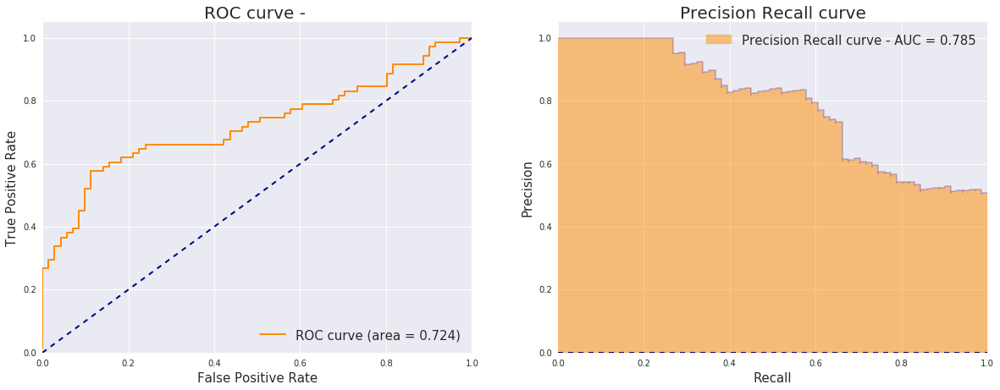

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif15_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.724   0.785              0.5             0.285   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...                     34.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         15.0      10.0  10.0      l1  71.0  71.0  06102018  
don

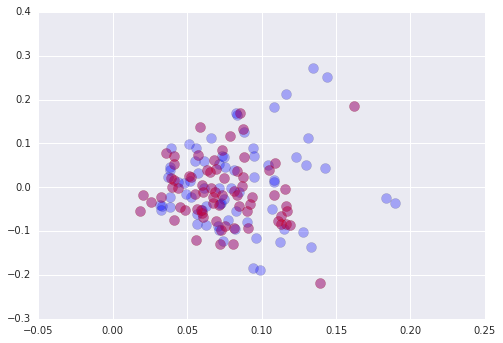

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

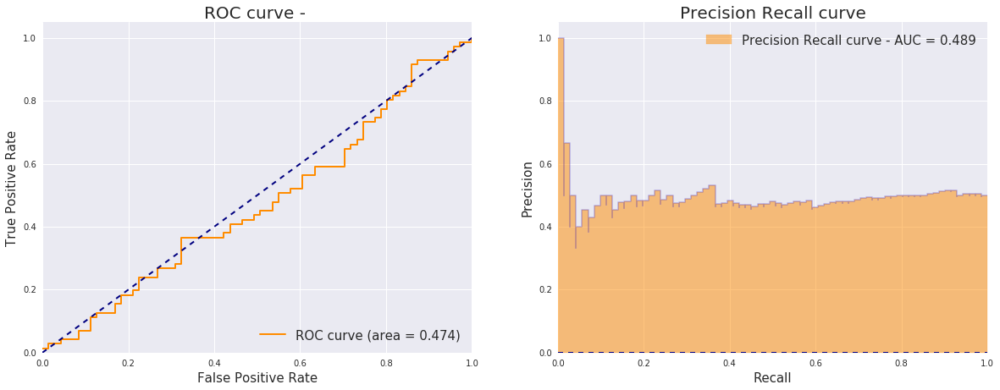

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom15_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.474   0.489              0.5            -0.011   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,V30_J01_T:5,n2Insertion_max_T:3,n1Insertion_m...                    120.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         15.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=15, featureComposition=ph

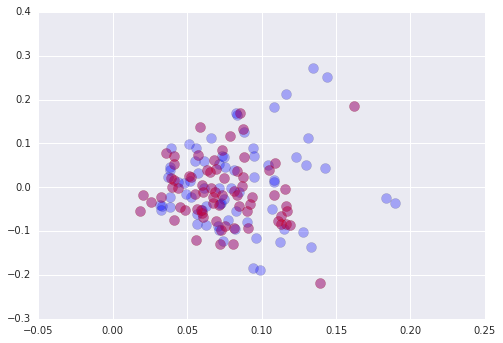

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

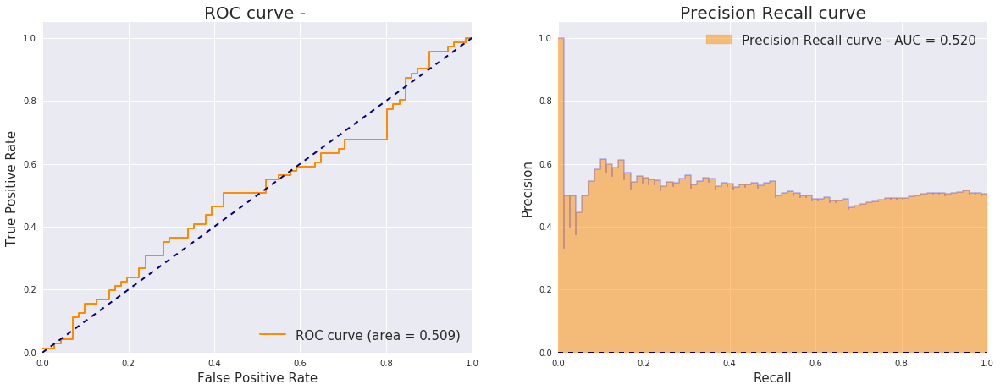

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom15_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.509    0.52              0.5              0.02   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,V14_J01_1:3,V28_J02_1:2,D01_J02-07_T:2,vDelet...                    133.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                         15.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=15, featureComposition=ph

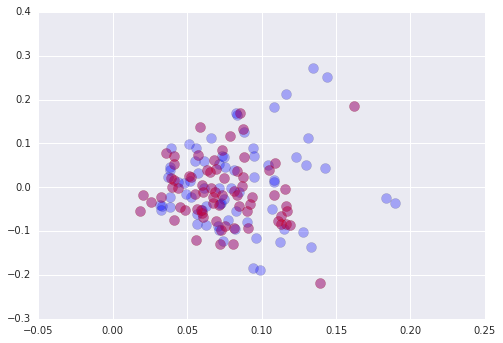

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

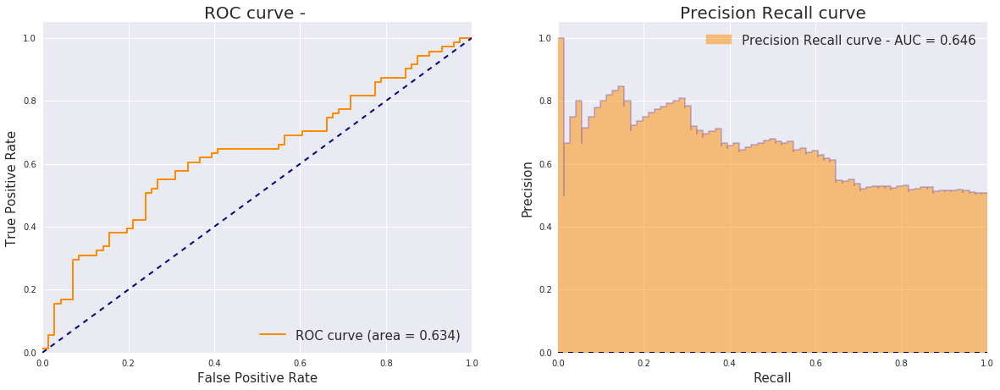

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.634   0.646              0.5             0.146   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_T:10,HDL:9,n2I...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0        

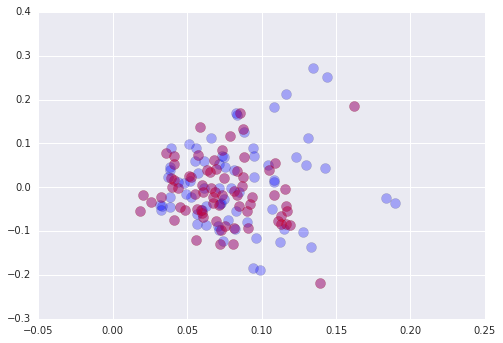

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

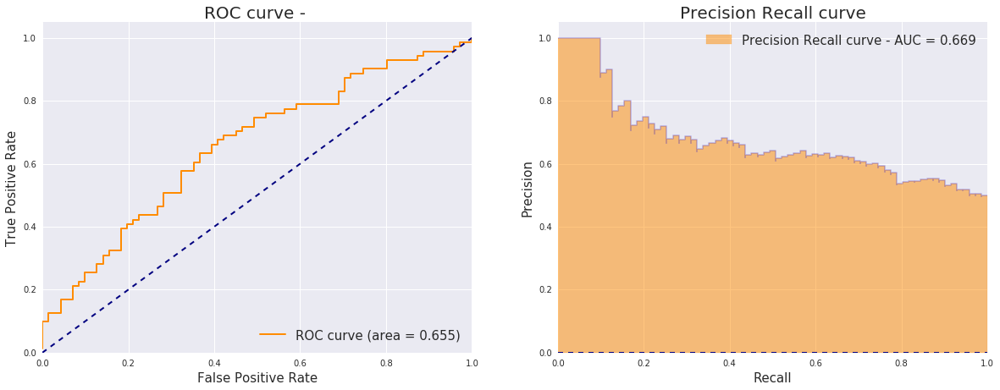

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.655   0.669              0.5             0.169   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0        

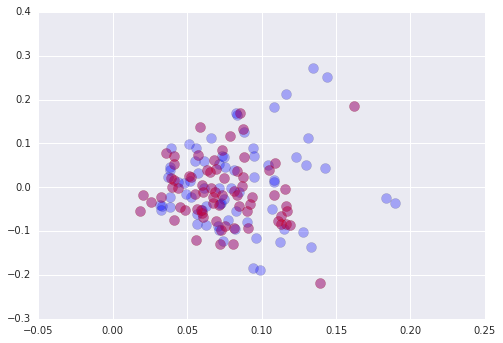

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

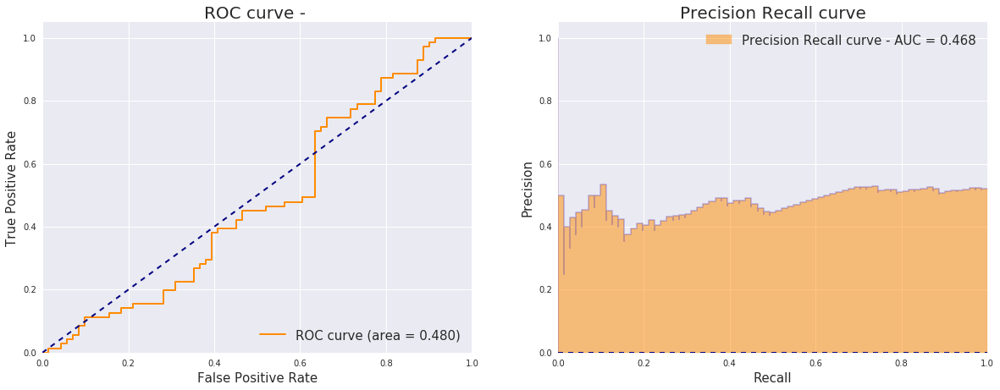

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier     0.48   0.468              0.5            -0.032   True   

  featureSelectionMethod                                      features used  \
0                 random  ,CASSLGTEAFF:3,V06_T:3,V15_J01_T:3,n2Insertion...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_t

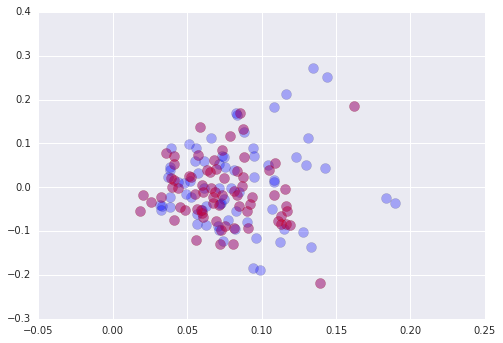

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

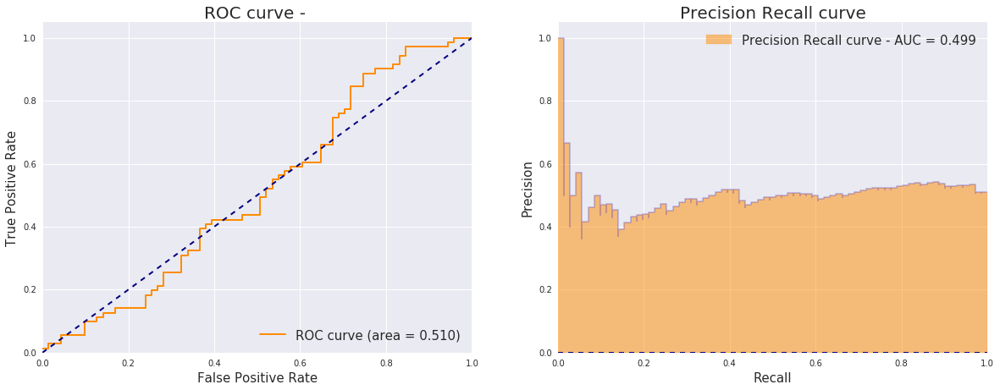

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier     0.51   0.499              0.5            -0.001   True   

  featureSelectionMethod                                      features used  \
0                 random  ,V07-03_0:2,V07-03_1:2,V18_J01_T:2,D01_J02-01_...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_t

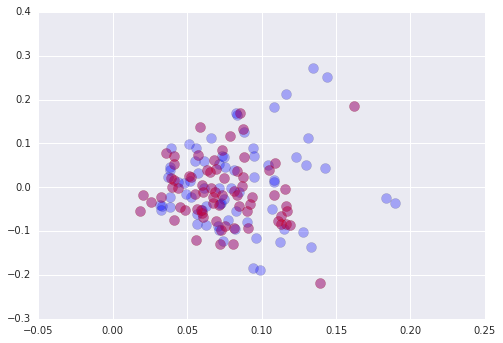

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

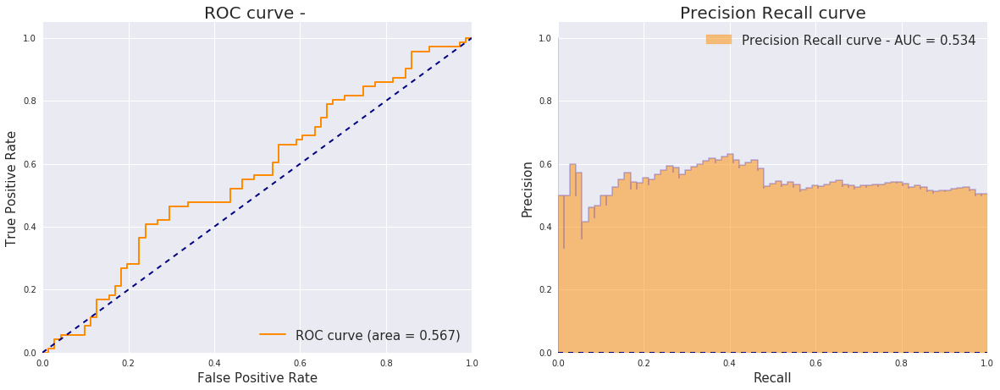

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.567   0.534              0.5             0.034   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,HDL:10,V10-01_T:10,V29-01_T:9,V29_J02_...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  n

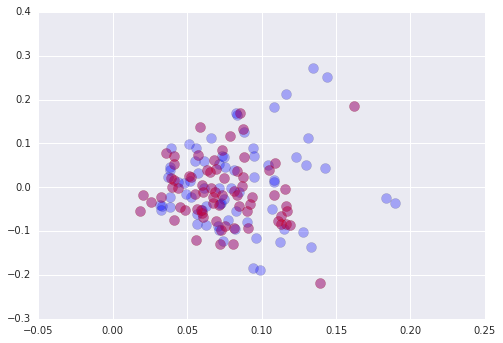

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

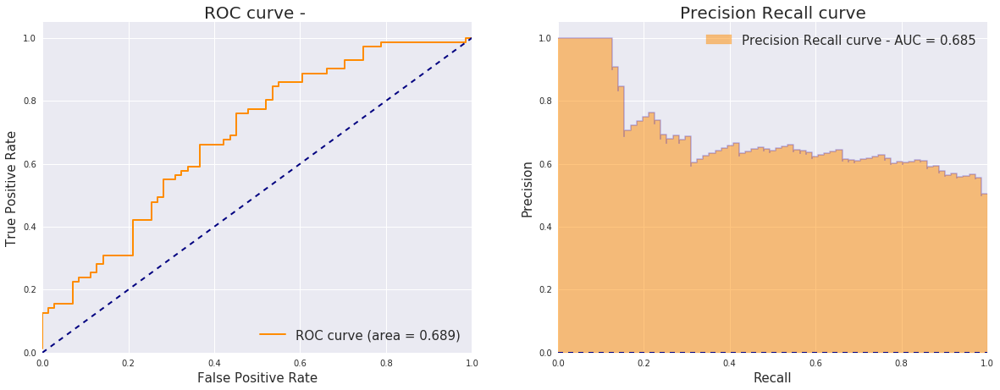

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.689   0.685              0.5             0.185   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,V09_J01_0:10,WBC:10,HDL:10,n2Insertion_mean_1...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  n

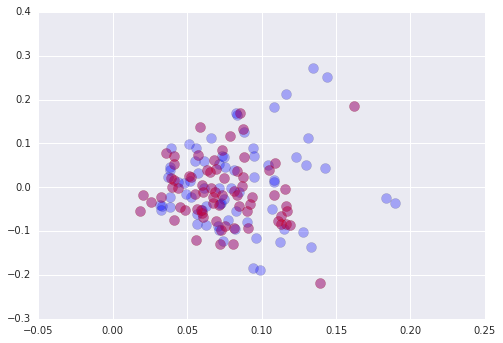

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

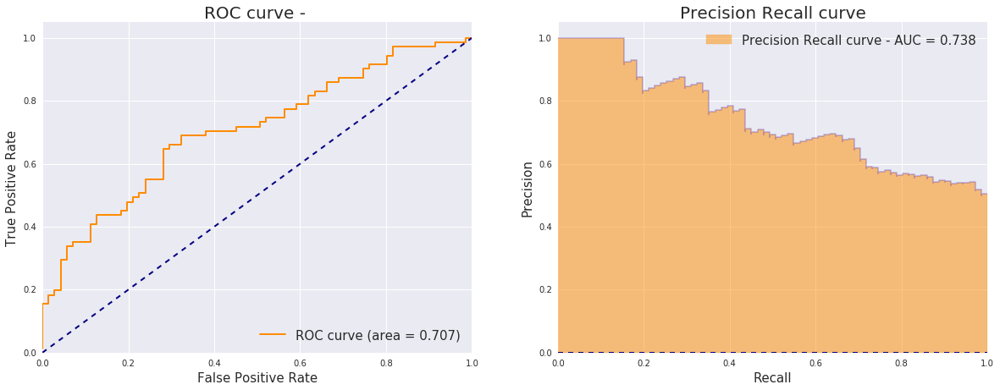

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.707   0.738              0.5             0.238   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_T:10,HDL:9,n2I...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           

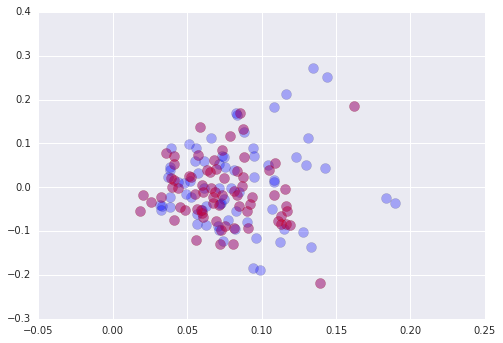

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

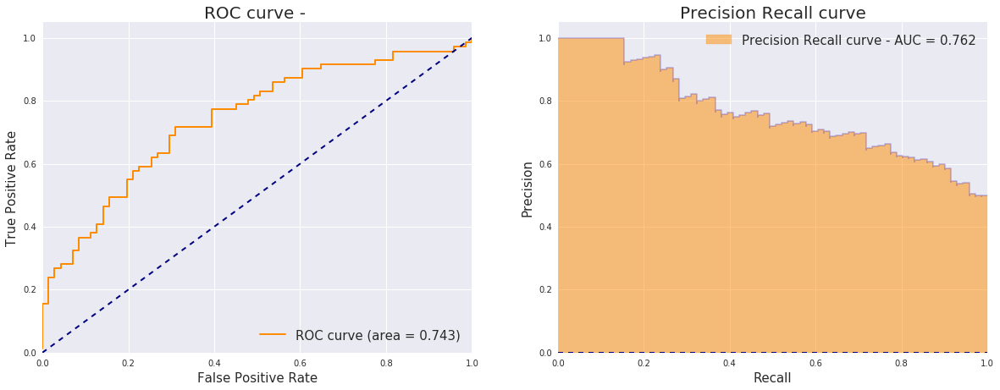

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.743   0.762              0.5             0.262   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,V12_J02_T:10,WBC:10,AST:10,V12_J02_1:10,n2Ins...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0           

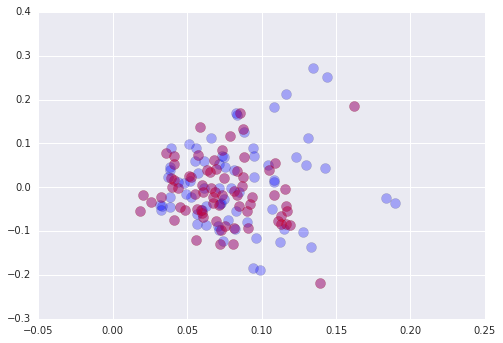

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

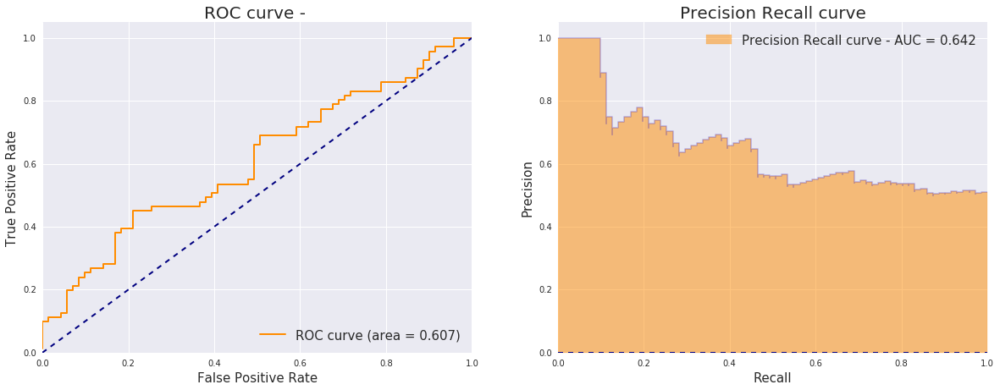

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.607   0.642              0.5             0.142   True   

  featureSelectionMethod                                      features used  \
0                 random  ,normSeqNums_per200_AA_T:3,CASSSSYEQYF:3,PC1:3...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_thre

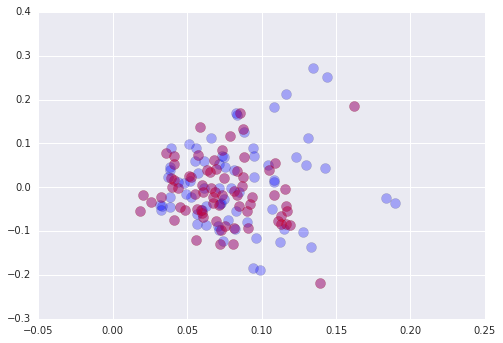

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

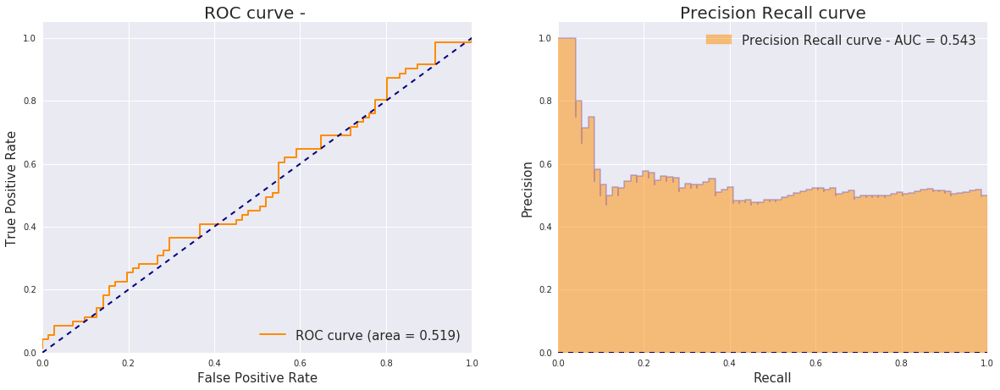

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.519   0.543              0.5             0.043   True   

  featureSelectionMethod                                      features used  \
0                 random  ,V07-09_0:4,vDeletion_mean_T:2,V28-01_T:2,V07-...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_thre

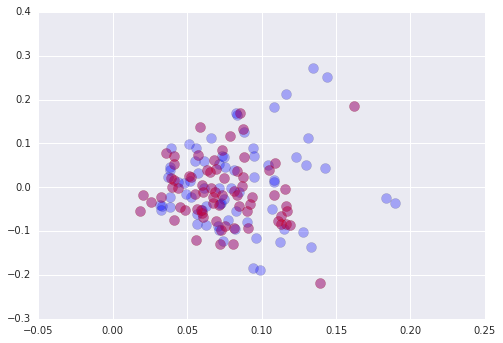

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

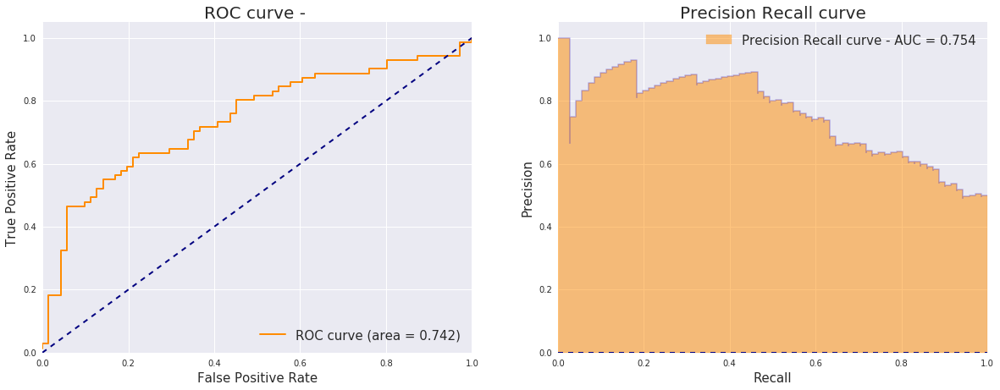

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.742   0.754              0.5             0.254   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,V12_J02_T:8,HDL:8,V29-01_T:8,V04-03_T:...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_

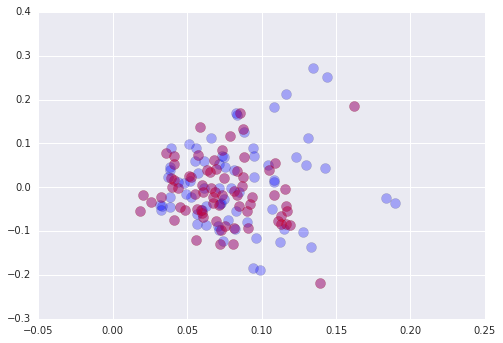

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

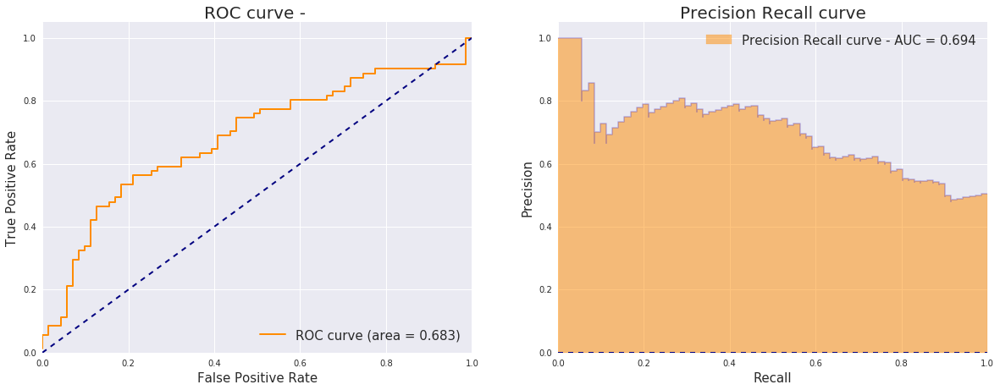

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel15_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.683   0.694              0.5             0.194   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,WBC:10,V12_1:9,d3Deletion_std_0:8,n2Insertion...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_

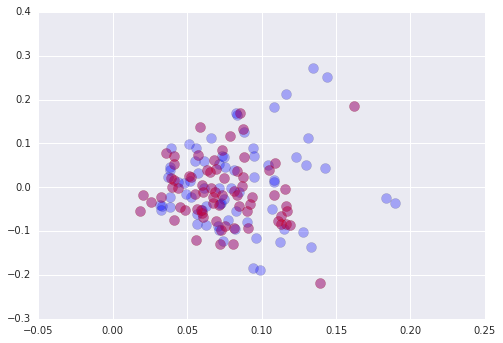

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'HbA1C', u'AST', u'Hemoglobin', u'WBC', u'HDL', u'Total Cholesterol', 'CASSDRDTGELFF', 'CASSDSSTDTQYF', 'CASSDSTSGSNEQFF', 'CASSFQETQYF', 'CASSLAYEQYF', 'CASSLEGETQYF', 'CASSLGGSSYNEQFF', 'CASSLGSSYEQYF', 'CASSLSYEQYF', 'CASSLTYEQYF', 'CASSPGQGYEQYF', 'CASSPGYEQYF', 'CASSPSTDTQYF', 'CASSQGYEQYF', 'CSARLAGGQETQYF', 'AA count_T', 'D01_J01-04_T', 'D01_J02-02_T', 'D02_J01-02_T', 'D02_J02-04_T', 'D02_J02-06_T', 'J01-02_T', 'NT count_T', 'V01_J01_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-03_T', 'V04_J02_T', 'V04_T', 'V05-03_T', 'V05-06_T', 'V05-07_T', 'V05_J02_T', 'V05_T', 'V06-01_T', 'V06-04_T', 'V06_J02_T', 'V07-05_T', 'V07-09_T', 'V09-01_T', 'V10-01_T', 'V10-03

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'BMI', u'AST', u'Hemoglobin', u'WBC', u'HDL', u'Total Cholesterol', 'CASSDRDTGELFF', 'CASSDSSTDTQYF', 'CASSLAGGTDTQYF', 'CASSLAGYEQYF', 'CASSLAYEQYF', 'CASSLEGETQYF', 'CASSLGGNTEAFF', 'CASSLGSSYEQYF', 'CASSLSYEQYF', 'CASSLTGNTEAFF', 'CASSPGQGYEQYF', 'CASSPGYEQYF', 'CASSPRETQYF', 'CASSPSTDTQYF', 'CASSPYNEQFF', 'CASSQGYEQYF', 'CSARLAGGQETQYF', 'AA count_T', 'D01_J01-04_T', 'D01_J02-02_T', 'D02_J01-02_T', 'D02_J01-03_T', 'D02_J02-03_T', 'D02_J02-06_T', 'J01-04_T', 'J02-02_T', 'NT count_T', 'V01_J01_T', 'V01_J02_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-02_T', 'V04-03_T', 'V04_J02_T', 'V04_T', 'V05-07_T', 'V06-01_T', 'V06-04_T', 'V07-02_T', 'V07-05_T', 'V07-09_T', 'V09-01_T', 'V09_

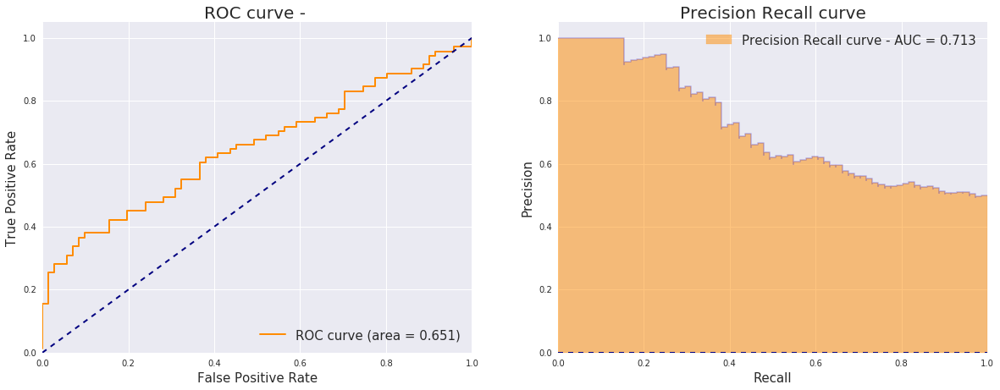

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif100_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.651   0.713              0.5             0.213   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,n1Insertion_mean_T:10,n2Insertion_mean_T:10,V...                    185.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                        100.0      10.0  10.0      l1  71.0  71.0  06102018  
do

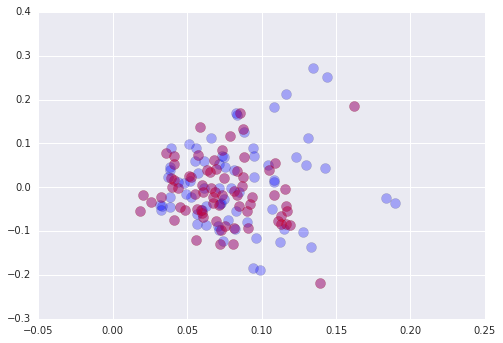

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'AST', u'Hemoglobin', u'WBC', u'HDL', 'CASSDRDTGELFF', 'CASSDSSTDTQYF', 'CASSLGSSYEQYF', 'CASSPGYEQYF', 'CASSPSTDTQYF', 'D01_J02-02_1', 'D01_J02-02_T', 'D02_J01-01_0', 'D02_J01-02_1', 'D02_J01-02_T', 'J01-01_0', 'NT count_0', 'NT count_T', 'V01_J01_0', 'V01_J01_T', 'V03_J01_T', 'V04-02_0', 'V04_0', 'V04_J02_0', 'V04_J02_T', 'V05-03_1', 'V05-04_0', 'V06-01_0', 'V06-04_1', 'V06-04_T', 'V07-09_1', 'V07-09_T', 'V10-02_0', 'V11-02_0', 'V11-02_1', 'V11-02_T', 'V11_0', 'V11_J01_0', 'V11_J01_T', 'V11_T', 'V12-01_T', 'V12-05_1', 'V12-05_T', 'V12_1', 'V12_J02_1', 'V12_J02_T', 'V12_T', 'V14-01_1', 'V14-01_T', 'V14_J01_1', 'V14_J01_T', 'V14_J02_1', 'V15_J02_0', 'V16-01_1

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'BMI', u'AST', u'WBC', u'HDL', 'CASSDRDTGELFF', 'CASSLAGGTDTQYF', 'CASSLEGETQYF', 'CASSLGSSYEQYF', 'CASSPSTDTQYF', 'CASSQGYEQYF', 'D01_J02-02_1', 'D01_J02-02_T', 'D01_J02-06_0', 'D02_J01-02_1', 'NT count_0', 'NT count_T', 'V01_J01_0', 'V01_J01_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-02_0', 'V04_0', 'V04_J02_0', 'V04_J02_1', 'V04_J02_T', 'V04_T', 'V05-04_0', 'V05-07_0', 'V05-07_T', 'V05-08_0', 'V06-01_0', 'V06-04_T', 'V07-05_T', 'V07-09_1', 'V07-09_T', 'V09-01_0', 'V09-01_1', 'V09-01_T', 'V09_J01_0', 'V10-02_0', 'V11-02_0', 'V11-02_1', 'V11-02_T', 'V11_0', 'V11_J01_0', 'V11_T', 'V12-01_T', 'V12-05_1', 'V12-05_T', 'V12_1', 'V12_J02_1', 'V12_J02_T', 'V12_T', 'V13_J02_1', 'V14-01

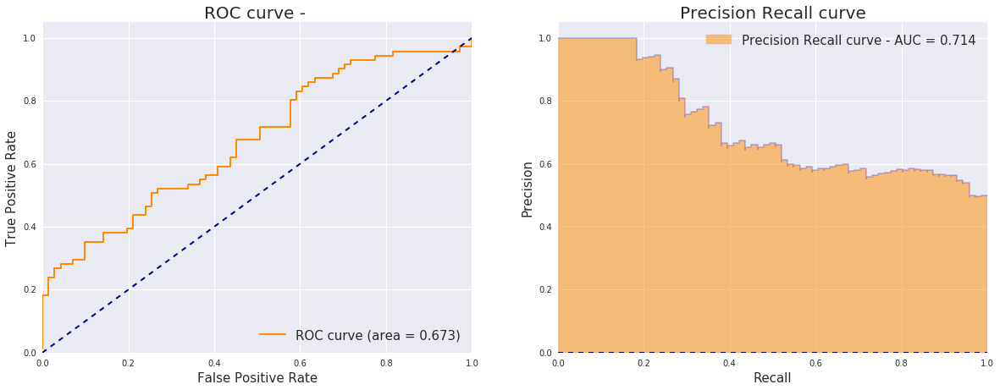

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif100_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.673   0.714              0.5             0.214   

   useCV                  featureSelectionMethod  \
0   True  <function f_classif at 0x7f83a3c7db18>   

                                       features used  total num features used  \
0  ,n2Insertion_mean_T:10,V12-05_1:10,V11-02_T:10...                    235.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                        100.0      10.0  10.0      l1  71.0  71.0  06102018  
do

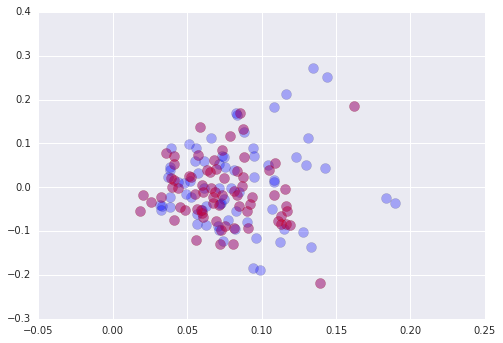

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['top1000clonal_nt_T', 'V05-03_T', 'J01-05_T', 'V05_T', 'D02_J02-06_T', 'V06_T', 'D01_T', 'V14_J02_T', 'CASSLQETQYF', 'D02_T', u'AST', 'CASSSTDTQYF', 'V21-01_T', 'CASSFGETQYF', 'n1Insertion_std_T', 'D01_J02-07_T', 'CASSLGGNEQFF', u'Total Cholesterol', 'V23_J02_T', 'V03-01_T', 'V11_J01_T', 'PC2', 'jDeletion_max_T', 'n2Insertion_max_T', 'V01-01_T', 'CASSLGGYEQYF', 'V28-01_T', 'V14_J01_T', 'V06-07_T', 'V23-01_T', 'jDeletion_std_T', 'CASSLGETQYF', 'PC5', 'V04_J01_T', 'CASSLGQGYGYTF', 'J02-06_T', 'CASSPSSYEQYF', 'D01_J01-05_T', 'CASSPSTDTQYF', 'V30_J01_T', 'J01-01_T', 'V29_J01_T', 'V06-01_T', 'CASSIGTDTQYF', 'D02_J01-02_T', 'top10clonal_aa_T', 'CASSLAGSTDTQYF', u'HDL', 'CASSLGGDTQYF', 'V05-01_T', 'V15_J02_T', u'eGFR by CKD-E

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['CASSLSYEQYF', 'D01_J01-01_T', 'shannon_aa_T', 'V30-01_T', 'V07_J01_T', 'V21_J01_T', 'V02_J02_T', 'V04-02_T', 'V05-04_T', 'CASSPSSYEQYF', 'V07-03_T', 'J01-01_T', 'V01_J02_T', 'V23_T', u'eGFR by CKD-EPI', 'V06_T', 'gc_content_T', 'V15_J01_T', 'D02_J02-02_T', 'CASSQGYEQYF', 'D01_J02-01_T', 'CASSDRDTGELFF', 'D02_J01-04_T', 'CASSYGETQYF', 'V05_T', 'V01-01_T', 'CASSLGSYEQYF', 'frequencyCount (%)_std_T', 'vDeletion_mean_T', 'n2Insertion_mean_T', 'V10-02_T', 'prod_stat_mean_T', 'V05-03_T', 'n2Insertion_max_T', u'HbA1C', 'CASSLAYEQYF', 'CASSLNTEAFF', 'NT count_T', 'CASSLGQNTEAFF', 'n1Insertion_mean_T', 'D02_J01-02_T', 'CASSLAGSSYNEQFF', 'V02-01_T', 'CASSLSTDTQYF', 'V09_J01_T', 'V18-01_T', 'D02_J01-06_T', 'V05_J01_T', 'D02_J02-

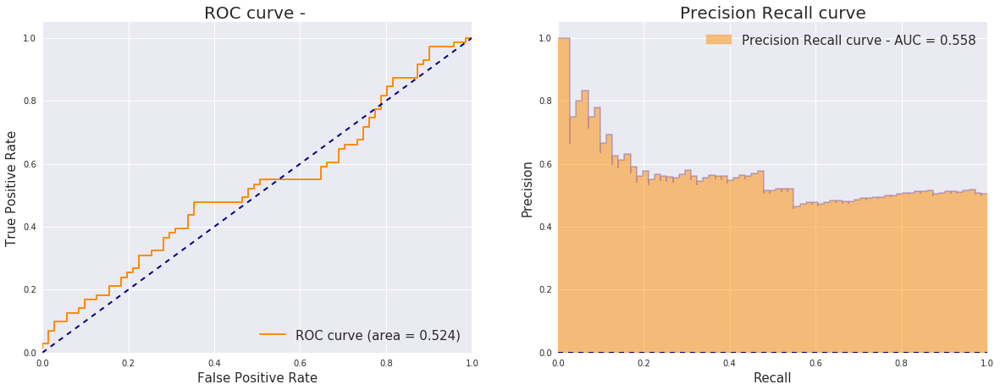

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom100_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.524   0.558              0.5             0.058   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,D01_J01-06_T:8,Total Cholesterol:8,V01-01_T:8...                    274.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                        100.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=100, featureComposition=

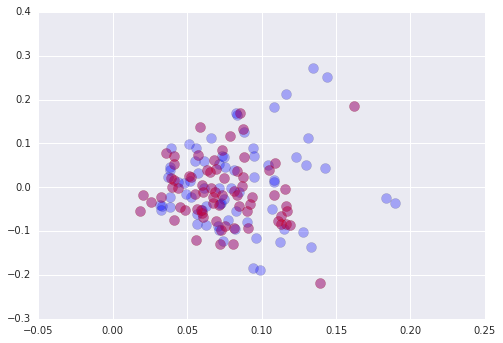

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['gc_content_T', 'V25-01_T', 'J01-04_1', 'n1Insertion_max_0', 'V30_J01_0', 'D01_J02-01_1', 'V11-03_1', 'top1000clonal_nt_1', 'vDeletion_max_1', 'V10_J02_0', 'top1000clonal_nt_T', 'jDeletion_std_T', 'mean_nt_per_aa_T', 'D01_J01-02_T', 'V06-04_0', 'V25_J02_1', 'V07-09_1', 'CASSSTDTQYF', 'CASSLQGYEQYF', 'V12_J01_1', 'CASSQGYEQYF', 'D02_J02-02_0', 'V29_J01_T', 'V05-04_0', 'd3Deletion_std_0', 'CASSPGQGYEQYF', 'V20-01_T', 'PC7', 'V07_J01_1', 'n1Insertion_std_T', 'V05_1', 'D02_J01-01_0', 'V14-01_1', 'V05-08_T', 'V30_J02_1', 'V06_T', 'V07-05_0', 'V27_J01_1', 'V07_J01_0', 'V04-03_T', 'd5Deletion_std_1', 'V27_J02_1', 'V21_J02_0', 'V15_J02_T', 'J02-03_0', 'V06_1', 'D02_J01-03_1', 'V04_J02_1', 'V20_J01_1', 'V06_J02_0', 'V05-05_T', 

generating plots...
0.6034516960920453


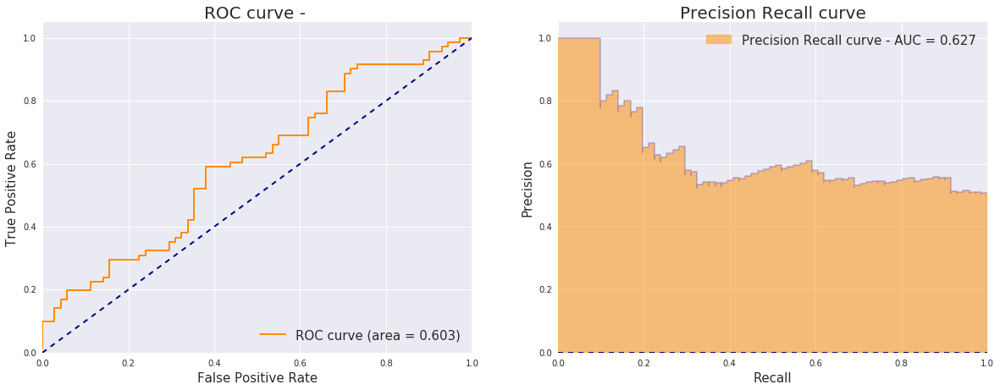

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LogisticRegression/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom100_C10_penaltyl1_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

            modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  \
0  LogisticRegression    0.603   0.627              0.5             0.127   

   useCV featureSelectionMethod  \
0   True                 random   

                                       features used  total num features used  \
0  ,D02_J02-03_T:6,V04_1:6,cdr3Length_mean_1:5,V1...                    505.0   

   Num features used per split  n_splits     C penalty  nPos  nNeg     cdate  
0                        100.0      10.0  10.0      l1  71.0  71.0  06102018  
done!!
******k=100, featureComposition=

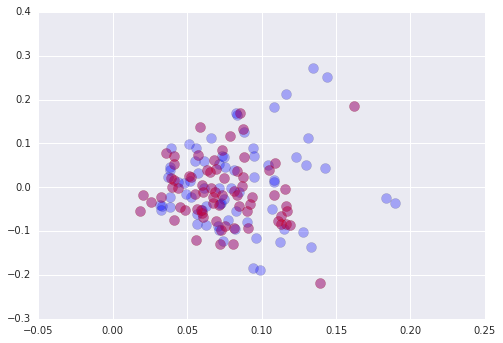

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'HbA1C', u'AST', u'Hemoglobin', u'WBC', u'HDL', u'Total Cholesterol', 'CASSDRDTGELFF', 'CASSDSSTDTQYF', 'CASSDSTSGSNEQFF', 'CASSFQETQYF', 'CASSLAYEQYF', 'CASSLEGETQYF', 'CASSLGGSSYNEQFF', 'CASSLGSSYEQYF', 'CASSLSYEQYF', 'CASSLTYEQYF', 'CASSPGQGYEQYF', 'CASSPGYEQYF', 'CASSPSTDTQYF', 'CASSQGYEQYF', 'CSARLAGGQETQYF', 'AA count_T', 'D01_J01-04_T', 'D01_J02-02_T', 'D02_J01-02_T', 'D02_J02-04_T', 'D02_J02-06_T', 'J01-02_T', 'NT count_T', 'V01_J01_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-03_T', 'V04_J02_T', 'V04_T', 'V05-03_T', 'V05-06_T', 'V05-07_T', 'V05_J02_T', 'V05_T', 'V06-01_T', 'V06-04_T', 'V06_J02_T', 'V07-05_T', 'V07-09_T', 'V09-01_T', 'V10-01_T', 'V10-03

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'BMI', u'AST', u'Hemoglobin', u'WBC', u'HDL', u'Total Cholesterol', 'CASSDRDTGELFF', 'CASSDSSTDTQYF', 'CASSLAGGTDTQYF', 'CASSLAGYEQYF', 'CASSLAYEQYF', 'CASSLEGETQYF', 'CASSLGGNTEAFF', 'CASSLGSSYEQYF', 'CASSLSYEQYF', 'CASSLTGNTEAFF', 'CASSPGQGYEQYF', 'CASSPGYEQYF', 'CASSPRETQYF', 'CASSPSTDTQYF', 'CASSPYNEQFF', 'CASSQGYEQYF', 'CSARLAGGQETQYF', 'AA count_T', 'D01_J01-04_T', 'D01_J02-02_T', 'D02_J01-02_T', 'D02_J01-03_T', 'D02_J02-03_T', 'D02_J02-06_T', 'J01-04_T', 'J02-02_T', 'NT count_T', 'V01_J01_T', 'V01_J02_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-02_T', 'V04-03_T', 'V04_J02_T', 'V04_T', 'V05-07_T', 'V06-01_T', 'V06-04_T', 'V07-02_T', 'V07-05_T', 'V07-09_T', 'V09-01_T', 'V09_

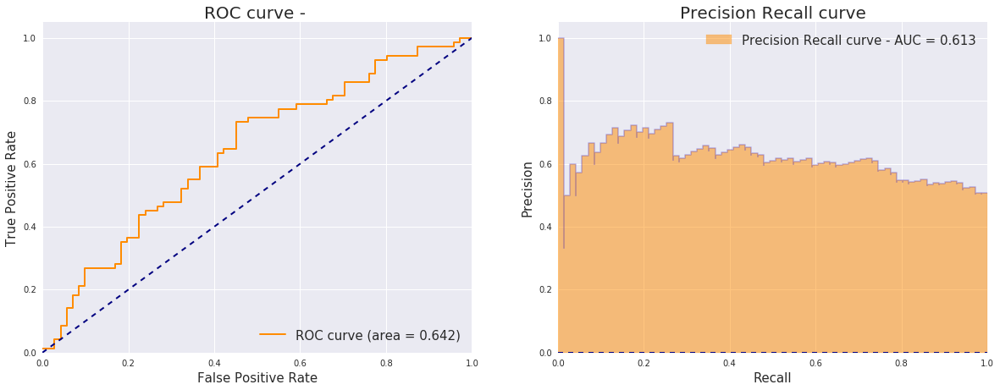

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.642   0.613              0.5             0.113   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,n1Insertion_mean_T:10,n2Insertion_mean_T:10,V...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0       

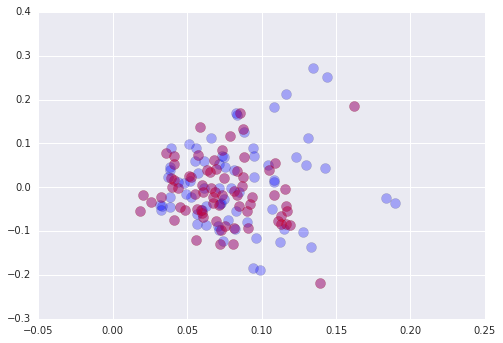

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'AST', u'Hemoglobin', u'WBC', u'HDL', 'CASSDRDTGELFF', 'CASSDSSTDTQYF', 'CASSLGSSYEQYF', 'CASSPGYEQYF', 'CASSPSTDTQYF', 'D01_J02-02_1', 'D01_J02-02_T', 'D02_J01-01_0', 'D02_J01-02_1', 'D02_J01-02_T', 'J01-01_0', 'NT count_0', 'NT count_T', 'V01_J01_0', 'V01_J01_T', 'V03_J01_T', 'V04-02_0', 'V04_0', 'V04_J02_0', 'V04_J02_T', 'V05-03_1', 'V05-04_0', 'V06-01_0', 'V06-04_1', 'V06-04_T', 'V07-09_1', 'V07-09_T', 'V10-02_0', 'V11-02_0', 'V11-02_1', 'V11-02_T', 'V11_0', 'V11_J01_0', 'V11_J01_T', 'V11_T', 'V12-01_T', 'V12-05_1', 'V12-05_T', 'V12_1', 'V12_J02_1', 'V12_J02_T', 'V12_T', 'V14-01_1', 'V14-01_T', 'V14_J01_1', 'V14_J01_T', 'V14_J02_1', 'V15_J02_0', 'V16-01_1

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'BMI', u'AST', u'WBC', u'HDL', 'CASSDRDTGELFF', 'CASSLAGGTDTQYF', 'CASSLEGETQYF', 'CASSLGSSYEQYF', 'CASSPSTDTQYF', 'CASSQGYEQYF', 'D01_J02-02_1', 'D01_J02-02_T', 'D01_J02-06_0', 'D02_J01-02_1', 'NT count_0', 'NT count_T', 'V01_J01_0', 'V01_J01_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-02_0', 'V04_0', 'V04_J02_0', 'V04_J02_1', 'V04_J02_T', 'V04_T', 'V05-04_0', 'V05-07_0', 'V05-07_T', 'V05-08_0', 'V06-01_0', 'V06-04_T', 'V07-05_T', 'V07-09_1', 'V07-09_T', 'V09-01_0', 'V09-01_1', 'V09-01_T', 'V09_J01_0', 'V10-02_0', 'V11-02_0', 'V11-02_1', 'V11-02_T', 'V11_0', 'V11_J01_0', 'V11_T', 'V12-01_T', 'V12-05_1', 'V12-05_T', 'V12_1', 'V12_J02_1', 'V12_J02_T', 'V12_T', 'V13_J02_1', 'V14-01

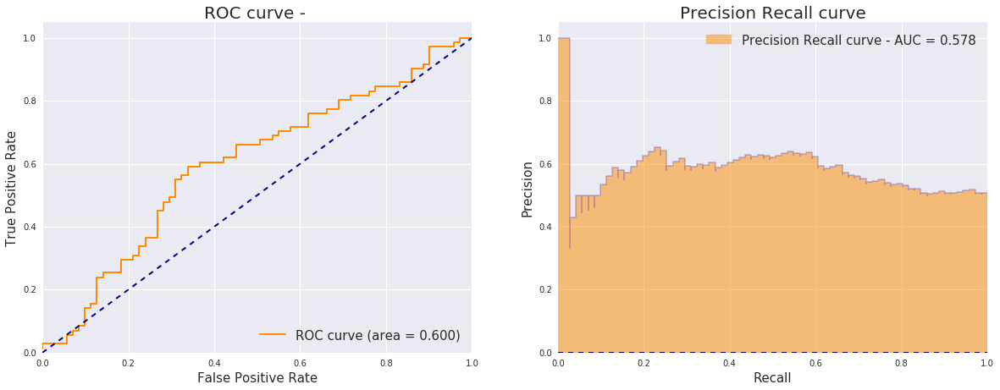

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier      0.6   0.578              0.5             0.078   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,n2Insertion_mean_T:10,V12-05_1:10,V11-02_T:10...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0       

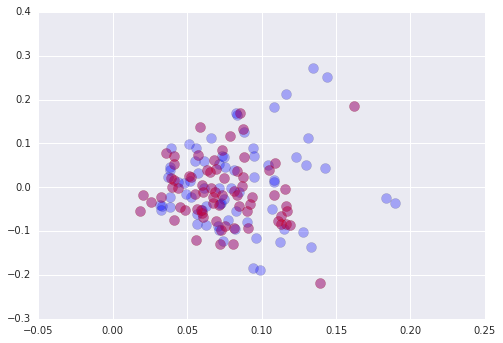

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['D02_J02-03_T', 'V04-01_T', 'CASSLTGNTEAFF', 'V25_J01_T', 'CASSLGQNTEAFF', 'jDeletion_mean_T', 'V14-01_T', 'J01-02_T', 'D01_J02-03_T', 'V28_J02_T', 'V06-01_T', 'n2Insertion_mean_T', 'V01_J02_T', 'CASSLGGNTEAFF', 'CASSLAGSSYNEQFF', 'CASSLAYEQYF', 'D01_J02-07_T', 'CSARLAGGQETQYF', 'V05-04_T', 'V19_J02_T', 'V05-01_T', 'vDeletion_mean_T', 'V05_J02_T', 'D02_J01-04_T', 'D02_J01-01_T', 'V10_T', 'V07-05_T', 'frequencyCount (%)_mean_T', u'BMI', 'top10clonal_aa_T', 'J02-06_T', 'CASSLNTEAFF', u'Age', u'HDL', 'CASSPQGYEQYF', 'n1Insertion_max_T', 'V19-01_T', 'V15_J01_T', 'V19_J01_T', 'V05-06_T', 'V29-01_T', 'V02_J01_T', 'V07-06_T', 'CASSPSYEQYF', 'D01_J01-02_T', 'V11-02_T', 'J01-01_T', 'V13-01_T', 'CASSLAGSTDTQYF', 'V11_J01_T', 'CA

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['vDeletion_max_T', 'V02_J02_T', 'CASSDSTSGSNEQFF', 'CASSLGQNTEAFF', 'AA count_T', 'V07-04_T', 'V03_T', u'HDL', 'V18_J01_T', 'V23_J01_T', 'V25_J02_T', 'V30_J01_T', 'CASSLRETQYF', u'BMI', 'V05-03_T', 'V06-06_T', 'V12_T', u'Total Cholesterol', u'Age', 'CASSLAGSTDTQYF', 'D02_J02-01_T', 'D02_T', 'CASSSQETQYF', 'J02-04_T', 'V28_J02_T', 'V06-04_T', 'V29-01_T', 'CASSLTYEQYF', 'V20_J02_T', 'normSeqNums_per200_AA_T', 'D02_J01-03_T', 'V15_J02_T', 'J02-06_T', 'V03_J02_T', 'V05_J02_T', 'V12-01_T', 'V28_J01_T', 'prod_stat_mean_T', 'V14_J01_T', 'D02_J02-04_T', 'CSARLAGGQETQYF', 'V13_J02_T', 'V15-01_T', 'CASSLGQGYGYTF', 'CASSLYNEQFF', 'J01-05_T', 'V07_J01_T', 'CASSPGQGYEQYF', 'V07_J02_T', 'CASSLGGNTEAFF', 'V19-01_T', 'V01_J02_T', 'V02

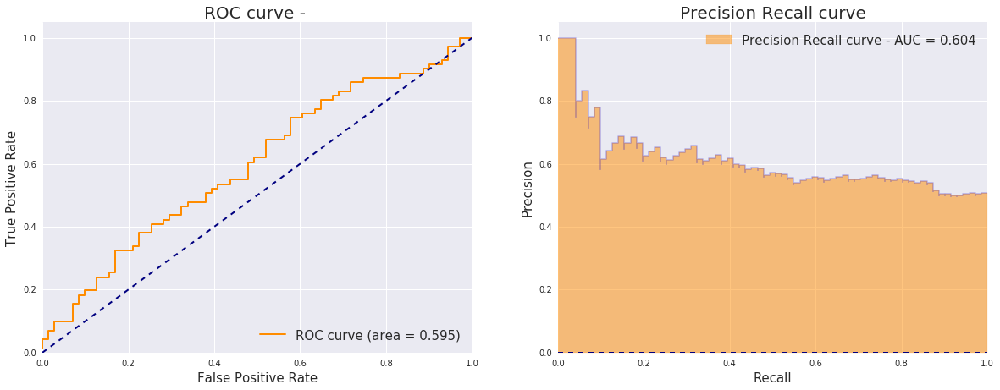

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.595   0.604              0.5             0.104   True   

  featureSelectionMethod                                      features used  \
0                 random  ,CASSSQETQYF:7,CASSLNTEAFF:7,D02_T:7,jDeletion...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_

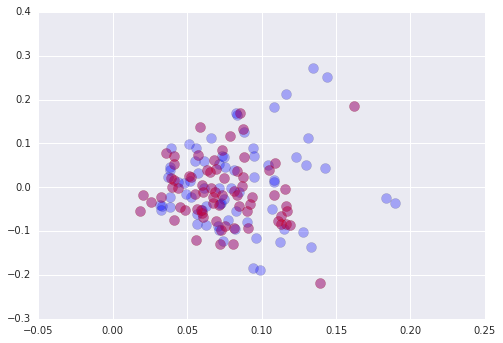

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['V10-01_T', 'V04-01_0', 'V30_J01_T', 'V10-03_0', 'CASSLQGYEQYF', 'V12_J01_T', 'D01_J01-04_1', 'V28_J02_1', 'shannon_aa_1', 'V25_J02_1', 'V10_J01_T', 'V13_J01_1', 'V12-05_0', 'top1000clonal_nt_T', 'n1Insertion_std_1', 'CASSSTDTQYF', 'D02_J02-06_0', 'V15-01_1', 'V12-01_T', 'CASSLNTEAFF', 'D01_J02-06_0', 'd5Deletion_std_1', 'CASSELAGGPDTQYF', 'V05-07_T', 'V05-04_0', 'n1Insertion_max_T', 'V09_J02_T', 'V12_0', 'CASSLQETQYF', 'V06-05_0', 'V21-01_T', 'V07_J01_T', 'V10-01_1', 'V12-05_1', 'V10_J01_0', 'V28_J01_1', 'V01-01_T', 'V07-09_1', 'normSeqNums_per2000_NT_1', 'cdr3Length_mean_1', 'V11_0', 'berger_nt_0', 'gc_content_0', 'J01-02_T', 'D01_J02-06_1', 'normSeqNums_per200_AA_T', 'V15_J02_0', 'V04-03_T', 'V21_J01_0', 'J02-06_T',

9
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['V10_J02_1', 'V18-01_1', 'V23-01_1', 'V15-01_1', 'V05_J02_T', 'CASSFQETQYF', 'V10-02_T', 'CASSLGDTQYF', 'V10-01_1', 'V09-01_T', 'V06-06_0', 'V05-08_T', 'CASSLNTGELFF', 'n2Insertion_mean_0', 'J01-02_0', 'CASSPGQGYEQYF', 'PC2', 'V27_J01_0', 'J01-05_1', u'Smoking Status_Past', 'CASSLAGSTDTQYF', 'd5Deletion_std_0', 'V07_J01_1', 'berger_nt_T', 'D02_J01-05_T', 'V07_J02_T', 'V06-04_1', 'V10-01_0', 'V07-09_T', 'V04-02_0', 'CASSLGGSSYNEQFF', 'PC8', 'CASSPYNEQFF', 'CASSLGGDTQYF', 'd3Deletion_mean_T', 'D02_1', 'V12_J02_T', 'count (templates)_mean_0', 'd5Deletion_mean_1', 'D02_J01-05_0', 'V21-01_1', 'V05-04_1', 'NT count_1', 'V09_J02_T', 'jDeletion_max_1', 'V04_J01_T', 'V05_J02_0', 'V07-08_T', 'V09_J01_0', 'CASSLGGNEQFF', 'J01-06_

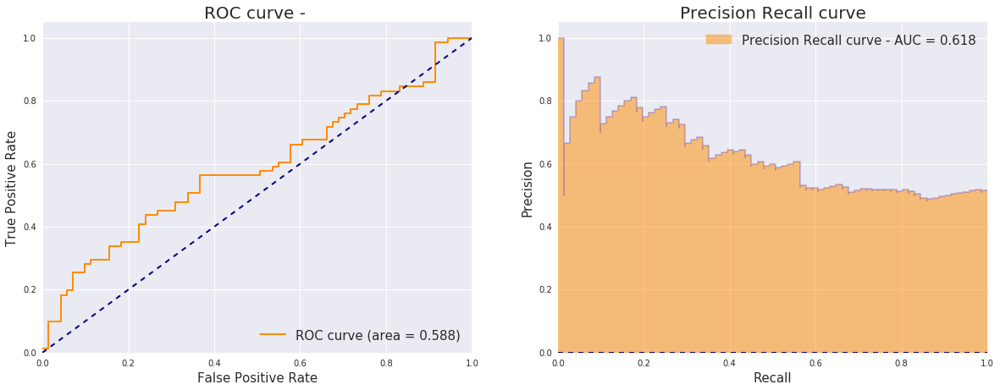

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.588   0.618              0.5             0.118   True   

  featureSelectionMethod                                      features used  \
0                 random  ,J01-01_1:5,V07-09_1:5,n1Insertion_std_T:5,V10...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  num_

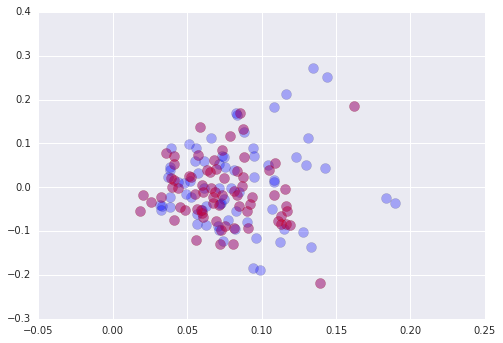

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

X_train shape after feature selection using model is  128_100
X_val shape after feature selection using model is  14_100
5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
selected features are:
[u'WBC', u'HDL', 'V10-01_T', 'V29_J02_T', 'V27_J02_T', 'V29-01_T', 'V20_J01_T', 'V13_J01_T', 'gc_content_T', 'D01_J02-05_T', 'V07-07_T', 'V13-01_T', 'PC6', 'd3Deletion_std_T', 'V09-01_T', 'V11-02_T', 'n2Insertion_mean_T', 'V07-09_T', u'Age', 'D02_J01-04_T', 'V15-01_T', 'D01_J01-05_T', 'cdr3Length_max_T', 'V07-04_T', 'D01_J02-04_T', 'J02-02_T', 'n1Insertion_mean_T', 'V05-05_T', 'V05-03_T', 'V01_J02_T', 'berger_aa_T', 'V20_J02_T', 'PC9', 'V09_J01_T', 'V12-02_T', 'PC10', u'AST', 'V04_J01_T', 'D01_J02-06_T', 'V10-03_T', 'D01_J02-02_T', 'D02_J02-05_T', 'D01_J02-01_T', 'vDeletion_mean_T', 'jDeletion_max_T', 'V14_J01_T', 'V07_T', 'V15_J02_T', 'V11-01_T', 'D01_J01-04_T', u'HbA1C', 'V21-01_T', 'V05-06_T', 'PC3', 'V13_J02_T', 'V23_J01_T', 'V12_J02_T', 'd5Deletion_mean_T', 'J01-04_T', 'V09_J

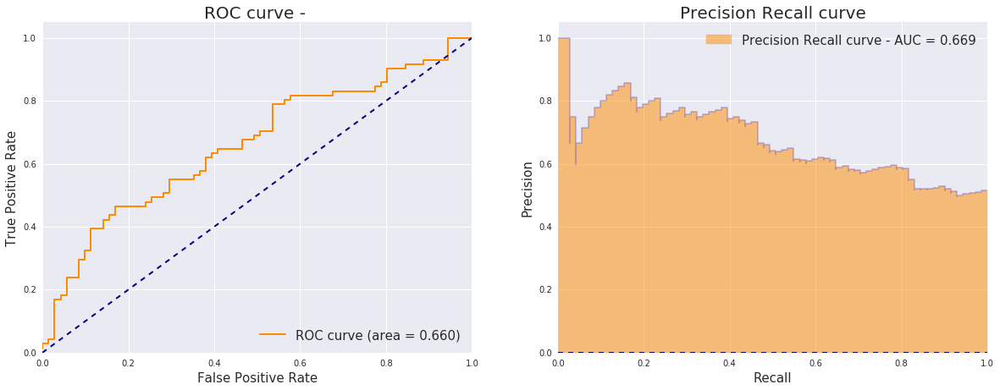

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier     0.66   0.669              0.5             0.169   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,n1Insertion_mean_T:10,n2Insertion_mean_T:10,V...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  

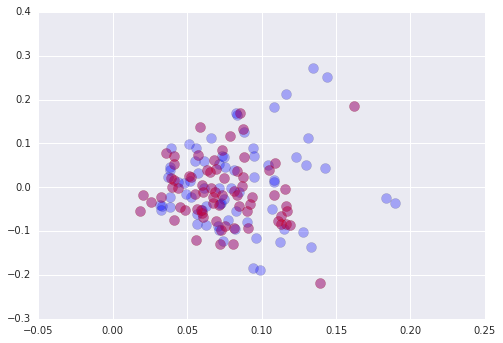

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
selected features are:
[u'WBC', u'HDL', 'V09_J01_0', 'V10-01_T', 'n2Insertion_mean_1', 'V29_J02_T', 'V07-07_0', 'PC6', 'V29-01_T', 'V18_J01_0', 'D01_J02-05_1', 'PC9', 'V15-01_1', 'V07-09_1', 'V25_J02_0', 'd3Deletion_std_0', 'd3Deletion_mean_0', 'V27_J02_T', 'D02_J01-02_0', 'V20_J01_T', 'V12_J02_T', 'V25-01_0', 'V15_J01_0', 'n2Insertion_mean_0', 'V07-06_0', 'J02-07_0', 'V10-03_0', 'V12-01_0', 'V15_J02_0', 'D01_J01-04_1', 'V09-01_1', u'AST', 'vDeletion_max_T', 'V25_J01_0', 'V12_T', 'V09-01_T', 'V13_J01_1', 'V13_J02_1', 'V14_J01_1', 'V05-01_1', 'V04_J02_1', 'n1Insertion_mean_T', 'n2Insertion_mean_T', 'V10-02_0', 'V13-01_1', 'V07-02_0', 'J02-02_1', 'V21_J01_1', 'V18_J02_0', 'V06_1', 'V06-01_0', 'V19-01_0', 'V07-04_T', 'V04_J01_T', 'V05-05_1', 'V25-01_1', u'Age', 'V13-01_T', 'V27_J01_0', 'n2Insertion_std_1', 'V13_J01_T', 'd5Deletion_mean_1', 'D02_J02-03_0', 'V19_J02_1', 'd3Deletion_std_T', 'V11-02_1', 'D01_J02-04_T', 'gc_conte

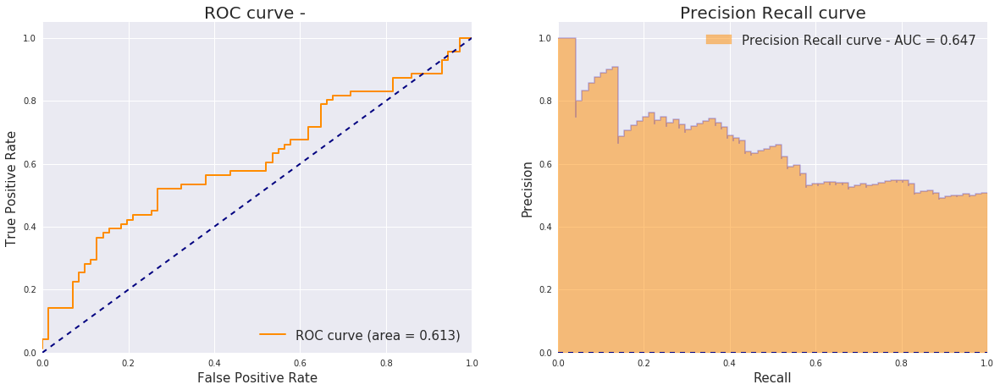

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/LGBMClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-1_maxdepth3_nestimators1000_numthreads2_CV10.xlsx
      Yname                                              Xname  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...   

        modelName  roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0  LGBMClassifier    0.613   0.647              0.5             0.147   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,V09_J01_0:10,V15-01_1:10,V10-02_0:10,n2Insert...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0            0.1   

   max_depth  n_estimators  

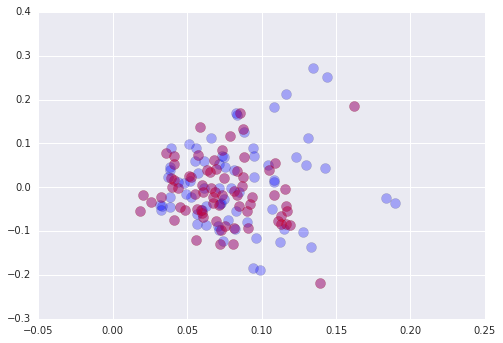

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'AST', u'Hemoglobin', u'WBC', u'HDL', u'Total Cholesterol', 'CASSDRDTGELFF', 'CASSDSTSGSNEQFF', 'CASSFQETQYF', 'CASSLAGSYEQYF', 'CASSLAYEQYF', 'CASSLGQGAYEQYF', 'CASSLGSSYEQYF', 'CASSLQGYEQYF', 'CASSLRETQYF', 'CASSLSYEQYF', 'CASSLTYEQYF', 'CASSPGQGYEQYF', 'CASSPGYEQYF', 'CASSPSTDTQYF', 'CASSQGYEQYF', 'AA count_T', 'D01_J01-04_T', 'D01_J02-01_T', 'D01_J02-02_T', 'D02_J01-01_T', 'D02_J01-02_T', 'D02_J01-03_T', 'J01-01_T', 'J02-01_T', 'NT count_T', 'V01_J01_T', 'V03-01_T', 'V03_J01_T', 'V03_T', 'V04-03_T', 'V04_J02_T', 'V04_T', 'V05-03_T', 'V05-06_T', 'V05-07_T', 'V05_T', 'V06-01_T', 'V06-05_T', 'V07-09_T', 'V07_J01_T', 'V09-01_T', 'V09_J01_T', 'V09_J02_T', 'V11

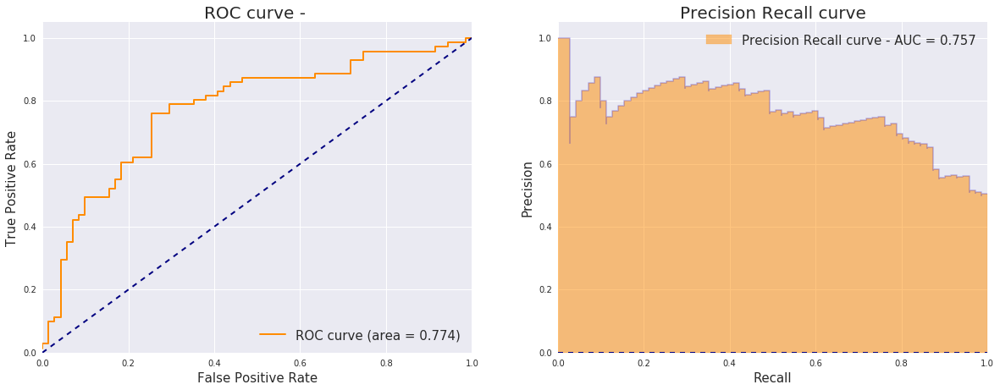

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.774   0.757              0.5             0.257   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,n1Insertion_mean_T:10,n2Insertion_mean_T:10,V...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0          

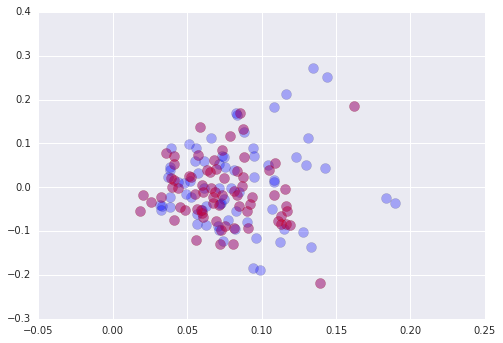

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by <function f_classif at 0x7f83a3c7db18> with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
[u'Age', u'eGFR by CKD-EPI', u'AST', u'WBC', u'HDL', 'CASSLGSSYEQYF', 'CASSLRETQYF', 'CASSLSYEQYF', 'CASSPGQGYEQYF', 'CASSPGYEQYF', 'CASSPSTDTQYF', 'AA count_1', 'AA count_T', 'D01_J02-01_1', 'D01_J02-02_1', 'D01_J02-02_T', 'D01_J02-07_0', 'J01-01_0', 'NT count_0', 'NT count_1', 'NT count_T', 'V03_J01_T', 'V04-03_0', 'V04_0', 'V04_J02_0', 'V04_J02_T', 'V05-04_0', 'V05-07_0', 'V06-01_0', 'V06-01_T', 'V07-06_0', 'V07-07_0', 'V07-09_1', 'V07-09_T', 'V09-01_0', 'V09-01_1', 'V09-01_T', 'V09_J01_0', 'V09_J02_1', 'V09_J02_T', 'V10-02_0', 'V11-02_0', 'V11-02_1', 'V11-02_T', 'V11_J01_0', 'V12-01_T', 'V12-05_1', 'V12-05_T', 'V12_1', 'V12_J02_1', 'V12_J02_T', 'V12_T', 'V13_J02_1', 'V14-01_1', 'V14-0

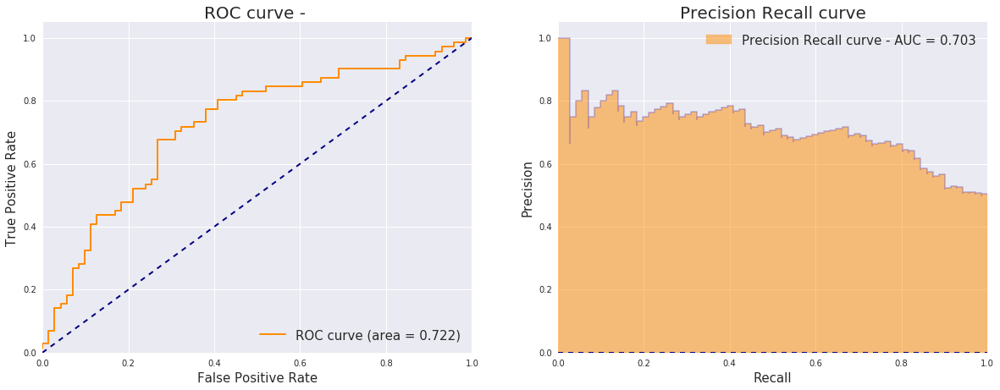

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMf_classif100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.722   0.703              0.5             0.203   True   

                   featureSelectionMethod  \
0  <function f_classif at 0x7f83a3c7db18>   

                                       features used    ...     \
0  ,n2Insertion_mean_T:10,V12-05_1:10,V11-02_T:10...    ...      

   bagging_fraction  bagging_freq  bagging_seed  learning_rate  max_depth  \
0               0.5           1.0          

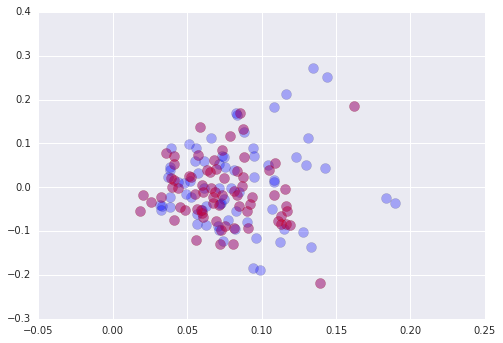

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_274
Xshape after dropping rows with nans=142_274
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample 

5
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['V21_J01_T', 'D01_J02-02_T', 'CSARLAGGQETQYF', 'V27_J02_T', u'HDL', 'd3Deletion_mean_T', 'D02_J02-07_T', 'V13_J01_T', 'CASSPRETQYF', 'CASSLTYEQYF', 'vDeletion_mean_T', 'V25_J01_T', 'D02_J02-04_T', 'CASSPSTDTQYF', 'CASSPYNEQFF', 'd5Deletion_std_T', 'V28_J01_T', 'simpson_nt_T', 'cdr3Length_max_T', 'V06-05_T', 'V14_J01_T', 'V12-05_T', 'V15_J01_T', 'V07-03_T', u'Total Cholesterol', u'eGFR by CKD-EPI', 'prod_stat_mean_T', 'CASSLSYEQYF', 'D02_J01-01_T', 'CASSFGETQYF', 'CASSLGYEQYF', 'jDeletion_max_T', 'J02-03_T', 'n1Insertion_mean_T', 'V15_J02_T', 'V03_T', 'V06_J01_T', 'V04_J02_T', 'V30_J02_T', 'V01_J01_T', 'V28_J02_T', 'CASSLEGETQYF', 'V11-03_T', 'V07_J02_T', 'CASSLQETQYF', 'CASSPGYEQYF', 'vDeletion_std_T', 'V07-04_T', 'D01

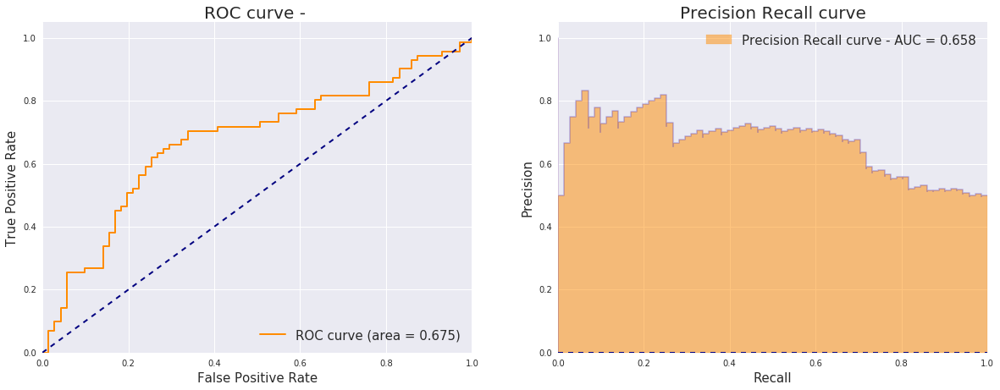

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.675   0.658              0.5             0.158   True   

  featureSelectionMethod                                      features used  \
0                 random  ,Total Cholesterol:8,V01-01_T:8,CASSLGETQYF:7,...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_thr

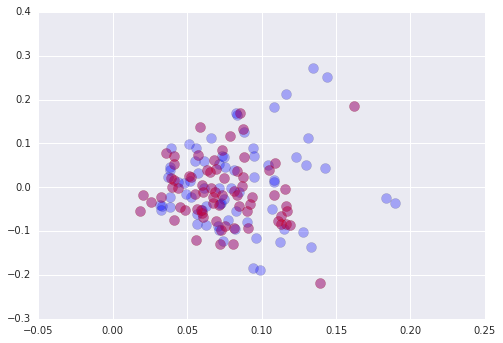

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
since logRef model or univaraite feature selection is used, needs to fillnas in phenotype columns...
X shape after dropping nan columns is 142_630
Xshape after dropping rows with nans=142_630
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Pas

4
fraction of 1s in train set=0.5
fraction of 1s in test set=0.5
filtering by random with k=100
k=100
length of idxs_selected=100
X_train shape after univaraite feature selection is  128_100
X_val shape after univaraite feature selection is  14_100
selected columns are:
['V02-01_T', 'D02_T', u'Hemoglobin', 'jDeletion_std_0', 'CASSLGGYEQYF', 'V27_J02_1', 'V15-01_0', 'V07-09_1', 'V07-07_T', 'V28-01_1', 'V05-01_T', 'D02_J02-01_0', u'eGFR by CKD-EPI', 'V13_J01_0', 'NT count_0', 'V13-01_0', 'cdr3Length_mean_1', 'V14_J01_T', 'V06-09_0', 'shannon_nt_T', 'CASSLRETQYF', 'CASSLSTDTQYF', 'vDeletion_max_T', 'V16_J01_T', 'CASSLGTDTQYF', 'V05-07_T', 'V12-02_T', 'PC1', 'count (templates)_max_1', 'PC5', 'V06_J02_T', 'top1000clonal_aa_T', 'V15_J02_0', 'V07-04_0', 'vDeletion_mean_T', 'd5Deletion_std_1', 'V04-01_T', 'V12_J02_1', 'V09-01_1', 'D02_J01-06_1', 'D02_J01-06_T', 'mean_nt_per_aa_T', 'V07-05_0', 'jDeletion_std_T', 'V27_J02_0', 'CASSLAGSYEQYF', 'V16-01_T', 'V13_J02_1', 'n2Insertion_max_T', 'V05-06

generating plots...
0.5377901210077366


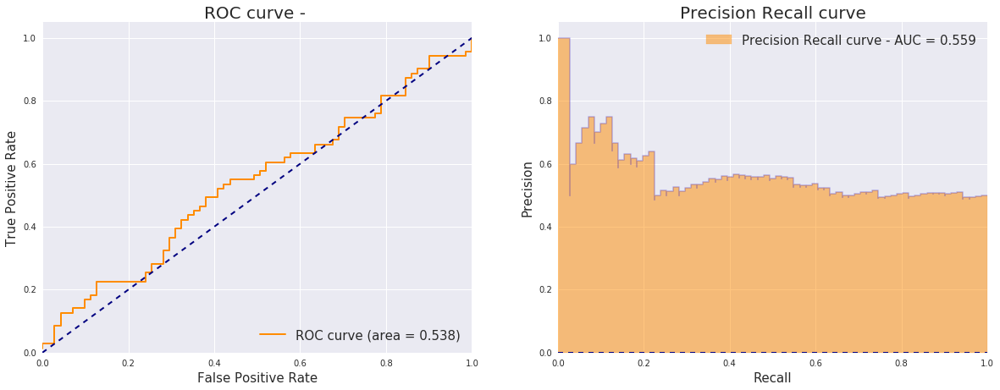

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMrandom100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.538   0.559              0.5             0.059   True   

  featureSelectionMethod                                      features used  \
0                 random  ,V13_J02_0:6,D02_J01-03_1:5,V13-01_0:5,PC1:5,V...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num_thr

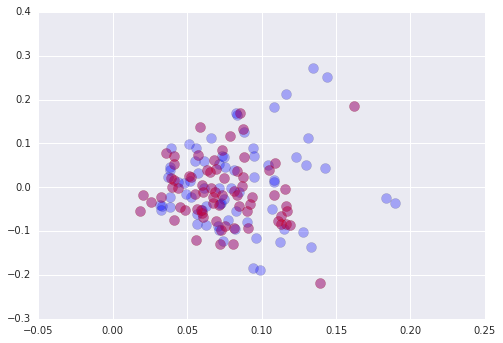

PCAdf shape is 142_10
TCRfeatureDF shape is 142_189
TCRfeatureDF head:
        AA count_T  D01_J01-01_T  D01_J01-02_T  D01_J01-04_T
BD1095      2934.0      0.059519      0.077899      0.030635
BD1073      3664.0      0.054318      0.074513      0.027159
BD908       2951.0      0.033951      0.083774      0.039242
BD640       2428.0      0.046693      0.077335      0.025778
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_274
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_274:
X shape is 142_274
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0         

selected features are:
[u'WBC', u'HDL', 'n2Insertion_mean_T', 'V12_T', 'V29-01_T', 'PC10', 'V29_J01_T', 'PC9', 'J01-04_T', 'V04-03_T', 'V10-01_T', 'V09_J01_T', 'V11-01_T', 'V13-01_T', u'Age', 'V29_J02_T', 'd3Deletion_std_T', 'V06-05_T', 'normSeqNums_per200_AA_T', u'eGFR by CKD-EPI', 'V14_J01_T', 'D02_J01-02_T', 'V05-06_T', 'PC2', 'berger_aa_T', 'D01_J01-05_T', 'd5Deletion_std_T', 'V07-09_T', 'V12_J02_T', u'BMI', 'V11-02_T', 'count (templates)_std_T', 'V20_J01_T', 'V20-01_T', 'V13_J01_T', 'D02_J01-01_T', 'V10_T', 'D01_J02-05_T', 'V11_J02_T', 'V12-05_T', 'V09-01_T', 'vDeletion_std_T', 'V15_J02_T', 'V05-01_T', 'V25_J02_T', 'V04_J02_T', 'PC6', 'vDeletion_mean_T', 'V04-01_T', 'D01_J02-04_T', 'V05_J02_T', 'V20_J02_T', 'PC4', 'cdr3Length_mean_T', 'jDeletion_std_T', 'J02-03_T', 'D01_J02-02_T', 'V12-02_T', u'Total Cholesterol', 'shannon_nt_T', 'D01_J01-04_T', 'V06-06_T', 'V18-01_T', 'gc_content_T', 'V19-01_T', 'V07-02_T', 'V06-09_T', u'Hemoglobin', u'AST', 'V04-02_T', 'PC5', 'PC3', 'D02_J01-06_

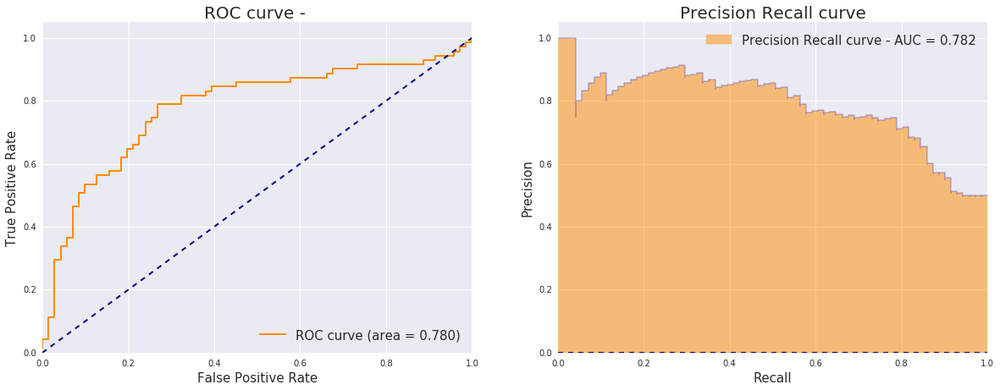

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0     0.78   0.782              0.5             0.282   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,n2Insertion_mean_T:10,D01_J02-04_T:10,V09_J01...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num

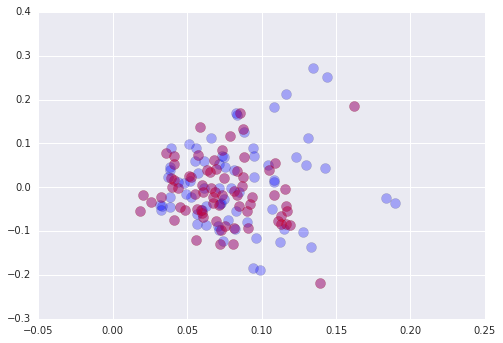

PCAdf shape is 142_10
TCRfeatureDF shape is 142_545
TCRfeatureDF head:
        AA count_0  AA count_1  AA count_T     D01_0
BD1095        57.0      2877.0      2934.0  0.424490
BD1073        83.0      3581.0      3664.0  0.382353
BD908         49.0      2902.0      2951.0  0.412946
BD640         77.0      2351.0      2428.0  0.386000
number of columns that include nans and their name doesnt include -norm- is 0
these columns will be fillna-ed with 0s
now the number of columns with nan values is 0
building X from its components:
number of Xcomponents to be used is 4
combined X shape is 142_630
142
filtering X rows with sample List = MatchedSamples_ss5000rep4_sampleList
Xshape after filtering rows with sample list = 142_630:
X shape is 142_630
the 100th sample in X is BD801
        Smoking Status_Past  Smoking Status_Yes  Gender_Male
BD1001                    1                   0            1
BD1002                    1                   0            1
BD1003                    1        

selected features are:
[u'WBC', 'n2Insertion_mean_1', u'HDL', 'V12_1', 'V29-01_T', 'D02_J01-02_1', 'd3Deletion_std_0', 'D01_J02-07_0', 'V25_J02_1', 'V29_J02_T', 'V09_J01_0', u'eGFR by CKD-EPI', 'V06-05_T', 'V20_J01_T', 'PC10', 'V25-01_1', 'V21-01_0', 'V07-09_T', 'V04-03_0', 'V10-01_T', 'PC2', 'V02-01_0', 'V15-01_1', 'V04-01_1', 'V10-01_0', 'd3Deletion_mean_0', 'V13-01_1', 'd3Deletion_std_T', 'max_nt_per_aa_1', 'V15_J02_0', 'V04-02_1', 'V06-09_0', 'V05-05_T', 'normSeqNums_per200_AA_T', 'V07-07_0', 'V09-01_0', 'simpson_nt_T', 'V07_J01_0', 'V19-01_1', 'V12-02_T', 'V12_T', 'V29_J01_T', 'V12-02_1', 'cdr3Length_std_0', 'V11-02_1', 'V23-01_1', 'D01_J02-06_T', 'n2Insertion_mean_0', 'J02-04_0', 'V10_J02_0', 'V06-05_1', 'V05-08_0', 'V05-06_1', 'V05-05_1', u'AST', 'V07-04_T', 'PC9', 'V04_J02_T', u'Total Cholesterol', 'D02_J01-01_0', 'V04_J01_0', 'V25_J01_1', 'V06-04_1', 'V28-01_0', 'D01_J02-02_T', 'PC8', 'V05_J02_0', 'D01_J01-02_0', 'J02-02_1', 'V09_J01_T', 'V04-01_0', 'V02_J02_0', 'V13-01_T', 'V

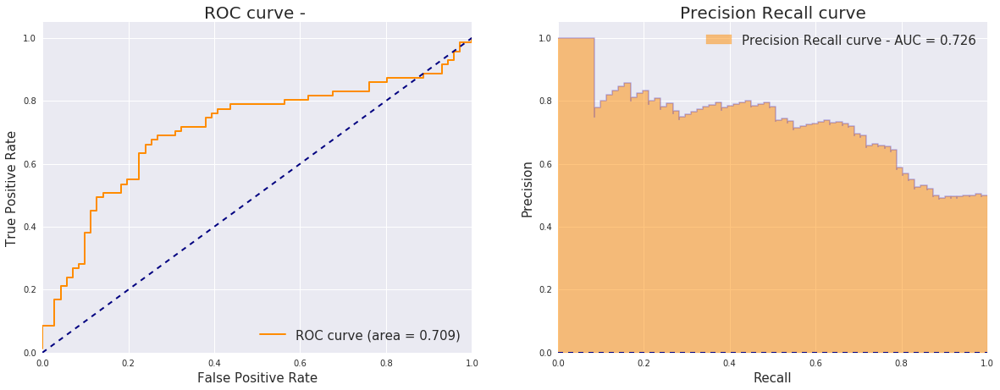

generating summarizing df
71 71
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/XGBClassifier/predictionDFs/MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA&TCRfeatures_onlyT_FSMusingModel100_baggingfraction0-5_baggingfreq1_baggingseed3_learningrate0-05_maxdepth6_nestimators100_numthreads2_CV10.xlsx
      Yname                                              Xname      modelName  \
0  isCardio  MatchedSamples_ss5000rep4_phenotypes&TCRdf&PCA...  XGBClassifier   

   roc_auc  pr_auc  perc_pos_target  pr_auc_corrected  useCV  \
0    0.709   0.726              0.5             0.226   True   

  featureSelectionMethod                                      features used  \
0             usingModel  ,n2Insertion_mean_1:10,HDL:10,WBC:10,V14_J01_1...   

     ...     bagging_fraction  bagging_freq  bagging_seed  learning_rate  \
0    ...                  0.5           1.0           3.0           0.05   

   max_depth  n_estimators  num

In [25]:
#try 2 datasets, many ks, 3 modesl, different pre-selection options

ss=5000
repeat=4
takeOnlyT_list=[True,False]


#(1) prepare phenotype, TCRdf and featureDFs
print 'preparing input DFs'
datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
percShared=10



#(2) predictions:
print 'predictions...'

featureComposition_list=['phenotypesOnly','phenotypes&PCA&TCRfeatures','phenotypes&TCRdf&PCA&TCRfeatures']
for featureComposition in featureComposition_list:
    
    if featureComposition=='phenotypesOnly':
        useTCRfeatures=False #True/False
        usePCAdf=False #True/False
        useTCRdf=False #True/False
    elif featureComposition=='phenotypes&PCA&TCRfeatures':
        useTCRfeatures=True #True/False
        usePCAdf=True #True/False
        useTCRdf=False #True/False
    elif featureComposition=='phenotypes&TCRdf&PCA&TCRfeatures':
        useTCRfeatures=True #True/False
        usePCAdf=True #True/False
        useTCRdf=True #True/False

    if featureComposition=='phenotypesOnly':
        kList=[12]
    else:        
        kList=[12,15,100]


    for k in kList:

        modelAndParams_list=[(LogisticRegression,'LogisticRegression',{'C':10,'penalty':'l1'}),
           (lgb.LGBMClassifier,'LGBMClassifier',{'learning_rate': 0.1, 'n_estimators': 1000,'max_depth': 3,'num_threads':2,
        'bagging_fraction':0.5,'bagging_freq':1, 'bagging_seed':3}),
           (XGBClassifier,'XGBClassifier',{'learning_rate': 0.05, 'n_estimators': 100,'max_depth': 6,'num_threads':2,
        'bagging_fraction':0.5,'bagging_freq':1, 'bagging_seed':3})]

        for modelAndParams in modelAndParams_list:
            model=modelAndParams[0]
            modelName=modelAndParams[1]
            model_params=modelAndParams[2]

            if model==LogisticRegression:
                featureSelectionMethod_list=[f_classif,'random']
            else:
                featureSelectionMethod_list=[f_classif,'random','usingModel']
            if featureComposition=='phenotypesOnly':
                featureSelectionMethod_list=[None]
            for featureSelectionMethod in featureSelectionMethod_list:
                
                for takeOnlyT in takeOnlyT_list:
                
    #             if featureSelectionMethod==chi2:
    #                 usePCAdf=False #True/False


                    print '******k=%s, featureComposition=%s,modelName=%s, featureSelectionMethod=%s*****\
takeOnlyT=%s'%(k,featureComposition,modelName,featureSelectionMethod,takeOnlyT)
                    XName='%s_%s' %(datasetName,featureComposition)
                    XName=XName+'_onlyT'

                    # (1) general definitions:
                    datasetType='PNP_Cardio' #PNP/PNP_Cardio

                    #(2) model definitions:
                    ResultFolder='%s/TCR_real_data/Predictions/predictions_280918' %MyPath
                    if not isdir(ResultFolder):
                        makedirs(ResultFolder)
                    n_splits=10
                    useCV=True
                    stratifiedCV=True

                    #(3) target definition:
                    targetDF=pd.DataFrame(index=['BD'+str(x) for x in range(1,1100)])
                    targetDF['isCardio']=np.where(targetDF.index.str.replace('BD','').astype(int)>949,1,0)
                    targetName='isCardio'
                    YName=targetName

                    #  (4) feature composition:
                    usePhenotype=True #True/False

                    # (5) phenotypeDF:
                    genPhenotypeDF=False #True/False. no sense for 'True'  if usePhenotype=False
                    phenotypeDF=matchedSamples_phen_new_dummies
                    phenotypeDFname='septFeatures' #('small','allNum and more- see step #6.2

                    # (6) TCRdf:
                    datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
                    datasetNameTCRdf='PNP530Cardio126_ss%srep%s_Matched'  
                    TCRdfName='sharingMatrix_PNP530Cardio126_ss%srep%s_Matched_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed_binary'
                    TCRdf=TCRdf

                    #(7) PCAdf (based on the TCRdf selected)
                    n_comp=10 # int or None 
                    isSparse=True #True/False

                    #(8) TCRfeatures:
                    getTCRfeatures=False #True/False. do not use True when useTCRfeatures=False
                    TCRfeatureDF=TCRfeatureDF2
                    if takeOnlyT:
                        colToUse=[x for x in TCRfeatureDF.columns if '_T' in x]
                        print 'taking only _T features:'
                        TCRfeatureDF=TCRfeatureDF[colToUse]
                        

                    #(9) X and y processing:
                    #sampleList to filter, and sampleListName:
                    folder='%s/SamplesForAnalysis_corrected' %datasetFolder
                    toSaveName='%s_sampleList' %datasetName
                    sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)
                    sampleListName='%s_sampleList' %datasetName

                    filterFeaturesByCorr=None #None or float between 0 and 1
                    featureSelectionUsingModel=False # True/False
            #                     C=0.5 #None (if none, C will be set to 0.1) or float between 0 and 1
            #                     filterFeaturesByUnivariate=f_classif    # None/chi2/f_classif/mutual_info_classif
            #             k=150 #None (will be set to 50 / int - defines number of k best))
                    scale=False

                    predictionPipeline(datasetType,ResultFolder,model,modelName,model_params,n_splits, useCV,
                                          stratifiedCV, XName,usePhenotype,useTCRdf,useTCRfeatures,usePCAdf,
                                          YName,targetDF,
                                          genPhenotypeDF,phenotypeDF,phenotypeDFname,
                                          datasetFolder,datasetNameTCRdf,TCRdf,TCRdfName,n_comp,isSparse,
                                          getTCRfeatures,TCRfeatureDF,sampleListName,sampleList,
                                          filterFeaturesByCorr,featureSelectionMethod,scale,
                                          k,cdate=cdate,overwriteResults=True)



print 'done with everything!!!!'




    

In [26]:
# modelNameList=['LGBMClassifier','XGBClassifier']
modelNameList=['LogisticRegression','LGBMClassifier','XGBClassifier']
for modelName in modelNameList:
    print modelName
    folder='%s/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/%s' %(MyPath, modelName)
    dfFolder='%s/predictionDFs' %folder
    results=concat_summarizing_dfs_excel(dfFolder)
    results=results.sort_values(by='roc_auc', ascending=False)
    f1='%s/resultSummary_%s.xlsx' %(folder,cdate)
    results.to_excel(f1)
    results.head(20)

LogisticRegression
number of dfs in directory: 65
the length of df list is 65
LGBMClassifier
number of dfs in directory: 95
the length of df list is 95
XGBClassifier
number of dfs in directory: 95
the length of df list is 95


#### new functions:

##### Preprocessing for LogReg:

In [ ]:
##X components:
phenotypeDF=matchedSamples_phen_new_dummies
TCRdf=TCRdf
featureDF=TCRfeatureDF2

##y and YName:

targetDF=pd.DataFrame(index=['BD'+str(x) for x in range(1,1100)])
targetDF['isCardio']=np.where(targetDF.index.str.replace('BD','').astype(int)>949,1,0)
targetName='isCardio'
YName=targetName
y = targetDF[YName]
y=editSampleNames(y)
print 'y shape is %s' % y.shape

#sampleList to filter, and sampleListName:
folder='%s/SamplesForAnalysis_corrected' %datasetFolder
toSaveName='%s_sampleList' %datasetName
sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)
sampleListName='%s_sampleList' %datasetName

X=preprocessing_for_preds(phenotypeDF,featureDF,TCRdf,y,YName,imputeMissing=True,scaling=True,
                          sampleList=sampleList,sampleListName=sampleListName)

##### save processedX:

In [ ]:
folder='%s/predictionFiles' %datasetFolder
if not isdir(folder):
    makedirs(folder)
f1='%s/X_full_scaled_filled' %folder
X.to_pickle(f1)

##### choose 

# ss12500 rep3

## function1 - subsample and find relevant phenotypes

In [ ]:
ss=12500
repeat=3
ssPNP=False #True/False. subsample only if not exist
ssCardio=False #True/False. subsample only if not exist
genTCRdfPNP=False #True/False. 
genTCRdfCardio=False #True/False. 


testPhenotypeAffectsOnsubsampledCohorts(ss,repeat,ssPNP,ssCardio,genTCRdfPNP,genTCRdfCardio)

## function2 - generate matched cohorts and validate by comparing phenotypes
try to get as many samples as possible!

### prepare phenotype DFs:

*** replace all ss and rep information!!! make sure phenotype file is updated!***

In [ ]:
# get full phenotype DFs for PNP and Cardio:
f1='%s/TCR_real_data/NewPhenotypicData/newPhenotypesPNPAllInfo_withDummies.xlsx' %MyPath
PNP530_phen_new_dummies=pd.read_excel(f1).set_index('BD')

f2='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126phenAllInfo_withDummies.xlsx' %MyPath
Cardio126_phen_new_dummies=pd.read_excel(f2).set_index('BD')

#filter for ss12500 samples and save:
folder='%s/TCR_real_data/PNP530_SubSampled12500data_rep3/SamplesForAnalysis_corrected' %MyPath
PNP530ss12500rep3sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)

PNP530ss12500rep3_phen_new_dummies=PNP530_phen_new_dummies.loc[PNP530ss12500rep3sampleList,:]

f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss12500rep3_phen_new_dummies.xlsx' %MyPath
PNP530ss12500rep3_phen_new_dummies.to_excel(f3)


folder='%s/TCR_real_data/CardioSamples/Cardio126_SubSampled12500data_rep3/SamplesForAnalysis_corrected' %MyPath
Cardio126ss12500rep3sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)

Cardio126ss12500rep3_phen_new_dummies=Cardio126_phen_new_dummies.loc[Cardio126ss12500rep3sampleList,:]

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss12500rep3_phen_new_dummies.xlsx' %MyPath
Cardio126ss12500rep3_phen_new_dummies.to_excel(f4)


### run matching function-including relatives:

********** run several times to reach optimal matched cohorts, and then clean folder from unwanted sample lists and other stuff **********

**********use results for next function **************

In [ ]:
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss12500rep3_phen_new_dummies.xlsx' %MyPath
PNP530ss12500rep3_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss12500rep3_phen_new_dummies.xlsx' %MyPath
Cardio126ss12500rep3_phen_new_dummies=pd.read_excel(f4).set_index('BD')

phenotypeList=[('Gender_Male','identity',None,True),('Age','delta',8,True),('HbA1C','delta',1.2,True),
               ('Smoking Status_Yes','identity',None,True),('Glucose','delta',20,False),('BMI','delta',None,False),('Total Cholesterol','delta',None,False),
              ('Smoking Status_Past','identity',None,False)]
columnsToUse=[x[0] for x in phenotypeList]
restrictedPhenotypes=[x[0] for x in phenotypeList if x[3]==True]
numericalPhenotypes=[x[0] for x in phenotypeList if x[1]=='delta']
print 'restricted phenotypes=%s' %restrictedPhenotypes
print 'numericalPhenotypes=%s' %numericalPhenotypes

cohort1phenotypeDF=Cardio126ss12500rep3_phen_new_dummies
cohort1name='Cardio126ss12500rep3'
cohort2phenotypeDF=PNP530ss12500rep3_phen_new_dummies
cohort2name='PNP530ss12500rep3'

# cohort1phenotypeDF=Cardio126ss12500rep3_phen_new_dummies
# cohort1name='Cardio126ss12500rep3_matchedToRelRemoved'
# cohort2phenotypeDF=PNP530ss12500rep3_phen_new_dummies
# cohort2phenotypeDF=removeRelatives(cohort2phenotypeDF) ######### removing samples with relatives!
# cohort2name='PNP530ss12500rep3_relRemoved'



folderToSaveLists='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss12500rep3' %MyPath
random_state=4
        
# for random_state in range(6,10):
#     if random_state!=3:
print '*******************random state = %s' %random_state

matchedCardio12500samples,matchedPNP12500samples=gen_matched_cohorts_by_phenotypes(cohort1phenotypeDF,cohort1name,
    cohort2phenotypeDF,cohort2name,phenotypeList, columnsToUse,restrictedPhenotypes,folderToSaveLists,random_state)

    #phenotypeList is a list of tuples, in each tuple the first item is the phenotype name (string)the second is the conditionType-'identity' or 'delta',
#the third is the delta (int) or None and the forth is isStopingCrit (True/False)

### run matching function-not including relatives:

********** run several times to reach optimal matched cohorts, and then clean folder from unwanted sample lists and other stuff **********

**********use results for next function **************

In [ ]:
# f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss12500rep3_phen_new_dummies.xlsx' %MyPath
# PNP530ss12500rep3_phen_new_dummies=pd.read_excel(f3).set_index('BD')

# f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss12500rep3_phen_new_dummies.xlsx' %MyPath
# Cardio126ss12500rep3_phen_new_dummies=pd.read_excel(f4).set_index('BD')

# phenotypeList=[('Gender_Male','identity',None,True),('Age','delta',9,True),('Glucose','delta',20,True),
#                ('HbA1C','delta',None,False), ('BMI','delta',None,False),('Total Cholesterol','delta',None,False),
#               ('Smoking Status_Past','identity',None,False),('Smoking Status_Yes','identity',None,False)]
# columnsToUse=[x[0] for x in phenotypeList]
# restrictedPhenotypes=[x[0] for x in phenotypeList if x[3]==True]
# numericalPhenotypes=[x[0] for x in phenotypeList if x[1]=='delta']
# print 'restricted phenotypes=%s' %restrictedPhenotypes
# print 'numericalPhenotypes=%s' %numericalPhenotypes

# # cohort1phenotypeDF=Cardio126ss12500rep3_phen_new_dummies
# # cohort1name='Cardio126ss12500rep3'
# # cohort2phenotypeDF=PNP530ss12500rep3_phen_new_dummies
# # cohort2name='PNP530ss12500rep3'

# cohort1phenotypeDF=Cardio126ss12500rep3_phen_new_dummies
# cohort1name='Cardio126ss12500rep3_matchedToRelRemoved'
# cohort2phenotypeDF=PNP530ss12500rep3_phen_new_dummies
# cohort2phenotypeDF=removeRelatives(cohort2phenotypeDF) ######### removing samples with relatives!
# cohort2name='PNP530ss12500rep3_relRemoved'



# folderToSaveLists='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss12500rep3' %MyPath
# random_state=2
        
# # for random_state in range(6,10):
# #     if random_state!=6:
# print '*******************random state = %s' %random_state

# matchedCardio12500samples,matchedPNP12500samples=gen_matched_cohorts_by_phenotypes(cohort1phenotypeDF,cohort1name,
# cohort2phenotypeDF,cohort2name,phenotypeList, columnsToUse,restrictedPhenotypes,folderToSaveLists,random_state)

#     #phenotypeList is a list of tuples, in each tuple the first item is the phenotype name (string)the second is the conditionType-'identity' or 'delta',
# #the third is the delta (int) or None and the forth is isStopingCrit (True/False)

## function 3- copying files, comparing TCR features, sequences and sequence sharing patterns

****** change below thesample list file namesaccording to the results of the former function results *********

****** play with percSharedCom, identityColumnForPie ******** 

******* investigate all result files and figures *********

In [ ]:
sharingMatrix_MatchedSamples_ss5000rep3_minNshared2_RA_onlyProductiveTrue___OLtrimmed_binary

### run for 'including relatives'

In [ ]:
ss=12500
repeat=3

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
if not isdir(datasetFolder):
    makedirs(datasetFolder)
PNPListFile='%s/PNP530ss12500rep3_samples_matchedTo_Cardio126ss12500rep3_n53_resByGenderMaleAgeHbA1CSmoking StatusYes_rs4' %datasetFolder
with open(PNPListFile,'rb') as fp:
    PNPmatchedSampleList=pickle.load(fp)

CardioListFile='%s/Cardio126ss12500rep3_samples_matchedTo_PNP530ss12500rep3_n53_resByGenderMaleAgeHbA1CSmoking StatusYes_rs4' %datasetFolder
with open(CardioListFile,'rb') as fp:
    CardioMatchedSampleList=pickle.load(fp)
    
delFolderFirst=False
copySamples=False

compareFeatures=False

genOrigComTCRdf=False
genComTCRdf=False
n_comp=10
percSharedCom=None

compareSharing=True
genSepTCRdf=True
nSharedMin=2
identityFile='%s/TCR CDR3 sequence databases/combined annotation_list_clean_popped.xlsx' %MyPath
identityDF=pd.read_excel(identityFile)
identityDFname='popped'
identityColumnForPie='combined annotation_list_clean' #'Epitopespecies_VDJDB'/'Pathology_McPAS'
ThresholdToOther=0.04
dropnaFromIdentitiesPie=False
RemoveSamplesWithRelative=False

FeatureMeanSummary_all_dataSets=compareTCRforMatchedCohorts(ss,repeat,PNPmatchedSampleList,CardioMatchedSampleList,
                            copySamples,compareFeatures,compareSharing, genSepTCRdf,nSharedMin,delFolderFirst,
                            genOrigComTCRdf,genComTCRdf,n_comp,percSharedCom,identityColumnForPie,dropnaFromIdentitiesPie,
                            ThresholdToOther,identityDF,identityDFname,RemoveSamplesWithRelative)



### run for not-including relatives

In [ ]:
ss=12500
repeat=3

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)

PNPListFile='%s/PNP530ss12500rep3_relRemoved_samples_matchedTo_Cardio126ss12500rep3_matchedToRelRemoved_n47_resByGenderMaleAgeGlucose_rs2' %datasetFolder
with open(PNPListFile,'rb') as fp:
    PNPmatchedSampleList=pickle.load(fp)

CardioListFile='%s/Cardio126ss12500rep3_matchedToRelRemoved_samples_matchedTo_PNP530ss12500rep3_relRemoved_n47_resByGenderMaleAgeGlucose_rs2' %datasetFolder
with open(CardioListFile,'rb') as fp:
    CardioMatchedSampleList=pickle.load(fp)
    
delFolderFirst=False
copySamples=False

compareFeatures=False

genOrigComTCRdf=True
genComTCRdf=True
n_comp=10
percSharedCom=None

compareSharing=True
genSepTCRdf=True
nSharedMin=1
identityFile='%s/TCR CDR3 sequence databases/combined annotation_list_clean_popped.xlsx' %MyPath
identityDF=pd.read_excel(identityFile)
identityDFname='popped'
identityColumnForPie='combined annotation_list_clean' #'Epitopespecies_VDJDB'/'Pathology_McPAS'
ThresholdToOther=0.02
dropnaFromIdentitiesPie=True
RemoveSamplesWithRelative='done'

FeatureMeanSummary_all_dataSets=compareTCRforMatchedCohorts(ss,repeat,PNPmatchedSampleList,CardioMatchedSampleList,
                            copySamples,compareFeatures,compareSharing, genSepTCRdf,nSharedMin,delFolderFirst,
                            genOrigComTCRdf,genComTCRdf,n_comp,percSharedCom,identityColumnForPie,dropnaFromIdentitiesPie,
                            ThresholdToOther,identityDF,identityDFname,RemoveSamplesWithRelative)



## clean featureDF - remove nanas, constant and fully correlated

1. take feature DF of the relevant ss and repeat
2. run remove correlated
3. explore file
4. delete constant
5. fillna
6. save to file

In [ ]:
def process_featureDF(featureDF,corrThreshold=1,removeCorr=True,exploreDF=True,deleteConsts=True,fillnans=True):
    featureDFnameAddition=''
    if removeCorr:
        print 'removing all columns correlated to other column by r=%s or more' %corrThreshold
        featureDF,colToDrop=remove_correlated_features(featureDF,corrThreshold) #remove nans and highly correlated
        featureDFnameAddition=featureDFnameAddition+'_noCorr'
    if exploreDF:
        print 'exploring feature df...'
        analysisDF=explore_feature_table(featureDF) #explore featureDF
    if deleteConsts:
        print 'deleting constant variables...'
        featureDFnameAddition=featureDFnameAddition+'_noConsts'
        constantdf=analysisDF[analysisDF['Type']=='constant']
        constantVars=constantdf['columns'].tolist()
        print 'constant variables are: %s' %constantVars
        print 'featureDF shape before constant features removal is %s_%s' %(featureDF.shape[0],featureDF.shape[1])
        featureDF=featureDF.drop(constantVars,axis=1)
        print featureDF.shape
    if fillnans:
        print 'filling nans with 0...'
        featureDFnameAddition=featureDFnameAddition+'_nanFilled'
        colsTofill=[x for x in featureDF.columns.values if 'norm' not in x]
        print 'number of columns to fill nans=%s' %len(colsTofill)
        print 'total numvber of columns=%s' %len(featureDF.columns)
        featureDF[colsTofill]=featureDF[colsTofill].fillna(0)
        
        print 'end of function!'
        
        return featureDF,featureDFnameAddition

In [ ]:
#generate and load relevant feature DF:
ss=12500
repeat=3

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
sampleListName=datasetName


TCRfeatureDF_matched=gen_featureDF_for_MatchedCohorts(ss,repeat,sampleList,sampleListName)

#process feature df:
corrThreshold=1
featureDFfile='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/featureSummaryDFs\
/MatchedSamples_ss%srep%s_MatchedSamples_ss%srep%s_allFeatures' %(MyPath,ss,repeat,ss,repeat,ss,repeat)
featureDF=pd.read_pickle(featureDFfile)
featureDF,featureDFnameAddition=process_featureDF(featureDF,corrThreshold)

newfeatureDFfilePickle=featureDFfile+'_'+featureDFnameAddition
featureDF.to_pickle(newfeatureDFfilePickle)

newfeatureDFfileExcel=featureDFfile+'_'+featureDFnameAddition+'.xlsx'
featureDF.to_excel(newfeatureDFfileExcel)

## predictions:

### get DFs:

In [ ]:
ss=12500
repeat=3
datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
percShared=10
print datasetName


# phenotype df:
print 'getting phenotypeDF...'
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss%s_phen_new_dummies.xlsx' %(MyPath,ss)
PNP_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss%s_phen_new_dummies.xlsx' %(MyPath,ss)
Cardio_phen_new_dummies=pd.read_excel(f4).set_index('BD')

all_phen_new_dummies=pd.concat([PNP_phen_new_dummies,Cardio_phen_new_dummies])
matchedSamples_phen_new_dummies=all_phen_new_dummies.loc[sampleList,:]
print 'phenotype DF shape is %s_%s' %(matchedSamples_phen_new_dummies.shape[0],matchedSamples_phen_new_dummies.shape[1])
print matchedSamples_phen_new_dummies.iloc[:20,:4]
# print all_phen_new_dummies.tail()

#TCRdf:
print 'getting TCRdf...'

sharingFolder='%s/%s_sharingAnalysis' %(datasetFolder,datasetName)
TCRdfName='sharingMatrix_MatchedSamples_ss%srep%s_minNshared2_RA_onlyProductiveTrue__percShared%s_OLtrimmed\
_binary' %(ss,repeat, percShared) 
TCRdfFile='%s/%s' %(sharingFolder,TCRdfName )
print TCRdfFile
TCRdf=pd.read_pickle(TCRdfFile)
print 'TCRdf shape is %s_%s' %(TCRdf.shape[0],TCRdf.shape[1])
print TCRdf.iloc[:4,:4]

#Features
print 'getting TCRfeatureDF - wihtout highlt correlated columns...'
featureFilePickle2='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/featureSummaryDFs\
/MatchedSamples_ss%srep%s_MatchedSamples_ss%srep%s_allFeatures__noCorr_noConsts_nanFilled' %(MyPath,ss,repeat,ss,repeat,ss,repeat)
TCRfeatureDF2=pd.read_pickle(featureFilePickle2)
print 'TCRfeatureDF shape is %s_%s' %(TCRfeatureDF2.shape[0],TCRfeatureDF2.shape[1])
TCRfeatureDF2.iloc[:4,:4]


### classification;

#### old functions:

In [ ]:
#try 2 datasets, many ks, 3 modesl, different pre-selection options

ss=12500
repeat=3
takeOnlyT=True


#(1) prepare phenotype, TCRdf and featureDFs
print 'preparing input DFs'
datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
percShared=10



#(2) predictions:
print 'predictions...'

featureComposition_list=['phenotypesOnly','phenotypes&PCA&TCRfeatures','phenotypes&TCRdf&PCA&TCRfeatures']
for feateureComposition in featureComposition_list:
    XName='%s_%s' %(datasetName,featureComposition)
    if featureComposition=='phenotypesOnly':
        useTCRfeatures=False #True/False
        usePCAdf=False #True/False
        useTCRdf=False #True/False
    elif featureComposition=='phenotypes&PCA&TCRfeatures':
        useTCRfeatures=True #True/False
        usePCAdf=True #True/False
        useTCRdf=False #True/False
    elif featureComposition=='phenotypes&TCRdf&PCA&TCRfeatures':
        useTCRfeatures=True #True/False
        usePCAdf=True #True/False
        useTCRdf=True #True/False

    if featureComposition=='phenotypesOnly':
        kList=[12]
    else:        
        kList=[12,15,100]


    for k in kList:

        modelAndParams_list=[(LogisticRegression,'LogisticRegression',{'C':10,'penalty':'l1'}),
           (lgb.LGBMClassifier,'LGBMClassifier',{'learning_rate': 0.1, 'n_estimators': 1000,'max_depth': 3,'num_threads':2,
        'bagging_fraction':0.5,'bagging_freq':1, 'bagging_seed':3}),
           (XGBClassifier,'XGBClassifier',{'learning_rate': 0.05, 'n_estimators': 100,'max_depth': 6,'num_threads':2,
        'bagging_fraction':0.5,'bagging_freq':1, 'bagging_seed':3})]

        for modelAndParams in modelAndParams_list:
            XName='%s_%s' %(datasetName,featureComposition)

            model=modelAndParams[0]
            modelName=modelAndParams[1]
            model_params=modelAndParams[2]

            if model==LogisticRegression:
                featureSelectionMethod_list=[f_classif,'random']
            else:
                featureSelectionMethod_list=[f_classif,'random','usingModel']
            if featureComposition=='phenotypesOnly':
                featureSelectionMethod_list=[None]
            for featureSelectionMethod in featureSelectionMethod_list:
    #             if featureSelectionMethod==chi2:
    #                 usePCAdf=False #True/False


                print '******k=%s, featureComposition=%s,modelName=%s, featureSelectionMethod=%s*****'\
        %(k,featureComposition,modelName,featureSelectionMethod)

                # (1) general definitions:
                datasetType='PNP_Cardio' #PNP/PNP_Cardio

                #(2) model definitions:
                ResultFolder='%s/TCR_real_data/predictions_280918' %MyPath
                if not isdir(ResultFolder):
                    makedirs(ResultFolder)
                n_splits=10
                useCV=True
                stratifiedCV=True

                #(3) target definition:
                targetDF=pd.DataFrame(index=['BD'+str(x) for x in range(1,1100)])
                targetDF['isCardio']=np.where(targetDF.index.str.replace('BD','').astype(int)>949,1,0)
                targetName='isCardio'
                YName=targetName

                #  (4) feature composition:
                usePhenotype=True #True/False

                # (5) phenotypeDF:
                genPhenotypeDF=False #True/False. no sense for 'True'  if usePhenotype=False
                phenotypeDF=matchedSamples_phen_new_dummies
                phenotypeDFname='septFeatures' #('small','allNum and more- see step #6.2

                # (6) TCRdf:
                datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
                datasetNameTCRdf='PNP530Cardio126_ss%srep%s_Matched'  
                TCRdfName='sharingMatrix_PNP530Cardio126_ss%srep%s_Matched_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed_binary'
                TCRdf=TCRdf

                #(7) PCAdf (based on the TCRdf selected)
                n_comp=10 # int or None 
                isSparse=True #True/False

                #(8) TCRfeatures:
                getTCRfeatures=False #True/False. do not use True when useTCRfeatures=False
                TCRfeatureDF=TCRfeatureDF2
                if takeOnlyT:
                    colToUse=[x for x in TCRfeatureDF.columns if '_T' in x]
                    print 'taking only _T features:'
                    TCRfeatureDF=TCRfeatureDF[colToUse]
                    XName=XName+'_onlyT'

                #(9) X and y processing:
                #sampleList to filter, and sampleListName:
                folder='%s/SamplesForAnalysis_corrected' %datasetFolder
                toSaveName='%s_sampleList' %datasetName
                sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)
                sampleListName='%s_sampleList' %datasetName

                filterFeaturesByCorr=None #None or float between 0 and 1
                featureSelectionUsingModel=False # True/False
        #                     C=0.5 #None (if none, C will be set to 0.1) or float between 0 and 1
        #                     filterFeaturesByUnivariate=f_classif    # None/chi2/f_classif/mutual_info_classif
        #             k=150 #None (will be set to 50 / int - defines number of k best))
                scale=False

                predictionPipeline(datasetType,ResultFolder,model,modelName,model_params,n_splits, useCV,
                                      stratifiedCV, XName,usePhenotype,useTCRdf,useTCRfeatures,usePCAdf,
                                      YName,targetDF,
                                      genPhenotypeDF,phenotypeDF,phenotypeDFname,
                                      datasetFolder,datasetNameTCRdf,TCRdf,TCRdfName,n_comp,isSparse,
                                      getTCRfeatures,TCRfeatureDF,sampleListName,sampleList,
                                      filterFeaturesByCorr,featureSelectionMethod,scale,
                                      k,cdate=cdate,overwriteResults=True)



print 'done with everything!!!!'




    

In [ ]:
# modelNameList=['LGBMClassifier','XGBClassifier']
modelNameList=['LogisticRegression','LGBMClassifier','XGBClassifier']
for modelName in modelNameList:
    print modelName
    folder='%s/TCR_real_data/predictions_280918/isCardio_predictions/%s' %(MyPath, modelName)
    dfFolder='%s/predictionDFs' %folder
    results=concat_summarizing_dfs_excel(dfFolder)
    results=results.sort_values(by='roc_auc', ascending=False)
    f1='%s/resultSummary_%s.xlsx' %(folder,cdate)
    results.to_excel(f1)
    results.head(20)

# ss12500 rep4

## function1 - subsample and find relevant phenotypes

In [ ]:
ss=12500
repeat=4
ssPNP=True #True/False. subsample only if not exist
ssCardio=True #True/False. subsample only if not exist
genTCRdfPNP=True #True/False. 
genTCRdfCardio=True #True/False. 


testPhenotypeAffectsOnsubsampledCohorts(ss,repeat,ssPNP,ssCardio,genTCRdfPNP,genTCRdfCardio)

## function2 - generate matched cohorts and validate by comparing phenotypes
try to get as many samples as possible!

### prepare phenotype DFs:

*** replace all ss and rep information!!! make sure phenotype file is updated!***

In [ ]:
# get full phenotype DFs for PNP and Cardio:
f1='%s/TCR_real_data/NewPhenotypicData/newPhenotypesPNPAllInfo_withDummies.xlsx' %MyPath
PNP530_phen_new_dummies=pd.read_excel(f1).set_index('BD')

f2='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126phenAllInfo_withDummies.xlsx' %MyPath
Cardio126_phen_new_dummies=pd.read_excel(f2).set_index('BD')

#filter for ss12500 samples and save:
folder='%s/TCR_real_data/PNP530_SubSampled12500data_rep4/SamplesForAnalysis_corrected' %MyPath
PNP530ss12500rep4sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)

PNP530ss12500rep4_phen_new_dummies=PNP530_phen_new_dummies.loc[PNP530ss12500rep4sampleList,:]

f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss12500rep4_phen_new_dummies.xlsx' %MyPath
PNP530ss12500rep4_phen_new_dummies.to_excel(f3)


folder='%s/TCR_real_data/CardioSamples/Cardio126_SubSampled12500data_rep4/SamplesForAnalysis_corrected' %MyPath
Cardio126ss12500rep4sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)

Cardio126ss12500rep4_phen_new_dummies=Cardio126_phen_new_dummies.loc[Cardio126ss12500rep4sampleList,:]

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss12500rep4_phen_new_dummies.xlsx' %MyPath
Cardio126ss12500rep4_phen_new_dummies.to_excel(f4)


### run matching function-including relatives:

********** run several times to reach optimal matched cohorts, and then clean folder from unwanted sample lists and other stuff **********

**********use results for next function **************

In [ ]:
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss12500rep4_phen_new_dummies.xlsx' %MyPath
PNP530ss12500rep4_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss12500rep4_phen_new_dummies.xlsx' %MyPath
Cardio126ss12500rep4_phen_new_dummies=pd.read_excel(f4).set_index('BD')

phenotypeList=[('Gender_Male','identity',None,True),('Age','delta',8,True),('HbA1C','delta',1.2,True),
               ('Smoking Status_Yes','identity',None,True),('Glucose','delta',20,False),('BMI','delta',None,False),('Total Cholesterol','delta',None,False),
              ('Smoking Status_Past','identity',None,False)]
columnsToUse=[x[0] for x in phenotypeList]
restrictedPhenotypes=[x[0] for x in phenotypeList if x[3]==True]
numericalPhenotypes=[x[0] for x in phenotypeList if x[1]=='delta']
print 'restricted phenotypes=%s' %restrictedPhenotypes
print 'numericalPhenotypes=%s' %numericalPhenotypes

cohort1phenotypeDF=Cardio126ss12500rep4_phen_new_dummies
cohort1name='Cardio126ss12500rep4'
cohort2phenotypeDF=PNP530ss12500rep4_phen_new_dummies
cohort2name='PNP530ss12500rep4'

# cohort1phenotypeDF=Cardio126ss12500rep4_phen_new_dummies
# cohort1name='Cardio126ss12500rep4_matchedToRelRemoved'
# cohort2phenotypeDF=PNP530ss12500rep4_phen_new_dummies
# cohort2phenotypeDF=removeRelatives(cohort2phenotypeDF) ######### removing samples with relatives!
# cohort2name='PNP530ss12500rep4_relRemoved'



folderToSaveLists='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss12500rep4' %MyPath
random_state=6
        
# for random_state in range(2,6):
#     if random_state!=3:
print '*******************random state = %s' %random_state

matchedCardio12500samples,matchedPNP12500samples=gen_matched_cohorts_by_phenotypes(cohort1phenotypeDF,cohort1name,
cohort2phenotypeDF,cohort2name,phenotypeList, columnsToUse,restrictedPhenotypes,folderToSaveLists,random_state)

    #phenotypeList is a list of tuples, in each tuple the first item is the phenotype name (string)the second is the conditionType-'identity' or 'delta',
#the third is the delta (int) or None and the forth is isStopingCrit (True/False)

### run matching function-not including relatives:

********** run several times to reach optimal matched cohorts, and then clean folder from unwanted sample lists and other stuff **********

**********use results for next function **************

In [ ]:
# f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss12500rep4_phen_new_dummies.xlsx' %MyPath
# PNP530ss12500rep4_phen_new_dummies=pd.read_excel(f3).set_index('BD')

# f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss12500rep4_phen_new_dummies.xlsx' %MyPath
# Cardio126ss12500rep4_phen_new_dummies=pd.read_excel(f4).set_index('BD')

# phenotypeList=[('Gender_Male','identity',None,True),('Age','delta',9,True),('Glucose','delta',20,True),
#                ('HbA1C','delta',None,False), ('BMI','delta',None,False),('Total Cholesterol','delta',None,False),
#               ('Smoking Status_Past','identity',None,False),('Smoking Status_Yes','identity',None,False)]
# columnsToUse=[x[0] for x in phenotypeList]
# restrictedPhenotypes=[x[0] for x in phenotypeList if x[3]==True]
# numericalPhenotypes=[x[0] for x in phenotypeList if x[1]=='delta']
# print 'restricted phenotypes=%s' %restrictedPhenotypes
# print 'numericalPhenotypes=%s' %numericalPhenotypes

# # cohort1phenotypeDF=Cardio126ss12500rep4_phen_new_dummies
# # cohort1name='Cardio126ss12500rep4'
# # cohort2phenotypeDF=PNP530ss12500rep4_phen_new_dummies
# # cohort2name='PNP530ss12500rep4'

# cohort1phenotypeDF=Cardio126ss12500rep4_phen_new_dummies
# cohort1name='Cardio126ss12500rep4_matchedToRelRemoved'
# cohort2phenotypeDF=PNP530ss12500rep4_phen_new_dummies
# cohort2phenotypeDF=removeRelatives(cohort2phenotypeDF) ######### removing samples with relatives!
# cohort2name='PNP530ss12500rep4_relRemoved'



# folderToSaveLists='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss12500rep4' %MyPath
# random_state=2
        
# # for random_state in range(6,10):
# #     if random_state!=6:
# print '*******************random state = %s' %random_state

# matchedCardio12500samples,matchedPNP12500samples=gen_matched_cohorts_by_phenotypes(cohort1phenotypeDF,cohort1name,
# cohort2phenotypeDF,cohort2name,phenotypeList, columnsToUse,restrictedPhenotypes,folderToSaveLists,random_state)

#     #phenotypeList is a list of tuples, in each tuple the first item is the phenotype name (string)the second is the conditionType-'identity' or 'delta',
# #the third is the delta (int) or None and the forth is isStopingCrit (True/False)

## function 3- copying files, comparing TCR features, sequences and sequence sharing patterns

****** change below thesample list file namesaccording to the results of the former function results *********

****** play with percSharedCom, identityColumnForPie ******** 

******* investigate all result files and figures *********

### run for 'including relatives'

In [ ]:
ss=12500
repeat=4

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
if not isdir(datasetFolder):
    makedirs(datasetFolder)
PNPListFile='%s/PNP530ss12500rep4_samples_matchedTo_Cardio126ss12500rep4_n53_resByGenderMaleAgeHbA1CSmoking StatusYes_rs6' %datasetFolder
with open(PNPListFile,'rb') as fp:
    PNPmatchedSampleList=pickle.load(fp)

CardioListFile='%s/Cardio126ss12500rep4_samples_matchedTo_PNP530ss12500rep4_n53_resByGenderMaleAgeHbA1CSmoking StatusYes_rs6' %datasetFolder
with open(CardioListFile,'rb') as fp:
    CardioMatchedSampleList=pickle.load(fp)
    
delFolderFirst=False
copySamples=False

compareFeatures=False

genOrigComTCRdf=False
genComTCRdf=False
n_comp=10
percSharedCom=None

compareSharing=True
genSepTCRdf=True
nSharedMin=2
identityFile='%s/TCR CDR3 sequence databases/combined annotation_list_clean_popped.xlsx' %MyPath
identityDF=pd.read_excel(identityFile)
identityDFname='popped'
identityColumnForPie='combined annotation_list_clean' #'Epitopespecies_VDJDB'/'Pathology_McPAS'
ThresholdToOther=0.02
dropnaFromIdentitiesPie=True
RemoveSamplesWithRelative=False

FeatureMeanSummary_all_dataSets=compareTCRforMatchedCohorts(ss,repeat,PNPmatchedSampleList,CardioMatchedSampleList,
                            copySamples,compareFeatures,compareSharing, genSepTCRdf,nSharedMin,delFolderFirst,
                            genOrigComTCRdf,genComTCRdf,n_comp,percSharedCom,identityColumnForPie,dropnaFromIdentitiesPie,
                            ThresholdToOther,identityDF,identityDFname,RemoveSamplesWithRelative)



### run for not-including relatives

In [ ]:
ss=12500
repeat=4

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)

PNPListFile='%s/PNP530ss12500rep4_relRemoved_samples_matchedTo_Cardio126ss12500rep4_matchedToRelRemoved_n47_resByGenderMaleAgeGlucose_rs2' %datasetFolder
with open(PNPListFile,'rb') as fp:
    PNPmatchedSampleList=pickle.load(fp)

CardioListFile='%s/Cardio126ss12500rep4_matchedToRelRemoved_samples_matchedTo_PNP530ss12500rep4_relRemoved_n47_resByGenderMaleAgeGlucose_rs2' %datasetFolder
with open(CardioListFile,'rb') as fp:
    CardioMatchedSampleList=pickle.load(fp)
    
delFolderFirst=False
copySamples=False

compareFeatures=False

genOrigComTCRdf=True
genComTCRdf=True
n_comp=10
percSharedCom=None

compareSharing=True
genSepTCRdf=True
nSharedMin=1
identityFile='%s/TCR CDR3 sequence databases/combined annotation_list_clean_popped.xlsx' %MyPath
identityDF=pd.read_excel(identityFile)
identityDFname='popped'
identityColumnForPie='combined annotation_list_clean' #'Epitopespecies_VDJDB'/'Pathology_McPAS'
ThresholdToOther=0.02
dropnaFromIdentitiesPie=True
RemoveSamplesWithRelative='done'

FeatureMeanSummary_all_dataSets=compareTCRforMatchedCohorts(ss,repeat,PNPmatchedSampleList,CardioMatchedSampleList,
                            copySamples,compareFeatures,compareSharing, genSepTCRdf,nSharedMin,delFolderFirst,
                            genOrigComTCRdf,genComTCRdf,n_comp,percSharedCom,identityColumnForPie,dropnaFromIdentitiesPie,
                            ThresholdToOther,identityDF,identityDFname,RemoveSamplesWithRelative)



## clean featureDF - remove nanas, constant and fully correlated

1. take feature DF of the relevant ss and repeat
2. run remove correlated
3. explore file
4. delete constant
5. fillna
6. save to file

In [ ]:
#generate and load relevant feature DF:
ss=12500
repeat=4

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
sampleListName=datasetName


TCRfeatureDF_matched=gen_featureDF_for_MatchedCohorts(ss,repeat,sampleList,sampleListName)

#process feature df:
corrThreshold=1
featureDFfile='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/featureSummaryDFs\
/MatchedSamples_ss%srep%s_MatchedSamples_ss%srep%s_allFeatures' %(MyPath,ss,repeat,ss,repeat,ss,repeat)
featureDF=pd.read_pickle(featureDFfile)
featureDF,featureDFnameAddition=process_featureDF(featureDF,corrThreshold)

newfeatureDFfilePickle=featureDFfile+'_'+featureDFnameAddition
featureDF.to_pickle(newfeatureDFfilePickle)

newfeatureDFfileExcel=featureDFfile+'_'+featureDFnameAddition+'.xlsx'
featureDF.to_excel(newfeatureDFfileExcel)

## predictions:

### get DFs:

In [ ]:
ss=12500
repeat=4
datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
percShared=10
print datasetName


# phenotype df:
print 'getting phenotypeDF...'
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss%srep%s_phen_new_dummies.xlsx' %(MyPath,ss,repeat)
PNP_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss%srep%s_phen_new_dummies.xlsx' %(MyPath,ss,repeat)
Cardio_phen_new_dummies=pd.read_excel(f4).set_index('BD')

all_phen_new_dummies=pd.concat([PNP_phen_new_dummies,Cardio_phen_new_dummies])
matchedSamples_phen_new_dummies=all_phen_new_dummies.loc[sampleList,:]
print 'phenotype DF shape is %s_%s' %(matchedSamples_phen_new_dummies.shape[0],matchedSamples_phen_new_dummies.shape[1])
print matchedSamples_phen_new_dummies.iloc[:20,:4]
# print all_phen_new_dummies.tail()

#TCRdf:
print 'getting TCRdf...'

sharingFolder='%s/%s_sharingAnalysis' %(datasetFolder,datasetName)
TCRdfName='sharingMatrix_MatchedSamples_ss%srep%s_minNshared2_RA_onlyProductiveTrue__percShared%s_OLtrimmed\
_binary' %(ss,repeat, percShared) 
TCRdfFile='%s/%s' %(sharingFolder,TCRdfName )
print TCRdfFile
TCRdf=pd.read_pickle(TCRdfFile)
print 'TCRdf shape is %s_%s' %(TCRdf.shape[0],TCRdf.shape[1])
print TCRdf.iloc[:4,:4]

#Features
print 'getting TCRfeatureDF - wihtout highlt correlated columns...'
featureFilePickle2='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/featureSummaryDFs\
/MatchedSamples_ss%srep%s_MatchedSamples_ss%srep%s_allFeatures__noCorr_noConsts_nanFilled' %(MyPath,ss,repeat,ss,repeat,ss,repeat)
TCRfeatureDF2=pd.read_pickle(featureFilePickle2)
print 'TCRfeatureDF shape is %s_%s' %(TCRfeatureDF2.shape[0],TCRfeatureDF2.shape[1])
TCRfeatureDF2.iloc[:4,:4]


### classification;

#### old functions:

In [ ]:
#try 2 datasets, many ks, 3 modesl, different pre-selection options

ss=12500
repeat=4
takeOnlyT_list=[True,False]


#(1) prepare phenotype, TCRdf and featureDFs
print 'preparing input DFs'
datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
percShared=10



#(2) predictions:
print 'predictions...'

featureComposition_list=['phenotypesOnly','phenotypes&PCA&TCRfeatures','phenotypes&TCRdf&PCA&TCRfeatures']
for featureComposition in featureComposition_list:
    
    if featureComposition=='phenotypesOnly':
        useTCRfeatures=False #True/False
        usePCAdf=False #True/False
        useTCRdf=False #True/False
    elif featureComposition=='phenotypes&PCA&TCRfeatures':
        useTCRfeatures=True #True/False
        usePCAdf=True #True/False
        useTCRdf=False #True/False
    elif featureComposition=='phenotypes&TCRdf&PCA&TCRfeatures':
        useTCRfeatures=True #True/False
        usePCAdf=True #True/False
        useTCRdf=True #True/False

    if featureComposition=='phenotypesOnly':
        kList=[12]
    else:        
        kList=[12,15,100]


    for k in kList:

        modelAndParams_list=[(LogisticRegression,'LogisticRegression',{'C':10,'penalty':'l1'}),
           (lgb.LGBMClassifier,'LGBMClassifier',{'learning_rate': 0.1, 'n_estimators': 1000,'max_depth': 3,'num_threads':2,
        'bagging_fraction':0.5,'bagging_freq':1, 'bagging_seed':3}),
           (XGBClassifier,'XGBClassifier',{'learning_rate': 0.05, 'n_estimators': 100,'max_depth': 6,'num_threads':2,
        'bagging_fraction':0.5,'bagging_freq':1, 'bagging_seed':3})]

        for modelAndParams in modelAndParams_list:
            model=modelAndParams[0]
            modelName=modelAndParams[1]
            model_params=modelAndParams[2]

            if model==LogisticRegression:
                featureSelectionMethod_list=[f_classif,'random']
            else:
                featureSelectionMethod_list=[f_classif,'random','usingModel']
            if featureComposition=='phenotypesOnly':
                featureSelectionMethod_list=[None]
            for featureSelectionMethod in featureSelectionMethod_list:
                
                for takeOnlyT in takeOnlyT_list:
                
    #             if featureSelectionMethod==chi2:
    #                 usePCAdf=False #True/False


                    print '******k=%s, featureComposition=%s,modelName=%s, featureSelectionMethod=%s*****\
takeOnlyT=%s'%(k,featureComposition,modelName,featureSelectionMethod,takeOnlyT)
                    XName='%s_%s' %(datasetName,featureComposition)
                    XName=XName+'_onlyT'

                    # (1) general definitions:
                    datasetType='PNP_Cardio' #PNP/PNP_Cardio

                    #(2) model definitions:
                    ResultFolder='%s/TCR_real_data/Predictions/predictions_290918_2' %MyPath
                    if not isdir(ResultFolder):
                        makedirs(ResultFolder)
                    n_splits=10
                    useCV=True
                    stratifiedCV=True

                    #(3) target definition:
                    targetDF=pd.DataFrame(index=['BD'+str(x) for x in range(1,1100)])
                    targetDF['isCardio']=np.where(targetDF.index.str.replace('BD','').astype(int)>949,1,0)
                    targetName='isCardio'
                    YName=targetName

                    #  (4) feature composition:
                    usePhenotype=True #True/False

                    # (5) phenotypeDF:
                    genPhenotypeDF=False #True/False. no sense for 'True'  if usePhenotype=False
                    phenotypeDF=matchedSamples_phen_new_dummies
                    phenotypeDFname='septFeatures' #('small','allNum and more- see step #6.2

                    # (6) TCRdf:
                    datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
                    datasetNameTCRdf='PNP530Cardio126_ss%srep%s_Matched'  
                    TCRdfName='sharingMatrix_PNP530Cardio126_ss%srep%s_Matched_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed_binary'
                    TCRdf=TCRdf

                    #(7) PCAdf (based on the TCRdf selected)
                    n_comp=10 # int or None 
                    isSparse=True #True/False

                    #(8) TCRfeatures:
                    getTCRfeatures=False #True/False. do not use True when useTCRfeatures=False
                    TCRfeatureDF=TCRfeatureDF2
                    if takeOnlyT:
                        colToUse=[x for x in TCRfeatureDF.columns if '_T' in x]
                        print 'taking only _T features:'
                        TCRfeatureDF=TCRfeatureDF[colToUse]
                        

                    #(9) X and y processing:
                    #sampleList to filter, and sampleListName:
                    folder='%s/SamplesForAnalysis_corrected' %datasetFolder
                    toSaveName='%s_sampleList' %datasetName
                    sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)
                    sampleListName='%s_sampleList' %datasetName

                    filterFeaturesByCorr=None #None or float between 0 and 1
                    featureSelectionUsingModel=False # True/False
            #                     C=0.5 #None (if none, C will be set to 0.1) or float between 0 and 1
            #                     filterFeaturesByUnivariate=f_classif    # None/chi2/f_classif/mutual_info_classif
            #             k=150 #None (will be set to 50 / int - defines number of k best))
                    scale=False

                    predictionPipeline(datasetType,ResultFolder,model,modelName,model_params,n_splits, useCV,
                                          stratifiedCV, XName,usePhenotype,useTCRdf,useTCRfeatures,usePCAdf,
                                          YName,targetDF,
                                          genPhenotypeDF,phenotypeDF,phenotypeDFname,
                                          datasetFolder,datasetNameTCRdf,TCRdf,TCRdfName,n_comp,isSparse,
                                          getTCRfeatures,TCRfeatureDF,sampleListName,sampleList,
                                          filterFeaturesByCorr,featureSelectionMethod,scale,
                                          k,cdate=cdate,overwriteResults=True)



print 'done with everything!!!!'




    

# ss15500 rep3

## function1 - subsample and find relevant phenotypes

********subsampling PNP530 cohort with %s sequences per sample:***********
step 1: subsampling (long)
number of samples in folder is 530
0 BD406
nTemplates in sample is 11632 and therefore this sample is not subsampled
1 BD228
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 16753
nTemplates in sample is 18964
l list length is 18964 and should be equal to nTemplates
cumsum list length is 16753 and should be equal to n Unique
length of popped nucleotide dataframe is 18964 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
2 BD714_2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13440
nTemplates in sample is 19792
l list length is 19792 and should be equal to nTemplates
cumsum list length is 13440 and should be equal to n Unique
length of popped nucleotide dataframe is 19792 and should be equal to nTemplate

length of popped nucleotide dataframe is 39699 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
23 BD550
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 17790
nTemplates in sample is 20486
l list length is 20486 and should be equal to nTemplates
cumsum list length is 17790 and should be equal to n Unique
length of popped nucleotide dataframe is 20486 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
24 BD474
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 18754
nTemplates in sample is 22171
l list length is 22171 and should be equal to nTemplates
cumsum list length is 18754 and should be equal to n Unique
length of popped nucleotide dataframe is 22171 and should be equal to nT

42 BD147_322939_2
nTemplates in sample is 12721 and therefore this sample is not subsampled
43 BD834
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 14072
nTemplates in sample is 18329
l list length is 18329 and should be equal to nTemplates
cumsum list length is 14072 and should be equal to n Unique
length of popped nucleotide dataframe is 18329 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
44 BD702_2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 10071
nTemplates in sample is 18537
l list length is 18537 and should be equal to nTemplates
cumsum list length is 10071 and should be equal to n Unique
length of popped nucleotide dataframe is 18537 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and sho

64 BD606_1
nTemplates in sample is 8535 and therefore this sample is not subsampled
65 BD694_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13343
nTemplates in sample is 25370
l list length is 25370 and should be equal to nTemplates
cumsum list length is 13343 and should be equal to n Unique
length of popped nucleotide dataframe is 25370 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
66 BD517
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13029
nTemplates in sample is 19456
l list length is 19456 and should be equal to nTemplates
cumsum list length is 13029 and should be equal to n Unique
length of popped nucleotide dataframe is 19456 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be e

86 BD36
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 26751
nTemplates in sample is 33887
l list length is 33887 and should be equal to nTemplates
cumsum list length is 26751 and should be equal to n Unique
length of popped nucleotide dataframe is 33887 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
87 BD618
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 17451
nTemplates in sample is 24868
l list length is 24868 and should be equal to nTemplates
cumsum list length is 17451 and should be equal to n Unique
length of popped nucleotide dataframe is 24868 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
88 BD611_1
nTemplates in sample is 6662 and therefore this sample is not 

108 BD419
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 18216
nTemplates in sample is 21895
l list length is 21895 and should be equal to nTemplates
cumsum list length is 18216 and should be equal to n Unique
length of popped nucleotide dataframe is 21895 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
109 BD465
nTemplates in sample is 13094 and therefore this sample is not subsampled
110 BD664_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 12027
nTemplates in sample is 18728
l list length is 18728 and should be equal to nTemplates
cumsum list length is 12027 and should be equal to n Unique
length of popped nucleotide dataframe is 18728 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be

130 BD112_322939_2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 29792
nTemplates in sample is 37816
l list length is 37816 and should be equal to nTemplates
cumsum list length is 29792 and should be equal to n Unique
length of popped nucleotide dataframe is 37816 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
131 BD410
nTemplates in sample is 10948 and therefore this sample is not subsampled
132 BD862
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 21206
nTemplates in sample is 25400
l list length is 25400 and should be equal to nTemplates
cumsum list length is 21206 and should be equal to n Unique
length of popped nucleotide dataframe is 25400 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and sh

templates sum in subsampled file is 15000 and should be equal to 15000
153 BD896
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 14986
nTemplates in sample is 26684
l list length is 26684 and should be equal to nTemplates
cumsum list length is 14986 and should be equal to n Unique
length of popped nucleotide dataframe is 26684 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
154 BD343
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 23569
nTemplates in sample is 31222
l list length is 31222 and should be equal to nTemplates
cumsum list length is 23569 and should be equal to n Unique
length of popped nucleotide dataframe is 31222 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000

174 BD916
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 29359
nTemplates in sample is 35589
l list length is 35589 and should be equal to nTemplates
cumsum list length is 29359 and should be equal to n Unique
length of popped nucleotide dataframe is 35589 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
175 BD564
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 14147
nTemplates in sample is 18163
l list length is 18163 and should be equal to nTemplates
cumsum list length is 14147 and should be equal to n Unique
length of popped nucleotide dataframe is 18163 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
176 BD491
nTemplates in sample is 8764 and therefore this sample is no

length of popped nucleotide dataframe is 24490 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
195 BD378
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 15074
nTemplates in sample is 19140
l list length is 19140 and should be equal to nTemplates
cumsum list length is 15074 and should be equal to n Unique
length of popped nucleotide dataframe is 19140 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
196 BD764_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 16614
nTemplates in sample is 19584
l list length is 19584 and should be equal to nTemplates
cumsum list length is 16614 and should be equal to n Unique
length of popped nucleotide dataframe is 19584 and should be equal t

templates sum in subsampled file is 15000 and should be equal to 15000
217 BD182
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 25710
nTemplates in sample is 34397
l list length is 34397 and should be equal to nTemplates
cumsum list length is 25710 and should be equal to n Unique
length of popped nucleotide dataframe is 34397 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
218 BD670_1
nTemplates in sample is 11605 and therefore this sample is not subsampled
219 BD292
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 18497
nTemplates in sample is 20413
l list length is 20413 and should be equal to nTemplates
cumsum list length is 18497 and should be equal to n Unique
length of popped nucleotide dataframe is 20413 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be

templates sum in subsampled file is 15000 and should be equal to 15000
240 BD369
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 18784
nTemplates in sample is 24832
l list length is 24832 and should be equal to nTemplates
cumsum list length is 18784 and should be equal to n Unique
length of popped nucleotide dataframe is 24832 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
241 BD540
nTemplates in sample is 14015 and therefore this sample is not subsampled
242 BD932
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 16207
nTemplates in sample is 19997
l list length is 19997 and should be equal to nTemplates
cumsum list length is 16207 and should be equal to n Unique
length of popped nucleotide dataframe is 19997 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be e

264 BD605_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 10943
nTemplates in sample is 16552
l list length is 16552 and should be equal to nTemplates
cumsum list length is 10943 and should be equal to n Unique
length of popped nucleotide dataframe is 16552 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
265 BD706_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 24157
nTemplates in sample is 28117
l list length is 28117 and should be equal to nTemplates
cumsum list length is 24157 and should be equal to n Unique
length of popped nucleotide dataframe is 28117 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
266 BD769_1
nTemplates in sample is 10623 and therefore this sampl

285 BD614_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13497
nTemplates in sample is 18040
l list length is 18040 and should be equal to nTemplates
cumsum list length is 13497 and should be equal to n Unique
length of popped nucleotide dataframe is 18040 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
286 BD938
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 11898
nTemplates in sample is 16123
l list length is 16123 and should be equal to nTemplates
cumsum list length is 11898 and should be equal to n Unique
length of popped nucleotide dataframe is 16123 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
287 BD717_1
nTemplates in sample is 12617 and therefore this sample 

312 BD2
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 33889
nTemplates in sample is 40736
l list length is 40736 and should be equal to nTemplates
cumsum list length is 33889 and should be equal to n Unique
length of popped nucleotide dataframe is 40736 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
313 BD232
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 17501
nTemplates in sample is 20922
l list length is 20922 and should be equal to nTemplates
cumsum list length is 17501 and should be equal to n Unique
length of popped nucleotide dataframe is 20922 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
314 BD126_322939_2
generating a popped nucleotide sequenes:...
n Unique 

333 BD483
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 10062
nTemplates in sample is 19462
l list length is 19462 and should be equal to nTemplates
cumsum list length is 10062 and should be equal to n Unique
length of popped nucleotide dataframe is 19462 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
334 BD578
nTemplates in sample is 12781 and therefore this sample is not subsampled
335 BD420
nTemplates in sample is 10680 and therefore this sample is not subsampled
336 BD852
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 14432
nTemplates in sample is 19494
l list length is 19494 and should be equal to nTemplates
cumsum list length is 14432 and should be equal to n Unique
length of popped nucleotide dataframe is 19494 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 an

363 BD396
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 19004
nTemplates in sample is 21250
l list length is 21250 and should be equal to nTemplates
cumsum list length is 19004 and should be equal to n Unique
length of popped nucleotide dataframe is 21250 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
364 BD843
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 24130
nTemplates in sample is 31046
l list length is 31046 and should be equal to nTemplates
cumsum list length is 24130 and should be equal to n Unique
length of popped nucleotide dataframe is 31046 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
365 BD431
generating a popped nucleotide sequenes:...
n Unique sequenc

templates sum in subsampled file is 15000 and should be equal to 15000
384 BD101
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 9933
nTemplates in sample is 16399
l list length is 16399 and should be equal to nTemplates
cumsum list length is 9933 and should be equal to n Unique
length of popped nucleotide dataframe is 16399 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
385 BD788_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 15025
nTemplates in sample is 24857
l list length is 24857 and should be equal to nTemplates
cumsum list length is 15025 and should be equal to n Unique
length of popped nucleotide dataframe is 24857 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000

templates sum in subsampled file is 15000 and should be equal to 15000
403 BD763_1
nTemplates in sample is 14622 and therefore this sample is not subsampled
404 BD19
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 24516
nTemplates in sample is 37742
l list length is 37742 and should be equal to nTemplates
cumsum list length is 24516 and should be equal to n Unique
length of popped nucleotide dataframe is 37742 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
405 BD520
nTemplates in sample is 10666 and therefore this sample is not subsampled
406 BD598_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 14529
nTemplates in sample is 22209
l list length is 22209 and should be equal to nTemplates
cumsum list length is 14529 and should be equal to n Unique
length of popped nucleotide dataframe is 22209 and sho

templates sum in subsampled file is 15000 and should be equal to 15000
426 BD273
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 17034
nTemplates in sample is 28060
l list length is 28060 and should be equal to nTemplates
cumsum list length is 17034 and should be equal to n Unique
length of popped nucleotide dataframe is 28060 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
427 BD505
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 15051
nTemplates in sample is 20231
l list length is 20231 and should be equal to nTemplates
cumsum list length is 15051 and should be equal to n Unique
length of popped nucleotide dataframe is 20231 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000

448 BD3
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 26965
nTemplates in sample is 37584
l list length is 37584 and should be equal to nTemplates
cumsum list length is 26965 and should be equal to n Unique
length of popped nucleotide dataframe is 37584 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
449 BD233
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 21810
nTemplates in sample is 24172
l list length is 24172 and should be equal to nTemplates
cumsum list length is 21810 and should be equal to n Unique
length of popped nucleotide dataframe is 24172 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
450 BD153_322939_2
generating a popped nucleotide sequenes:...
n Unique 

length of popped nucleotide dataframe is 17248 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
471 BD402
nTemplates in sample is 11585 and therefore this sample is not subsampled
472 BD870
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 27396
nTemplates in sample is 35042
l list length is 35042 and should be equal to nTemplates
cumsum list length is 27396 and should be equal to n Unique
length of popped nucleotide dataframe is 35042 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
473 BD374
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 17887
nTemplates in sample is 20907
l list length is 20907 and should be equal to nTemplates
cumsum list length is 17887 and should be equa

length of popped nucleotide dataframe is 17136 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
496 BD11
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 22254
nTemplates in sample is 26225
l list length is 26225 and should be equal to nTemplates
cumsum list length is 22254 and should be equal to n Unique
length of popped nucleotide dataframe is 26225 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
497 BD739_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 23973
nTemplates in sample is 31629
l list length is 31629 and should be equal to nTemplates
cumsum list length is 23973 and should be equal to n Unique
length of popped nucleotide dataframe is 31629 and should be equal to

514 BD596_1
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13376
nTemplates in sample is 15740
l list length is 15740 and should be equal to nTemplates
cumsum list length is 13376 and should be equal to n Unique
length of popped nucleotide dataframe is 15740 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
515 BD830
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 6922
nTemplates in sample is 16561
l list length is 16561 and should be equal to nTemplates
cumsum list length is 6922 and should be equal to n Unique
length of popped nucleotide dataframe is 16561 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
516 BD442
generating a popped nucleotide sequenes:...
n Unique sequenc

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
1 BD944_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
6 BD897_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
11 BD852_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
16 BD706_1_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feature

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
21 BD796_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
26 BD122_322939_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
31 BD946_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
36 BD443_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
41 BD554_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
46 BD931_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
51 BD794_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
56 BD856_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
61 BD480_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
66 BD793_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
71 BD111_1rep_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality feat

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
76 BD3_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
81 BD892_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
86 BD25_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features..

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
91 BD891_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
96 BD854_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
101 BD431_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
106 BD146_322939_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
111 BD483_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
116 BD943_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
121 BD621_1_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
126 BD22_322939_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
131 BD592_1_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
136 BD461_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
141 BD939_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums 

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
146 BD911_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
151 BD858_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
156 BD133_322939_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
161 BD396_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
166 BD127_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
171 BD801_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
176 BD355_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
181 BD390_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
186 BD800_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
191 BD134_322939_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
196 BD700_1_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
201 BD898_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
206 BD457_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
211 BD914_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
216 BD156_322939_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
221 BD563_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
226 BD838_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
231 BD474_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
236 BD867_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
241 BD145_322939_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
246 BD477_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
251 BD143_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
256 BD383_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
261 BD14_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
266 BD650_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
271 BD369_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
276 BD567_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
281 BD340_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
286 BD701_1_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
291 BD760_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
296 BD901_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
301 BD182_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating g

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
306 BD929_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
311 BD682_1_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
316 BD588_1_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
321 BD273_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
326 BD649_1_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
331 BD708_1_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
336 BD679_1_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
341 BD137_322939_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating nor

calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
346 BD367_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
351 BD170_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality featur

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
356 BD495_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
361 BD123_322939_2_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
366 BD887_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
371 BD229_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
376 BD349_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums 

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
381 BD30_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating ge

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
386 BD424_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating g

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
391 BD840_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
396 BD425_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating g

calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
401 BD868_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating g

the length of df list is 404
normSeqNums
number of dfs in directory: 404
the length of df list is 404
GeneralFeatures
number of dfs in directory: 404
the length of df list is 404
vGeneName
number of dfs in directory: 404
the length of df list is 404
jGeneName
number of dfs in directory: 404
the length of df list is 404
DiversityFeatures
number of dfs in directory: 404
the length of df list is 404
vFamilyName
number of dfs in directory: 404
the length of df list is 404
V-J family combination
number of dfs in directory: 404
the length of df list is 404
LengthFeaturesAndMore
number of dfs in directory: 404
the length of df list is 404
df type
df type
df type
df type
df type
df type_x    nonProd
df type_x    nonProd
df type_x    nonProd
df type_x    nonProd
df type_x    nonProd
df type_y    nonProd
df type_y    nonProd
df type_y    nonProd
df type_y    nonProd
df type_y    nonProd
Name: BD363_15000, dtype: object
n columns in merged df is 251
n columns in merged df after drop is 238
genera

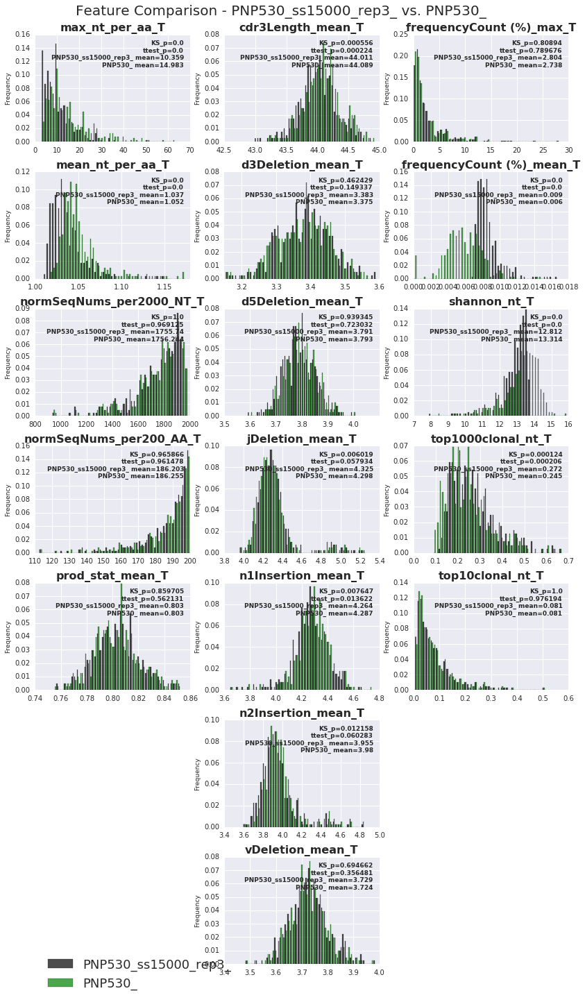

generating excel file with mean values for compared dataset (find in -featureSummaryDFs folder-)
plotting gene usage comparison...
plot file can be found in -realAnalysis folder


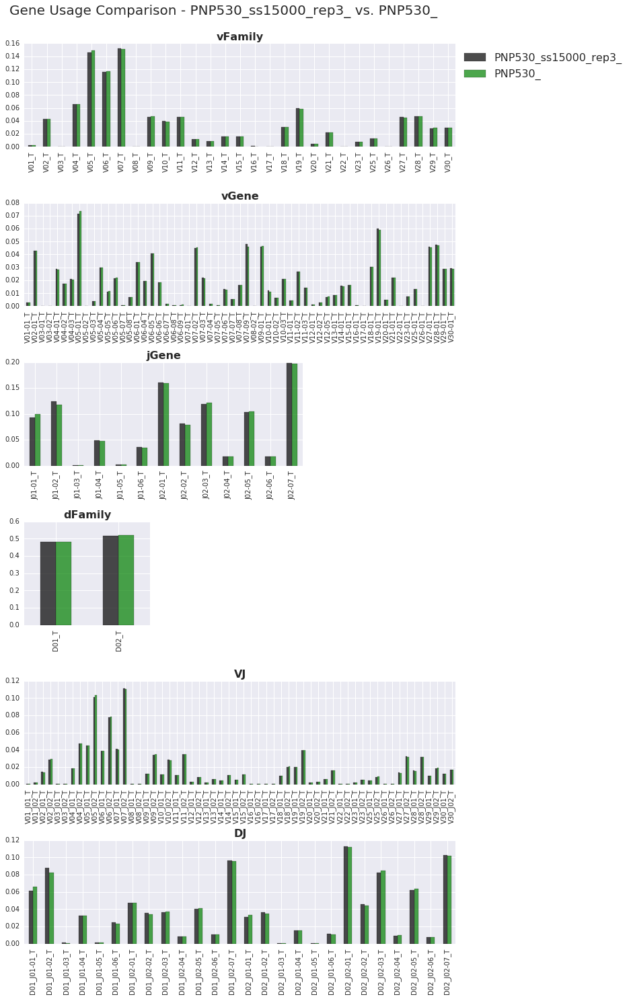

done
*********subsampling Cardio cohort with %s sequences per sample:***************
step 1: subsampling (long)
number of samples in folder is 126
0 BD1014
nTemplates in sample is 3819 and therefore this sample is not subsampled
1 BD1068
nTemplates in sample is 11906 and therefore this sample is not subsampled
2 BD1013
nTemplates in sample is 13691 and therefore this sample is not subsampled
3 BD1061
nTemplates in sample is 13157 and therefore this sample is not subsampled
4 BD1066
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 15552
nTemplates in sample is 22540
l list length is 22540 and should be equal to nTemplates
cumsum list length is 15552 and should be equal to n Unique
length of popped nucleotide dataframe is 22540 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
5 BD996
generating a popped nucleotide sequenes:...
n Uniq

32 BD1079
nTemplates in sample is 12285 and therefore this sample is not subsampled
33 BD1020
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 10728
nTemplates in sample is 16430
l list length is 16430 and should be equal to nTemplates
cumsum list length is 10728 and should be equal to n Unique
length of popped nucleotide dataframe is 16430 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
34 BD999
nTemplates in sample is 9098 and therefore this sample is not subsampled
35 BD990
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 20324
nTemplates in sample is 37728
l list length is 37728 and should be equal to nTemplates
cumsum list length is 20324 and should be equal to n Unique
length of popped nucleotide dataframe is 37728 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and s

63 BD959
nTemplates in sample is 11486 and therefore this sample is not subsampled
64 BD968
nTemplates in sample is 3593 and therefore this sample is not subsampled
65 BD1000
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 10735
nTemplates in sample is 19682
l list length is 19682 and should be equal to nTemplates
cumsum list length is 10735 and should be equal to n Unique
length of popped nucleotide dataframe is 19682 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
66 BD1007
nTemplates in sample is 12411 and therefore this sample is not subsampled
67 BD1009
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13639
nTemplates in sample is 20851
l list length is 20851 and should be equal to nTemplates
cumsum list length is 13639 and should be equal to n Unique
length of popped nucleotide dataframe is 20851 

90 BD1064
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 13353
nTemplates in sample is 17383
l list length is 17383 and should be equal to nTemplates
cumsum list length is 13353 and should be equal to n Unique
length of popped nucleotide dataframe is 17383 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
91 BD1016
nTemplates in sample is 11974 and therefore this sample is not subsampled
92 BD979
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 12585
nTemplates in sample is 15436
l list length is 15436 and should be equal to nTemplates
cumsum list length is 12585 and should be equal to n Unique
length of popped nucleotide dataframe is 15436 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be eq

120 BD992
nTemplates in sample is 12618 and therefore this sample is not subsampled
121 BD1086
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 16810
nTemplates in sample is 20756
l list length is 20756 and should be equal to nTemplates
cumsum list length is 16810 and should be equal to n Unique
length of popped nucleotide dataframe is 20756 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be equal to 15000
122 BD995
generating a popped nucleotide sequenes:...
n Unique sequences in sample is 8658
nTemplates in sample is 20199
l list length is 20199 and should be equal to nTemplates
cumsum list length is 8658 and should be equal to n Unique
length of popped nucleotide dataframe is 20199 and should be equal to nTemplates
subsampling...
subsampled df length is 15000 and should be equal to 15000
templates sum in subsampled file is 15000 and should be eq

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
4 BD1067_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
9 BD1062_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
14 BD1031_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
19 BD1083_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
24 BD1086_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
29 BD1042_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
34 BD984_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
39 BD1053_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
44 BD1093_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
49 BD982_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
54 BD1004_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
59 BD965_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features.

calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
counting gene usage features...
calculating gene usage for param vGeneName
calculating gene usage for param vFamilyName
calculating gene usage for param dFamilyName
calculating gene usage for param jGeneName
counting dependent gene usage features...
calculating dep gene usage for dep param V-J family combination
calculating dep gene usage for dep param D-J gene combination
64 BD1099_15000
Total
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
Prod
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features...
calculating diversity features...
nonProd
calculating length features...
calculating general features...
calculating normSeqNums features...
calculating clonality features

 cohort1 df length is now 65
 cohort2 df length is now 65
comparing datasets and plot selected features:...
couldnt execute ks test
plot file can be found in -realAnalysis folder


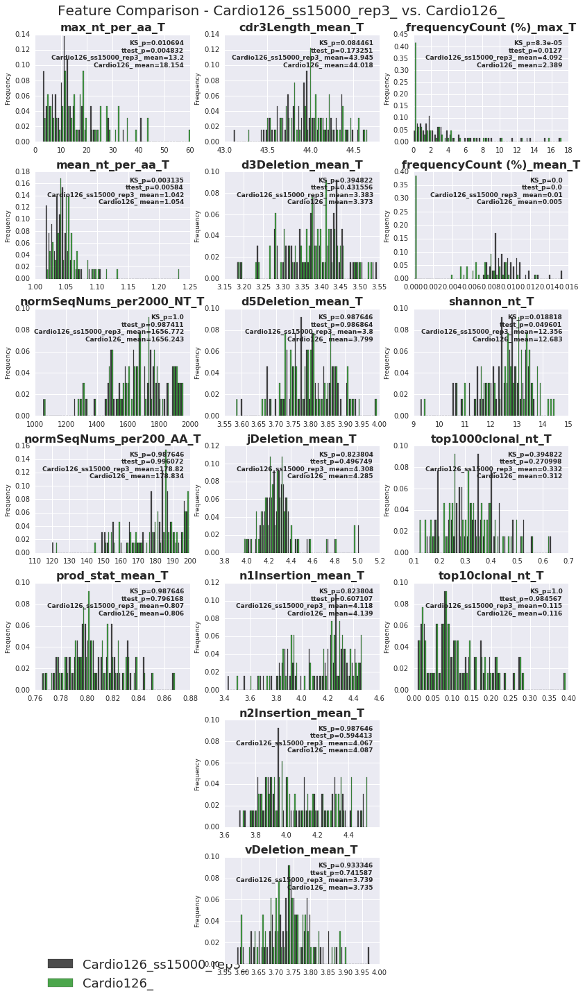

generating excel file with mean values for compared dataset (find in -featureSummaryDFs folder-)
plotting gene usage comparison...
plot file can be found in -realAnalysis folder


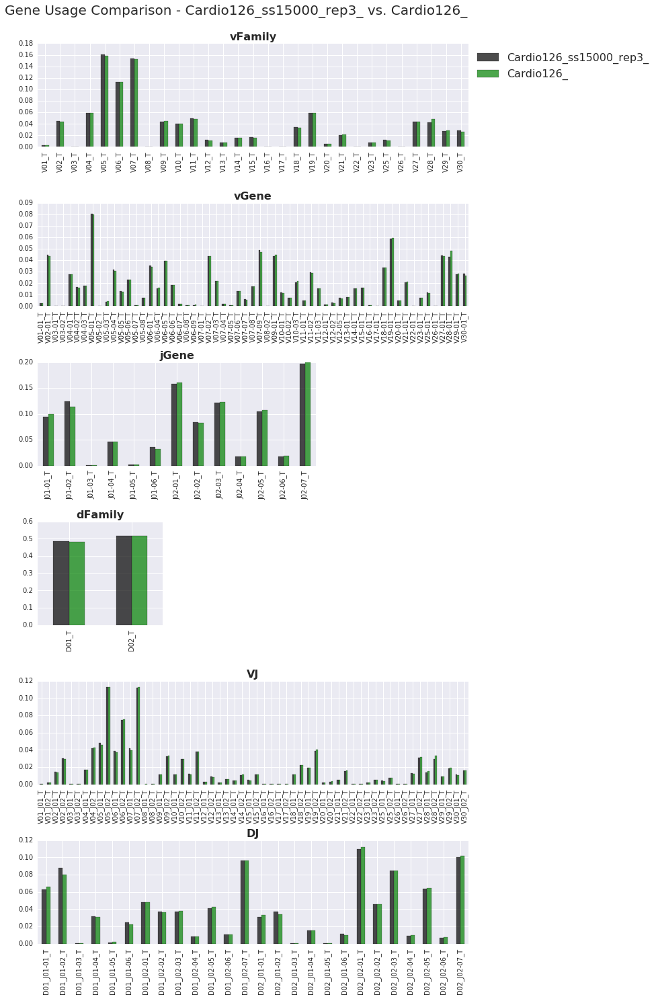

done
************comparing TCRfeatures between cohorts (not matched!):*************
generating excel file with mean values for compared dataset (find in -featureSummaryDFs folder-)
comparing datasets and plot selected features:...
couldnt execute ks test
plot file can be found in -realAnalysis folder


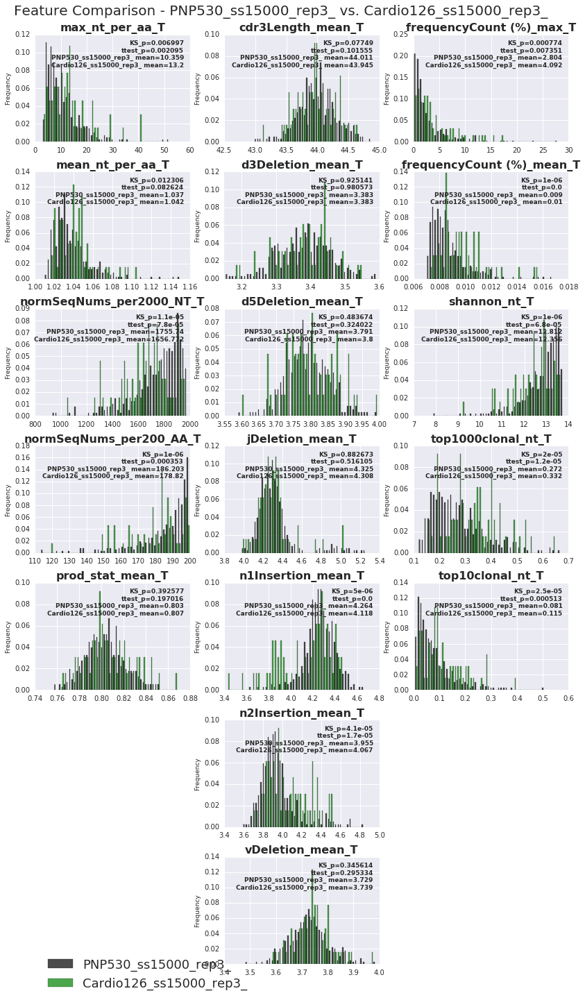

generating excel file with mean values for compared dataset (find in -featureSummaryDFs folder-)
plotting gene usage comparison...
plot file can be found in -realAnalysis folder


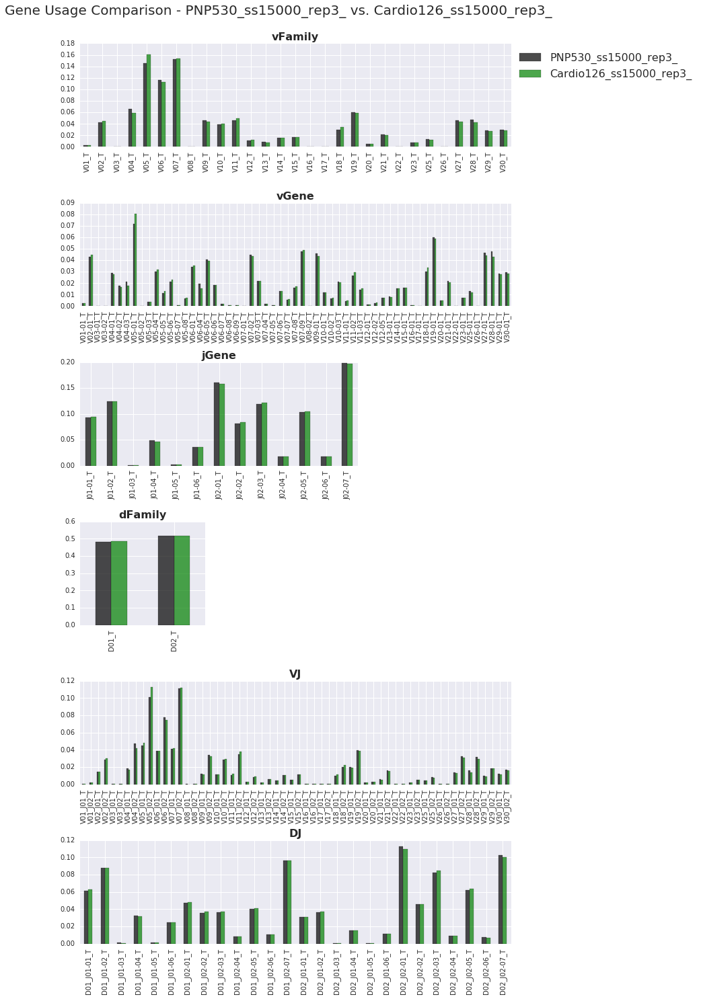

*****generating 10perc TCRdfs******
preparing sharing Matrix
only samples included in PNP530 sample list are included in the analysis
getting all samples from the sampleList...
extracting unique aa sequenecs from all samples...(n=404)
0 BD239_15000.tsv
1 BD944_15000.tsv
2 BD469_15000.tsv
3 BD437_15000.tsv
4 BD677_1_15000.tsv
5 BD371_15000.tsv
6 BD897_15000.tsv
7 BD932_15000.tsv
8 BD441_15000.tsv
9 BD23_15000.tsv
10 BD797_15000.tsv
11 BD852_15000.tsv
12 BD199_15000.tsv
13 BD6_15000.tsv
14 BD238_15000.tsv
15 BD668_1_15000.tsv
16 BD706_1_15000.tsv
17 BD508_15000.tsv
18 BD436_15000.tsv
19 BD945_15000.tsv
20 BD468_15000.tsv
21 BD796_15000.tsv
22 BD605_1_15000.tsv
23 BD440_15000.tsv
24 BD933_15000.tsv
25 BD896_15000.tsv
26 BD122_322939_2_15000.tsv
27 BD764_1_15000.tsv
28 BD918_15000.tsv
29 BD435_15000.tsv
30 BD618_15000.tsv
31 BD946_15000.tsv
32 BD878_15000.tsv
33 BD586_1_15000.tsv
34 BD4_15000.tsv
35 BD850_15000.tsv
36 BD443_15000.tsv
37 BD795_15000.tsv
38 BD895_15000.tsv
39 BD919_15000.tsv

384 BD161_322939_2_15000.tsv
385 BD909_15000.tsv
386 BD424_15000.tsv
387 BD837_15000.tsv
388 BD130_322939_2_15000.tsv
389 BD544_15000.tsv
390 BD533_15000.tsv
391 BD840_15000.tsv
392 BD920_15000.tsv
393 BD363_15000.tsv
394 BD885_15000.tsv
395 BD908_15000.tsv
396 BD425_15000.tsv
397 BD140_322939_2_15000.tsv
398 BD19_15000.tsv
399 BD664_1_15000.tsv
400 BD545_15000.tsv
401 BD868_15000.tsv
402 BD836_15000.tsv
403 BD107_1rep_15000.tsv
generating a df with all sequences and number of samples shared...
number of dfs in directory: 404
the length of df list is 404
               frequencyCount (%)  prod_stat Sample
aminoAcid                                          
CA*CPGIYEQYF             0.006667          0  BD478
CAAGPGMNTEAFF            0.006667          1  BD478
CAAGQTYEQYF              0.006667          1  BD478
CAAGSNGYTF               0.006667          1  BD478
CAAQGGAREQFF             0.006667          1  BD478
USING ONLY PRODUCTIVE SEQUENCES TO GENERATE SHARING MATRIX!!!
filtering out

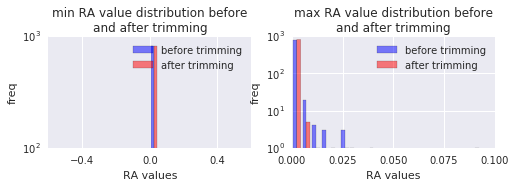

binarizing df...
existing values in df are now:
[0. 1.]
normalizing data so each sample  sum will be 1...
BD1      0.010538
BD10     0.014781
BD101    0.005467
BD104    0.009631
BD105    0.010130
dtype: float64
BD1      1.0
BD10     1.0
BD101    1.0
BD104    1.0
BD105    1.0
dtype: float64
values contain zeros, log transformation was not applied
final file name is:
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530_SubSampled15000data_rep3/PNP530_sharingAnalysis/sharingMatrix_PNP530_ss15000_rep3_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed
plotting mean sample distributions for all generated dfs...
0 (404, 285628)
origDF is too big, plot was not generated
1 (404, 822)
2 (404, 822)
3 (404, 822)


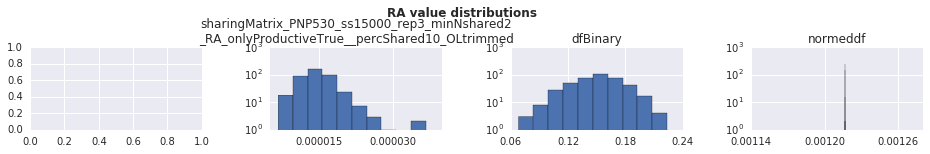

plotting RA value distributions for all generated dfs IN A RANDOM SAMPLE


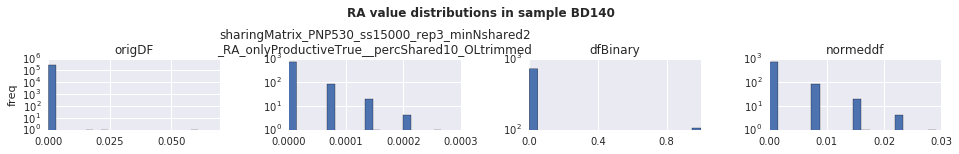

saving df to file...
saving binary df to file
saving normed df to file
ALL is done!!!
***********generating 10perc TCRdfs for Cardio************
preparing sharing Matrix
only samples included in Cardio126 sample list are included in the analysis
getting all samples from the sampleList...
extracting unique aa sequenecs from all samples...(n=65)
0 BD998_15000.tsv
1 BD1066_15000.tsv
2 BD1011_15000.tsv
3 BD974_15000.tsv
4 BD1067_15000.tsv
5 BD1089_15000.tsv
6 BD1064_15000.tsv
7 BD1088_15000.tsv
8 BD1065_15000.tsv
9 BD1062_15000.tsv
10 BD971_15000.tsv
11 BD958_15000.tsv
12 BD970_15000.tsv
13 BD1015_15000.tsv
14 BD1031_15000.tsv
15 BD1047_15000.tsv
16 BD1082_15000.tsv
17 BD990_15000.tsv
18 BD1030_15000.tsv
19 BD1083_15000.tsv
20 BD993_15000.tsv
21 BD1045_15000.tsv
22 BD1032_15000.tsv
23 BD1081_15000.tsv
24 BD1086_15000.tsv
25 BD978_15000.tsv
26 BD995_15000.tsv
27 BD1087_15000.tsv
28 BD979_15000.tsv
29 BD1042_15000.tsv
30 BD1084_15000.tsv
31 BD1037_15000.tsv
32 BD952_15000.tsv
33 BD996_15000.

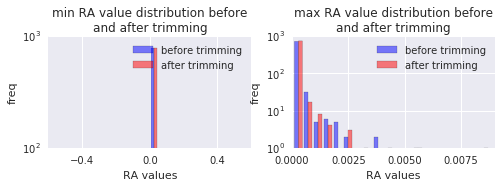

binarizing df...
existing values in df are now:
[0. 1.]
normalizing data so each sample  sum will be 1...
BD1000    0.013349
BD1004    0.009733
BD1005    0.012869
BD1009    0.008445
BD1011    0.011448
dtype: float64
BD1000    1.0
BD1004    1.0
BD1005    1.0
BD1009    1.0
BD1011    1.0
dtype: float64
values contain zeros, log transformation was not applied
final file name is:
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/CardioSamples/Cardio126_SubSampled15000data_rep3/Cardio126_sharingAnalysis/sharingMatrix_Cardio126_ss15000_rep3_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed
plotting mean sample distributions for all generated dfs...
0 (65, 25088)
1 (65, 781)
2 (65, 781)
3 (65, 781)


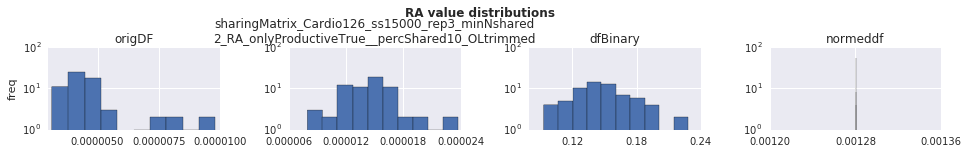

plotting RA value distributions for all generated dfs IN A RANDOM SAMPLE


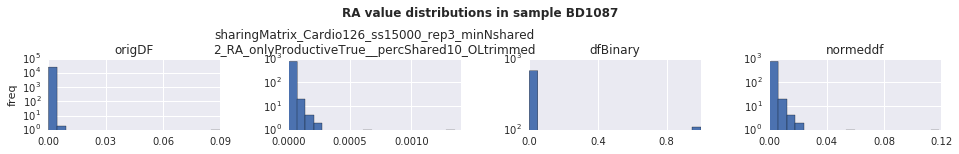

saving df to file...
saving binary df to file
saving normed df to file
ALL is done!!!
generating distmats for PNP
****************generating phenotype distMats*******************
generating distMat for phenotype Age
generating condensed distance matrix using euclidean
top similar pairs:
        dist sample1 sample2
225746   0.0   BD350   BD383
352586   0.0   BD556   BD756
92984    0.0   BD192   BD727
134174   0.0   BD237   BD920
307720   0.0   BD473   BD659
92989    0.0   BD192   BD731
158914   0.0   BD266   BD766
92994    0.0   BD192   BD736
282224   0.0   BD431    BD71
201386   0.0   BD318   BD701
generating squareform distance matrix using euclidean
generating distMat for phenotype BMI
generating condensed distance matrix using euclidean
top similar pairs:
        dist sample1 sample2
271058   0.0   BD414   BD715
152555   0.0   BD259   BD561
93842    0.0   BD193    BD74
167487   0.0   BD277   BD310
446217   0.0   BD877   BD919
323674   0.0   BD500   BD593
209149   0.0   BD328   BD76

top similar pairs:
                dist sample1 sample2
69340   3.296613e-07   BD896   BD646
20049   9.060642e-07    BD20   BD768
30235   3.517815e-06   BD841   BD690
56480   3.922664e-06   BD127   BD697
108944  5.160389e-06   BD507   BD139
111726  5.369974e-06   BD412   BD366
74366   6.278205e-06   BD633   BD139
55113   6.862055e-06   BD810   BD534
43343   8.909693e-06   BD791   BD424
51330   1.105547e-05   BD708   BD913
generating squareform distance matrix using euclidean
******generating distMat for TCRdfs:**********
TCRdfminNshared2RAonlyProductiveTruepercShared10OLtrimmed
generating distance matrix for RA data:
sampleListName=PNP530
file name=/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530_SubSampled15000data_rep3/PNP530_sharingAnalysis/sharingMatrix_PNP530_ss15000_rep3_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed
TCRdf sum is 4.868054024690182
generating condensed distance matrix using braycurtis
top similar pairs:
           dist sample1 sample

IOError: [Errno 2] No such file or directory: '/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530_SubSampled15000data_rep3/featureDistMats/PNP530_top10clonal_nt_T_euclidean_distMat'

In [31]:
ss=15000
repeat=3
ssPNP=True #True/False. subsample only if not exist
ssCardio=True #True/False. subsample only if not exist
genTCRdfPNP=True #True/False. 
genTCRdfCardio=True #True/False. 


testPhenotypeAffectsOnsubsampledCohorts(ss,repeat,ssPNP,ssCardio,genTCRdfPNP,genTCRdfCardio)

## function2 - generate matched cohorts and validate by comparing phenotypes
try to get as many samples as possible!

### prepare phenotype DFs:

*** replace all ss and rep information!!! make sure phenotype file is updated!***

In [32]:
# get full phenotype DFs for PNP and Cardio:
f1='%s/TCR_real_data/NewPhenotypicData/newPhenotypesPNPAllInfo_withDummies.xlsx' %MyPath
PNP530_phen_new_dummies=pd.read_excel(f1).set_index('BD')

f2='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126phenAllInfo_withDummies.xlsx' %MyPath
Cardio126_phen_new_dummies=pd.read_excel(f2).set_index('BD')

#filter for ss15000 samples and save:
folder='%s/TCR_real_data/PNP530_SubSampled15000data_rep3/SamplesForAnalysis_corrected' %MyPath
PNP530ss15000rep3sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)

PNP530ss15000rep3_phen_new_dummies=PNP530_phen_new_dummies.loc[PNP530ss15000rep3sampleList,:]

f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss15000rep3_phen_new_dummies.xlsx' %MyPath
PNP530ss15000rep3_phen_new_dummies.to_excel(f3)


folder='%s/TCR_real_data/CardioSamples/Cardio126_SubSampled15000data_rep3/SamplesForAnalysis_corrected' %MyPath
Cardio126ss15000rep3sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)

Cardio126ss15000rep3_phen_new_dummies=Cardio126_phen_new_dummies.loc[Cardio126ss15000rep3sampleList,:]

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss15000rep3_phen_new_dummies.xlsx' %MyPath
Cardio126ss15000rep3_phen_new_dummies.to_excel(f4)


### run matching function-including relatives:

********** run several times to reach optimal matched cohorts, and then clean folder from unwanted sample lists and other stuff **********

**********use results for next function **************

restricted phenotypes=['Gender_Male', 'Age', 'HbA1C', 'Smoking Status_Yes']
numericalPhenotypes=['Age', 'HbA1C', 'Glucose', 'BMI', 'Total Cholesterol']
*******************random state = 3
number of samples in cohort 1 is 65
number of samples in cohort 2 is 404
imputing missing values for cohort PNP530ss15000rep3
now the number of samples in cohort 2 is 404
0 BD1064
                      BD1064
Gender_Male           1.0000
Age                  64.0000
HbA1C                    NaN
Smoking Status_Yes    0.0000
Glucose              95.0000
BMI                  24.6755
Total Cholesterol        NaN
Smoking Status_Past   1.0000
Gender_Male identity None True
len same=149
len potCohort=149
len potCohort>2, continue to the next phenotype
Age delta 10 True
len same=20
len potCohort=20
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
phenotype value is nan, skip this phenotype
Smoking Status_Yes identity None True
len same=19
len potCohort=19
len potCohort>2, continue to the n

now the number of samples in cohort 2 is 400
4 BD1067
                         BD1067
Gender_Male            1.000000
Age                   45.000000
HbA1C                  5.900000
Smoking Status_Yes     1.000000
Glucose               90.000000
BMI                   33.874064
Total Cholesterol    198.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=145
len potCohort=145
len potCohort>2, continue to the next phenotype
Age delta 10 True
len same=69
len potCohort=69
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=67
len potCohort=67
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=8
len potCohort=8
len potCohort>2, continue to the next phenotype
Glucose delta 20 False
len same=8
len potCohort=8
len potCohort>2, continue to the next phenotype
BMI delta None False
len same=8
len potCohort=8
len potCohort>2, continue to the next phenotype
Total Cholesterol delta None False
len same=8
le

29 BD851
v1: Gender_Male            0.000000
Age                   -0.448228
HbA1C                  0.065896
Smoking Status_Yes     0.000000
Glucose               -0.683672
BMI                   -1.263189
Total Cholesterol     -0.737161
Smoking Status_Past    0.000000
Name: BD851, dtype: float64
30 BD933
v1: Gender_Male            0.000000
Age                    0.530880
HbA1C                 -0.680624
Smoking Status_Yes     0.000000
Glucose               -0.320103
BMI                   -0.755468
Total Cholesterol      0.789338
Smoking Status_Past    0.000000
Name: BD933, dtype: float64
31 BD699
v1: Gender_Male            0.000000
Age                   -0.366635
HbA1C                 -0.400679
Smoking Status_Yes     0.000000
Glucose                0.843318
BMI                   -0.670373
Total Cholesterol     -1.055182
Smoking Status_Past    0.000000
Name: BD699, dtype: float64
32 BD645
v1: Gender_Male            0.000000
Age                    0.286103
HbA1C                  0.555800


v1: Gender_Male            0.000000
Age                   -1.182558
HbA1C                 -0.167391
Smoking Status_Yes     0.000000
Glucose               -0.247389
BMI                   -1.259016
Total Cholesterol     -0.864369
Smoking Status_Past    0.000000
Name: BD58, dtype: float64
140 BD337
v1: Gender_Male            0.000000
Age                   -0.285043
HbA1C                 -0.167391
Smoking Status_Yes     0.000000
Glucose               -0.538244
BMI                   -0.495149
Total Cholesterol     -0.291932
Smoking Status_Past    0.000000
Name: BD337, dtype: float64
141 BD126
v1: Gender_Male            0.000000
Age                   -0.529820
HbA1C                 -0.400679
Smoking Status_Yes     0.000000
Glucose               -0.101961
BMI                    0.547390
Total Cholesterol     -1.150588
Smoking Status_Past    0.000000
Name: BD126, dtype: float64
142 BD435
v1: Gender_Male            0.000000
Age                    1.183618
HbA1C                  2.865346
Smoking

now the number of samples in cohort 2 is 396
8 BD970
                          BD970
Gender_Male            1.000000
Age                   61.000000
HbA1C                  5.500000
Smoking Status_Yes     0.000000
Glucose               82.000000
BMI                   32.557694
Total Cholesterol    201.000000
Smoking Status_Past    1.000000
Gender_Male identity None True
len same=143
len potCohort=143
len potCohort>2, continue to the next phenotype
Age delta 10 True
len same=21
len potCohort=21
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=19
len potCohort=19
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=18
len potCohort=18
len potCohort>2, continue to the next phenotype
Glucose delta 20 False
len same=14
len potCohort=14
len potCohort>2, continue to the next phenotype
BMI delta None False
len same=14
len potCohort=14
len potCohort>2, continue to the next phenotype
Total Cholesterol delta None False
len same

now choosing the closest sample:
v2: Gender_Male            1.000000
Age                    0.817875
HbA1C                  0.069821
Smoking Status_Yes     0.000000
Glucose               -0.365582
BMI                   -0.260341
Total Cholesterol     -0.315969
Smoking Status_Past    0.000000
Name: BD984, dtype: float64
0 BD71
v1: Gender_Male            1.000000
Age                    0.000000
HbA1C                 -0.598031
Smoking Status_Yes     0.000000
Glucose               -0.633675
BMI                   -0.398996
Total Cholesterol      0.078178
Smoking Status_Past    0.000000
Name: BD71, dtype: float64
1 BD908
v1: Gender_Male            1.000000
Age                    1.090500
HbA1C                 -0.264105
Smoking Status_Yes     0.000000
Glucose                0.438698
BMI                    0.033976
Total Cholesterol     -0.208475
Smoking Status_Past    0.000000
Name: BD908, dtype: float64
2 BD834
v1: Gender_Male            1.000000
Age                    1.635749
HbA1C        

now choosing the closest sample:
v2: Gender_Male            1.000000
Age                    1.406930
HbA1C                  1.307403
Smoking Status_Yes     1.000000
Glucose               -0.419832
BMI                   -0.941137
Total Cholesterol     -1.042337
Smoking Status_Past    0.000000
Name: BD1000, dtype: float64
0 BD829
v1: Gender_Male            1.000000
Age                   -0.579324
HbA1C                 -1.120631
Smoking Status_Yes     1.000000
Glucose                1.379448
BMI                   -0.443595
Total Cholesterol     -0.306570
Smoking Status_Past    0.000000
Name: BD829, dtype: float64
1 BD355
v1: Gender_Male            1.000000
Age                   -0.827606
HbA1C                 -0.186772
Smoking Status_Yes     1.000000
Glucose               -0.959616
BMI                    1.384732
Total Cholesterol      1.348907
Smoking Status_Past    0.000000
Name: BD355, dtype: float64
sample BD829 was found to be the closet to sample BD1000, so it is selected
now the nu

                         BD1020
Gender_Male            1.000000
Age                   55.000000
HbA1C                  5.600000
Smoking Status_Yes     0.000000
Glucose              118.000000
BMI                   25.689562
Total Cholesterol    111.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=134
len potCohort=134
len potCohort>2, continue to the next phenotype
Age delta 10 True
len same=28
len potCohort=28
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=26
len potCohort=26
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=26
len potCohort=26
len potCohort>2, continue to the next phenotype
Glucose delta 20 False
len same=12
len potCohort=12
len potCohort>2, continue to the next phenotype
BMI delta None False
len same=12
len potCohort=12
len potCohort>2, continue to the next phenotype
Total Cholesterol delta None False
len same=12
len potCohort=12
len potCohort>2, continue to the

v1: Gender_Male            0.000000
Age                   -0.457225
HbA1C                  2.584223
Smoking Status_Yes     0.000000
Glucose                1.085510
BMI                    1.502902
Total Cholesterol     -0.239146
Smoking Status_Past    0.000000
Name: BD435, dtype: float64
12 BD431
v1: Gender_Male            0.000000
Age                    0.074299
HbA1C                  0.610353
Smoking Status_Yes     0.000000
Glucose                0.395928
BMI                    0.503108
Total Cholesterol     -1.491332
Smoking Status_Past    0.000000
Name: BD431, dtype: float64
13 BD596
v1: Gender_Male            0.000000
Age                   -0.988749
HbA1C                 -0.461176
Smoking Status_Yes     0.000000
Glucose               -1.902676
BMI                   -1.027074
Total Cholesterol      1.610676
Smoking Status_Past    0.000000
Name: BD596, dtype: float64
14 BD690
v1: Gender_Male            0.000000
Age                    1.137347
HbA1C                  0.610353
Smoking S

allSamples:
        Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD600           1.0  63.0   5.27                 0.0     99.0  45.970795   
BD221           1.0  55.0   6.30                 0.0    100.0  24.857955   
BD801           1.0  58.0   5.63                 0.0     87.0  20.307412   
BD71            1.0  59.0   5.40                 0.0     93.0  24.859074   
BD1097          1.0  64.0    NaN                 0.0    107.0  29.036738   

        Total Cholesterol  Smoking Status_Past  
BD600               166.0                  0.0  
BD221               133.0                  0.0  
BD801               229.0                  0.0  
BD71                183.0                  0.0  
BD1097              237.0                  0.0  
now choosing the closest sample:
v2: Gender_Male            1.000000
Age                    1.268656
HbA1C                 -0.300841
Smoking Status_Yes     0.000000
Glucose                1.448715
BMI                    0.003402
Total Ch

len same=0
no more 1 samples in PNP530ss15000rep3 cohort
now the number of samples in cohort 2 is 379
36 BD1089
                         BD1089
Gender_Male            1.000000
Age                   50.000000
HbA1C                  5.700000
Smoking Status_Yes     1.000000
Glucose              103.000000
BMI                   24.163265
Total Cholesterol    127.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=128
len potCohort=128
len potCohort>2, continue to the next phenotype
Age delta 10 True
len same=36
len potCohort=36
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=36
len potCohort=36
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=3
len potCohort=3
len potCohort>2, continue to the next phenotype
Glucose delta 20 False
len same=3
len potCohort=3
len potCohort>2, continue to the next phenotype
BMI delta None False
len same=3
len potCohort=3
len potCohort>2, continue to the next 

Gender_Male identity None True
len same=250
len potCohort=250
len potCohort>2, continue to the next phenotype
Age delta 10 True
len same=21
len potCohort=21
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=21
len potCohort=21
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=21
len potCohort=21
len potCohort>2, continue to the next phenotype
Glucose delta 20 False
len same=13
len potCohort=13
len potCohort>2, continue to the next phenotype
BMI delta None False
len same=13
len potCohort=13
len potCohort>2, continue to the next phenotype
Total Cholesterol delta None False
len same=13
len potCohort=13
len potCohort>2, continue to the next phenotype
Smoking Status_Past identity None False
len same=7
len potCohort=7
len potCohort>2 but this is the last phenotype
allSamples:
        Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD690           0.0  65.0   6.00                 0.0    110.0  27.1415

v1: Gender_Male            1.000000
Age                   -0.135621
HbA1C                  0.525556
Smoking Status_Yes     0.000000
Glucose                1.737630
BMI                   -1.666872
Total Cholesterol      1.292013
Smoking Status_Past    0.000000
Name: BD646, dtype: float64
22 BD931
v1: Gender_Male            1.000000
Age                   -1.186068
HbA1C                  0.272862
Smoking Status_Yes     0.000000
Glucose               -1.021528
BMI                   -0.181656
Total Cholesterol     -0.342498
Smoking Status_Past    0.000000
Name: BD931, dtype: float64
23 BD891
v1: Gender_Male            1.000000
Age                   -1.010994
HbA1C                 -0.906377
Smoking Status_Yes     0.000000
Glucose                0.013156
BMI                    0.538204
Total Cholesterol     -0.502744
Smoking Status_Past    0.000000
Name: BD891, dtype: float64
24 BD799
v1: Gender_Male            1.000000
Age                   -0.135621
HbA1C                 -0.288680
Smoking S

        Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD150           1.0  53.0    5.9                 0.0     94.0  28.405338   
BD124           1.0  59.0    4.7                 0.0     91.0  24.535124   
BD1053          1.0  63.0    5.3                 0.0    107.0  28.405504   

        Total Cholesterol  Smoking Status_Past  
BD150               202.0                  1.0  
BD124               145.0                  1.0  
BD1053                NaN                  1.0  
now choosing the closest sample:
v2: Gender_Male            1.000000e+00
Age                    1.135550e+00
HbA1C                 -1.812987e-15
Smoking Status_Yes     0.000000e+00
Glucose                1.392045e+00
BMI                    7.071525e-01
Total Cholesterol      0.000000e+00
Smoking Status_Past    1.000000e+00
Name: BD1053, dtype: float64
0 BD150
v1: Gender_Male            1.000000
Age                   -1.297771
HbA1C                  1.224745
Smoking Status_Yes     0.000000
Gluco

        Gender_Male   Age  HbA1C  Smoking Status_Yes  Glucose        BMI  \
BD920           1.0  39.0   5.57                 1.0    100.0  24.677021   
BD355           1.0  43.0   5.50                 1.0     87.0  24.944492   
BD1078          1.0  49.0    NaN                 1.0    103.0  28.964735   

        Total Cholesterol  Smoking Status_Past  
BD920               219.0                  0.0  
BD355               266.0                  0.0  
BD1078                NaN                  0.0  
now choosing the closest sample:
v2: Gender_Male            1.000000
Age                    1.297771
HbA1C                  0.000000
Smoking Status_Yes     1.000000
Glucose                0.912029
BMI                    1.412020
Total Cholesterol      0.000000
Smoking Status_Past    0.000000
Name: BD1078, dtype: float64
0 BD920
v1: Gender_Male            1.000000
Age                   -1.135550
HbA1C                  1.224745
Smoking Status_Yes     1.000000
Glucose                0.480015
BMI  

HbA1C delta 1.2 True
len same=19
len potCohort=19
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=1
len potCohort=1
len potCohort<2, so after phenotype Smoking Status_Yes, sample BD355 is taken
now the number of samples in cohort 2 is 365
59 BD998
                          BD998
Gender_Male            1.000000
Age                   59.000000
HbA1C                  5.700000
Smoking Status_Yes     1.000000
Glucose              101.000000
BMI                   24.801587
Total Cholesterol    145.000000
Smoking Status_Past    0.000000
Gender_Male identity None True
len same=118
len potCohort=118
len potCohort>2, continue to the next phenotype
Age delta 10 True
len same=11
len potCohort=11
len potCohort>2, continue to the next phenotype
HbA1C delta 1.2 True
len same=11
len potCohort=11
len potCohort>2, continue to the next phenotype
Smoking Status_Yes identity None True
len same=0
no more 1 samples in PNP530ss15000rep3 cohort
now the number of s

v1: Gender_Male            0.000000
Age                    2.119445
HbA1C                  1.366697
Smoking Status_Yes     0.000000
Glucose                1.392879
BMI                    1.450297
Total Cholesterol      0.503444
Smoking Status_Past    0.000000
Name: BD830, dtype: float64
23 BD371
v1: Gender_Male            0.000000
Age                   -0.461027
HbA1C                 -2.233541
Smoking Status_Yes     0.000000
Glucose               -1.201294
BMI                   -0.281522
Total Cholesterol     -0.196957
Smoking Status_Past    0.000000
Name: BD371, dtype: float64
24 BD840
v1: Gender_Male            0.000000
Age                   -1.056521
HbA1C                 -0.303814
Smoking Status_Yes     0.000000
Glucose               -0.896097
BMI                   -0.867457
Total Cholesterol     -0.227409
Smoking Status_Past    0.000000
Name: BD840, dtype: float64
25 BD185
v1: Gender_Male            0.000000
Age                    0.928458
HbA1C                 -0.793446
Smoking S

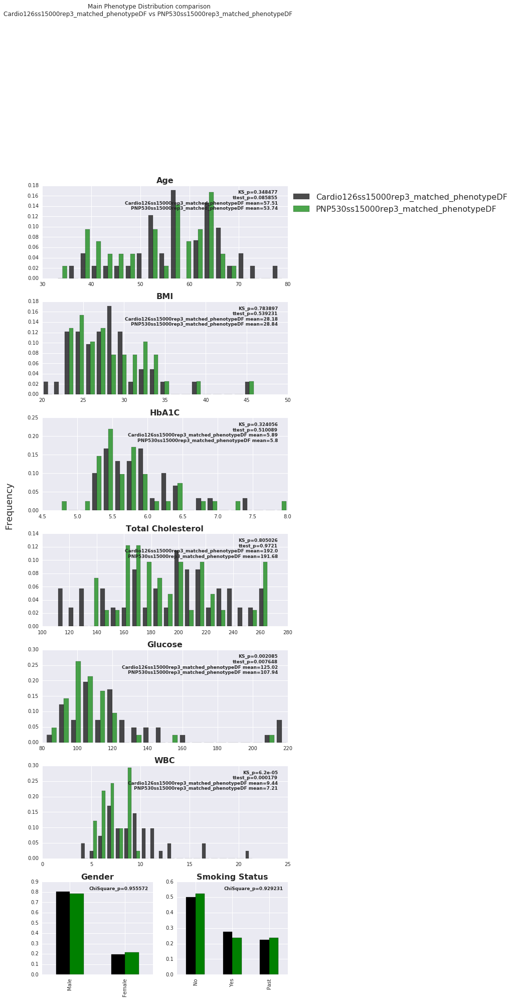

figure was saved in folder TCR_real_data/realAnalysis
done


In [41]:
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss15000rep3_phen_new_dummies.xlsx' %MyPath
PNP530ss15000rep3_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss15000rep3_phen_new_dummies.xlsx' %MyPath
Cardio126ss15000rep3_phen_new_dummies=pd.read_excel(f4).set_index('BD')

phenotypeList=[('Gender_Male','identity',None,True),('Age','delta',10,True),('HbA1C','delta',1.2,True),
               ('Smoking Status_Yes','identity',None,True),('Glucose','delta',20,False),('BMI','delta',None,False),('Total Cholesterol','delta',None,False),
              ('Smoking Status_Past','identity',None,False)]
columnsToUse=[x[0] for x in phenotypeList]
restrictedPhenotypes=[x[0] for x in phenotypeList if x[3]==True]
numericalPhenotypes=[x[0] for x in phenotypeList if x[1]=='delta']
print 'restricted phenotypes=%s' %restrictedPhenotypes
print 'numericalPhenotypes=%s' %numericalPhenotypes

cohort1phenotypeDF=Cardio126ss15000rep3_phen_new_dummies
cohort1name='Cardio126ss15000rep3'
cohort2phenotypeDF=PNP530ss15000rep3_phen_new_dummies
cohort2name='PNP530ss15000rep3'

# cohort1phenotypeDF=Cardio126ss15000rep3_phen_new_dummies
# cohort1name='Cardio126ss15000rep3_matchedToRelRemoved'
# cohort2phenotypeDF=PNP530ss15000rep3_phen_new_dummies
# cohort2phenotypeDF=removeRelatives(cohort2phenotypeDF) ######### removing samples with relatives!
# cohort2name='PNP530ss15000rep3_relRemoved'



folderToSaveLists='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss15000rep3' %MyPath
random_state=3
        
# for random_state in range(9,10):
#     if random_state!=3:
print '*******************random state = %s' %random_state

matchedCardio15000samples,matchedPNP15000samples=gen_matched_cohorts_by_phenotypes(cohort1phenotypeDF,cohort1name,
        cohort2phenotypeDF,cohort2name,phenotypeList, columnsToUse,restrictedPhenotypes,folderToSaveLists,random_state)

    #phenotypeList is a list of tuples, in each tuple the first item is the phenotype name (string)the second is the conditionType-'identity' or 'delta',
#the third is the delta (int) or None and the forth is isStopingCrit (True/False)

### run matching function-not including relatives:

********** run several times to reach optimal matched cohorts, and then clean folder from unwanted sample lists and other stuff **********

**********use results for next function **************

In [ ]:
# f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss15000rep3_phen_new_dummies.xlsx' %MyPath
# PNP530ss15000rep3_phen_new_dummies=pd.read_excel(f3).set_index('BD')

# f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss15000rep3_phen_new_dummies.xlsx' %MyPath
# Cardio126ss15000rep3_phen_new_dummies=pd.read_excel(f4).set_index('BD')

# phenotypeList=[('Gender_Male','identity',None,True),('Age','delta',9,True),('Glucose','delta',20,True),
#                ('HbA1C','delta',None,False), ('BMI','delta',None,False),('Total Cholesterol','delta',None,False),
#               ('Smoking Status_Past','identity',None,False),('Smoking Status_Yes','identity',None,False)]
# columnsToUse=[x[0] for x in phenotypeList]
# restrictedPhenotypes=[x[0] for x in phenotypeList if x[3]==True]
# numericalPhenotypes=[x[0] for x in phenotypeList if x[1]=='delta']
# print 'restricted phenotypes=%s' %restrictedPhenotypes
# print 'numericalPhenotypes=%s' %numericalPhenotypes

# # cohort1phenotypeDF=Cardio126ss15000rep3_phen_new_dummies
# # cohort1name='Cardio126ss15000rep3'
# # cohort2phenotypeDF=PNP530ss15000rep3_phen_new_dummies
# # cohort2name='PNP530ss15000rep3'

# cohort1phenotypeDF=Cardio126ss15000rep3_phen_new_dummies
# cohort1name='Cardio126ss15000rep3_matchedToRelRemoved'
# cohort2phenotypeDF=PNP530ss15000rep3_phen_new_dummies
# cohort2phenotypeDF=removeRelatives(cohort2phenotypeDF) ######### removing samples with relatives!
# cohort2name='PNP530ss15000rep3_relRemoved'



# folderToSaveLists='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss15000rep3' %MyPath
# random_state=2
        
# # for random_state in range(6,10):
# #     if random_state!=6:
# print '*******************random state = %s' %random_state

# matchedCardio15000samples,matchedPNP15000samples=gen_matched_cohorts_by_phenotypes(cohort1phenotypeDF,cohort1name,
# cohort2phenotypeDF,cohort2name,phenotypeList, columnsToUse,restrictedPhenotypes,folderToSaveLists,random_state)

#     #phenotypeList is a list of tuples, in each tuple the first item is the phenotype name (string)the second is the conditionType-'identity' or 'delta',
# #the third is the delta (int) or None and the forth is isStopingCrit (True/False)

## function 3- copying files, comparing TCR features, sequences and sequence sharing patterns

****** change below thesample list file namesaccording to the results of the former function results *********

****** play with percSharedCom, identityColumnForPie ******** 

******* investigate all result files and figures *********

### run for 'including relatives'

*****generating None perc TCRdfs******
loading Noneperc TCRdfs
TCRdf shape is 84_37083
TCRdf head:
        CAAGGGTDTQYF  CAAGGQMNTEAFF  CAAGSSYNEQFF  CAAGTGAYEQYF
BD1000           0.0            0.0           0.0           0.0
BD1004           0.0            0.0           0.0           0.0
BD1009           0.0            0.0           0.0           0.0
BD101            0.0            1.0           0.0           0.0
TCRdf already has BD column as index
generating PCAdf with 10 PCs based on TCRdf:
percSharedCom=None
TCRdf shape is 84_37083
PCA explained variance:
[0.04730533 0.050578   0.04075977 0.03961988 0.03848845 0.03801652
 0.037926   0.03741986 0.03652696 0.03624468]
[0.04730533 0.050578   0.04075977 0.03961988 0.03848845 0.03801652
 0.037926   0.03741986 0.03652696 0.03624468]
p_value ttest for PC1 is 0.079072
p_value kstest for PC1 is 0.093311
p_value ttest for PC2 is 0.118464
p_value kstest for PC2 is 0.256491
p_value ttest for PC3 is 0.759098
p_value kstest for PC3 is 0.256491

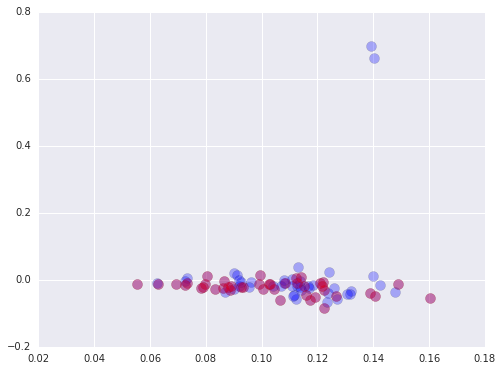

PCAdf shape is 84_12
generating TCRdf only for PNP samples from the matched samples:
loading existing TCR: datasetName=MatchedSamples_ss15000rep3, minNshared=2
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss15000rep3/sharingAnalysis/sharingMatrix_MatchedSamples_ss15000rep3_minNshared2_RA_onlyProductiveTrue
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss15000rep3/PNPmatchedSampleList_sharingAnalysis/sharingMatrix_MatchedSamples_ss15000rep3_minNshared2_RA_onlyProductiveTrue
load completed
checking if RA values are percentage values or real RA values:
the minimal value of the DF is 6.666666666666667e-05
RA values are real RA values, no division is required
Number of analyzed units (seqs/species/genus) is 14909
filename is /net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss15000rep3/PNPmatchedSampleList_sharingAnalysis/sharingMa

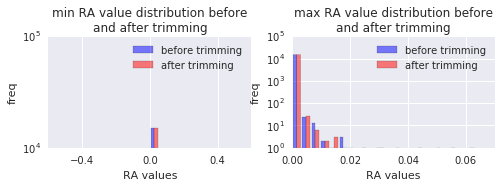

binarizing df...
existing values in df are now:
[0. 1.]
final file name is:
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss15000rep3/PNPmatchedSampleList_sharingAnalysis/sharingMatrix_MatchedSamples_ss15000rep3_minNshared2_RA_onlyProductiveTrue__minSharedT2_OLtrimmed
plotting mean sample distributions for all generated dfs...
0 (42, 14909)
1 (42, 14909)
2 (42, 14909)


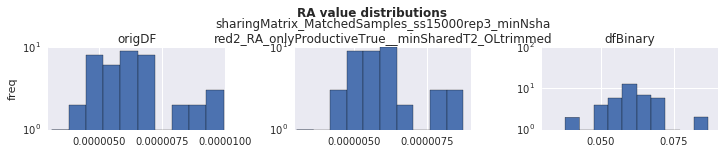

plotting RA value distributions for all generated dfs IN A RANDOM SAMPLE


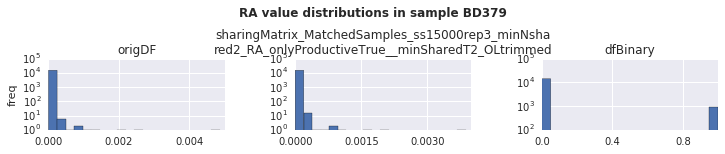

saving df to file...
saving binary df to file
ALL is done!!!
generating TCRdf only for Cardio samples from the matched samples:
loading existing TCR: datasetName=MatchedSamples_ss15000rep3, minNshared=2
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss15000rep3/sharingAnalysis/sharingMatrix_MatchedSamples_ss15000rep3_minNshared2_RA_onlyProductiveTrue
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss15000rep3/CardioMatchedSampleList_sharingAnalysis/sharingMatrix_MatchedSamples_ss15000rep3_minNshared2_RA_onlyProductiveTrue
load completed
checking if RA values are percentage values or real RA values:
the minimal value of the DF is 6.666666666666667e-05
RA values are real RA values, no division is required
Number of analyzed units (seqs/species/genus) is 13461
filename is /net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss15000rep3/

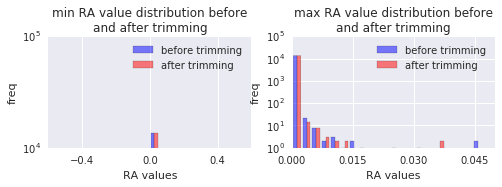

binarizing df...
existing values in df are now:
[0. 1.]
final file name is:
/net/mraid08/export/genie/Lab/Personal/ShaniBAF/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss15000rep3/CardioMatchedSampleList_sharingAnalysis/sharingMatrix_MatchedSamples_ss15000rep3_minNshared2_RA_onlyProductiveTrue__minSharedT2_OLtrimmed
plotting mean sample distributions for all generated dfs...
0 (42, 13461)
1 (42, 13461)
2 (42, 13461)


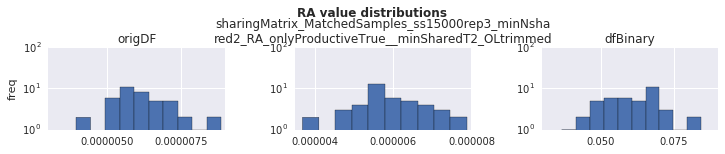

plotting RA value distributions for all generated dfs IN A RANDOM SAMPLE


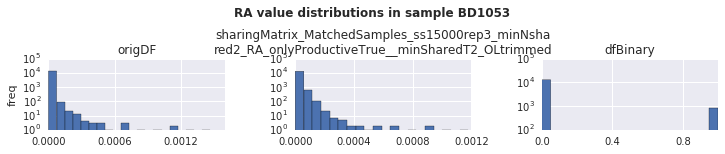

saving df to file...
saving binary df to file
ALL is done!!!
loading seperate minSharedT2 TCRdfs for PNP
PNP TCRdf shape is 42_14909
PNP TCRdf head:
       CAAGTGAYEQYF  CACAALGYTDTQYF  CACSGANVLTF  CAGANTGELFF
BD101           0.0             0.0          0.0          0.0
BD106           0.0             0.0          0.0          0.0
BD142           0.0             0.0          0.0          0.0
BD149           0.0             0.0          0.0          0.0
loading number of unique sequences per sample:
loading uniqueSeqWithCounts....
loading seperate minSharedT2 TCRdfs for Cardio
Cardio TCRdf shape is 42_13461
Cardio TCRdf head:
        CAGRRDTEAFF  CAIGGQETQYF  CAINGGSTDTQYF  CAIPQGGNYGYTF
BD1000          0.0          0.0            0.0            0.0
BD1004          0.0          0.0            0.0            0.0
BD1009          0.0          0.0            1.0            0.0
BD1011          0.0          0.0            0.0            0.0
loading number of unique sequences per sample:
loa

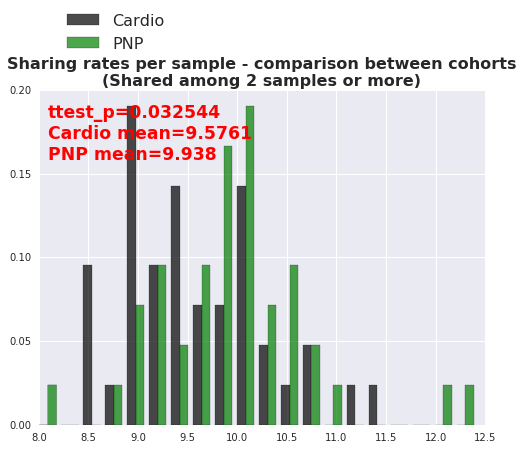

number of sequence shared by 2 or more samples in both cohorts: 3737 (15.1596284126 perc)
number of sequence shared by 2 or more samples only in the PNP cohort: 11185 (45.3734128433 perc)
number of sequence shared by 2 or more samples only in the Cardio cohort: 9729 (39.4669587441 perc)
total=24651
merged public list length length=24651


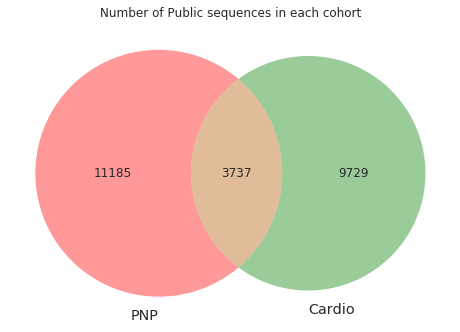

analyzing public sequence identities...
0 AllDB
ThresholdToOther is 0.04, total counts=26187, final threshold for chi square is 1047.48
1 Both
ThresholdToOther is 0.04, total counts=587, final threshold for chi square is 23.48
2 onlyPNP
ThresholdToOther is 0.04, total counts=363, final threshold for chi square is 14.52
3 onlyCardio
ThresholdToOther is 0.04, total counts=312, final threshold for chi square is 12.48
count2        CMV  Celiacdisease  DiabetesType1   EBV   HIV  HomoSapiens  \
onlyPNP      88.0            0.0           20.0  27.0  27.0         30.0   
onlyCardio   89.0            0.0            0.0  14.0  25.0         28.0   
Both        139.0           24.0           27.0  45.0  48.0         50.0   

count2      Influenza  Other  
onlyPNP         118.0   53.0  
onlyCardio      105.0   51.0  
Both            156.0   98.0  
count2       CMV  Celiacdisease  DiabetesType1   EBV   HIV  HomoSapiens  \
onlyPNP     88.0            0.0           20.0  27.0  27.0         30.0   
onl

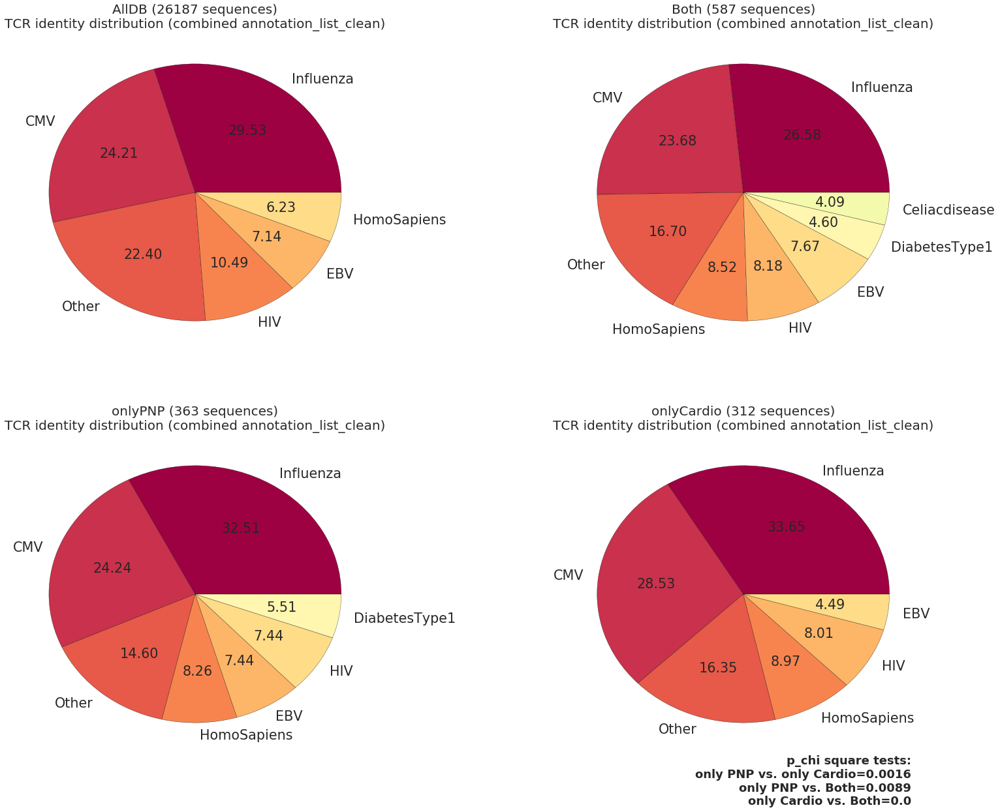

end of function!


In [45]:
ss=15000
repeat=3

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
if not isdir(datasetFolder):
    makedirs(datasetFolder)
PNPListFile='%s/PNP530ss15000rep3_samples_matchedTo_Cardio126ss15000rep3_n42_resByGenderMaleAgeHbA1CSmoking StatusYes_rs3' %datasetFolder
with open(PNPListFile,'rb') as fp:
    PNPmatchedSampleList=pickle.load(fp)

CardioListFile='%s/Cardio126ss15000rep3_samples_matchedTo_PNP530ss15000rep3_n42_resByGenderMaleAgeHbA1CSmoking StatusYes_rs3' %datasetFolder
with open(CardioListFile,'rb') as fp:
    CardioMatchedSampleList=pickle.load(fp)
    
delFolderFirst=False
copySamples=False

compareFeatures=False

genOrigComTCRdf=False
genComTCRdf=False
n_comp=10
percSharedCom=None

compareSharing=True
genSepTCRdf=True
nSharedMin=2
identityFile='%s/TCR CDR3 sequence databases/combined annotation_list_clean_popped.xlsx' %MyPath
identityDF=pd.read_excel(identityFile)
identityDFname='popped'
identityColumnForPie='combined annotation_list_clean' #'Epitopespecies_VDJDB'/'Pathology_McPAS'
ThresholdToOther=0.04
dropnaFromIdentitiesPie=True
RemoveSamplesWithRelative=False

FeatureMeanSummary_all_dataSets=compareTCRforMatchedCohorts(ss,repeat,PNPmatchedSampleList,CardioMatchedSampleList,
                            copySamples,compareFeatures,compareSharing, genSepTCRdf,nSharedMin,delFolderFirst,
                            genOrigComTCRdf,genComTCRdf,n_comp,percSharedCom,identityColumnForPie,dropnaFromIdentitiesPie,
                            ThresholdToOther,identityDF,identityDFname,RemoveSamplesWithRelative)



### run for not-including relatives

In [ ]:
# ss=15000
# repeat=3

# datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)

# PNPListFile='%s/PNP530ss15000rep3_relRemoved_samples_matchedTo_Cardio126ss15000rep3_matchedToRelRemoved_n47_resByGenderMaleAgeGlucose_rs2' %datasetFolder
# with open(PNPListFile,'rb') as fp:
#     PNPmatchedSampleList=pickle.load(fp)

# CardioListFile='%s/Cardio126ss15000rep3_matchedToRelRemoved_samples_matchedTo_PNP530ss15000rep3_relRemoved_n47_resByGenderMaleAgeGlucose_rs2' %datasetFolder
# with open(CardioListFile,'rb') as fp:
#     CardioMatchedSampleList=pickle.load(fp)
    
# delFolderFirst=False
# copySamples=False

# compareFeatures=False

# genOrigComTCRdf=True
# genComTCRdf=True
# n_comp=10
# percSharedCom=None

# compareSharing=True
# genSepTCRdf=True
# nSharedMin=1
# identityFile='%s/TCR CDR3 sequence databases/combined annotation_list_clean_popped.xlsx' %MyPath
# identityDF=pd.read_excel(identityFile)
# identityDFname='popped'
# identityColumnForPie='combined annotation_list_clean' #'Epitopespecies_VDJDB'/'Pathology_McPAS'
# ThresholdToOther=0.02
# dropnaFromIdentitiesPie=True
# RemoveSamplesWithRelative='done'

# FeatureMeanSummary_all_dataSets=compareTCRforMatchedCohorts(ss,repeat,PNPmatchedSampleList,CardioMatchedSampleList,
#                             copySamples,compareFeatures,compareSharing, genSepTCRdf,nSharedMin,delFolderFirst,
#                             genOrigComTCRdf,genComTCRdf,n_comp,percSharedCom,identityColumnForPie,dropnaFromIdentitiesPie,
#                             ThresholdToOther,identityDF,identityDFname,RemoveSamplesWithRelative)



## clean featureDF - remove nanas, constant and fully correlated

1. take feature DF of the relevant ss and repeat
2. run remove correlated
3. explore file
4. delete constant
5. fillna
6. save to file

In [ ]:
#generate and load relevant feature DF:
ss=15000
repeat=3

datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
sampleListName=datasetName


TCRfeatureDF_matched=gen_featureDF_for_MatchedCohorts(ss,repeat,sampleList,sampleListName)

#process feature df:
corrThreshold=1
featureDFfile='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/featureSummaryDFs\
/MatchedSamples_ss%srep%s_MatchedSamples_ss%srep%s_allFeatures' %(MyPath,ss,repeat,ss,repeat,ss,repeat)
featureDF=pd.read_pickle(featureDFfile)
featureDF,featureDFnameAddition=process_featureDF(featureDF,corrThreshold)

newfeatureDFfilePickle=featureDFfile+'_'+featureDFnameAddition
featureDF.to_pickle(newfeatureDFfilePickle)

newfeatureDFfileExcel=featureDFfile+'_'+featureDFnameAddition+'.xlsx'
featureDF.to_excel(newfeatureDFfileExcel)

## predictions:

### get DFs:

In [ ]:
ss=15000
repeat=3
datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
percShared=10
print datasetName


# phenotype df:
print 'getting phenotypeDF...'
f3='%s/TCR_real_data/NewPhenotypicData/PNP530ss%s_phen_new_dummies.xlsx' %(MyPath,ss)
PNP_phen_new_dummies=pd.read_excel(f3).set_index('BD')

f4='%s/TCR_real_data/CardioSamples/phenotypicData/Cardio126ss%s_phen_new_dummies.xlsx' %(MyPath,ss)
Cardio_phen_new_dummies=pd.read_excel(f4).set_index('BD')

all_phen_new_dummies=pd.concat([PNP_phen_new_dummies,Cardio_phen_new_dummies])
matchedSamples_phen_new_dummies=all_phen_new_dummies.loc[sampleList,:]
print 'phenotype DF shape is %s_%s' %(matchedSamples_phen_new_dummies.shape[0],matchedSamples_phen_new_dummies.shape[1])
print matchedSamples_phen_new_dummies.iloc[:20,:4]
# print all_phen_new_dummies.tail()

#TCRdf:
print 'getting TCRdf...'

sharingFolder='%s/%s_sharingAnalysis' %(datasetFolder,datasetName)
TCRdfName='sharingMatrix_MatchedSamples_ss%srep%s_minNshared2_RA_onlyProductiveTrue__percShared%s_OLtrimmed\
_binary' %(ss,repeat, percShared) 
TCRdfFile='%s/%s' %(sharingFolder,TCRdfName )
print TCRdfFile
TCRdf=pd.read_pickle(TCRdfFile)
print 'TCRdf shape is %s_%s' %(TCRdf.shape[0],TCRdf.shape[1])
print TCRdf.iloc[:4,:4]

#Features
print 'getting TCRfeatureDF - wihtout highlt correlated columns...'
featureFilePickle2='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s/featureSummaryDFs\
/MatchedSamples_ss%srep%s_MatchedSamples_ss%srep%s_allFeatures__noCorr_noConsts_nanFilled' %(MyPath,ss,repeat,ss,repeat,ss,repeat)
TCRfeatureDF2=pd.read_pickle(featureFilePickle2)
print 'TCRfeatureDF shape is %s_%s' %(TCRfeatureDF2.shape[0],TCRfeatureDF2.shape[1])
TCRfeatureDF2.iloc[:4,:4]


### classification;

#### old functions:

In [ ]:
#try 2 datasets, many ks, 3 modesl, different pre-selection options

ss=15000
repeat=3
takeOnlyT=True


#(1) prepare phenotype, TCRdf and featureDFs
print 'preparing input DFs'
datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
datasetName='MatchedSamples_ss%srep%s' %(ss,repeat)
sampleFolder='%s/SamplesForAnalysis_corrected' %datasetFolder
sampleList=[f for f in listdir(sampleFolder) if isfile(join(sampleFolder,f))]
sampleList=editSampleNamesList(sampleList)
percShared=10



#(2) predictions:
print 'predictions...'

featureComposition_list=['phenotypesOnly','phenotypes&PCA&TCRfeatures','phenotypes&TCRdf&PCA&TCRfeatures']
for feateureComposition in featureComposition_list:
    XName='%s_%s' %(datasetName,featureComposition)
    if featureComposition=='phenotypesOnly':
        useTCRfeatures=False #True/False
        usePCAdf=False #True/False
        useTCRdf=False #True/False
    elif featureComposition=='phenotypes&PCA&TCRfeatures':
        useTCRfeatures=True #True/False
        usePCAdf=True #True/False
        useTCRdf=False #True/False
    elif featureComposition=='phenotypes&TCRdf&PCA&TCRfeatures':
        useTCRfeatures=True #True/False
        usePCAdf=True #True/False
        useTCRdf=True #True/False

    if featureComposition=='phenotypesOnly':
        kList=[12]
    else:        
        kList=[12,15,100]


    for k in kList:

        modelAndParams_list=[(LogisticRegression,'LogisticRegression',{'C':10,'penalty':'l1'}),
           (lgb.LGBMClassifier,'LGBMClassifier',{'learning_rate': 0.1, 'n_estimators': 1000,'max_depth': 3,'num_threads':2,
        'bagging_fraction':0.5,'bagging_freq':1, 'bagging_seed':3}),
           (XGBClassifier,'XGBClassifier',{'learning_rate': 0.05, 'n_estimators': 100,'max_depth': 6,'num_threads':2,
        'bagging_fraction':0.5,'bagging_freq':1, 'bagging_seed':3})]

        for modelAndParams in modelAndParams_list:
            XName='%s_%s' %(datasetName,featureComposition)

            model=modelAndParams[0]
            modelName=modelAndParams[1]
            model_params=modelAndParams[2]

            if model==LogisticRegression:
                featureSelectionMethod_list=[f_classif,'random']
            else:
                featureSelectionMethod_list=[f_classif,'random','usingModel']
            if featureComposition=='phenotypesOnly':
                featureSelectionMethod_list=[None]
            for featureSelectionMethod in featureSelectionMethod_list:
    #             if featureSelectionMethod==chi2:
    #                 usePCAdf=False #True/False


                print '******k=%s, featureComposition=%s,modelName=%s, featureSelectionMethod=%s*****'\
        %(k,featureComposition,modelName,featureSelectionMethod)

                # (1) general definitions:
                datasetType='PNP_Cardio' #PNP/PNP_Cardio

                #(2) model definitions:
                ResultFolder='%s/TCR_real_data/predictions_280918' %MyPath
                if not isdir(ResultFolder):
                    makedirs(ResultFolder)
                n_splits=10
                useCV=True
                stratifiedCV=True

                #(3) target definition:
                targetDF=pd.DataFrame(index=['BD'+str(x) for x in range(1,1100)])
                targetDF['isCardio']=np.where(targetDF.index.str.replace('BD','').astype(int)>949,1,0)
                targetName='isCardio'
                YName=targetName

                #  (4) feature composition:
                usePhenotype=True #True/False

                # (5) phenotypeDF:
                genPhenotypeDF=False #True/False. no sense for 'True'  if usePhenotype=False
                phenotypeDF=matchedSamples_phen_new_dummies
                phenotypeDFname='septFeatures' #('small','allNum and more- see step #6.2

                # (6) TCRdf:
                datasetFolder='%s/TCR_real_data/PNP530Cardio126Combined/MatchedSamples/ss%srep%s' %(MyPath,ss,repeat)
                datasetNameTCRdf='PNP530Cardio126_ss%srep%s_Matched'  
                TCRdfName='sharingMatrix_PNP530Cardio126_ss%srep%s_Matched_minNshared2_RA_onlyProductiveTrue__percShared10_OLtrimmed_binary'
                TCRdf=TCRdf

                #(7) PCAdf (based on the TCRdf selected)
                n_comp=10 # int or None 
                isSparse=True #True/False

                #(8) TCRfeatures:
                getTCRfeatures=False #True/False. do not use True when useTCRfeatures=False
                TCRfeatureDF=TCRfeatureDF2
                if takeOnlyT:
                    colToUse=[x for x in TCRfeatureDF.columns if '_T' in x]
                    print 'taking only _T features:'
                    TCRfeatureDF=TCRfeatureDF[colToUse]
                    XName=XName+'_onlyT'

                #(9) X and y processing:
                #sampleList to filter, and sampleListName:
                folder='%s/SamplesForAnalysis_corrected' %datasetFolder
                toSaveName='%s_sampleList' %datasetName
                sampleList=gen_sampleList_from_Folder(folder,toSaveName=None)
                sampleListName='%s_sampleList' %datasetName

                filterFeaturesByCorr=None #None or float between 0 and 1
                featureSelectionUsingModel=False # True/False
        #                     C=0.5 #None (if none, C will be set to 0.1) or float between 0 and 1
        #                     filterFeaturesByUnivariate=f_classif    # None/chi2/f_classif/mutual_info_classif
        #             k=150 #None (will be set to 50 / int - defines number of k best))
                scale=False

                predictionPipeline(datasetType,ResultFolder,model,modelName,model_params,n_splits, useCV,
                                      stratifiedCV, XName,usePhenotype,useTCRdf,useTCRfeatures,usePCAdf,
                                      YName,targetDF,
                                      genPhenotypeDF,phenotypeDF,phenotypeDFname,
                                      datasetFolder,datasetNameTCRdf,TCRdf,TCRdfName,n_comp,isSparse,
                                      getTCRfeatures,TCRfeatureDF,sampleListName,sampleList,
                                      filterFeaturesByCorr,featureSelectionMethod,scale,
                                      k,cdate=cdate,overwriteResults=True)



print 'done with everything!!!!'




    

In [ ]:
# modelNameList=['LGBMClassifier','XGBClassifier']
modelNameList=['LogisticRegression','LGBMClassifier','XGBClassifier']
for modelName in modelNameList:
    print modelName
    folder='%s/TCR_real_data/predictions_280918/isCardio_predictions/%s' %(MyPath, modelName)
    dfFolder='%s/predictionDFs' %folder
    results=concat_summarizing_dfs_excel(dfFolder)
    results=results.sort_values(by='roc_auc', ascending=False)
    f1='%s/resultSummary_%s.xlsx' %(folder,cdate)
    results.to_excel(f1)
    results.head(20)

# summarize all prediction results (all cohorts)

## generate summary file per prediction run

In [23]:
# modelNameList=['LGBMClassifier','XGBClassifier']
modelNameList=['LogisticRegression','LGBMClassifier','XGBClassifier']
for modelName in modelNameList:
    print modelName
    folder='%s/TCR_real_data/Predictions/predictions_280918/isCardio_predictions/%s' %(MyPath, modelName)
    dfFolder='%s/predictionDFs' %folder
    results=concat_summarizing_dfs_excel(dfFolder)
    results=results.sort_values(by='roc_auc', ascending=False)
    f1='%s/resultSummary_%s.xlsx' %(folder,cdate)
    results.to_excel(f1)
    results.head(20)

LogisticRegression
number of dfs in directory: 39
the length of df list is 39
LGBMClassifier
number of dfs in directory: 57
the length of df list is 57
XGBClassifier
number of dfs in directory: 57
the length of df list is 57


## average over repeats

In [24]:
## change dates in folder and file names as needed


for modelName in modelNameList:
    print modelName
    set1='280918'
    set2='290918'
    set3='290918_2'
    
    set_list=['280918','290918','290918_2']

    
    backboneCols=['Yname','Xname','modelName','roc_auc','pr_auc_corrected','featureSelectionMethod',
                      'features used','Num features used per split','n_splits','cdate']
    colsTomergeOn=['Yname','Xname','modelName','featureSelectionMethod',
                      'Num features used per split','n_splits']
    for n,set1 in enumerate(set_list):
        f1='%s/TCR_real_data/Predictions/predictions_%s/isCardio_predictions/%s/resultSummary_01102018.xlsx' %(MyPath, set1,modelName)
        df=pd.read_excel(f1)
        print 'number of rows in DF=%s' %len(df)
        if n==0:
            sumDF=df[backboneCols]
        else:
            sumDF=pd.merge(sumDF,df[backboneCols],how='outer',left_on=colsTomergeOn,right_on=colsTomergeOn)
            print 'number of rows after merging is =%s' %len(sumDF)
    for col in sumDF.columns:
        newCol=col.replace('_x','_'+set1)
        newCol=newCol.replace('_y','_'+set2)
        newCol=newCol.replace('_z','_'+set3)
        sumDF=sumDF.rename(columns={col:newCol})
        
    sumDF_ROC_AUC=sumDF[[x for x in sumDF.columns if 'roc_auc' in x]]
    sumDF_pr_auc_corrected=sumDF[[x for x in sumDF.columns if 'pr_auc_corrected' in x]]
    
    sumDF['mean ROC_AUC']=sumDF_ROC_AUC.mean(axis=1)
    sumDF['std ROC_AUC']=sumDF_ROC_AUC.std(axis=1)
    sumDF['count ROC_AUC']=sumDF_ROC_AUC.count(axis=1)
    sumDF['mean pr_auc_corrected']=sumDF_pr_auc_corrected.mean(axis=1)
    sumDF['std pr_auc_corrected']=sumDF_pr_auc_corrected.std(axis=1)
    sumDF['count pr_auc_corrected']=sumDF_pr_auc_corrected.count(axis=1)
    
    f2='%s/TCR_real_data/Predictions/isCardioPredictionSummary_%s_%s.xlsx' %(MyPath,modelName,cdate)
    sumDF.to_excel(f2)

print 'done'
    


LogisticRegression
number of rows in DF=39
number of rows in DF=39
number of rows after merging is =39
number of rows in DF=39
number of rows after merging is =39
LGBMClassifier
number of rows in DF=57
number of rows in DF=57
number of rows after merging is =57
number of rows in DF=57
number of rows after merging is =57
XGBClassifier
number of rows in DF=57
number of rows in DF=57
number of rows after merging is =57
number of rows in DF=57
number of rows after merging is =57
done


# plot results:

results for XGB, old prediction functions, ss5000rep3 and ss12500rep4 were summarized manually in excel

In [27]:
f1='%s/TCR_real_data/Predictions/XGB_summary.xlsx' %MyPath
XGB_summary=pd.read_excel(f1)
XGB_summary

,PhenOnly,Best12Features,Best100Features
ROC_AUC_ss5000rep3,0.773,0.816,0.817
ROC_AUC_ss5000rep4,0.736,0.695,0.715
ROC_AUC_ss9000rep3,0.701,0.721,0.752
ROC_AUC_ss12500rep3,0.692,0.773,0.794
ROC_AUC_ss12500rep4,0.642,0.765,0.770
PR_corr_AUC_ss5000rep3,0.310,0.338,0.331
PR_corr_AUC_ss5000rep4,0.286,0.225,0.238
PR_corr_AUC_ss9000rep3,0.264,0.267,0.281
PR_corr_AUC_ss12500rep3,0.221,0.280,0.302
PR_corr_AUC_ss12500rep4,0.197,0.295,0.285


[u'ROC_AUC_ss5000rep3', u'ROC_AUC_ss9000rep3', u'ROC_AUC_ss12500rep3', u'PR_corr_AUC_ss5000rep3', u'PR_corr_AUC_ss9000rep3', u'PR_corr_AUC_ss12500rep3']
[(0, 0.773), (1, 0.816), (2, 0.817)]
[(0, 0.701), (1, 0.721), (2, 0.752)]
[(0, 0.692), (1, 0.773), (2, 0.794)]
[(0, 0.31), (1, 0.338), (2, 0.331)]
[(0, 0.264), (1, 0.267), (2, 0.281)]
[(0, 0.221), (1, 0.28), (2, 0.302)]


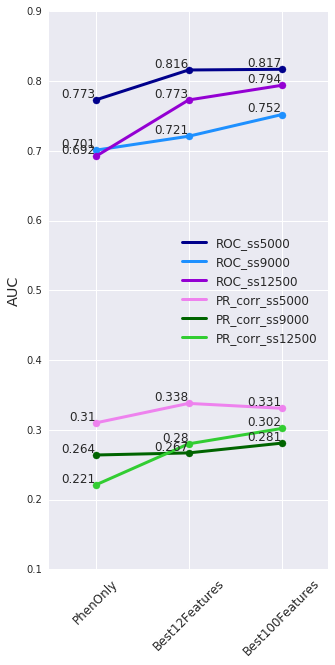

In [30]:
rows=[x for x in XGB_summary.index if 'rep3' in x]
labels=[x.replace('_AUC','') for x in rows]
labels=[x.replace('rep3','') for x in labels]
print rows
XGB_summary_small=XGB_summary.loc[rows,:]

fig1,ax=plt.subplots(figsize=(5,10))
colorList=['darkblue','dodgerblue','darkviolet','violet','darkgreen','limegreen']

for n, row in enumerate(XGB_summary_small.index):
    ax.plot(range(3),XGB_summary_small.loc[row,:].values,label=labels[n],color=colorList[n],lw=3)
    ax.scatter(range(3),XGB_summary_small.loc[row,:].values,label='',color=colorList[n],s=50)
    points=zip(range(3),XGB_summary_small.loc[row,:].values)
    print points
    for point in points:
        ax.annotate(point[1],xy=point,xycoords='data',horizontalalignment='right', verticalalignment='bottom')
    
#     ax.annotate('point offset from data',
#             xy=(2, 1), xycoords='data',
#             xytext=(-15, 25), textcoords='offset points',
#             arrowprops=dict(facecolor='black', shrink=0.05),
#             horizontalalignment='right', verticalalignment='bottom')
ax.set_xticks(range(3))
ax.set_xticklabels(XGB_summary_small.columns, fontsize='medium',rotation=45)
ax.legend(loc='best',fontsize='medium')
ax.set_ylabel('AUC',fontsize='large')
                       #     xticks(range(3),XGB_summary_small.columns)
plt.show()

figfile='%s/TCR_real_data/Predictions/XGB_summary_small_plot' %MyPath
fig1.savefig(figfile,dpi=200)

# define new prediction function:

input:
phenotype DF, featureDF, TCR df:

***preprocessing - should be executed once and not every prediction round*** 
generate PCAdf
merge X components
slice by sampleList-X and y
filter out samples with no target value
impute missing values if needed
scale data if necessary

***choose X components***
phenotype and/or TCRdf and/or features (which feature set) and/or PCA (how many components)
choose phenotype columns
name X according to its components

***divide to train and test (70:30) - x and y - balanced!***

***parameter tuning function***
gridsearch withing CV. report best parameters found - ROC, pr.

**prediction function***
usde the parameters found to predict from train to test and report ROC,PR

***general process structure***
for each data set and model: preprocess,divide to train and test
    for each component type - choose components
        gridsearch within CV in train test (consider repeating several time)
        use the parameters found to predict test data
       




In [ ]:
def preprocessing_for_preds(phenotypeDF,featureDF,TCRdf,y,YName,imputeMissing,scaling,
                            sampleList=None,sampleListName=None,n_comp=None,isSparse=True):
    print 'editing sample names...'
    phenotypeDF=editSampleNames(phenotypeDF)
    featureDF=editSampleNames(featureDF)
    TCRdf=editSampleNames(TCRdf)
    
    print 'generating PCAdf...'
    if n_comp is None:
            n_comp = 10
    print 'generating PCAdf with %s PCs based on TCRdf:' % n_comp
    fig,ax=plt.subplots()
    TCRdf = TCRdf.loc[[str(x) for x in TCRdf.index.tolist() if x in y.index], :]
    PCAdf,ax,p_ttest_PC1,p_ttest_PC2 = PCAfunc(TCRdf,n_comp,isSparse,ax,groupingByDF=y, groupbyName=YName)
    for c in ['BDindex', YName]:
        try:
            PCAdf = PCAdf.drop(c, axis=1)
        except:
            print 'PCAdf doesnt include %s column' % c
    print 'PCAdf shape is %s_%s' % (PCAdf.shape[0], PCAdf.shape[1])
        
    print 'merging X components'
    for n,comp in enumerate([phenotypeDF,featureDF,TCRdf,PCAdf]):
        if n==0:
            X=comp
        else:
            X = pd.merge(X, comp, how='inner', right_index=True, left_index=True)
    print 'X shape is %s_%s' %(X.shape[0],X.shape[1])
           
    if sampleList is not None:
        print 'slicing X by sample list %s' %sampleListName
        X=X.loc[sampleList,:]
        print 'X shape after is %s_%s' %(X.shape[0],X.shape[1])
    
    numericCols=X.select_dtypes(include=[np.number]).columns.tolist()
#     print numericCols
        
    if imputeMissing is not None:
        print "filling nas with column's median"
        for col in numericCols:
            X[col]=X[col].fillna(X[col].median())
            
    if scaling:
        print 'scaling all non-binary features'
        print 'X shape before scaling is  %s_%s' % (X.shape[0], X.shape[1])
        colsToScale = []
        for col in X.columns:
#             print col
            if (col in numericCols) and (X[col].nunique() > 2):
                X[col] = X[col].fillna(X[col].median())
                colsToScale.append(col)
        X[colsToScale] = preprocessing.scale(X[colsToScale])
        print 'X shape after scaling is  %s_%s (shouldnt change!)' % (X.shape[0], X.shape[1])
        
    return X
    
            
